In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nltk
from nltk.tokenize import WordPunctTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
import re

In [2]:
import seaborn as sns
import string as str
import warnings
from textblob import TextBlob 

In [3]:
# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

In [4]:
import logging
import os
import random
import tempfile
import xml.etree.ElementTree as et
import zipfile
from itertools import chain

from smart_open import open

from gensim import utils, matutils
from gensim.models import basemodel
from gensim.models.ldamodel import LdaModel
from gensim.utils import check_output, revdict

logger = logging.getLogger(__name__)

In [5]:
import spacy
#import str() as str

In [6]:
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt

In [7]:
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [8]:
# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [88]:
from wordcloud import WordCloud

In [111]:
from nltk.corpus import opinion_lexicon

In [140]:
import collections
wordcount = {}
word_counter = collections.Counter(wordcount)

In [141]:
from collections import Counter

In [113]:
nltk.download('opinion_lexicon')

[nltk_data] Downloading package opinion_lexicon to
[nltk_data]     /Users/razon/nltk_data...
[nltk_data]   Unzipping corpora/opinion_lexicon.zip.


True

In [120]:
labeledData = pd.read_excel(labeledDataPath)

In [121]:
labelDF= pd.DataFrame()

In [123]:
labelDF = labelDF.append(labeledData)

In [124]:
labelDF.head()

,Tweet,Created At,labeling,cleanedData,weight,VaderSentCleaned,VaderSent
0,"Folks I still suck... no stream tonight, may h...",2019-12-11T23:32:27+00:00,1.0,folk still suck stream tonight may plan sunday...,0,1,1
1,stress from work.. stress at home.. stress bef...,2019-12-11T23:29:48+00:00,1.0,home bed wake,0,2,1
2,"weirdly i'm having the opposite ""problem"" I se...",2019-12-11T23:28:12+00:00,0.0,weirdly opposite problem seem handling better ...,0,0,1
3,I realise I'm tweeting about it loads today bu...,2019-12-11T23:17:01+00:00,1.0,realise tweeting load today top genuinely anxi...,0,1,1
4,My chemo sitch is a little different than this...,2019-12-11T23:00:43+00:00,1.0,chemo sitch little different big chunk inpatie...,1,2,1


In [201]:
for index, row in labelDF.iterrows():
    if row['VaderSentCleaned'] == 0:
        posTweet.append(row['cleanedData'])
    elif row['VaderSentCleaned'] == 1:
        negTweet.append(row['cleanedData'])
    else:
        neutralTweet.append(row['cleanedData'])

In [151]:
def assembleWords(dataList):
    wordList = []
    for sent in dataList:
        for word in sent.__str__().split():
            wordList.append(word)
    return wordList

In [202]:
posWrdList = assembleWords(posTweet)
negWrdList = assembleWords(negTweet)
#neuWrdList = assembleWords(posTweet)

In [203]:
posWrdList[1]

'opposite'

In [204]:
pos_Counter = Counter(posWrdList)
neg_Counter = Counter(negWrdList)
#neu_Counter = Counter(neutralTweet)

In [205]:
pos_most_occur = pos_Counter.most_common(100)
print(pos_most_occur[99])

('two', 37)


In [206]:
neg_most_occur = neg_Counter.most_common(150)
print(neg_most_occur[149])

('kill', 29)


In [9]:
filePath1 = '/Volumes/Works/Development/Python/Shout/newTweets/CleanedDS/Cleanedtweet12.xlsx'
filePath2 = '/Volumes/Works/Development/Python/Shout/newTweets/CleanedDS/Cleanedtweet21.xlsx'
filePath3 = '/Volumes/Works/Development/Python/Shout/newTweets/CleanedDS/Cleanedtweet31.xlsx'
filePath4 = '/Volumes/Works/Development/Python/Shout/newTweets/CleanedDS/Cleanedtweet41.xlsx'
text = 'Text'
loc = 'Location'
date = 'date'
cData = 'cleanedData'
canNotConvert = 'cannot convert'
convert = 'convert'

In [10]:
cols = ['date', 'Text', 'Location', 'cleanedData']

In [11]:
df = pd.DataFrame()

In [12]:
data1 = pd.read_excel(filePath1, header = None, names = cols)
data2 = pd.read_excel(filePath2, header = None, names = cols)
data3 = pd.read_excel(filePath3, header = None, names = cols)
data4 = pd.read_excel(filePath4, header = None, names = cols)

In [13]:
df = df.append(data1).append(data2).append(data3).append(data4)

In [426]:
len(df.values)

1471211

In [427]:
# Convert to list
data = df['cleanedData'].values.tolist()
data = data[2:]
#newData = []
# Remove Emails
data =  [re.sub('\S*@\S*\s?', '', sent.__str__()) for sent in data]

# for sent in data[:1]:
#     print(sent)
#     newSent = re.sub('\S*@\S*\s?', '', sent)
#     newData.append(newSent)

# Remove new line characters
data = [re.sub('\s+', ' ', sent.__str__()) for sent in data]

# Remove distracting single quotes
data = [re.sub("\'", "", sent.__str__()) for sent in data]

data[:1]

['would give headache much productivity taste']

In [419]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/razon/nltk_data...


True

In [420]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [421]:
sid = SentimentIntensityAnalyzer()

In [487]:
vaderValue = []
covidInPos = 0
covidInNeg = 0
covidInNeu = 0
for tweet in data:
    tInSent = tweet.__str__()
    sent = sid.polarity_scores(tInSent)
    vaderValue.append(sent)
    a = tInSent.lower().split()
    if 'covid' in a:
        if sent['compound'] < -0.05:
            covidInNeg += 1
        elif sent['compound'] > 0.05:
            covidInPos += 1
        else:
            covidInNeu += 1

In [486]:
a = 'My  Name is Razon'.lower().split()
print('m' in a)

False


In [449]:
valueMap = {}

for val in vaderValue:
    compVal = valueMap.get(round(val['compound'],3), -1)
    if compVal == -1:
        valueMap[round(val['compound'],3)] = 1
    else:
        valueMap[round(val['compound'],3)] = compVal + 1

In [452]:
len(valueMap.values())

1991

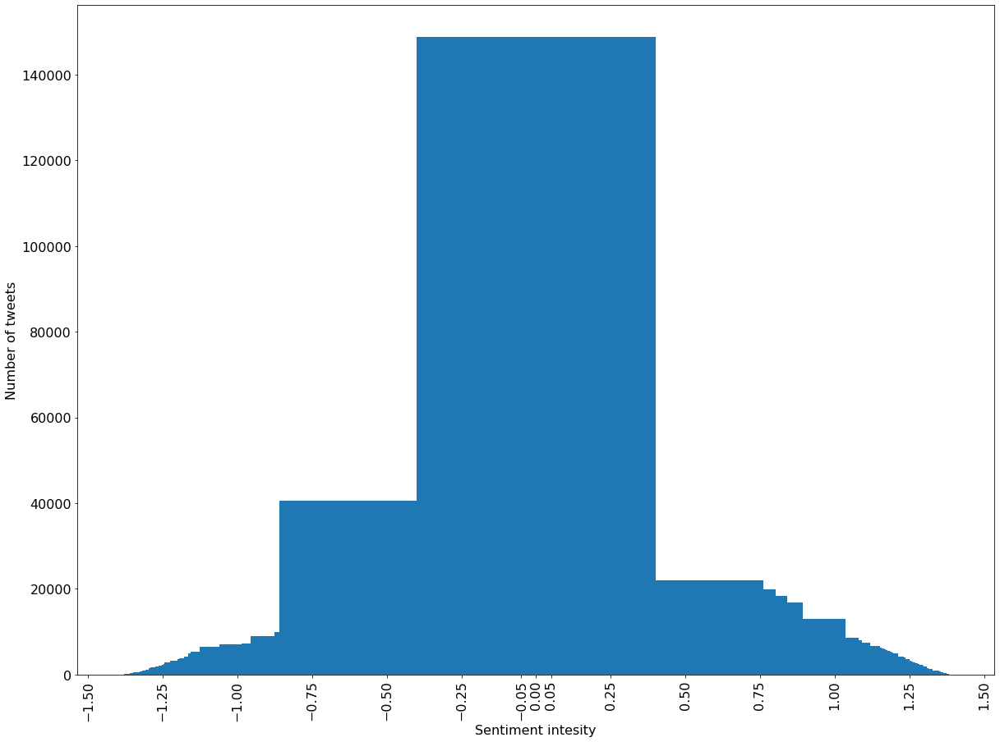

In [551]:
# plt.bar(range(len(valueMap)), list(valueMap.values()), align='center')
# plt.xticks(range(len(valueMap)), [-1.0, -0.75, -0.50, -0.25, 0, 0.25, 0.50, 0.75, 1.0])
# # for python 2.x:
# plt.bar(range(len(D)), D.values(), align='center')  # python 2.x
# plt.xticks(range(len(D)), D.keys())  # in python 2.x

keys = valueMap.keys()
values = valueMap.values()

plt.bar(keys, values)
plt.xticks(rotation='vertical')
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xticks([-1.5, -1.25, -1.0, -0.75, -0.50, -0.25, -0.05, 0, 0.05, 0.25, 0.50, 0.75, 1.0, 1.25, 1.5])

ax.set_ylabel('Number of tweets', size=16)
ax.set_xlabel('Sentiment intesity', size=16)

plt.savefig("OpinionPolarity.jpeg",dpi=1080,bbox_inches='tight')
plt.show()

In [459]:
vaderPosCount = 0
vaderNegCount = 0
vaderNeuCount = 0

for key, value in valueMap.items():
    if key < -0.05:
        vaderNegCount += value
    elif key > 0.05:
        vaderPosCount += value
    else:
        vaderNeuCount += value

In [554]:
print(vaderPosCount, vaderNegCount, vaderNeuCount)

716843 576462 177904


In [555]:
print(covidInPos, covidInNeg, covidInNeu)

9854 9426 1891


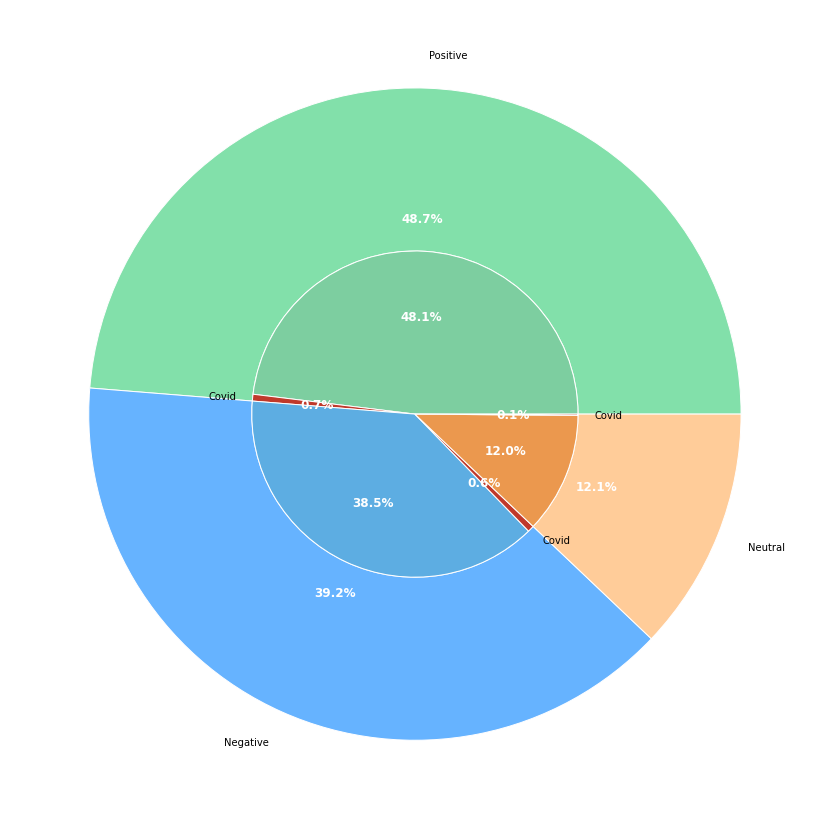

In [545]:
fig, ax = plt.subplots()
cars = ['Positive', 'Negative', 'Neutral']

size = 0.5
vals = np.array([
    [vaderPosCount - covidInPos, covidInPos], 
    [vaderNegCount - covidInNeg, covidInNeg], 
    [vaderNeuCount - covidInNeu, covidInNeu]
])

#cmap = plt.colormaps["tab20d"]
outer_colors = ['#82E0AA', '#66b3ff','#ffcc99']
inner_colors = ['#7DCEA0', '#C0392B', '#5DADE2', '#C0392B', '#EB984E', '#C0392B']



_, _, autotexts = ax.pie(vals.sum(axis=1), radius=1, colors=outer_colors,
       wedgeprops=dict(width=size, edgecolor='w'), labels = cars, autopct='%1.1f%%')
for autotext in autotexts:
    autotext.set_color('white')
plt.setp(autotexts, size=12, weight="bold")
    
_, _, autotexts = ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'), labels = ['', 'Covid', '','Covid', '','Covid'], autopct='%1.1f%%')

ax.set(aspect="equal")
#fig = plt.figure(figsize =(10, 7))
#_, _, autotexts = plt.pie(data, labels = cars, autopct='%1.1f%%')
for autotext in autotexts:
    autotext.set_color('white')

plt.setp(autotexts, size=12, weight="bold")
# show plot
plt.savefig("sentiWithCovid.jpeg",dpi=1080, bbox_inches='tight')
plt.show()

In [462]:
valueInterval = {}
for key, value in valueMap.items():
    if key <= -1.25:
        keyRange = '< -1.25'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -1.25 and key <= -1.0:
        keyRange = '-1.25 to -1.0'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -1.0 and key <= -0.75:
        keyRange = '-1.0 to -0.75'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -0.75 and key <= -0.50:
        keyRange = '-0.75 to -0.50'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -0.50 and key <= -0.25:
        keyRange = '-0.50 to -0.25'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -0.25 and key <= -0.05:
        keyRange = '-0.25 to -0.05'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -0.05 and key <= 0.05:
        keyRange = '-0.05 to 0.05'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 0.05 and key <= 0.25:
        keyRange = '0.05 to 0.25'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 0.25 and key <= 0.50:
        keyRange = '0.25 to 0.50'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 0.50 and key <= 0.75:
        keyRange = '0.50 to 0.75'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 0.75 and key <= 1.0:
        keyRange = '0.75 to 1.0'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 1.0 and key <= 1.25:
        keyRange = '1.0 to 1.25'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 1.25:
        keyRange = '> 1.25'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value

In [463]:
valueInterval

{'-0.05 to 0.05': 177691,
 '-0.50 to -0.25': 180014,
 '0.50 to 0.75': 207439,
 '0.75 to 1.0': 203874,
 '-0.25 to -0.05': 99028,
 '-0.75 to -0.50': 158974,
 '-1.0 to -0.75': 138659,
 '0.05 to 0.25': 105703,
 '0.25 to 0.50': 199827}

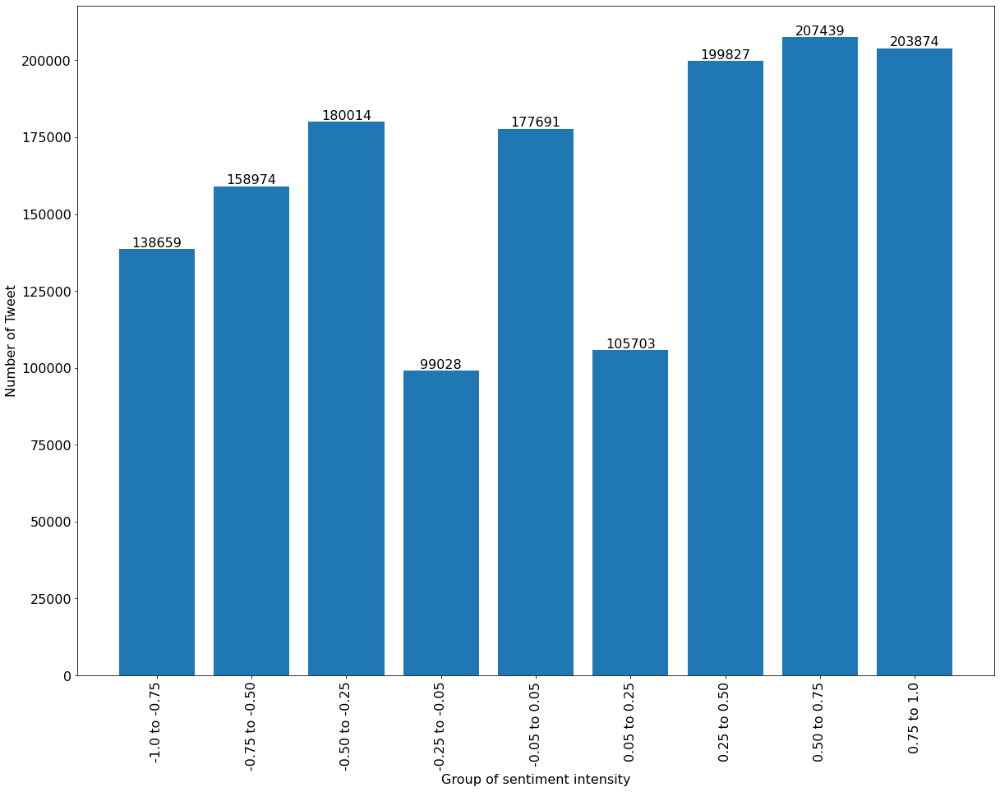

In [552]:
keys = ['-1.0 to -0.75', '-0.75 to -0.50', '-0.50 to -0.25', '-0.25 to -0.05', '-0.05 to 0.05', '0.05 to 0.25', '0.25 to 0.50', '0.50 to 0.75', '0.75 to 1.0']
#valueInterval.keys()
values = [138659, 158974, 180014, 99028, 177691, 105703, 199827, 207439, 203874] #valueInterval.values()

plt.bar(keys, values)
plt.xticks(rotation='vertical')
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=16)
#ax.set_xticks([-1.5, -1.25, -1.0, -0.75, -0.50, -0.25, -0.05, 0, 0.05, 0.25, 0.50, 0.75, 1.0, 1.25, 1.5])
ax.bar_label(ax.containers[0], label_type='edge', fontsize=16)

ax.set_ylabel('Number of Tweet', size=16)
ax.set_xlabel('Group of sentiment intensity', size=16)

#ax.bar_label(ax.containers[0], label_type='edge', color='red', rotation=90, fontsize=7, padding=3)


plt.savefig("ValueIntervalPolarity.jpeg",dpi=1080,bbox_inches='tight')
plt.show()

In [16]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(sentence.__str__(), deacc=True))  # deacc=True removes punctuations

In [17]:
data_words = list(sent_to_words(data))

print(data_words[:1])

[['would', 'give', 'headache', 'much', 'productivity', 'taste']]


In [18]:
# Create Dictionary
id2word = corpora.Dictionary(data_words)

In [19]:
# Create Corpus
texts = data_words

In [20]:
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [21]:
# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1)]]


In [22]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('give', 1),
  ('headache', 1),
  ('much', 1),
  ('productivity', 1),
  ('taste', 1),
  ('would', 1)]]

In [61]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=1000,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [62]:
lda_model.print_topics()

[(0,
  '0.059*"amazing" + 0.050*"thank" + 0.041*"hear" + 0.033*"cut" + 0.032*"happened" + 0.029*"course" + 0.028*"loss" + 0.027*"gone" + 0.027*"calling" + 0.026*"boy"'),
 (1,
  '0.073*"kid" + 0.069*"lose" + 0.064*"school" + 0.048*"probably" + 0.042*"fuck" + 0.038*"high" + 0.033*"teacher" + 0.025*"class" + 0.025*"student" + 0.018*"nobody"'),
 (2,
  '0.046*"year" + 0.042*"done" + 0.038*"day" + 0.034*"still" + 0.028*"bad" + 0.022*"last" + 0.020*"first" + 0.017*"love" + 0.017*"hope" + 0.016*"week"'),
 (3,
  '0.079*"human" + 0.044*"men" + 0.038*"vote" + 0.037*"decent" + 0.031*"definitely" + 0.023*"shot" + 0.022*"continue" + 0.022*"skill" + 0.021*"group" + 0.019*"short"'),
 (4,
  '0.053*"anything" + 0.047*"interview" + 0.043*"child" + 0.038*"idea" + 0.023*"city" + 0.021*"paying" + 0.021*"brexit" + 0.018*"tough" + 0.018*"goal" + 0.016*"bar"'),
 (5,
  '0.047*"getting" + 0.037*"working" + 0.037*"money" + 0.033*"pay" + 0.030*"care" + 0.028*"home" + 0.025*"country" + 0.025*"please" + 0.023*"may" 

In [63]:
lda_model.log_perplexity(corpus)

-14.154148942037523

In [65]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.2532649131051687


In [67]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
vis

/Users/razon/opt/anaconda3/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/s

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
13    -0.343635  0.162098       1        1  31.137655
2     -0.175668 -0.417918       2        1  13.269619
18    -0.254813  0.157175       3        1  12.823434
5     -0.066528 -0.091309       4        1   5.693382
6     -0.013210 -0.030164       5        1   3.822584
19     0.000225 -0.019009       6        1   3.024378
9      0.031877  0.002616       7        1   2.886012
4      0.032424  0.002933       8        1   2.772353
0      0.060720  0.017424       9        1   2.394755
12     0.055433  0.015016      10        1   2.361206
1      0.054936  0.014776      11        1   2.278136
14     0.067617  0.020381      12        1   2.109312
10     0.059756  0.016986      13        1   2.074450
17     0.074627  0.023178      14        1   2.062163
8      0.062271  0.018112      15        1   2.042959
7      0.065391  0.019460      16        1   1.992800
3      0.084051  0.026577      17        1   1.910885
16     0.061952  0.017960      18        1   1.825665
11     0.073257  0.022640      19        1   1.773618
15     0.069318  0.021068      20        1   1.744635, topic_info=            Term          Freq         Total Category  logprob  loglift
1511       awful  1.893959e+06  1.893959e+06  Default  30.0000  30.0000
311          job  3.035480e+05  3.035480e+05  Default  29.0000  29.0000
401       people  3.313100e+05  3.313100e+05  Default  28.0000  28.0000
55          need  1.575200e+05  1.575200e+05  Default  27.0000  27.0000
979          god  8.271500e+04  8.271500e+04  Default  26.0000  26.0000
...          ...           ...           ...      ...      ...      ...
1510    spending  4.072825e+03  4.074240e+03  Topic20  -4.6589   4.0483
2589  university  3.564711e+03  3.566126e+03  Topic20  -4.7922   4.0482
1209      showed  3.515310e+03  3.516725e+03  Topic20  -4.8061   4.0482
4967   continues  3.146179e+03  3.147595e+03  Topic20  -4.9171   4.0482
2278       fully  3.100314e+03  3.101730e+03  Topic20  -4.9317   4.0482

[638 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
4105      7  0.999818     abuse
1893     20  0.999887   account
3021      8  0.999831    action
1342     20  0.999820    actual
617       2  0.999965  actually
...     ...       ...       ...
1857      7  0.999924       wow
268      15  0.999807    writer
2496      4  0.999958     wrong
226       2  0.999990      year
1672      3  0.999981       yes

[616 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[14, 3, 19, 6, 7, 20, 10, 5, 1, 13, 2, 15, 11, 18, 9, 8, 4, 17, 12, 16])

In [95]:
#from LdaMallet import LdaMallet

In [109]:
mallet_path = '/Users/razon/Downloads/mallet-2.0.8/bin/mallet' # update this path
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=20, id2word=id2word)

Mallet LDA: 20 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.29135
<20> LL/token: -11.13737
<30> LL/token: -10.99261
<40> LL/token: -10.85454

0	2.5	meeting awful worker people room time good day zoom make job safe join labor year find thing lot life friend 
1	2.5	meeting worker awful people time year day today make good find back home week school vaccine life board essential check 
2	2.5	meeting awful worker people labor time physical day job good make thought thing year love school today great lot life 
3	2.5	worker awful meeting people time make good day job man physical medical labor woman stop hard victim year give feel 
4	2.5	worker trump poll vote state mask sign put person hand biden leader election early president ballot party signed postal republican 
5	2.5	worker awful meeting people job day time year make back thing migrant factory good life wake labor feel physical guy 
6	2.5	meeting awful worker people time da

<170> LL/token: -9.1542
<180> LL/token: -9.11754
<190> LL/token: -9.08772

0	2.5	time meeting people make place room day back start break give taking full leave stay space person open long move 
1	2.5	worker essential covid home line healthcare pick front vaccine store sick pandemic risk case construction stay order test hospital shift 
2	2.5	awful thing thought made year feel lot left time good boy wanted desk felt lad remember happened worked pretty feeling 
3	2.5	woman people police stop man medium white black stand men law social fact cop fight anti lie officer show called 
4	2.5	worker trump poll state vote mask sign put party biden person election leader president early hand ballot signed postal county 
5	2.5	worker pay job money wage people paid country american union tax government living bill cut cost low million class minimum 
6	2.5	back car walk night food house morning eye door head hand late asked drive bed dog walked pull coffee sleep 
7	2.5	productivity change system pow

<310> LL/token: -8.9201
<320> LL/token: -8.91447
<330> LL/token: -8.90879
<340> LL/token: -8.90366

0	2.5	time people back place meeting make room full give taking long part break start move leave end person space running 
1	2.5	worker essential covid line mask home healthcare pick food case vaccine front store stay sick order risk hospital pandemic open 
2	2.5	year thing made thought good awful left feel wanted started told remember asked feeling back happened pretty worked bit desk 
3	2.5	woman police medium man white black stop stand law men fight lie anti cop country people officer social speak fact 
4	2.5	worker trump poll state vote sign party put biden person leader election president ballot hand early signed postal county republican 
5	2.5	worker pay money wage paid country union government american tax cut bill cost living low million give benefit make end 
6	2.5	car walk head house back eye hand door walked bed dog pull clean street coffee lunch put drive walking hair 
7	2.5	

<450> LL/token: -8.869
<460> LL/token: -8.86739
<470> LL/token: -8.86501
<480> LL/token: -8.86304
<490> LL/token: -8.86076

0	2.5	time people make place back room give full long part taking meeting end break leave thing move person start side 
1	2.5	worker essential covid mask line health healthcare pick home case vaccine food store front stay hospital sick risk pandemic order 
2	2.5	year made thing thought left told good back started remember wanted asked ago found feeling feel worked happened ended gave 
3	2.5	woman police white man black stand law stop men fight country lie anti cop medium officer speak force truth racist 
4	2.5	worker trump poll state vote sign party put biden person leader election president ballot hand signed early postal county republican 
5	2.5	worker pay money wage paid government union american country tax cut bill cost low living give million benefit make minimum 
6	2.5	car walk head eye hand door house walked bed dog pull clean drive coffee back street put 

<600> LL/token: -8.84553
<610> LL/token: -8.84459
<620> LL/token: -8.84318
<630> LL/token: -8.84174
<640> LL/token: -8.84046

0	2.5	time people make place thing room give full part taking long back end break leave move person lot start side 
1	2.5	worker health essential covid care mask line healthcare home pick case vaccine store front hospital stay sick risk pandemic safe 
2	2.5	year made back thought thing told left started month asked remember wanted found ago worked good happened ended gave feeling 
3	2.5	woman police white black man stand law men stop fight country lie anti cop officer medium speak force truth racist 
4	2.5	worker trump poll state vote sign party put person biden leader election president ballot hand signed postal early county republican 
5	2.5	worker pay money wage paid government union country american tax cut bill cost give low million benefit living minimum end 
6	2.5	car head eye hand walk door food house walked dog pull put clean drive coffee street walking

<750> LL/token: -8.83022
<760> LL/token: -8.82951
<770> LL/token: -8.82894
<780> LL/token: -8.82823
<790> LL/token: -8.82759

0	2.5	time people make thing place room give full lot taking part person break end long making leave feel move side 
1	2.5	worker health care essential covid mask line home healthcare case pick vaccine stay store front hospital sick risk safe pandemic 
2	2.5	year back made told thought left month thing started asked remember found wanted ago worked ended gave happened past desk 
3	2.5	woman police white black stand law men man stop fight country anti cop lie officer force speak truth racist war 
4	2.5	worker trump poll state vote sign put party person biden leader election president ballot hand signed postal early republican gop 
5	2.5	worker pay money wage paid government union american tax country give cut bill cost low million living benefit end minimum 
6	2.5	food car head eye hand door walk order drive dog put pull house clean coffee street walking hair win

<910> LL/token: -8.82129
<920> LL/token: -8.8207
<930> LL/token: -8.82073
<940> LL/token: -8.81979

0	2.5	people time make thing place room lot give full feel taking part person making break end leave long move understand 
1	2.5	worker health care essential covid home mask line healthcare case stay vaccine pick store front hospital sick safe risk pandemic 
2	2.5	year back made told thought month left thing started asked found remember wanted ago worked ended happened gave turned past 
3	2.5	woman police white black stand law men man stop country fight anti cop lie officer truth racist war abuse speak 
4	2.5	worker trump poll state vote sign put party person biden leader election president ballot hand signed postal early republican gop 
5	2.5	worker pay money wage paid government union tax american country cut bill cost give low living million benefit end minimum 
6	2.5	food car eye head hand door walk order drive dog house pull clean coffee put street pick walking fast hair 
7	2.5	find

In [113]:
ldamallet.show_topics(formatted=False)

[(2,
  [('year', 0.07996453169464264),
   ('back', 0.048782323586423065),
   ('made', 0.03283808306182208),
   ('told', 0.02634862044789046),
   ('thought', 0.02544954014929682),
   ('month', 0.02247082113251124),
   ('left', 0.021604734606343053),
   ('started', 0.016375221676908483),
   ('asked', 0.016133954716047345),
   ('found', 0.016111271497504846)]),
 (15,
  [('meeting', 0.12572568976700094),
   ('coming', 0.026886194681434914),
   ('news', 0.021800129721099636),
   ('board', 0.02145886344359627),
   ('city', 0.01619019108915831),
   ('town', 0.014514793194631542),
   ('local', 0.013029985531108117),
   ('council', 0.012757571221872974),
   ('tonight', 0.011497280846180711),
   ('plan', 0.011355585491193932)]),
 (5,
  [('worker', 0.13033273116793231),
   ('pay', 0.03129577516742366),
   ('money', 0.025927734327601922),
   ('wage', 0.02097807063099233),
   ('paid', 0.017119487929673813),
   ('government', 0.014251032110203064),
   ('union', 0.01204266087863083),
   ('tax', 0.011

In [25]:
data_lemmatized = data_words

In [116]:
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)


Coherence Score:  0.5124756222372342


In [131]:
model = malletmodel2ldamodel1(ldamallet)

In [130]:
print('\nPerplexity: ', model.log_perplexity(corpus))


Perplexity:  nan


In [26]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        mallet_path = '/Users/razon/Downloads/mallet-2.0.8/bin/mallet' # update this path
        model = LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [31]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=100, step=2)

Mallet LDA: 2 topics, 1 topic bits, 1 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -9.14116
<20> LL/token: -9.12478
<30> LL/token: -9.10855
<40> LL/token: -9.09277

0	25	worker meeting awful people time day make year good job today thing person back labor poll put physical vote week 
1	25	meeting awful worker people time day good year make today job find back great thing check week labor physical life 

<50> LL/token: -9.07582
<60> LL/token: -9.0504
<70> LL/token: -9.00716
<80> LL/token: -8.94232
<90> LL/token: -8.87078

0	25	worker awful people job labor make physical person day time thing social put trump care pay working good back health 
1	25	meeting awful time day today good year find great check week people team love friend school back zoom thing feel 

<100> LL/token: -8.80891
<110> LL/token: -8.7607
<120> LL/token: -8.72385
<130> LL/token: -8.69465
<140> LL/token: -8.67082

0	25	worker awful people job make labor physical social person life worki


0	12.5	awful people job labor physical worker make time good life thing hard day woman lot working shit feel home employee 
1	12.5	meeting check find today time week day zoom long friend year school board great ago love tomorrow meet join group 
2	12.5	worker person trump put people poll essential social care health state vote mask sign hand pay covid government country line 
3	12.5	awful meeting time good year day great team people game back thing today make guy love coming feel lot news 

<100> LL/token: -9.15628
<110> LL/token: -9.06077
<120> LL/token: -8.98358
<130> LL/token: -8.92219
<140> LL/token: -8.87386

0	12.5	people awful job make labor physical life working thing hard time feel home hour lot woman shit day money man 
1	12.5	meeting today find check week school friend zoom day time long night board morning group tomorrow join member room meet 
2	12.5	worker social person care put trump health poll essential pay state vote mask sign covid hand country wage key government 
3

<750> LL/token: -8.57417
<760> LL/token: -8.57392
<770> LL/token: -8.57359
<780> LL/token: -8.57361
<790> LL/token: -8.57345

0	12.5	people time day make job labor physical life feel home working friend hard back hour family woman shit kid told 
1	12.5	meeting today find week check school call zoom team long night start morning board group turn room tomorrow join member 
2	12.5	worker social care put trump pay health poll essential state vote service person mask sign employee company covid key wage 
3	12.5	awful good year great thing love guy made bad hope show time game lot back thought point god big coming 

<800> LL/token: -8.57283
<810> LL/token: -8.57259
<820> LL/token: -8.57255
<830> LL/token: -8.57229
<840> LL/token: -8.57232

0	12.5	people time day make job labor physical life feel back home working friend hard hour family woman shit kid told 
1	12.5	meeting today find week check school call zoom team long night start morning board turn group room tomorrow join member 
2	12.5	w

<300> LL/token: -8.65639
<310> LL/token: -8.65331
<320> LL/token: -8.65055
<330> LL/token: -8.64747
<340> LL/token: -8.64481

0	8.33333	worker social care put trump pay health poll essential state vote person mask sign covid wage hand show line stop 
1	8.33333	day back home hour friend time told night key house left morning pick food called face found stay started girl 
2	8.33333	meeting today find check week school team zoom coming news board group tomorrow join member meet community student room video 
3	8.33333	people time year make thing labor physical life hard lot working love feel woman long family sex child give making 
4	8.33333	business support service set employee company issue high government change problem productivity struggle party public system country deal power level 
5	8.33333	awful good job great guy man bad shit game god hope thought fucking lost lol yeah pretty fuck made play 

<350> LL/token: -8.64254
<360> LL/token: -8.64018
<370> LL/token: -8.63802
<380> LL/tok

<750> LL/token: -8.60615
<760> LL/token: -8.60598
<770> LL/token: -8.60558
<780> LL/token: -8.60539
<790> LL/token: -8.60509

0	8.33333	worker social care put trump pay health poll essential state vote person mask sign covid call wage show hand stop 
1	8.33333	day back home hour told night key morning house pick face food left found girl started asked wait called minute 
2	8.33333	meeting today find check week school zoom team coming news board group tomorrow join member meet community student video room 
3	8.33333	people time make year thing labor physical life love hard feel working lot friend family woman long kid sex child 
4	8.33333	business support service set employee company issue government high change problem country productivity party struggle system deal power level due 
5	8.33333	awful good job great guy man bad shit game god hope fucking lost point yeah pretty thought hate play made 

<800> LL/token: -8.60488
<810> LL/token: -8.60494
<820> LL/token: -8.60443
<830> LL/toke

<180> LL/token: -8.92289
<190> LL/token: -8.89739

0	6.25	day year time back week hour home shit long feel month essential lol ago stay gon fuck fucking covid literally 
1	6.25	meeting find check zoom school today team board group tomorrow join member community student tonight plan meet online miss virtual 
2	6.25	people awful job make thing life lot world social teacher making real lost wrong change end experience feel family understand 
3	6.25	worker trump put poll person state vote mask sign coming news hand party country biden police american leader election president 
4	6.25	meeting time love friend today day morning room night start turn full nice part minute great figure happy amazing fun 
5	6.25	worker care pay health business money employee company wage support working service set paid government pandemic due food productivity struggle 
6	6.25	worker kid woman sex child family key social story face pick girl house man line head back asked car parent 
7	6.25	awful good labor ph

<550> LL/token: -8.71201
<560> LL/token: -8.71077
<570> LL/token: -8.70992
<580> LL/token: -8.70912
<590> LL/token: -8.70816

0	6.25	time day back year week home hour working shit long month essential end call lol fucking full ago stay covid 
1	6.25	meeting find check school zoom today board group tomorrow join member community student plan tonight online virtual team book event 
2	6.25	awful people make job thing lot life feel making real made lost world hate person fact wrong change kind point 
3	6.25	worker trump poll state vote put person mask sign news hand coming country party biden police american leader election president 
4	6.25	meeting love friend today morning turn thought talk room time night found nice happy hope figure video story talking hear 
5	6.25	worker care pay health business money service employee company wage support set paid pandemic due productivity government struggle system healthcare 
6	6.25	worker social family woman kid child sex key line pick house face f


0	6.25	time day back week home year hour working shit end long month call essential worker covid lol fucking full ago 
1	6.25	meeting find check school zoom today board group tomorrow join member community student tonight plan online virtual book event team 
2	6.25	awful people make job thing lot life feel making made real lost bad hate person world fact wrong kind point 
3	6.25	worker trump poll state vote put mask sign person news country coming party biden police american leader election president early 
4	6.25	meeting love friend today thought turn talk room morning night found story nice happy remember hope talking figure video hear 
5	6.25	worker pay health business money service employee company care wage support set paid pandemic due productivity issue struggle system government 
6	6.25	worker social woman kid child family sex key line pick face food house girl told asked teacher man back car 
7	6.25	awful good labor great physical year hard guy team game god man big show pret

<250> LL/token: -8.82117
<260> LL/token: -8.81244
<270> LL/token: -8.80542
<280> LL/token: -8.79849
<290> LL/token: -8.79193

0	5	people make thing feel lot awful making made point give stop person wrong shit time show life stuff ppl reason 
1	5	awful good job great year bad game guy god fucking team lost play pretty hope absolutely fan manager lot hard 
2	5	told back lol gon girl asked morning house called face man head bos phone walk minute call started shit mom 
3	5	meeting coming support find news team set community free read town book plan local productivity important issue learn change today 
4	5	worker day time home week hour care back essential working covid health key line full stay pick month staff healthcare 
5	5	meeting check today find zoom board tomorrow join member group student ago long tonight week meet online miss room virtual 
6	5	worker trump poll put state vote mask sign person hand party biden police leader election president early country call vaccine 
7	5	labor 

<550> LL/token: -8.74167
<560> LL/token: -8.7411
<570> LL/token: -8.74073
<580> LL/token: -8.74017
<590> LL/token: -8.73976

0	5	people make thing feel awful lot time made making shit person point stop give hate fucking wrong fact stuff reason 
1	5	awful good job year great bad game guy god team play lost pretty absolutely fan manager hope player season terrible 
2	5	back told lol face gon morning call girl asked head called minute walk left bos phone house started mom eye 
3	5	meeting coming support news find set community read team free issue plan town local productivity important book change today learn 
4	5	worker day home hour care week health time back essential covid working key line pick stay healthcare staff open case 
5	5	meeting check find today zoom week board tomorrow group join member ago long tonight student online miss virtual room event 
6	5	worker trump poll state vote mask sign put person party biden police leader election president early country hand vaccine call 
7

<850> LL/token: -8.73173
<860> LL/token: -8.73152
<870> LL/token: -8.73116
<880> LL/token: -8.73124
<890> LL/token: -8.73108

0	5	people make thing awful feel time lot shit made making person fucking point stop hate fuck wrong give yeah stuff 
1	5	awful good year great job game guy bad god team play absolutely fan manager lost player hope pretty man season 
2	5	back told lol face gon call girl head morning asked left minute called walk bos phone started late eye house 
3	5	meeting coming support news find community set read free issue team plan town local change important productivity book learn post 
4	5	worker day home hour care health week essential back covid key line working pick stay healthcare staff open case mask 
5	5	meeting check find today zoom week board group tomorrow join member ago long tonight online miss student virtual event forward 
6	5	worker trump poll state vote sign put person party biden police leader election president early country hand call medium ballot 
7	5

<150> LL/token: -9.09734
<160> LL/token: -9.05
<170> LL/token: -9.01106
<180> LL/token: -8.97799
<190> LL/token: -8.95131

0	4.16667	team game back year big time play fan start head run manager awful call player watch top great season win 
1	4.16667	worker social family school woman kid coming child news sex parent house police show teacher town black white case young 
2	4.16667	worker trump put person poll state vote mask sign hand party biden american leader election president early stand union ballot 
3	4.16667	awful time year people feel life thing good thought made hope worked back lost make month bad feeling part left 
4	4.16667	hard shit guy man love god lol fucking make gon fuck story girl yeah give literally ppl talk thing talking 
5	4.16667	meeting find check zoom board tomorrow join member student tonight community group online miss virtual week event email link council 
6	4.16667	worker home care health essential service employee covid line food stay pick healthcare pandemi

<400> LL/token: -8.78481
<410> LL/token: -8.7824
<420> LL/token: -8.77973
<430> LL/token: -8.77755
<440> LL/token: -8.77624

0	4.16667	awful team good great game big play fan manager run year player guy top season side watch win back point 
1	4.16667	worker social family school woman kid coming child news sex parent house show police teacher town white call black mom 
2	4.16667	worker trump put poll person state vote mask sign hand party biden american leader election president stand early union ballot 
3	4.16667	time year make thing life people feel hard month made part end back full place worked thought hope person feeling 
4	4.16667	shit guy lol fucking man face gon fuck god literally girl talking yeah ppl story hard eye hell word talk 
5	4.16667	meeting find check zoom board tomorrow join member student community week tonight group online virtual event miss email link council 
6	4.16667	worker home care health essential service covid employee key line pick stay food staff healthcar

<650> LL/token: -8.75389
<660> LL/token: -8.75286
<670> LL/token: -8.75213
<680> LL/token: -8.75163
<690> LL/token: -8.75112

0	4.16667	awful team good great game big year play guy fan manager run player top season side win point watch playing 
1	4.16667	worker social school family woman kid coming child sex news parent show police house teacher town white black call man 
2	4.16667	worker trump put poll person state vote mask sign hand party biden american leader election president stand union early ballot 
3	4.16667	time make year thing life people feel hard month end part made place back full give worked real working making 
4	4.16667	shit guy lol fucking man face gon fuck literally girl god talking yeah thought ppl eye head word hell imagine 
5	4.16667	meeting find check zoom board tomorrow join member student community tonight week group online virtual event email link today council 
6	4.16667	worker home care health essential service covid key line pick stay food staff healthcare 

<900> LL/token: -8.7444
<910> LL/token: -8.74468
<920> LL/token: -8.74428
<930> LL/token: -8.74419
<940> LL/token: -8.74392

0	4.16667	awful team good great game big year play guy fan manager run player top season win watch point side playing 
1	4.16667	worker social school family woman kid coming child sex news parent show police house teacher man town white black class 
2	4.16667	worker trump put poll person state vote mask sign hand party biden american leader election president stand union early ballot 
3	4.16667	time make year thing life people feel hard month end part give made place full back worked making real working 
4	4.16667	shit guy lol fucking face gon fuck literally girl man god talking thought yeah ppl head eye word imagine hell 
5	4.16667	meeting find check zoom board tomorrow join member community student tonight group online week virtual event email link council free 
6	4.16667	worker home care health essential service covid key line pick stay food staff healthcare p

<150> LL/token: -9.09733
<160> LL/token: -9.05083
<170> LL/token: -9.01484
<180> LL/token: -8.9848
<190> LL/token: -8.96087

0	3.57143	worker home care health essential covid key line stay healthcare pick case vaccine safe food open pandemic front hospital store 
1	3.57143	people awful thing make feel lot person talking life job making hate human understand real feeling kind ppl good time 
2	3.57143	worker pay business job money employee company wage paid productivity struggle government tax union cost cut small living low market 
3	3.57143	awful job team game good play great player lost manager absolutely season terrible lose win fan decision worst bad coach 
4	3.57143	labor day physical hard hour working service life worked time customer mental make body desk lad sleep construction clean tired 
5	3.57143	awful good guy shit fucking lol god gon bad fuck yeah pretty literally give thing bos thought hell sound make 
6	3.57143	back meeting told face girl asked night walk car head eye doo

<400> LL/token: -8.81774
<410> LL/token: -8.81589
<420> LL/token: -8.81316
<430> LL/token: -8.81127
<440> LL/token: -8.80899

0	3.57143	worker home care health essential covid key line stay healthcare case open vaccine pandemic safe hospital sick risk front pick 
1	3.57143	people awful job make thing feel lot person life lost making fact human understand feeling good bad reason kind point 
2	3.57143	worker pay business money employee company wage paid productivity job struggle union tax cut government cost small low market million 
3	3.57143	awful good team game great year play manager player season absolutely terrible win fan top worst decision playing coach bad 
4	3.57143	labor physical hard working day hour time life service worked make customer food mental give body part desk lad work 
5	3.57143	awful guy good shit god lol fucking gon fuck literally yeah bad pretty thing bos give hate talking ppl imagine 
6	3.57143	back face told girl asked mask head walk car put order eye hand doo

<650> LL/token: -8.79092
<660> LL/token: -8.7901
<670> LL/token: -8.7894
<680> LL/token: -8.78883
<690> LL/token: -8.78829

0	3.57143	worker home care health essential covid key line stay healthcare case open pandemic vaccine safe hospital sick public risk front 
1	3.57143	awful people job thing make lot feel good person lost bad fact human making understand hope situation reason lose life 
2	3.57143	worker pay business money employee company wage paid productivity struggle union tax government cut small cost low market million economy 
3	3.57143	awful good team game great year play manager player season terrible win top fan worst absolutely big playing decision coach 
4	3.57143	labor physical hard working time life make service worked hour day customer give mental part full body problem desk move 
5	3.57143	awful guy shit god lol fucking good gon thing fuck literally yeah talking give bos hate ppl imagine stuff made 
6	3.57143	back face girl asked mask walk car order head put eye pick

<900> LL/token: -8.77355
<910> LL/token: -8.77373
<920> LL/token: -8.77356
<930> LL/token: -8.77361
<940> LL/token: -8.77299

0	3.57143	worker home care health essential covid key line stay healthcare case open pandemic vaccine safe public hospital wake sick risk 
1	3.57143	awful people job thing lot feel make good bad person lost fact hope human understand making reason lose pretty situation 
2	3.57143	worker pay business money employee company wage paid productivity struggle union tax cut government cost low small market million economy 
3	3.57143	awful good team great game year play manager player season terrible big top win fan playing run worst coach decision 
4	3.57143	labor physical hard working life make time service worked give customer problem part mental real move world end body desk 
5	3.57143	guy shit god lol fucking awful thing gon fuck literally yeah talking made give imagine bos hate stop ppl stuff 
6	3.57143	back face girl walk car order pick food put store head eye ha

<100> LL/token: -9.63183
<110> LL/token: -9.48531
<120> LL/token: -9.36867
<130> LL/token: -9.27777
<140> LL/token: -9.20621

0	3.125	worker trump poll state vote mask sign person put party biden leader hand election president early american ballot law signed 
1	3.125	meeting start set week figure today plan time report important team find room space client share note process data building 
2	3.125	worker pay money service wage government paid job union country tax cut cost living food company low bill public million 
3	3.125	awful good great team game play fan player watch season win guy playing coach point big firm watching club character 
4	3.125	day back time night love part bring desk morning walk lad house dog sleep bed high coffee nice special water 
5	3.125	meeting find today support community city read local board council book public check member student free great group project video 
6	3.125	labor physical hard working life people problem mental human system make power issue

<300> LL/token: -8.89505
<310> LL/token: -8.89078
<320> LL/token: -8.88573
<330> LL/token: -8.88229
<340> LL/token: -8.87887

0	3.125	trump poll worker state vote sign put party person biden leader election president hand early ballot law american signed postal 
1	3.125	meeting video set read post figure start question room idea team space follow client important note issue find share article 
2	3.125	worker pay money wage government paid company union tax service cut cost country bill business low living market million economy 
3	3.125	awful great team game good play guy fan player big watch season manager win playing coach top year club firm 
4	3.125	day back night food morning walk put house car desk bring lad bed dog sleep clean drive shop break coffee 
5	3.125	meeting support today find board community city public local member council plan group student area book program speak live committee 
6	3.125	labor physical world hard life problem human mental power system working body peo

<500> LL/token: -8.83979
<510> LL/token: -8.83789
<520> LL/token: -8.8368
<530> LL/token: -8.83619
<540> LL/token: -8.83468

0	3.125	trump worker poll state vote sign put party person biden leader election president early hand american ballot law country signed 
1	3.125	meeting video read set question figure post idea start space room find follow answer client share team note article list 
2	3.125	worker pay money wage government paid company business union tax cut cost living low market million bill economy benefit country 
3	3.125	awful great team game good play fan guy player big season manager watch win year playing top coach run firm 
4	3.125	back food walk pick car order put house door desk drive bring lad dog clean street shop place coffee light 
5	3.125	meeting support board today community find public city plan local member council group area student committee future tonight speak program 
6	3.125	labor physical world problem life human mental power hard system body people rea

<700> LL/token: -8.82424
<710> LL/token: -8.82339
<720> LL/token: -8.82283
<730> LL/token: -8.82237
<740> LL/token: -8.82204

0	3.125	trump worker poll state vote sign put person party biden leader election president early hand country american ballot law signed 
1	3.125	meeting video read set question figure post idea room find space call start follow answer book client share note list 
2	3.125	worker pay money wage government paid company business union tax cut cost low living market million economy benefit bill month 
3	3.125	awful great team game good play fan guy big player season manager watch win year top playing coach run club 
4	3.125	back food pick walk car order put house door desk drive store lad bring dog place clean street shop coffee 
5	3.125	meeting support board community public today plan city find local member council group area issue committee future county speak tonight 
6	3.125	labor physical world problem life human mental power people hard system body issue real

<900> LL/token: -8.81658
<910> LL/token: -8.81647
<920> LL/token: -8.81586
<930> LL/token: -8.81606
<940> LL/token: -8.81569

0	3.125	worker trump poll state vote sign put party person biden leader election president country hand american ballot law signed postal 
1	3.125	meeting video read set question figure post idea find room space book call answer follow share client note talk start 
2	3.125	worker pay money wage government paid company business union tax cut cost living low market million bill economy benefit month 
3	3.125	awful great team game good play fan guy big player season manager win watch year top playing coach run club 
4	3.125	food back pick walk car order put house store door desk drive lad dog bring clean street shop coffee light 
5	3.125	meeting support board community public plan city today local member council find group area issue committee county speak future tonight 
6	3.125	labor physical world people problem human life mental power hard system real body issu

<100> LL/token: -9.59621
<110> LL/token: -9.46623
<120> LL/token: -9.36498
<130> LL/token: -9.28522
<140> LL/token: -9.22257

0	2.77778	meeting employee people time struggle city point part make read world great full idea post thing experience question agreement diversity 
1	2.77778	awful good great lot thought show guy thing amazing pretty hope time love felt sound yeah stuff character end people 
2	2.77778	awful game team good play bad manager fan player absolutely season terrible guy job win great coach playing worst lose 
3	2.77778	worker service public give case family issue customer stop desk ready lad set support hold social save firm call standing 
4	2.77778	job worker pay money wage company business paid tax cut cost make living low market million people benefit bill lost 
5	2.77778	make productivity worker system change human people power problem time talking challenging action world thing goal end management idea future 
6	2.77778	meeting day week year school long month pare

<300> LL/token: -8.916
<310> LL/token: -8.91019
<320> LL/token: -8.9049
<330> LL/token: -8.90001
<340> LL/token: -8.89496

0	2.77778	make people point thing read question fact struggle word employee post real tweet world understand part person agree talk idea 
1	2.77778	awful good great lot thing hope show thought guy pretty amazing sound watch stuff story watching bit glad hear wow 
2	2.77778	awful team game play fan manager good player season terrible win absolutely bad top guy playing coach man big club 
3	2.77778	worker social service give public call case stop show customer medium number stand hold desk lad end follow issue account 
4	2.77778	worker job pay money company wage business paid tax employee cut cost low market million benefit economy bill minimum living 
5	2.77778	change productivity system problem world level power future challenging human issue make career process management set action term lead role 
6	2.77778	day meeting year week school hour long kid month today p

<500> LL/token: -8.85556
<510> LL/token: -8.85425
<520> LL/token: -8.85292
<530> LL/token: -8.85185
<540> LL/token: -8.85073

0	2.77778	make thing people point question made fact read word struggle making person tweet post wrong understand agree employee real matter 
1	2.77778	awful good great lot hope thing show pretty thought amazing story sound guy stuff watch hear watching bit hard idea 
2	2.77778	awful team game play fan manager good player season terrible guy win top big playing man coach great run club 
3	2.77778	worker social give service public call show stop case end customer medium number stand desk hold lad follow save account 
4	2.77778	worker pay money business company wage job paid employee tax cut cost low market million benefit economy living bill minimum 
5	2.77778	change productivity system problem level future world issue set challenging power career experience human tip process learn lead role management 
6	2.77778	day meeting year week school hour long kid month t

<700> LL/token: -8.83467
<710> LL/token: -8.83391
<720> LL/token: -8.83346
<730> LL/token: -8.83294
<740> LL/token: -8.83252

0	2.77778	make people thing point made making person question fact word read wrong tweet understand agree reason mind matter real comment 
1	2.77778	good awful great lot hope show story amazing thought thing pretty sound watch hear watching stuff guy interview idea bit 
2	2.77778	awful team game play good fan manager player guy season terrible win top big playing man coach great run club 
3	2.77778	worker social give service call show stop end public customer case medium stand number desk follow lad hold save account 
4	2.77778	worker pay money business employee company wage paid job struggle tax cut cost low market million benefit economy bill minimum 
5	2.77778	productivity change system level future experience problem set issue world challenging career tip process power learn project lead management role 
6	2.77778	day year meeting week school time hour long 

<900> LL/token: -8.82525
<910> LL/token: -8.82495
<920> LL/token: -8.82392
<930> LL/token: -8.82369
<940> LL/token: -8.82302

0	2.77778	make people thing point making made person fact question wrong word read understand tweet agree reason mind matter happen comment 
1	2.77778	good awful great hope story show lot amazing thought thing watch pretty hear sound interview watching idea love big hard 
2	2.77778	awful team game good play fan manager player guy season terrible win top big playing great coach man run club 
3	2.77778	worker social give service call show stop end customer case medium stand number public desk set follow lad save hold 
4	2.77778	worker pay money business employee company wage paid struggle tax cut cost job low market million benefit economy minimum bill 
5	2.77778	productivity system change level experience set future issue challenging career learn project problem tip process world lead role management current 
6	2.77778	day year time week meeting school hour long 

<100> LL/token: -9.68774
<110> LL/token: -9.55115
<120> LL/token: -9.43996
<130> LL/token: -9.35197
<140> LL/token: -9.27959

0	2.5	meeting day friend night morning today hour time minute nice late back walk desk lad hanging bed phone hang sleep 
1	2.5	make feel awful hard people time back day worked thing life working making good give leave move feeling literally sound 
2	2.5	worker home care health essential social covid child family stay healthcare line pandemic key working vaccine safe front store hospital 
3	2.5	labor physical pay money wage business company paid productivity tax cost living low market benefit million working minimum challenging paying 
4	2.5	great team year hard game amazing love play good fan big awful time guy playing coach proud fun happy top 
5	2.5	meeting check find zoom join group virtual book event email online link miss member tomorrow free reach meet learn annual 
6	2.5	call called white black meeting question medium fact point asked woman answer wrong c

<270> LL/token: -8.94347
<280> LL/token: -8.93569
<290> LL/token: -8.92922

0	2.5	day meeting friend hour night today morning back happy late minute desk walk nice room lad hanging shift weekend half 
1	2.5	make hard back time feel working give worked leave move feeling end bos making made body put thing rest needed 
2	2.5	worker home social care health essential family covid child stay healthcare pandemic line key vaccine safe hospital sick risk working 
3	2.5	labor physical pay business money wage company paid productivity tax cost low market million benefit employee minimum challenging paying cut 
4	2.5	great team game big play amazing fan player guy season win top playing coach year hard good chance proud run 
5	2.5	meeting check find zoom join virtual book group event online email link miss free meet reach room learn tomorrow member 
6	2.5	call called point question read medium white black tweet fact phone word made post number twitter answer left speak calling 
7	2.5	meeting comi

<420> LL/token: -8.878
<430> LL/token: -8.87563
<440> LL/token: -8.87276

0	2.5	day meeting today hour friend night morning happy late back desk yesterday half shift weekend walk lad hanging nice bed 
1	2.5	make time hard feel back working give worked end move leave feeling made making bos thing body mind put taking 
2	2.5	worker social home care health essential child covid family healthcare stay key pandemic vaccine safe case hospital sick risk mental 
3	2.5	labor physical pay business money company wage paid productivity employee tax cost low market million benefit minimum cut employer paying 
4	2.5	great team game big play amazing fan player season guy awful top win playing coach run good club field awesome 
5	2.5	meeting check find join zoom virtual book event group online email link miss free meet reach forward learn annual information 
6	2.5	call point question called read medium white black phone tweet post word twitter made number fact answer follow comment calling 
7	2.5	meet

<570> LL/token: -8.8516
<580> LL/token: -8.85049
<590> LL/token: -8.84929

0	2.5	day meeting today hour night morning friend happy back late yesterday desk half walk shift weekend lad hanging home bed 
1	2.5	make hard feel time working give back thing end making made worked move feeling leave part body mind easy taking 
2	2.5	worker social care home health essential covid child healthcare key stay pandemic family case vaccine safe hospital sick risk mental 
3	2.5	labor physical pay business money company wage paid productivity employee tax cost low market million benefit minimum employer cut paying 
4	2.5	great team game awful play amazing big fan player season top win guy playing coach good run club field awesome 
5	2.5	meeting check find join zoom virtual book event group email link online miss free reach meet forward member room annual 
6	2.5	call point read question called medium white phone post tweet black made word number twitter fact story answer follow comment 
7	2.5	meeting c

<710> LL/token: -8.83725
<720> LL/token: -8.83654
<730> LL/token: -8.83545
<740> LL/token: -8.83563

0	2.5	day meeting today hour night morning back happy late friend yesterday half desk walk home break shift weekend lad hanging 
1	2.5	make hard feel time working give thing back making made end move feeling worked part leave body mind easy taking 
2	2.5	worker social care home health essential covid child healthcare key stay pandemic case family vaccine safe hospital sick risk working 
3	2.5	labor physical pay business money employee company wage paid productivity struggle tax cost low market million benefit minimum employer paying 
4	2.5	great team awful game play fan big amazing player season top win playing coach guy good run club field awesome 
5	2.5	meeting check find join zoom virtual book event group email link miss online free meet reach forward member annual information 
6	2.5	call point question read medium white called post phone tweet word made number twitter story fact fol

<850> LL/token: -8.82896
<860> LL/token: -8.82877
<870> LL/token: -8.82858
<880> LL/token: -8.82791
<890> LL/token: -8.82697

0	2.5	day today meeting hour night morning back happy late yesterday half desk break shift home walk weekend lad hanging wake 
1	2.5	make hard feel working thing time give making made end back worked move feeling part leave body mind big easy 
2	2.5	worker social care home health essential covid child key healthcare stay pandemic case vaccine safe family hospital sick risk mental 
3	2.5	labor physical pay business money employee company wage paid productivity struggle tax cost low market million benefit minimum employer cut 
4	2.5	great awful team game play fan player big season amazing top win good playing coach guy run club field football 
5	2.5	meeting check find join zoom virtual book group event miss email link online free reach meet forward member annual information 
6	2.5	call point question read medium white post called phone word tweet made number story

<1000> LL/token: -8.82083

Total time: 18 minutes 6 seconds
Mallet LDA: 22 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.37574
<20> LL/token: -11.22463
<30> LL/token: -11.07167
<40> LL/token: -10.921

0	2.27273	meeting awful worker great check link good people time day team apply zoom today thing love make hard full year 
1	2.27273	meeting awful worker people time day make physical labor good thing back year job today life give great find guy 
2	2.27273	meeting awful worker human people action talking discus time research stopped job good day find labor animal physical make year 
3	2.27273	awful meeting worker labor people physical job time year day good make today lot back working thing find health money 
4	2.27273	worker sex meeting party government girl awful police govt people sir migrant minister congress man story india smile house bjp 
5	2.27273	meeting awful worker check find time people day today week zoom make tea

<150> LL/token: -9.22732
<160> LL/token: -9.17603
<170> LL/token: -9.13357
<180> LL/token: -9.09674
<190> LL/token: -9.06714

0	2.27273	great team awful game play fan manager player season good win watch playing club coach big top chance football year 
1	2.27273	time day hour full feel make feeling back shift end working thing half sleep start give past bit spent taking 
2	2.27273	meeting issue plan change read community public important action report discus future project speak support agreement set committee diversity research 
3	2.27273	labor physical hard working mental problem body human system energy construction emotional forced society power pain type life actual lot 
4	2.27273	worker party police social country government law anti cop officer govt medium security political minister labour sir migrant case china 
5	2.27273	meeting check find join group virtual member event online miss link email zoom book tomorrow annual information reach info detail 
6	2.27273	guy shit lol gon

<300> LL/token: -8.92798
<310> LL/token: -8.92207
<320> LL/token: -8.91736
<330> LL/token: -8.91256
<340> LL/token: -8.90904

0	2.27273	awful great team game play fan manager player good season win playing coach club guy top year football watch sport 
1	2.27273	time day hour week back full month night working start feeling half part morning end past shift feel today rest 
2	2.27273	meeting issue plan public read change community important action report project discus future committee support group agreement speak set follow 
3	2.27273	labor physical hard mental working problem body human energy construction power system society emotional forced pain level actual type world 
4	2.27273	party police country government law anti cop officer control govt political security minister labour sir leader war migrant china congress 
5	2.27273	meeting check find join virtual group event book member link email online zoom miss tomorrow reach annual information forward info 
6	2.27273	guy shit lol fu

<450> LL/token: -8.87954
<460> LL/token: -8.87791
<470> LL/token: -8.87597
<480> LL/token: -8.87395
<490> LL/token: -8.87246

0	2.27273	awful great team game play fan manager player season good win playing coach club guy top football sport final league 
1	2.27273	time day week hour back full night month today morning working start late past half shift rest part end feeling 
2	2.27273	meeting issue plan public read change community action report important project discus future committee group member set agreement support follow 
3	2.27273	labor physical hard mental problem working human body construction energy power system society emotional forced level pain type lack abuse 
4	2.27273	party country police government law anti cop officer govt security political control minister leader labour sir war migrant china congress 
5	2.27273	meeting check find join virtual book event group email link member online zoom miss tomorrow reach annual information forward free 
6	2.27273	guy shit lol f

<600> LL/token: -8.8612
<610> LL/token: -8.8609
<620> LL/token: -8.86017
<630> LL/token: -8.85928
<640> LL/token: -8.85857

0	2.27273	awful team great game play fan player manager season good win playing coach guy club top football sport final league 
1	2.27273	time day week hour today back night full morning month working late start half shift rest past bed couple sleep 
2	2.27273	meeting issue plan public read change report action important future discus project committee group community set member agreement diversity research 
3	2.27273	labor physical hard mental problem human body working power construction energy system society forced emotional pain abuse lack type brain 
4	2.27273	party country police government law anti cop officer govt security political minister control labour leader sir war migrant china congress 
5	2.27273	meeting check find join virtual book event group email link member online zoom tomorrow miss reach forward annual information free 
6	2.27273	guy shit lol

<750> LL/token: -8.85349
<760> LL/token: -8.85282
<770> LL/token: -8.85242
<780> LL/token: -8.85213
<790> LL/token: -8.85221

0	2.27273	awful team great game play fan player manager season good win playing coach guy club top football sport final league 
1	2.27273	time day week hour today morning night back full month working late start half shift rest couple bed sleep wait 
2	2.27273	meeting plan issue public read change report important action future discus committee member set project group community agreement diversity held 
3	2.27273	labor physical hard mental problem human body working construction power energy system society emotional forced pain abuse life lack type 
4	2.27273	party country police government law anti cop officer govt security political leader control minister labour war sir migrant china congress 
5	2.27273	meeting check find join virtual book group event email link member online tomorrow zoom miss reach annual information forward free 
6	2.27273	guy shit lol fu

<900> LL/token: -8.85057
<910> LL/token: -8.85046
<920> LL/token: -8.85039
<930> LL/token: -8.85081
<940> LL/token: -8.85052

0	2.27273	awful team great game play fan player manager season good win playing coach top club guy football sport final league 
1	2.27273	time day week hour today morning night back full month late start working half shift rest bed sleep couple feeling 
2	2.27273	meeting plan issue public read change report action important discus future committee set group project member agreement follow diversity research 
3	2.27273	labor physical hard mental problem human working body power construction energy system society emotional forced abuse pain type lack actual 
4	2.27273	country party police government law anti cop officer govt political security minister labour leader control sir war migrant china congress 
5	2.27273	meeting check find join virtual book event group member email link online tomorrow zoom miss reach free forward annual information 
6	2.27273	guy shit 

<50> LL/token: -10.77156
<60> LL/token: -10.5306
<70> LL/token: -10.25043
<80> LL/token: -10.00294
<90> LL/token: -9.80144

0	2.08333	meeting zoom room student group email find team join tonight tomorrow today meet check space class link send break video 
1	2.08333	meeting week long today year day ago month attend heart positive board expect test covid contact trust staff tomorrow couple 
2	2.08333	awful worker people white time make thing made fast good food racist day shift amazon house point show pick lot 
3	2.08333	awful thing time meeting people good bos man bad back feel interview great make position sick point forget day guy 
4	2.08333	meeting talking human people issue action call talk discus asked time question research stopped stream speak carry worker love plan 
5	2.08333	meeting friend time love fun nice meet today finding met night person hanging great amazing day hang conversation talk people 
6	2.08333	worker sex story girl part high bring people hope make special time a

<200> LL/token: -9.07339
<210> LL/token: -9.0542
<220> LL/token: -9.03762
<230> LL/token: -9.02215
<240> LL/token: -9.00976

0	2.08333	meeting school zoom board room student teacher group class email parent send video team tomorrow meet figure turn online tonight 
1	2.08333	meeting year week long today month day ago time attend heart past positive plan expect couple date trust start found 
2	2.08333	worker people house food stop pick white order put make leave wrong stand fast clean reason making retail mess driver 
3	2.08333	awful good thing feel pretty bad point agree interview sound make fact idea lot yeah wrong made reason completely stuff 
4	2.08333	meeting call question issue talk talking called phone speak public report action important read comment answer follow word voice heard 
5	2.08333	meeting love friend great nice happy hope amazing fun person meet met hang finding hanging miss cool loved enjoy people 
6	2.08333	worker sex girl story make ppl fuck shit part end lol give b

<350> LL/token: -8.93236
<360> LL/token: -8.92767
<370> LL/token: -8.92438
<380> LL/token: -8.92053
<390> LL/token: -8.91765

0	2.08333	meeting school zoom board room student class teacher group email parent send figure meet team turn tomorrow video form online 
1	2.08333	meeting year week long month today time ago day plan start heart past positive back attend expect couple found date 
2	2.08333	worker people pick food house stop white put order stand leave black fast retail clean drive line mess give driver 
3	2.08333	awful good thing feel bad lot pretty point agree sound fact made wrong interview idea make reason stuff hope completely 
4	2.08333	meeting call question read issue phone talk speak report called talking word comment action answer important calling point follow public 
5	2.08333	meeting love friend great nice happy amazing hope fun meet person hang finding met hanging cool super loved miss enjoy 
6	2.08333	worker shit sex lol fuck gon girl guy literally ppl yeah twitter 

<500> LL/token: -8.89236
<510> LL/token: -8.89059
<520> LL/token: -8.88941
<530> LL/token: -8.88832
<540> LL/token: -8.88704

0	2.08333	meeting school zoom board room student class teacher group parent figure email send meet turn team tomorrow college form online 
1	2.08333	meeting year week time long month today ago back start plan heart past positive day attend expect couple date trust 
2	2.08333	worker pick food stop house put white order stand give black leave line end drive fast show retail clean mess 
3	2.08333	awful good thing feel bad lot pretty point made make sound agree wrong fact interview hope making idea stuff reason 
4	2.08333	meeting call question read issue phone speak report word tweet called talk talking comment hear action point calling answer follow 
5	2.08333	meeting love friend great happy nice amazing hope fun meet person hang finding super hanging cool met loved miss enjoy 
6	2.08333	worker shit guy sex lol gon fuck girl fucking literally man ppl yeah shut talk

<650> LL/token: -8.8741
<660> LL/token: -8.87299
<670> LL/token: -8.87212
<680> LL/token: -8.87146
<690> LL/token: -8.87124

0	2.08333	meeting school zoom board room student class teacher group figure parent turn email send meet team tomorrow college form online 
1	2.08333	meeting year week time long month back ago today start plan heart past positive attend day expect couple date short 
2	2.08333	worker pick food house stop put give white order stand black leave end show line drive fast retail customer clean 
3	2.08333	awful good thing feel bad lot make pretty made point wrong making sound agree interview hope fact idea stuff feeling 
4	2.08333	meeting call question read phone issue speak tweet word report medium talk hear point post called calling number comment action 
5	2.08333	meeting love friend great happy amazing nice hope fun meet hang finding super person hanging cool met loved miss enjoy 
6	2.08333	shit guy worker sex lol fucking gon fuck girl man literally yeah ppl talking 

<800> LL/token: -8.86288
<810> LL/token: -8.8627
<820> LL/token: -8.86243
<830> LL/token: -8.8622
<840> LL/token: -8.86173

0	2.08333	meeting school zoom board room student class teacher parent group figure send meet turn high email team college form middle 
1	2.08333	meeting year week time long month back ago today start plan heart past positive attend expect couple date short trust 
2	2.08333	worker pick food put house stop white give order customer stand leave end black line drive show fast retail clean 
3	2.08333	awful good thing feel bad lot make made pretty point making wrong sound agree interview hope stuff feeling decision idea 
4	2.08333	meeting call question read phone issue word speak tweet report medium post point talk hear calling called comment action number 
5	2.08333	meeting love friend great happy hope amazing nice fun meet hang finding super person hanging cool met loved enjoy miss 
6	2.08333	shit guy sex lol fucking worker gon man fuck girl literally ppl yeah talking

<950> LL/token: -8.85922
<960> LL/token: -8.85934
<970> LL/token: -8.85889
<980> LL/token: -8.85864
<990> LL/token: -8.85839

0	2.08333	meeting school zoom board room student class teacher parent group figure meet turn high team college send middle email form 
1	2.08333	meeting year week time long month back ago start today plan heart past positive attend expect couple trust date short 
2	2.08333	worker service pick food house put white customer order store give stand line leave drive show stop end fast clean 
3	2.08333	awful good feel thing bad lot make pretty made point wrong making sound agree hope interview feeling stuff idea decision 
4	2.08333	meeting call question read phone issue word tweet medium speak report talk point post hear calling comment number answer action 
5	2.08333	meeting love friend great happy amazing hope nice fun meet hang super finding hanging person met cool loved forward enjoy 
6	2.08333	shit guy sex lol fucking gon man fuck girl worker literally ppl yeah t

<100> LL/token: -9.68953
<110> LL/token: -9.55433
<120> LL/token: -9.45093
<130> LL/token: -9.37054
<140> LL/token: -9.30654

0	1.92308	worker health care support vaccine public service set community system staff safety risk covid pandemic issue case agreement education mental 
1	1.92308	country awful medium fact government power deal stand anti lie party control world policy political labour war matter china truth 
2	1.92308	make time thing people feel point making meeting idea good world person awful sense life give tweet part change end 
3	1.92308	meeting asked question told dream time called answer wanted person started interview race loud found bos back thought today bet 
4	1.92308	awful team game good play great player manager season fan win playing coach top club year football half bad point 
5	1.92308	back meeting day morning night today late friend time door bed walk sleep woke yesterday looked started leave inside bag 
6	1.92308	awful good year thing time pretty real life big

<250> LL/token: -9.03575
<260> LL/token: -9.02585
<270> LL/token: -9.01684
<280> LL/token: -9.00895
<290> LL/token: -9.00138

0	1.92308	worker health support service care public set vaccine community staff issue system safety step important agreement training diversity mental free 
1	1.92308	country power government stand party medium fact lie anti deal union american control policy political labour war history truth world 
2	1.92308	make people thing feel making time point made person give understand kind happen change decision matter sense stuff choice part 
3	1.92308	told meeting called asked question wanted bos thought started left back made found happened dream remember gave interview ended answer 
4	1.92308	awful team game great play player season fan manager win good playing coach top club football run sport league ball 
5	1.92308	day back hour today morning night late walk door bed sleep dog half early woke yesterday walking waiting minute ready 
6	1.92308	year time good life e

<400> LL/token: -8.94605
<410> LL/token: -8.94193
<420> LL/token: -8.93925
<430> LL/token: -8.93601
<440> LL/token: -8.93278

0	1.92308	worker health support service care set public community staff issue free safety system step training important agreement diversity site follow 
1	1.92308	country government stand union power party lie medium anti deal control american policy fact political labour war history china truth 
2	1.92308	make people thing feel making point made person wrong understand give happen decision matter kind fact sense reason choice stuff 
3	1.92308	told called asked back left thought started wanted found question bos made remember meeting ended happened dream gave felt interview 
4	1.92308	awful team game play great player season win fan manager playing coach top club football sport big league guy run 
5	1.92308	day hour back today morning night late walk door shift half bed dog sleep waiting minute early break ready woke 
6	1.92308	year time life end real month bac

<550> LL/token: -8.91801
<560> LL/token: -8.91606
<570> LL/token: -8.91556
<580> LL/token: -8.91466
<590> LL/token: -8.91383

0	1.92308	worker health support service care set community staff public issue free safety social system step training agreement important diversity follow 
1	1.92308	country government stand union power party medium deal anti lie american control policy political labour war fact history china truth 
2	1.92308	make people thing making feel point made person wrong understand give kind fact matter decision reason happen sense choice stuff 
3	1.92308	told thought called back asked left found started wanted bos question made remember ended happened dream gave felt turned walked 
4	1.92308	awful team game play great player season win fan playing coach manager top club football sport guy league big ball 
5	1.92308	day hour today back night morning late door walk shift half bed dog minute waiting sleep break wake early ready 
6	1.92308	year life end time back real month

<700> LL/token: -8.90357
<710> LL/token: -8.90311
<720> LL/token: -8.90272
<730> LL/token: -8.90224
<740> LL/token: -8.90252

0	1.92308	worker health support care service set community staff social public free issue safety system step training agreement important diversity site 
1	1.92308	country union government power stand party medium anti deal lie american control policy labour war political history china truth fact 
2	1.92308	people make thing making feel point made person wrong understand fact give decision kind happen reason matter choice sense stuff 
3	1.92308	told thought called back found asked left started wanted bos made question remember ended happened turned felt dream gave guy 
4	1.92308	awful team game play great player season win fan manager playing coach top club football sport league guy played ball 
5	1.92308	day hour today back night morning late wait door walk half shift minute bed dog sleep waiting wake break early 
6	1.92308	year life end back real month world g

<850> LL/token: -8.89857
<860> LL/token: -8.89854
<870> LL/token: -8.8978
<880> LL/token: -8.89729
<890> LL/token: -8.89697

0	1.92308	worker health support service care set social community staff free public issue safety system step training agreement diversity site follow 
1	1.92308	country union government stand power party medium american anti deal lie control policy labour political war history truth china fact 
2	1.92308	people make thing making point made feel person wrong understand fact decision reason matter kind happen agree choice problem sense 
3	1.92308	told thought called asked left back found started wanted bos made question remember ended happened guy felt turned gave dream 
4	1.92308	awful team game play great player season win fan playing coach manager top club football guy sport league big ball 
5	1.92308	day hour today back morning night week wait late door half walk shift minute waiting bed dog break sleep wake 
6	1.92308	year life end back real month world place 

<1000> LL/token: -8.89447

Total time: 13 minutes 9 seconds
Mallet LDA: 28 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.59089
<20> LL/token: -11.39615
<30> LL/token: -11.21906
<40> LL/token: -11.05036

0	1.78571	meeting zoom check join virtual find room link discus event annual action register email session interested member talking miss research 
1	1.78571	worker trump poll vote state mask sign hand put biden person election leader early ballot president signed postal republican gop 
2	1.78571	meeting worker awful time people good labor productivity day physical make life year thing challenging social working feel today back 
3	1.78571	awful worker meeting people time day good year back apply make today great job week thing lot essential feel score 
4	1.78571	awful meeting worker people job time labor physical make good pay war day journalist hard thing year great back image 
5	1.78571	awful worker meeting market wage peo

<150> LL/token: -9.26529
<160> LL/token: -9.22258
<170> LL/token: -9.18673
<180> LL/token: -9.15569
<190> LL/token: -9.12969

0	1.78571	meeting find check zoom join member event email link virtual annual information miss interested info detail online register tomorrow discus 
1	1.78571	worker trump poll vote mask sign state biden election person put president ballot hand early signed postal leader wear county 
2	1.78571	time working home productivity full stay challenging life part tip level business important management end focus change process spend step 
3	1.78571	good awful great hope back year made time pretty desk interview lad glad apply thing luck guy sound move big 
4	1.78571	awful job bad feel lost absolutely lot terrible lose people worst worse hate quit losing sad fired horrible sound poor 
5	1.78571	pay money business wage company worker paid tax cost low market bill million benefit minimum employer paying cut economy living 
6	1.78571	meeting today coming news town tonigh

<300> LL/token: -8.994
<310> LL/token: -8.98847
<320> LL/token: -8.984
<330> LL/token: -8.98079
<340> LL/token: -8.97664

0	1.78571	meeting find zoom check join member email link event virtual annual miss information interested info detail register online march session 
1	1.78571	worker trump poll vote mask sign state biden put person election ballot hand early signed postal president leader wear county 
2	1.78571	time productivity business working part change challenging important career level tip set process experience system step management role learn lead 
3	1.78571	good awful great hope thing pretty lot sound nice interview desk lad made back glad bit feeling guy idea apply 
4	1.78571	awful job bad lost feel absolutely terrible lose people lot worse worst quit losing poor fired sad horrible loss situation 
5	1.78571	pay money wage company business worker paid tax cost low market bill benefit million minimum employer paying economy cut average 
6	1.78571	meeting today coming news t

<450> LL/token: -8.94589
<460> LL/token: -8.94355
<470> LL/token: -8.94183
<480> LL/token: -8.94045
<490> LL/token: -8.93921

0	1.78571	meeting find check zoom join member email link event virtual miss annual information interested info detail register march session online 
1	1.78571	worker trump poll vote mask sign state put biden person election ballot hand signed early postal leader wear president county 
2	1.78571	business productivity change set system level working challenging experience tip problem process important career step role learn management issue opportunity 
3	1.78571	awful good thing great hope lot pretty sound bad nice interview desk feel idea lad guy glad bit yeah feeling 
4	1.78571	awful job people bad lost absolutely feel terrible lose worse worst lot poor quit losing fired sad horrible situation loss 
5	1.78571	pay money wage company business paid worker tax cost low market benefit bill million minimum employer paying economy cut average 
6	1.78571	meeting today 

<600> LL/token: -8.92887
<610> LL/token: -8.92916
<620> LL/token: -8.92867
<630> LL/token: -8.92804
<640> LL/token: -8.92708

0	1.78571	meeting find check zoom join member email link event virtual miss annual information interested info detail register march session tomorrow 
1	1.78571	worker poll vote mask sign trump put state person biden election hand ballot early signed postal leader wear county republican 
2	1.78571	business productivity change set system level challenging problem tip process learn role issue experience opportunity management important career goal step 
3	1.78571	awful good thing great hope lot pretty feel bad sound nice interview desk idea lad yeah stuff feeling glad wow 
4	1.78571	awful job people lost bad absolutely terrible lose lot worse worst poor quit losing feel fired sad situation horrible deal 
5	1.78571	pay money wage company worker business paid tax cost low market benefit million bill minimum employer economy paying cut average 
6	1.78571	meeting toda

<750> LL/token: -8.92037
<760> LL/token: -8.91966
<770> LL/token: -8.91957
<780> LL/token: -8.91913
<790> LL/token: -8.91876

0	1.78571	meeting find zoom check join member email link event miss virtual annual information interested info detail register march session tomorrow 
1	1.78571	worker poll vote mask sign put person state biden election hand ballot early signed postal leader county republican gop paper 
2	1.78571	business productivity change system set level challenging tip process learn role problem management career important goal opportunity experience lead issue 
3	1.78571	awful good thing lot hope great feel bad pretty sound nice interview desk idea yeah lad stuff feeling bit glad 
4	1.78571	awful job people lost bad absolutely terrible lose worst worse lot poor quit losing fired deal sad horrible situation loss 
5	1.78571	pay money wage worker company business paid tax cost low market benefit bill minimum million employer economy paying cut average 
6	1.78571	meeting today

<900> LL/token: -8.91609
<910> LL/token: -8.91587
<920> LL/token: -8.91485
<930> LL/token: -8.91509
<940> LL/token: -8.91444

0	1.78571	meeting find zoom check join member email link event miss virtual annual information interested info detail register march session agenda 
1	1.78571	worker poll vote mask sign put person state biden election hand ballot early signed postal leader county republican gop paper 
2	1.78571	productivity business change set system challenging level tip process learn role management problem opportunity issue goal lead career important experience 
3	1.78571	awful good thing lot great hope feel bad pretty sound nice interview desk idea stuff feeling yeah lad wow bit 
4	1.78571	awful job people lost absolutely bad terrible lose lot worst worse poor quit losing fired sad situation deal horrible loss 
5	1.78571	pay money wage worker company business paid tax cost low market benefit bill minimum million employer cut economy paying average 
6	1.78571	meeting today co

<40> LL/token: -11.09767

0	1.66667	awful worker meeting people time good day job thing year feel back make today great week friend coming love town 
1	1.66667	worker meeting awful people time day job make year back life social good today world thing week working hard show 
2	1.66667	worker wage pay awful tax minimum job people paid meeting time cost sick living thought low salary average income hour 
3	1.66667	meeting awful worker people council time city good check day make year labor today physical great thing back find give 
4	1.66667	meeting worker awful zoom time people sir day good friend thing today check class find love log hai team online 
5	1.66667	worker awful meeting labor physical people act woman job child farm bank time day protection death good make american thing 
6	1.66667	meeting awful worker people time stream day today good find check make border tomorrow tonight love game thing great year 
7	1.66667	meeting awful worker people time conversation day productivity c

<100> LL/token: -9.73368
<110> LL/token: -9.59107
<120> LL/token: -9.48052
<130> LL/token: -9.39357
<140> LL/token: -9.32425

0	1.66667	feel awful feeling eye thing face good hand head cry felt dog yeah back hair bit pretty hurt people honestly 
1	1.66667	people awful thing medium make real world tweet lie person twitter god fact question truth account wrong press read life 
2	1.66667	pay money worker wage paid tax cost bill low million market living benefit minimum cut company economy paying american average 
3	1.66667	meeting board community city plan public member council local issue find report committee held question agenda county area project district 
4	1.66667	meeting turn loud sir call phone migrant today control message omg zoom bos camera freaking late pls missed till laughing 
5	1.66667	worker child set union system law support family case construction key act protect death site protection farm history water american 
6	1.66667	meeting friend love meet people fun hope nice 

<200> LL/token: -9.10907
<210> LL/token: -9.09094
<220> LL/token: -9.07548
<230> LL/token: -9.0612
<240> LL/token: -9.04945

0	1.66667	feel face feeling eye head hand bit back cry yeah dog felt hair imagine hurt made bad gon fine good 
1	1.66667	people awful question real medium tweet stop twitter fact lie person answer word read thing account truth calling post comment 
2	1.66667	pay money wage worker paid tax cost bill low market million company benefit minimum cut economy paying living average price 
3	1.66667	meeting board community city member public plan council find local committee tonight issue county report area agenda group held district 
4	1.66667	meeting call turn message loud sir control phone send pas app request migrant freaking pls till start song found zone 
5	1.66667	worker set support union law system stand construction child power step case rule act protect site protection water building fire 
6	1.66667	meeting friend love meet people fun nice hang met hope forward 

<300> LL/token: -9.00159
<310> LL/token: -8.99581
<320> LL/token: -8.99015
<330> LL/token: -8.98596
<340> LL/token: -8.98228

0	1.66667	face feel back head feeling hand eye bit cry dog felt hair imagine fine yeah hurt moment hell thought looked 
1	1.66667	awful question medium people tweet stop fact word read twitter lie post answer account real calling truth comment person true 
2	1.66667	pay money wage paid tax worker cost bill low market million benefit company minimum economy paying cut living average american 
3	1.66667	meeting board community city public member council plan find local tonight committee area county agenda issue check held group report 
4	1.66667	meeting call message turn loud sir control pas send start app song request freaking pls sold till zone falling laughing 
5	1.66667	worker set support union stand law system power construction step rule act protect site fire building water protection safety pro 
6	1.66667	meeting friend love meet nice fun person people met 

<400> LL/token: -8.96344
<410> LL/token: -8.96131
<420> LL/token: -8.95845
<430> LL/token: -8.95694
<440> LL/token: -8.95538

0	1.66667	face back head feeling hand eye bit dog cry feel hair walk felt put moment hurt looked side red fine 
1	1.66667	awful question medium tweet fact stop word read twitter lie post answer people calling account truth comment stupid press fake 
2	1.66667	pay money wage paid tax cost worker company low bill market million benefit minimum economy cut paying american average price 
3	1.66667	meeting board community city public member council find local plan tonight committee area county agenda check issue report held district 
4	1.66667	meeting call message loud turn sir control pas send song fan app request freaking sold pls zone hear falling start 
5	1.66667	worker set support union stand law power system step construction rule building act fire protect site water protection safety fight 
6	1.66667	meeting friend love meet nice fun person people group met ha

<500> LL/token: -8.94678
<510> LL/token: -8.94556
<520> LL/token: -8.94463
<530> LL/token: -8.94478
<540> LL/token: -8.94369

0	1.66667	face back head hand eye feeling bit dog walk hair cry felt moment red put hurt looked hit foot pull 
1	1.66667	awful question medium tweet fact stop word twitter lie read answer post account calling comment truth wrong people stupid press 
2	1.66667	pay money wage paid tax cost low bill company market million benefit minimum worker economy cut paying living average price 
3	1.66667	meeting board community city public member council find local tonight plan area committee county check agenda live held district report 
4	1.66667	meeting message call control loud sir turn hear fan song pas send imagine app request freaking sold photo pls omg 
5	1.66667	worker set support stand union law power system step construction rule building fire act protect site water safety fight protection 
6	1.66667	meeting friend love meet nice fun person people group met hang h

<600> LL/token: -8.93781
<610> LL/token: -8.93698
<620> LL/token: -8.93551
<630> LL/token: -8.93486
<640> LL/token: -8.9337

0	1.66667	face head back hand eye dog bit feeling walk hair wearing red cry put looked pull hurt felt moment foot 
1	1.66667	awful question medium tweet fact stop word twitter lie read answer account post calling comment truth stupid press fake article 
2	1.66667	pay money wage paid tax cost low market company million bill benefit minimum cut economy paying worker average price living 
3	1.66667	meeting board community city public member council find local tonight area committee plan county check agenda live district report update 
4	1.66667	meeting message hear loud sir control turn photo imagine fan call send song pas picture freaking voice request sold app 
5	1.66667	worker set support stand union power law system step construction rule fire building protect act site fight safety protection amazon 
6	1.66667	meeting friend love meet nice person fun people grou

<700> LL/token: -8.92972
<710> LL/token: -8.92939
<720> LL/token: -8.92894
<730> LL/token: -8.92805
<740> LL/token: -8.92802

0	1.66667	face head back hand eye dog walk bit wearing hair feeling put red looked pull foot moment hurt cry walking 
1	1.66667	awful question medium tweet fact word stop lie twitter answer read account calling comment truth post racist stupid press fake 
2	1.66667	pay money wage paid tax cost low company market million bill benefit minimum economy cut paying average price living rate 
3	1.66667	meeting board community city public member council find local tonight area committee county plan check agenda project live report district 
4	1.66667	meeting message loud control hear sir photo imagine turn fan call picture cry send song pas voice freaking sold pic 
5	1.66667	worker set support stand union law power system step construction rule fire building protect site act fight anti safety protection 
6	1.66667	meeting friend love meet nice fun person people group me

<800> LL/token: -8.92568
<810> LL/token: -8.92561
<820> LL/token: -8.92533
<830> LL/token: -8.92431
<840> LL/token: -8.92425

0	1.66667	face head hand back eye dog walk wearing bit hair put red looked pull foot cat feeling moment walking hurt 
1	1.66667	awful question medium fact tweet word stop lie twitter answer account read calling post truth comment racist opinion press stupid 
2	1.66667	pay money wage paid tax cost low market million bill company benefit minimum cut economy paying average price business living 
3	1.66667	meeting board community city public member council find local tonight area committee county plan check agenda project live district report 
4	1.66667	meeting message hear control loud turn sir photo imagine cry fan send song picture pas voice call heard request sold 
5	1.66667	worker set support stand union power law system construction step rule anti protect fire building fight site act safety protection 
6	1.66667	meeting friend love meet nice person fun group g

<900> LL/token: -8.92138
<910> LL/token: -8.92097
<920> LL/token: -8.92117
<930> LL/token: -8.92143
<940> LL/token: -8.9205

0	1.66667	face head hand eye back dog walk hair bit red put looked foot pull cat walking inside moment shirt tear 
1	1.66667	awful question medium fact tweet lie twitter word stop answer account calling truth comment post racist press opinion fake stupid 
2	1.66667	pay money wage paid tax cost company low market million bill benefit minimum cut economy paying average price living business 
3	1.66667	meeting board community city public member council find local tonight area committee county plan agenda check project held live district 
4	1.66667	meeting hear message control loud cry photo sir imagine turn fan voice send song pas heard sold call freaking picture 
5	1.66667	worker support set stand union power law system construction step rule anti fire building protect safety fight site act protection 
6	1.66667	meeting friend love meet nice person fun people great

<1000> LL/token: -8.91926

Total time: 20 minutes 27 seconds
Mallet LDA: 32 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.70447
<20> LL/token: -11.48459
<30> LL/token: -11.30204
<40> LL/token: -11.12913

0	1.5625	employee worker struggle awful company meeting people employer business time job bank make bee pay day hire package year warehouse 
1	1.5625	meeting long ago attend heart positive expect trust year time dream outcome scream ethic awful gut tested housing week murderer 
2	1.5625	meeting worker awful part high special bring people agreement diversity finish quality time deserves year funny day make good hall 
3	1.5625	meeting worker awful time people day school today good make great year social week key thing working home game back 
4	1.5625	meeting awful worker time people good year day back today find great check thing week job make call team family 
5	1.5625	meeting check event zoom email annual link find register

<100> LL/token: -9.73719
<110> LL/token: -9.60233
<120> LL/token: -9.49359
<130> LL/token: -9.40704
<140> LL/token: -9.33945

0	1.5625	pay money worker employee company wage business paid struggle tax bill cost low benefit minimum employer paying living million small 
1	1.5625	meeting year week long month ago time day attend heart positive dream expect test couple term trust short result outcome 
2	1.5625	coming meeting news part town bring tonight hall show special local worker tomorrow high agreement diversity hold race today funny 
3	1.5625	school kid family child parent student social class board teacher year mom dad young college high working son education mother 
4	1.5625	meeting great today plan forward week project year community career future opportunity move big live start day time shout starting 
5	1.5625	meeting check join find event email virtual link member tomorrow annual information interested detail register monday info march session committee 
6	1.5625	awful job peopl

<200> LL/token: -9.12514
<210> LL/token: -9.10539
<220> LL/token: -9.08876
<230> LL/token: -9.07317
<240> LL/token: -9.0609

0	1.5625	pay money worker employee wage company paid business struggle tax cost low bill benefit minimum employer paying million average price 
1	1.5625	year meeting week long month ago time day attend heart past positive expect test couple trust term short dream outcome 
2	1.5625	meeting coming news town part tonight bring show hall big worker special local tomorrow high today agreement run post diversity 
3	1.5625	school kid family child social parent student class board teacher year mom young dad high college son middle education mother 
4	1.5625	meeting today great plan community forward week project move start future career staff opportunity shout big starting idea moving building 
5	1.5625	meeting check join find event member link email virtual tomorrow annual information interested detail register miss march committee session info 
6	1.5625	awful job lot p

<300> LL/token: -9.01081
<310> LL/token: -9.00635
<320> LL/token: -9.00194
<330> LL/token: -8.99722
<340> LL/token: -8.99298

0	1.5625	pay money worker employee wage company paid business struggle tax cost low bill benefit minimum employer million paying average price 
1	1.5625	year meeting week long month ago heart past positive time expect attend couple day term trust short test end outcome 
2	1.5625	meeting coming news town big worker part tonight show bring hall today special tomorrow run high important local agreement hold 
3	1.5625	school kid family child social parent student board class teacher mom young year dad high college son boy middle education 
4	1.5625	meeting today great plan forward community week staff project start future move career opportunity shout find starting colleague idea partner 
5	1.5625	meeting check join find event member link virtual email tomorrow annual information interested detail register miss march committee session agenda 
6	1.5625	awful job lost

<400> LL/token: -8.97435
<410> LL/token: -8.9722
<420> LL/token: -8.96996
<430> LL/token: -8.96903
<440> LL/token: -8.96707

0	1.5625	pay worker money employee wage company paid business struggle tax cost low bill benefit minimum employer million paying average price 
1	1.5625	year meeting week long month ago heart past time positive expect end attend couple term trust back short found start 
2	1.5625	meeting coming news big town part worker tonight show bring today hall run tomorrow special hold agreement high important local 
3	1.5625	school kid family child social parent student board class teacher mom young dad high college son year boy middle education 
4	1.5625	meeting today great plan forward community staff project find future week career start opportunity shout move colleague starting partner idea 
5	1.5625	meeting check join find event member link virtual email tomorrow annual information interested detail register miss march session monday committee 
6	1.5625	awful job lost 

<500> LL/token: -8.95748
<510> LL/token: -8.95647
<520> LL/token: -8.95543
<530> LL/token: -8.95479
<540> LL/token: -8.95361

0	1.5625	pay worker money employee wage company paid business struggle tax cost low bill benefit minimum million employer paying average cut 
1	1.5625	year meeting long month week ago time heart past back positive end expect attend couple term trust short found finally 
2	1.5625	meeting coming news big town part worker tonight bring show today hall run special tomorrow hold important agreement high diversity 
3	1.5625	school family kid child social parent student board class teacher mom young dad high college son boy middle education mother 
4	1.5625	meeting today great plan forward find staff project community future start career week opportunity shout move colleague experience partner idea 
5	1.5625	meeting check join find event member link virtual email annual information tomorrow miss interested detail register monday march session committee 
6	1.5625	awful 

<600> LL/token: -8.94928
<610> LL/token: -8.94926
<620> LL/token: -8.94857
<630> LL/token: -8.94766
<640> LL/token: -8.94673

0	1.5625	pay money worker employee wage company paid business struggle tax cost low bill benefit minimum employer million paying average cut 
1	1.5625	year meeting long month week ago time back heart past positive end expect attend couple term trust short found finally 
2	1.5625	meeting coming news big town part worker tonight show bring today hall run special tomorrow hold important agreement live high 
3	1.5625	school kid family child social parent student board class teacher mom young dad high college son middle boy education mother 
4	1.5625	meeting today plan great forward find staff project future community start week career shout opportunity colleague partner move important idea 
5	1.5625	meeting check join find event member link virtual annual information tomorrow email interested detail miss register committee march session monday 
6	1.5625	awful job lo

<700> LL/token: -8.94469
<710> LL/token: -8.94488
<720> LL/token: -8.94458
<730> LL/token: -8.94439
<740> LL/token: -8.94374

0	1.5625	pay money worker employee wage company paid business struggle tax cost bill low benefit minimum employer million paying cut average 
1	1.5625	year meeting long month week ago time back heart past end positive expect attend couple term trust short found started 
2	1.5625	meeting coming news big town part worker tonight show bring hall today run special hold tomorrow high agreement diversity give 
3	1.5625	school kid family child social parent student board class teacher mom young dad high college son middle boy education mother 
4	1.5625	meeting today plan great find forward staff week project future start community career shout important opportunity colleague partner ahead carry 
5	1.5625	meeting check join find event member link virtual annual information tomorrow miss interested detail email register committee march session monday 
6	1.5625	awful job 

<800> LL/token: -8.94196
<810> LL/token: -8.94097
<820> LL/token: -8.94082
<830> LL/token: -8.9406
<840> LL/token: -8.94014

0	1.5625	pay money worker employee wage company paid business struggle tax cost low bill benefit minimum million employer paying cut average 
1	1.5625	year meeting long month week ago time heart past end positive back expect attend couple term trust short found finally 
2	1.5625	meeting coming news big town part tonight worker bring today show hall run special tomorrow hold agreement give diversity high 
3	1.5625	school kid family child social parent student board class teacher mom young dad high college son boy middle education mother 
4	1.5625	meeting today plan great find forward staff week project future community start shout important career colleague opportunity discus partner idea 
5	1.5625	meeting check find join member event link virtual annual information interested detail miss tomorrow register email committee march session agenda 
6	1.5625	awful job l

<900> LL/token: -8.93939
<910> LL/token: -8.93873
<920> LL/token: -8.93893
<930> LL/token: -8.93932
<940> LL/token: -8.93881

0	1.5625	pay money worker employee wage company paid business struggle tax cost low bill benefit minimum million employer paying cut average 
1	1.5625	year meeting long month time ago week end heart past back positive expect couple attend term trust short worked started 
2	1.5625	meeting coming news big town part tonight worker bring today show hall run special hold tomorrow give agreement high diversity 
3	1.5625	school kid family child social parent student board class teacher mom young dad high college boy son middle education mother 
4	1.5625	meeting today plan great find forward staff week future project start community important shout colleague career opportunity discus partner idea 
5	1.5625	meeting check find join member event link virtual annual information miss tomorrow interested detail register email committee march session info 
6	1.5625	awful job l

<1000> LL/token: -8.93763

Total time: 21 minutes 10 seconds
Mallet LDA: 34 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.75982
<20> LL/token: -11.53307
<30> LL/token: -11.34734
<40> LL/token: -11.17878

0	1.47059	awful meeting worker people time good job year make today great love day labor thing lot back week council physical 
1	1.47059	meeting worker awful check time find virtual annual people productivity school week year challenging today student back team make great 
2	1.47059	meeting long ago attend heart positive expect special year trust test book bring free member high link outcome scream part 
3	1.47059	meeting worker awful people time check day find zoom make today taliban school good afghanistan week point social thing call 
4	1.47059	awful meeting worker people job good time day year make thing great friend feel game hard today made lot physical 
5	1.47059	meeting worker labor awful physical amazon people tim

<100> LL/token: -9.77628
<110> LL/token: -9.63813
<120> LL/token: -9.52795
<130> LL/token: -9.43869
<140> LL/token: -9.36771

0	1.47059	awful good job lot people bad thing year terrible pretty sound hope quit lost absolutely interview horrible feel great sad 
1	1.47059	meeting check find join virtual event email link online zoom annual information tomorrow miss group interested info register detail march 
2	1.47059	meeting week year long month ago book free attend heart positive staff expect special test trust bring find couple part 
3	1.47059	meeting country president security official china press report war held national secret gov government crisis deal governor hold holding statement 
4	1.47059	good feel hard awful thing made year make life end great felt time person thought luck kind pretty feeling glad 
5	1.47059	labor physical hard working body mental human emotional forced pain amazon society energy problem actual abuse amount type built production 
6	1.47059	community city sup

<200> LL/token: -9.14054
<210> LL/token: -9.12133
<220> LL/token: -9.10458
<230> LL/token: -9.08989
<240> LL/token: -9.07718

0	1.47059	awful good bad thing pretty lot sound terrible interview quit job yeah hope suck fired absolutely horrible wow luck worse 
1	1.47059	meeting check find join virtual event email link online annual miss information zoom interested info register detail march tomorrow session 
2	1.47059	year meeting week long month ago book attend heart positive past expect special test trust free staff part couple term 
3	1.47059	country president government meeting american state security official war deal hold china america press control crisis world national secret gov 
4	1.47059	feel hard thing life good made make feeling person hope kind felt thought end give happy bit real time glad 
5	1.47059	labor physical body hard mental working human emotional forced pain society amazon abuse amount system problem production power condition built 
6	1.47059	community support ci

<300> LL/token: -9.02353
<310> LL/token: -9.01762
<320> LL/token: -9.01168
<330> LL/token: -9.00658
<340> LL/token: -9.00198

0	1.47059	awful good bad thing pretty sound lot hope yeah interview quit terrible feel suck wow luck fired worse stuff hate 
1	1.47059	meeting check find join virtual event email link online zoom annual information miss interested info register tomorrow march detail fill 
2	1.47059	year meeting week long month ago time book attend heart past positive expect special couple part trust term bring short 
3	1.47059	country president government american state security official america war world deal china crisis press hold secret national gov governor control 
4	1.47059	feel hard life thing person feeling made kind thought hope felt dream make real give happy end good bit time 
5	1.47059	labor physical body mental hard human emotional forced working pain society abuse amazon power system amount production energy built actual 
6	1.47059	community support city local are

<400> LL/token: -8.98188
<410> LL/token: -8.97923
<420> LL/token: -8.97715
<430> LL/token: -8.97523
<440> LL/token: -8.97331

0	1.47059	awful good bad thing pretty sound feel lot hope interview hate yeah quit terrible suck wow luck stuff honestly worse 
1	1.47059	meeting check find join virtual event email link online zoom annual information miss interested info tomorrow register march detail fill 
2	1.47059	year meeting week long month time ago attend heart past positive book expect special couple part term trust started short 
3	1.47059	trump country president american government state security america official war china biden press deal secret world governor crisis gov policy 
4	1.47059	hard feel life person thing thought feeling kind hope give dream felt made real happy love end make imagine anxiety 
5	1.47059	labor physical body mental human hard emotional forced pain society working abuse power system amount energy production amazon built problem 
6	1.47059	support community city

<500> LL/token: -8.96398
<510> LL/token: -8.9628
<520> LL/token: -8.9609
<530> LL/token: -8.95922
<540> LL/token: -8.95907

0	1.47059	awful good bad thing pretty sound feel hope lot hate yeah interview quit terrible wow great suck stuff luck honestly 
1	1.47059	meeting check find join virtual event email link online zoom annual information miss interested info register tomorrow march detail session 
2	1.47059	year meeting long week month time ago heart past positive book expect attend part special couple term trust short bring 
3	1.47059	trump country president american government america security state biden official war china secret press deal governor policy world gov crisis 
4	1.47059	hard feel life person thing thought kind feeling dream give hope felt made happy love real time imagine end true 
5	1.47059	labor physical body mental human hard emotional forced pain society power abuse working system problem amount energy production built actual 
6	1.47059	support community city loc

<600> LL/token: -8.95366
<610> LL/token: -8.95302
<620> LL/token: -8.95194
<630> LL/token: -8.95178
<640> LL/token: -8.9519

0	1.47059	awful good bad thing pretty feel sound hope lot hate yeah great interview quit terrible wow suck luck honestly stuff 
1	1.47059	meeting check find join virtual event email link online zoom annual information miss interested info register march detail tomorrow session 
2	1.47059	year meeting long week month time ago heart past positive part expect attend couple special term trust started short finally 
3	1.47059	trump country president american government america biden security state war china official secret deal governor policy gov minister press world 
4	1.47059	hard feel life person thing thought feeling kind hope give dream made felt love happy real imagine end proud anxiety 
5	1.47059	labor physical body mental human hard emotional forced pain society power working abuse system energy production amount actual built problem 
6	1.47059	support commun

<700> LL/token: -8.94933
<710> LL/token: -8.94874
<720> LL/token: -8.94757
<730> LL/token: -8.9467
<740> LL/token: -8.94611

0	1.47059	awful good bad thing pretty feel sound hope great hate lot yeah interview quit terrible wow stuff suck luck honestly 
1	1.47059	meeting check find join virtual event email link online zoom miss annual information interested info register march detail tomorrow reach 
2	1.47059	year meeting week long month time ago heart past positive part expect attend special couple term trust started short finally 
3	1.47059	trump country president american biden government america security state joe war china secret policy deal governor official minister gov press 
4	1.47059	hard feel life person thought feeling kind thing hope give dream made felt happy love imagine amazing proud moment anxiety 
5	1.47059	labor physical body mental human emotional forced hard pain society power abuse working system energy amount production built actual problem 
6	1.47059	support comm

<800> LL/token: -8.94513
<810> LL/token: -8.94472
<820> LL/token: -8.94468
<830> LL/token: -8.94333
<840> LL/token: -8.94313

0	1.47059	awful good bad thing pretty feel sound great hope hate lot yeah interview quit terrible wow stuff suck honestly luck 
1	1.47059	meeting check find join virtual event email link online miss zoom annual information interested info register march tomorrow detail reach 
2	1.47059	year meeting week long month time ago heart past positive expect attend part special couple term trust short finally started 
3	1.47059	trump country president american biden america government security joe state war china policy deal secret governor official minister world gov 
4	1.47059	hard feel person life thought feeling hope kind thing give made dream love felt happy proud amazing boy imagine moment 
5	1.47059	labor physical body mental human emotional hard forced pain power society abuse working system amount energy built actual production problem 
6	1.47059	support communi

<900> LL/token: -8.9424
<910> LL/token: -8.9419
<920> LL/token: -8.94166
<930> LL/token: -8.94171
<940> LL/token: -8.9413

0	1.47059	awful good bad thing pretty feel sound hope great hate lot yeah terrible quit interview wow stuff honestly suck luck 
1	1.47059	meeting check find join virtual event email link online zoom miss annual information interested info register march reach detail tomorrow 
2	1.47059	year meeting week long month time ago heart past positive expect attend special couple part term finally started short trust 
3	1.47059	trump country president american biden government america security state joe war china deal secret policy governor gov minister official obama 
4	1.47059	hard feel person life thought feeling kind give thing hope love dream felt happy proud boy amazing made imagine moment 
5	1.47059	labor physical body mental human emotional forced hard power pain society working abuse system energy amount problem production brain actual 
6	1.47059	support community 

<1000> LL/token: -8.9412

Total time: 14 minutes 35 seconds
Mallet LDA: 36 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.81045
<20> LL/token: -11.59364
<30> LL/token: -11.39244
<40> LL/token: -11.19674

0	1.38889	awful worker meeting people pay job ceo labor year union time physical find make good working day average today life 
1	1.38889	awful meeting worker people firm frustrating time good make day thing back job year great today life game feel find 
2	1.38889	awful worker people meeting job market housing tax time money unemployment youth make physical year good day pay thing labor 
3	1.38889	worker awful meeting people essential day time back thing social make care good year home today healthcare feel job life 
4	1.38889	meeting worker awful time day people today good back thing week make dan call great year bos move feel find 
5	1.38889	worker trump poll vote mask sign state biden election person hand early put leade

<100> LL/token: -9.75634
<110> LL/token: -9.62657
<120> LL/token: -9.52285
<130> LL/token: -9.44074
<140> LL/token: -9.37536

0	1.38889	people make awful world life real problem class making thing understand lot middle reason end working person difference point fact 
1	1.38889	awful good bad feel thing terrible absolutely pretty worse worst firm deal frustrating horrible sad feeling agree blame sound make 
2	1.38889	awful job people lot lost lose market money losing blue million housing poor thousand economy trade stock pandemic sell collar 
3	1.38889	worker care health essential covid mask healthcare line vaccine hospital sick front risk pandemic wear doctor virus patient medical wearing 
4	1.38889	meeting call zoom today time minute phone bos turn start morning lunch day break figure internet min busy bee kicked 
5	1.38889	trump poll vote sign worker biden state election person president put ballot signed hand postal early leader republican gop paper 
6	1.38889	woman man white black 

<200> LL/token: -9.16657
<210> LL/token: -9.14754
<220> LL/token: -9.13089
<230> LL/token: -9.11647
<240> LL/token: -9.1045

0	1.38889	people world thing real make life problem person understand making point lot reason kind idea wrong living end country agree 
1	1.38889	awful feel bad thing good absolutely terrible worst interview worse feeling firm quit sad frustrating situation pretty horrible sound agree 
2	1.38889	awful job people lot lost lose market losing deal poor housing pandemic million trade money thousand blue country economy fed 
3	1.38889	worker care health essential covid mask healthcare vaccine hospital sick risk wear pandemic line doctor virus patient medical wearing nurse 
4	1.38889	meeting call zoom minute today time phone turn figure start lunch kicked min online internet camera bee missed client break 
5	1.38889	trump poll vote worker sign biden election state person put ballot president signed postal leader hand early republican gop paper 
6	1.38889	woman man whit

<300> LL/token: -9.05271
<310> LL/token: -9.0464
<320> LL/token: -9.04096
<330> LL/token: -9.0357
<340> LL/token: -9.03054

0	1.38889	people thing world real person problem lot understand make life reason making kind idea wrong point live mind agree actual 
1	1.38889	awful feel bad thing absolutely terrible worst interview feeling worse good quit hate firm situation sad frustrating horrible honestly agree 
2	1.38889	awful job people lot lost lose market deal losing country poor loss housing pandemic million economy trade blue thousand american 
3	1.38889	worker care health essential covid mask healthcare vaccine hospital sick risk wear case doctor virus pandemic medical patient wearing nurse 
4	1.38889	meeting call zoom minute phone turn time figure today start kicked lunch min online internet camera bee client missed kick 
5	1.38889	trump poll vote worker sign biden election state person put ballot signed president postal leader hand republican gop paper early 
6	1.38889	woman man whi

<400> LL/token: -9.00942
<410> LL/token: -9.00568
<420> LL/token: -9.00314
<430> LL/token: -9.00011
<440> LL/token: -8.99731

0	1.38889	people thing person real lot world problem understand reason life idea kind making wrong make point stuff live happen stop 
1	1.38889	awful feel bad absolutely thing terrible worst interview feeling hate quit worse firm situation frustrating horrible sad honestly suck experience 
2	1.38889	awful job people lost lot lose deal market losing country american poor loss million economy pandemic housing trade thousand blue 
3	1.38889	worker care health essential covid mask healthcare vaccine hospital sick risk case wear test doctor virus patient medical pandemic nurse 
4	1.38889	meeting call zoom minute turn phone figure time start kicked today online min video quick internet camera message bee kick 
5	1.38889	worker poll vote trump sign biden state election put person ballot signed postal leader hand republican gop early paper voting 
6	1.38889	woman man wh

<500> LL/token: -8.98707
<510> LL/token: -8.98627
<520> LL/token: -8.98512
<530> LL/token: -8.98368
<540> LL/token: -8.98276

0	1.38889	people thing person lot real world problem understand reason kind wrong idea making stop happen stuff life point live mind 
1	1.38889	awful feel bad absolutely terrible worst hate interview feeling thing quit worse situation firm frustrating horrible suck sad fired honestly 
2	1.38889	awful job people lost lot lose deal market country american losing poor loss pandemic million economy housing trade record blue 
3	1.38889	worker care health essential covid mask healthcare vaccine hospital sick risk case wear test doctor virus medical patient nurse pandemic 
4	1.38889	meeting call zoom minute turn phone figure start kicked message video time online min quick internet camera kick missed chat 
5	1.38889	worker poll vote sign biden state trump election put person ballot signed postal hand leader early republican gop paper voting 
6	1.38889	woman man white b

<600> LL/token: -8.97773
<610> LL/token: -8.97632
<620> LL/token: -8.9752
<630> LL/token: -8.97398
<640> LL/token: -8.97325

0	1.38889	people thing person lot real world problem understand kind wrong reason making stop idea point happen stuff folk make life 
1	1.38889	awful feel bad absolutely terrible hate worst interview feeling quit worse thing situation firm sad frustrating suck horrible fired completely 
2	1.38889	awful job people lost lose lot deal american market country losing loss poor economy million pandemic housing blue trade record 
3	1.38889	worker care health covid mask healthcare vaccine hospital case sick essential risk wear test doctor virus patient medical nurse death 
4	1.38889	meeting call zoom minute turn figure phone video message start kicked online quick min internet camera chat kick missed time 
5	1.38889	worker poll vote sign state biden election put person ballot signed trump postal hand leader early republican gop paper voting 
6	1.38889	woman man white bla

<700> LL/token: -8.9685
<710> LL/token: -8.96749
<720> LL/token: -8.96707
<730> LL/token: -8.96702
<740> LL/token: -8.96639

0	1.38889	people thing person lot problem real world understand kind wrong reason stop making idea stuff happen folk point make part 
1	1.38889	awful feel bad absolutely terrible hate worst interview feeling quit worse situation firm thing sad frustrating horrible suck fired completely 
2	1.38889	awful job people lost american lose deal market country lot losing loss million economy poor housing pandemic trade number blue 
3	1.38889	worker care health covid mask healthcare vaccine hospital case sick risk wear test essential doctor virus medical patient nurse death 
4	1.38889	meeting call zoom minute turn figure phone video message kicked online start min quick chat internet camera kick missed screen 
5	1.38889	worker poll vote sign state biden election put person ballot signed postal hand leader early republican gop paper voting voter 
6	1.38889	woman man white b

<800> LL/token: -8.9624
<810> LL/token: -8.96264
<820> LL/token: -8.96252
<830> LL/token: -8.96147
<840> LL/token: -8.96122

0	1.38889	people thing person problem lot understand real kind stop reason wrong world making idea folk happen stuff point make part 
1	1.38889	awful feel bad absolutely terrible hate worst feeling interview quit worse situation firm sad thing fired frustrating horrible suck completely 
2	1.38889	awful job people lost american lose deal country market losing lot economy loss million poor pandemic housing number america trade 
3	1.38889	worker care health covid mask healthcare vaccine hospital case sick risk wear test doctor virus medical patient nurse death essential 
4	1.38889	meeting call zoom minute turn figure phone video start kicked online quick chat internet camera kick missed min screen loud 
5	1.38889	worker poll vote sign state biden election put person ballot signed postal hand leader early republican gop paper voting voter 
6	1.38889	woman man white b

<900> LL/token: -8.95754
<910> LL/token: -8.95701
<920> LL/token: -8.95626
<930> LL/token: -8.95668
<940> LL/token: -8.95652

0	1.38889	people thing person problem lot understand stop real kind wrong reason making world idea folk point stuff happen agree normal 
1	1.38889	awful feel bad absolutely terrible hate worst interview feeling quit worse situation firm thing sad fired suck frustrating horrible experience 
2	1.38889	awful job people lost american lose market deal country losing lot loss economy poor million housing pandemic america number policy 
3	1.38889	worker care health covid mask healthcare vaccine hospital sick case wear test risk doctor virus medical patient nurse death frontline 
4	1.38889	meeting call zoom minute turn figure phone video kicked start quick online chat camera internet kick missed screen loud zone 
5	1.38889	worker poll vote sign state biden election put person ballot signed postal hand leader early republican gop paper voting voter 
6	1.38889	woman man w

<1000> LL/token: -8.95441

Total time: 14 minutes 44 seconds
Mallet LDA: 38 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.85683
<20> LL/token: -11.61345
<30> LL/token: -11.41188
<40> LL/token: -11.22254

0	1.31579	meeting awful worker time people day ref job today make child find good friend year back twitter woman student check 
1	1.31579	worker meeting awful people time stream day love good essential year working make thing social job back friend today life 
2	1.31579	worker wage labor awful physical meeting people minimum pay job make time price cost low day money year good lot 
3	1.31579	meeting awful worker employee high special struggle part bring quality finish people deserves time day company make back funny job 
4	1.31579	worker meeting awful people time day christmas today back good holiday tree great make helping center home year thing lot 
5	1.31579	worker meeting awful people time day today labor school physic

<100> LL/token: -9.783
<110> LL/token: -9.65268
<120> LL/token: -9.54986
<130> LL/token: -9.46708
<140> LL/token: -9.399

0	1.31579	meeting zoom class time student middle turn figure found kicked room minute internet light schedule today running online call college 
1	1.31579	friend love meeting fun ppl nice happy gon people hang wan hanging meet lol cool met super hope miss enjoy 
2	1.31579	worker pay money wage paid tax cost bill low benefit living minimum paying cut average price million ceo company income 
3	1.31579	employee part company business time struggle high bring small special make owner give big full hire continue quality top place 
4	1.31579	worker day back time set give helping blue working open end single move christmas holiday break place center found giving 
5	1.31579	school home worker kid child key parent teacher working family student wife son baby daughter mother young husband age staff 
6	1.31579	year week meeting long day month ago heart positive attend expect t

<200> LL/token: -9.18616
<210> LL/token: -9.16611
<220> LL/token: -9.14966
<230> LL/token: -9.13534
<240> LL/token: -9.12251

0	1.31579	meeting zoom room figure turn class middle call minute kicked time found online internet song kick start camera break schedule 
1	1.31579	meeting friend love nice fun ppl meet hang hanging guy super miss met cool people talk hey talking stream enjoy 
2	1.31579	worker pay money wage paid tax cost bill low benefit minimum cut paying million living average price ceo amazon rich 
3	1.31579	time business employee part company struggle full big small bring service owner manager staff special customer high make top place 
4	1.31579	worker time day back give end working hard show break move blue single giving helping set card taking christmas holiday 
5	1.31579	school kid child home key family parent student worker teacher working college high staff young son mother baby education age 
6	1.31579	year week long month meeting ago time day heart past positive exp

<300> LL/token: -9.06989
<310> LL/token: -9.06364
<320> LL/token: -9.0575
<330> LL/token: -9.05302
<340> LL/token: -9.04848

0	1.31579	meeting zoom call room figure turn minute phone kicked loud break start song kick internet camera middle online class screen 
1	1.31579	meeting friend love nice fun meet hang guy met super hanging miss cool people person talk hey stream ppl finding 
2	1.31579	worker pay money wage paid tax cost bill low benefit cut minimum paying million living average price ceo amazon rich 
3	1.31579	business employee service part company time struggle customer small big staff bring manager working owner special place high top work 
4	1.31579	time worker day give back full hard working end show single giving break blue move card taking helping christmas holiday 
5	1.31579	school kid child key family parent student home teacher class worker working high college young education mother age son staff 
6	1.31579	year week long meeting month time ago day heart past positive 

<400> LL/token: -9.02109
<410> LL/token: -9.01805
<420> LL/token: -9.01511
<430> LL/token: -9.01208
<440> LL/token: -9.00958

0	1.31579	meeting call zoom room figure phone minute turn kicked loud break kick start internet camera screen figured online english computer 
1	1.31579	meeting friend love nice fun meet hang people person super met hanging miss guy cool hey talk finding stream enjoy 
2	1.31579	worker pay money wage paid tax cost bill low benefit cut minimum paying million living average price ceo amazon rich 
3	1.31579	business service employee company part struggle customer staff small manager bring big working owner worker special start top time place 
4	1.31579	time worker give full back day hard working show end single giving blue move break taking card christmas holiday helping 
5	1.31579	school kid child family key parent student home class teacher working worker high college young middle education mother age son 
6	1.31579	year week meeting long month time ago heart past

<500> LL/token: -8.9992
<510> LL/token: -8.9982
<520> LL/token: -8.99706
<530> LL/token: -8.99522
<540> LL/token: -8.99452

0	1.31579	meeting call zoom room figure phone minute turn kicked loud break kick internet camera start screen figured online computer forgot 
1	1.31579	meeting friend love nice fun meet people hang super person hanging met miss cool guy hey finding talk enjoy stream 
2	1.31579	worker pay money wage paid tax cost bill low cut benefit minimum paying living million average price ceo rich income 
3	1.31579	business service employee company part worker struggle customer staff small manager bring working big owner special start hire place top 
4	1.31579	time worker give full back hard day working show end single taking giving move break card blue chance christmas holiday 
5	1.31579	school kid child parent student key family class home teacher working high college middle worker young mother education age staff 
6	1.31579	year week meeting long month time ago heart past p

<600> LL/token: -8.98913
<610> LL/token: -8.98832
<620> LL/token: -8.98744
<630> LL/token: -8.98674
<640> LL/token: -8.98588

0	1.31579	meeting call zoom room figure phone minute turn kicked loud break kick internet camera start screen online figured computer waiting 
1	1.31579	meeting friend love nice fun people meet hang person super miss met hanging cool guy hey finding enjoy talk stream 
2	1.31579	worker pay money wage paid tax cost bill low cut benefit minimum paying living million average ceo price rich income 
3	1.31579	business service employee worker company part struggle customer small staff manager bring working big owner special hire high industry start 
4	1.31579	time worker give full back hard working day show end single taking move break giving card blue christmas chance holiday 
5	1.31579	school kid child key parent student family class home teacher working high college middle worker young mother education age staff 
6	1.31579	year meeting week long month time ago heart

<700> LL/token: -8.9824
<710> LL/token: -8.98247
<720> LL/token: -8.98149
<730> LL/token: -8.9811
<740> LL/token: -8.9811

0	1.31579	meeting call zoom room figure phone minute turn kicked loud break internet kick camera screen start figured laughing computer waiting 
1	1.31579	meeting friend love nice fun people meet hang person miss met super hanging cool finding guy talk enjoy hey stream 
2	1.31579	worker pay money wage paid tax bill cost low benefit cut minimum paying living million average ceo price rich income 
3	1.31579	business worker service employee company part struggle customer small manager staff working bring owner big special retail industry hire continue 
4	1.31579	time worker give back full hard working day taking show end single move giving break card chance blue christmas holiday 
5	1.31579	school kid child parent student key family class teacher home working high college middle young education mother staff age worker 
6	1.31579	year meeting week long month time ago h

<800> LL/token: -8.97833
<810> LL/token: -8.97779
<820> LL/token: -8.97763
<830> LL/token: -8.9774
<840> LL/token: -8.97706

0	1.31579	meeting call zoom room figure phone minute turn kicked loud break internet kick camera screen figured laughing start computer online 
1	1.31579	meeting friend love fun nice people meet hang person miss met super hanging cool guy finding talk enjoy hey stream 
2	1.31579	worker pay money wage paid tax bill cost low cut benefit minimum paying million living average ceo rich income salary 
3	1.31579	worker business service employee company part struggle customer small working manager staff bring owner big retail industry amazon special hire 
4	1.31579	time worker give back full hard working day taking end move single giving break show card chance start blue christmas 
5	1.31579	school kid child key parent student family class teacher home working high college young middle education mother staff age adult 
6	1.31579	year meeting week long month time ago hear

<900> LL/token: -8.97558
<910> LL/token: -8.9751
<920> LL/token: -8.9759
<930> LL/token: -8.97422
<940> LL/token: -8.9746

0	1.31579	meeting call zoom room phone figure minute turn kicked loud break kick internet camera screen laughing figured hear emergency computer 
1	1.31579	meeting friend love fun nice people meet hang person met hanging miss super cool talk finding enjoy guy hey stream 
2	1.31579	worker pay money wage paid tax bill cost low cut benefit minimum paying living million average ceo rich income salary 
3	1.31579	worker business service employee company struggle customer small working part manager staff bring owner big amazon retail worked industry hire 
4	1.31579	time worker give back full part working hard day taking single move break giving end chance card start step show 
5	1.31579	school kid child key family parent student class home teacher working high college middle young staff education age adult learning 
6	1.31579	year meeting week long month ago time heart pa

<1000> LL/token: -8.97396

Total time: 22 minutes 59 seconds
Mallet LDA: 40 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.89975
<20> LL/token: -11.6487
<30> LL/token: -11.44931
<40> LL/token: -11.25804

0	1.25	sex worker girl story awful meeting industry bar smile people hope time woman make year gay trans day thing men 
1	1.25	labor physical meeting awful worker people forced time day mental year today hard lot great make job thing good abuse 
2	1.25	meeting awful worker people time day today year good thing defense great find make week user check give hope team 
3	1.25	meeting high part special council worker awful bring city quality finish people deserves time day find funny today content back 
4	1.25	meeting awful worker people time good hard day make today love back week find year great thing lot start school 
5	1.25	worker meeting market awful housing people wage time stock economy job good today day make thing home 

<100> LL/token: -9.75983
<110> LL/token: -9.64164
<120> LL/token: -9.54665
<130> LL/token: -9.47015
<140> LL/token: -9.40909

0	1.25	woman sex man girl worker story men guy lol talking wan date dude lady character relationship smile bar bitch lmao 
1	1.25	labor physical hard working body mental human hour emotional forced pain energy amount type actual problem society brain require abuse 
2	1.25	meeting call phone desk time lad back hell called lawyer run figure internet head sitting running today guess supposed start 
3	1.25	meeting city council area live special part bring local plan park road street find place finish quality high london trip 
4	1.25	meeting start time today meet turn day colleague mark gift figure secret left card sold hope moment joy talk big 
5	1.25	wage worker market low minimum living economy cost price rate demand housing level higher shortage stock fed average increase supply 
6	1.25	meeting night back eye morning coffee made walk room air drink light hand day

<200> LL/token: -9.20536
<210> LL/token: -9.18619
<220> LL/token: -9.16901
<230> LL/token: -9.15449
<240> LL/token: -9.14153

0	1.25	woman sex man girl worker story men date talking lady character relationship young lol bar smile guy ppl female boy 
1	1.25	labor physical hard body working mental human emotional forced pain energy amount brain type actual society require task activity force 
2	1.25	call meeting phone called desk lad time back note message internet calling heard post number tweet drop send sort reply 
3	1.25	meeting city council place local area live community special park part road bring plan street building quality high london hotel 
4	1.25	meeting start meet turn today time chance missed figure finally moment mark missing colleague sold secret gift interesting sort talk 
5	1.25	wage worker market low minimum economy price cost living rate demand housing higher level stock shortage fed power increase average 
6	1.25	night back meeting morning eye head coffee walk hand 

<300> LL/token: -9.09071
<310> LL/token: -9.08505
<320> LL/token: -9.07982
<330> LL/token: -9.07403
<340> LL/token: -9.06919

0	1.25	woman worker sex man girl story men young date lady boy relationship bar talking guy female male telling straight real 
1	1.25	labor physical hard body mental working emotional forced human pain energy amount actual society brain type task require activity requires 
2	1.25	call meeting phone called back desk lad number message note send calling tweet post internet time twitter list heard wait 
3	1.25	meeting city place council community local live area special park road part bring street building hotel london trip high mayor 
4	1.25	meeting start meet turn today chance missed figure missing time finding moment mark colleague talk find imagine sold found secret 
5	1.25	wage worker market low minimum economy price cost living rate level demand housing higher stock fed industry average shortage increase 
6	1.25	night morning back eye head meeting hand bed co

<400> LL/token: -9.04522
<410> LL/token: -9.04248
<420> LL/token: -9.03989
<430> LL/token: -9.03732
<440> LL/token: -9.0354

0	1.25	worker woman man sex girl men story young boy guy date lady relationship bar female real talk straight male grow 
1	1.25	labor physical hard body mental working human emotional forced pain amount energy society actual brain type task require activity effort 
2	1.25	call meeting phone back twitter desk called post lad number tweet message note send calling account list internet app wait 
3	1.25	city meeting community council place local live area special park road building bring part hotel street london trip site travel 
4	1.25	meeting start meet today turn chance find missed imagine figure finding missing moment talk mark found sold colleague secret pas 
5	1.25	wage worker market low minimum economy price cost rate living demand level housing higher fed stock industry shortage average increase 
6	1.25	morning back night head eye hand walk bed coffee meetin

<500> LL/token: -9.02307
<510> LL/token: -9.02185
<520> LL/token: -9.01964
<530> LL/token: -9.01764
<540> LL/token: -9.01627

0	1.25	worker woman man sex girl men story guy young boy date lady relationship bar real female talk grow male straight 
1	1.25	labor physical hard body working mental human emotional forced pain energy society amount actual type effort activity brain require task 
2	1.25	call meeting phone twitter post tweet desk back number lad called message note account send calling set list hey app 
3	1.25	city community meeting council local place live area special park road part hotel street bring building site london trip travel 
4	1.25	meeting meet find turn start chance missed today imagine wait talk finding figure missing mark sold moment important secret colleague 
5	1.25	wage worker market minimum low economy price cost rate level demand living housing higher industry fed stock average shortage production 
6	1.25	head back eye hand morning walk coffee bed meeting ni

<600> LL/token: -9.0094
<610> LL/token: -9.00804
<620> LL/token: -9.00653
<630> LL/token: -9.0049
<640> LL/token: -9.00365

0	1.25	worker woman man sex girl guy men story young boy date lady relationship bar female grow real male talk act 
1	1.25	labor physical hard body working mental emotional forced human pain society energy actual amount brain type activity require task effort 
2	1.25	call meeting phone post twitter tweet number desk lad send back account message note list set called calling hey photo 
3	1.25	city community meeting council local place area live special park road part hotel street bring building london travel site trip 
4	1.25	meeting wait meet find turn start talk chance missed imagine today finding figure missing important mark sold moment secret found 
5	1.25	wage worker market low minimum economy price cost living rate demand level housing higher industry stock fed average shortage increase 
6	1.25	head back eye hand walk meeting coffee water bed air hot drink b

<700> LL/token: -9.00048
<710> LL/token: -8.99954
<720> LL/token: -8.99869
<730> LL/token: -8.99835
<740> LL/token: -8.9985

0	1.25	worker woman sex man girl guy men story young boy date lady relationship bar female talk act real straight grow 
1	1.25	labor physical hard body working mental human emotional forced pain energy actual amount society brain field type activity task require 
2	1.25	call meeting phone post twitter tweet desk number lad send set account message note list calling photo back called hey 
3	1.25	city community local council meeting place area live park special road part hotel bring street building travel site london trip 
4	1.25	meeting wait find meet turn start talk chance missed imagine finding today missing important figure end mark sold found secret 
5	1.25	wage worker market low minimum economy price cost rate level demand living housing higher fed industry stock average shortage production 
6	1.25	head eye back hand walk coffee water meeting air bed hot bit 

<800> LL/token: -8.99494
<810> LL/token: -8.99436
<820> LL/token: -8.99384
<830> LL/token: -8.99412
<840> LL/token: -8.99334

0	1.25	worker woman sex man girl guy men story boy young date lady relationship bar act grow female real talk male 
1	1.25	labor physical hard body working mental human emotional forced pain society actual energy amount type brain field task require carry 
2	1.25	call meeting phone post twitter tweet desk number lad send set account message note list hey photo calling picture app 
3	1.25	city community local place council live area meeting park road special street part hotel bring travel building site london trip 
4	1.25	meeting wait find meet turn talk start chance missed imagine finding today important missing figure end mark found sold pas 
5	1.25	wage worker market low minimum economy price cost rate level demand living housing higher industry fed stock average shortage increase 
6	1.25	head eye back hand walk coffee water air hot bit bed drink meeting cold 

<900> LL/token: -8.99073
<910> LL/token: -8.99033
<920> LL/token: -8.99033
<930> LL/token: -8.99005
<940> LL/token: -8.99003

0	1.25	woman worker sex man guy girl men story young boy date lady relationship bar talk act female grow real male 
1	1.25	labor physical hard body working mental human emotional forced pain carry society brain amount type actual energy task field require 
2	1.25	call meeting phone post twitter tweet desk lad number send set account message note list hey photo video picture calling 
3	1.25	city community local live place council area meeting park road special part building hotel street travel bring london site trip 
4	1.25	meeting find meet wait turn talk start chance imagine missed finding today figure end important missing plan mark sold found 
5	1.25	wage worker market low minimum economy price cost level rate demand living housing higher industry stock fed average increase shortage 
6	1.25	head eye back hand walk coffee water air hot bit drink bed meeting co

<1000> LL/token: -8.98937

Total time: 35 minutes 59 seconds
Mallet LDA: 42 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.94316
<20> LL/token: -11.6888
<30> LL/token: -11.48475
<40> LL/token: -11.28687

0	1.19048	meeting awful worker time people labor physical day find year today good make thing fresh back school job attending made 
1	1.19048	wage worker awful minimum meeting people court youth average job unemployment time labor pay cost living good poverty physical legal 
2	1.19048	worker meeting awful people factory wake time day skilled job good finger thing find lot feel brother today great life 
3	1.19048	awful book meeting free worker member team housing customer market business people find call worse today make reach time job 
4	1.19048	meeting worker awful time people day good today year thing make check lot home find great back love friend wrong 
5	1.19048	meeting worker awful firm people frustrating news time to

<100> LL/token: -9.80864
<110> LL/token: -9.67588
<120> LL/token: -9.57634
<130> LL/token: -9.49609
<140> LL/token: -9.42823

0	1.19048	home people stay time place family safe make step important meeting lockdown rule open taking keeping set number working travel 
1	1.19048	pay money worker wage paid tax bill low american cost million minimum living paying cut average price rate benefit rich 
2	1.19048	worker wake back construction hit time list factory left hard close open work start brother put day give finger made 
3	1.19048	free read book market meeting reading find writing great club housing write review world stock data fed call history top 
4	1.19048	meeting back door desk lad started left walked phone looked bed turned sitting window camera cat told time ran closed 
5	1.19048	meeting country deal plan firm security frustrating hold china set president secret held area holding national issue aid usa military 
6	1.19048	today coming news meeting day town worker tomorrow show morn

<200> LL/token: -9.20204
<210> LL/token: -9.18187
<220> LL/token: -9.16323
<230> LL/token: -9.14718
<240> LL/token: -9.13328

0	1.19048	home people family place stay working safe open step taking lockdown rule keeping important number friend travel close pandemic allowed 
1	1.19048	pay money wage worker paid tax bill cost low million minimum paying cut average price living benefit rate american ceo 
2	1.19048	worker back hit wake construction set put hard give end factory ended miracle mine fire open show finger work bring 
3	1.19048	read meeting book free story market great reading writing find housing write article stock report data interesting fed review character 
4	1.19048	back told door started desk lad walked left meeting looked sitting turned window head asked remember ran sit cat closed 
5	1.19048	country american deal president security firm hold frustrating china world government secret plan national meeting holding military usa aid held 
6	1.19048	today meeting coming news 

<300> LL/token: -9.07909
<310> LL/token: -9.07352
<320> LL/token: -9.06828
<330> LL/token: -9.06368
<340> LL/token: -9.05955

0	1.19048	home people family place stay working safe open friend back taking step lockdown rule keeping number close pandemic leave important 
1	1.19048	pay money wage paid worker tax bill low cost million minimum paying cut average price benefit living rate rich ceo 
2	1.19048	worker back set put hard end hit give construction wake show fire factory ended miracle mine work hardest putting fix 
3	1.19048	read meeting book free story market reading writing great find character article write housing report interesting list data fed review 
4	1.19048	back told started door desk left lad walked bos asked sitting looked window called turned sit heard head ran closed 
5	1.19048	country american president deal security firm world frustrating china hold secret war national government foreign military press aid peace usa 
6	1.19048	today meeting coming night morning news

<400> LL/token: -9.03915
<410> LL/token: -9.03621
<420> LL/token: -9.03386
<430> LL/token: -9.03131
<440> LL/token: -9.03023

0	1.19048	home people family place stay working open friend safe back taking lockdown step rule keeping close house leave number pandemic 
1	1.19048	pay money wage paid worker tax bill low million cost minimum paying cut average price benefit living rate rich income 
2	1.19048	worker hard give end set hit put back construction wake show fire factory ended miracle work cut putting fix mine 
3	1.19048	meeting read book free story market reading character writing article list write interesting find idea report housing star piece review 
4	1.19048	back told started bos door left desk asked lad walked called wanted window turned looked sitting closed pulled ran yesterday 
5	1.19048	country american president security deal world firm frustrating america china war hold secret government national foreign military aid press trade 
6	1.19048	today meeting coming night mor

<500> LL/token: -9.02191
<510> LL/token: -9.02027
<520> LL/token: -9.01949
<530> LL/token: -9.01791
<540> LL/token: -9.01797

0	1.19048	home family place people stay working back friend open safe taking house lockdown step rule close keeping leave pandemic allowed 
1	1.19048	pay money wage worker paid tax bill low million cost minimum paying cut average price benefit rate living rich income 
2	1.19048	worker hard give set end hit put construction show wake back work fire factory miracle cut worked hardest putting ended 
3	1.19048	meeting read book story free reading character market writing article idea write find list interesting report piece star housing review 
4	1.19048	back told bos started asked door left desk lad called walked wanted window sitting yesterday looked turned gave heard ended 
5	1.19048	country american president security trump america deal firm world frustrating china war hold secret press foreign military aid government national 
6	1.19048	today meeting coming nig

<600> LL/token: -9.01077
<610> LL/token: -9.00952
<620> LL/token: -9.00884
<630> LL/token: -9.00767
<640> LL/token: -9.00687

0	1.19048	home family place people stay back working open friend safe house taking step lockdown rule close leave keeping allowed travel 
1	1.19048	pay money wage paid worker tax bill low million cost minimum cut paying average price benefit living rate rich income 
2	1.19048	worker hard give end set hit show construction put wake work working worked factory fire miracle back giving putting man 
3	1.19048	meeting read book story free reading character writing market idea article interesting list write piece star review film housing find 
4	1.19048	back told bos asked started left door called desk lad walked wanted gave yesterday turned looked ended heard sitting window 
5	1.19048	trump country president american america biden firm security deal frustrating war china world secret press obama foreign military administration aid 
6	1.19048	today meeting coming nigh

<700> LL/token: -9.00199
<710> LL/token: -9.00117
<720> LL/token: -9.00024
<730> LL/token: -8.99976
<740> LL/token: -8.99986

0	1.19048	home family place back stay people open friend working safe house taking step lockdown rule close leave keeping travel pandemic 
1	1.19048	pay money wage paid worker tax bill low million cost minimum cut paying average price benefit rate living rich income 
2	1.19048	worker hard give end show hit set working put construction wake work worked factory giving miracle fire hardest man everyday 
3	1.19048	read book meeting story free reading character movie writing article interesting market piece write list idea star scene review film 
4	1.19048	back told asked bos left started door called wanted desk lad walked ended gave yesterday turned heard looked remember window 
5	1.19048	trump country president american biden america firm joe frustrating war china security deal secret world obama foreign military administration aid 
6	1.19048	today meeting coming n

<800> LL/token: -8.99914
<810> LL/token: -8.99838
<820> LL/token: -8.99831
<830> LL/token: -8.99766
<840> LL/token: -8.99738

0	1.19048	home family place back stay open friend people working safe house lockdown taking close step rule leave keeping travel allowed 
1	1.19048	pay money wage paid worker tax bill low million cost minimum paying cut average price benefit living rate rich income 
2	1.19048	worker hard give end show working hit set put construction worked work wake factory miracle giving fire hardest putting man 
3	1.19048	read book meeting story reading character free movie writing article list interesting write piece idea star market scene film review 
4	1.19048	back told asked bos left started called door wanted desk lad walked turned gave heard ended yesterday thought remember found 
5	1.19048	trump country president american biden america firm joe frustrating war china security secret deal world obama foreign military administration aid 
6	1.19048	today meeting coming nig

<900> LL/token: -8.99707
<910> LL/token: -8.99712
<920> LL/token: -8.99701
<930> LL/token: -8.99678
<940> LL/token: -8.99642

0	1.19048	home family back place stay open friend safe working people house lockdown rule close step taking keeping leave allowed travel 
1	1.19048	pay money wage paid worker tax bill low cost minimum paying cut million average benefit price living rate market rich 
2	1.19048	worker hard give end show working hit put set construction worked work wake factory miracle giving proud man hardest putting 
3	1.19048	read book story meeting reading character movie writing free article idea interesting list write star watching piece scene market review 
4	1.19048	back told asked left bos wanted started called door desk lad walked turned yesterday gave ended heard found thought today 
5	1.19048	trump president country american biden america firm joe frustrating china war secret security deal democrat republican obama foreign military administration 
6	1.19048	today meetin

<1000> LL/token: -8.99392

Total time: 15 minutes 25 seconds
Mallet LDA: 44 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.97872
<20> LL/token: -11.71246
<30> LL/token: -11.51161
<40> LL/token: -11.31802

0	1.13636	meeting awful worker time people week physical find labor today great bee day night manual activity year back school team 
1	1.13636	meeting book free awful member worker link check great apply team find people business time call customer score reach bio 
2	1.13636	worker meeting party govt awful sir migrant youth congress india farmer bus bjp train wake till people time killed connect 
3	1.13636	awful meeting worker people time job thing good defense day back lot year medium care call make game today news 
4	1.13636	child worker meeting woman awful act time protect protection people labor american vulnerable schedule running physical business job day key 
5	1.13636	worker meeting awful people day back job make g

<100> LL/token: -9.79884
<110> LL/token: -9.65836
<120> LL/token: -9.54707
<130> LL/token: -9.45986
<140> LL/token: -9.39356

0	1.13636	team game great play player season awful win playing coach fan year sport ball played field bee football run watch 
1	1.13636	meeting find check book free team project great read reach forward website community visit reading member learn sale schedule today 
2	1.13636	party worker state government leader govt sir migrant congress youth india minister bus bjp protest issue national farmer political chief 
3	1.13636	awful fact lie absolutely wrong blame medium racist terrible truth stupid bad johnson lying agree idiot excuse worst calling disgusting 
4	1.13636	school kid child parent student class woman teacher young family college education middle son mother learning age daughter high adult 
5	1.13636	country world change set plan system china government number war south target rule power climate green military policy america deal 
6	1.13636	pay money w

<200> LL/token: -9.19509
<210> LL/token: -9.17802
<220> LL/token: -9.16419
<230> LL/token: -9.15151
<240> LL/token: -9.1404

0	1.13636	team game play player awful great season playing coach win sport played ball field year bee fan guy ref defense 
1	1.13636	meeting check find book free team project community reach website read visit forward great learn sale page share online schedule 
2	1.13636	party worker state leader govt government sir migrant congress youth india bus bjp protest minister farmer issue political border governor 
3	1.13636	awful fact wrong lie agree blame opinion totally completely shame excuse idiot absolutely johnson disgusting stop lying stupid truth press 
4	1.13636	school kid child parent student class teacher year high family young college middle son education mother daughter age learning mom 
5	1.13636	country world government deal change american china america president war set security target rule south plan green climate foreign policy 
6	1.13636	pay money 

<300> LL/token: -9.09562
<310> LL/token: -9.09031
<320> LL/token: -9.0858
<330> LL/token: -9.08068
<340> LL/token: -9.07667

0	1.13636	game team play awful player great coach playing season win sport ball played guy field fan year ref defense coaching 
1	1.13636	meeting check find book team free project community reach website visit share latest learn online great apply page forward post 
2	1.13636	party worker state govt government leader sir migrant congress minister india bus issue bjp youth farmer governor political border held 
3	1.13636	awful wrong fact lie agree completely blame opinion totally shame idiot stop stupid johnson lying poor disgusting excuse press truth 
4	1.13636	school kid child parent student class teacher year high college family young middle education son mother age daughter learning baby 
5	1.13636	country american government world president deal america china war change security south north climate target foreign military policy national citizen 
6	1.13636	pa

<400> LL/token: -9.05508
<410> LL/token: -9.0518
<420> LL/token: -9.05021
<430> LL/token: -9.04833
<440> LL/token: -9.04592

0	1.13636	game team awful play player coach great playing season win sport ball played guy field fan defense ref coaching run 
1	1.13636	meeting check find book team free project community reach share latest online apply app page visit learn great post sale 
2	1.13636	party worker state government govt leader sir migrant congress minister india issue bus bjp farmer governor held gov political labour 
3	1.13636	awful wrong fact lie agree completely blame totally opinion idiot shame stop stupid lying johnson disgusting truth excuse boris joke 
4	1.13636	school kid child parent student class teacher high year young college family middle education son age learning staff daughter adult 
5	1.13636	country american president government world america deal china war security south north national climate foreign military history change citizen border 
6	1.13636	pay money w

<500> LL/token: -9.03621
<510> LL/token: -9.03605
<520> LL/token: -9.03574
<530> LL/token: -9.03413
<540> LL/token: -9.0329

0	1.13636	game team awful play great player coach playing win season sport guy ball played field defense ref fan coaching talent 
1	1.13636	meeting check find book team free project community reach share latest learn post online page great app art visit sale 
2	1.13636	worker party state government govt leader sir migrant congress issue india minister bjp farmer labour governor political gov held dear 
3	1.13636	awful wrong fact lie agree completely blame totally stop idiot shame stupid lying johnson press disgusting excuse tory truth poor 
4	1.13636	school kid child parent student class teacher high year young college middle education staff age family learning adult daughter teaching 
5	1.13636	country american president government world america deal war china security south national climate north foreign military aid history border citizen 
6	1.13636	pay worker

<600> LL/token: -9.02897
<610> LL/token: -9.02841
<620> LL/token: -9.0281
<630> LL/token: -9.02727
<640> LL/token: -9.02561

0	1.13636	game team awful play coach great player playing season win guy sport ball field defense ref played fan coaching run 
1	1.13636	meeting check find book free team project community reach share latest online great post learn art page visit app schedule 
2	1.13636	worker party state government govt leader sir migrant congress issue india minister bjp labour farmer governor gov held political till 
3	1.13636	awful fact wrong lie blame completely agree stop totally shame idiot tory stupid johnson press lying truth disgusting excuse boris 
4	1.13636	school kid child parent student class teacher high year young college middle staff education age learning adult working family teaching 
5	1.13636	country american president america government world agreement diversity war china deal security biden south north climate foreign military national aid 
6	1.13636	pay wo

<700> LL/token: -9.0208
<710> LL/token: -9.02001
<720> LL/token: -9.01878
<730> LL/token: -9.01874
<740> LL/token: -9.0191

0	1.13636	game team awful play great coach player playing guy season win sport ball ref field defense played coaching fan run 
1	1.13636	meeting check find book team free project community reach share latest post art online page app content great forward schedule 
2	1.13636	worker party state government govt leader sir issue migrant congress minister india bjp labour farmer governor gov held official dear 
3	1.13636	awful fact wrong lie blame completely stop agree totally idiot shame tory stupid press johnson lying poor disgusting truth excuse 
4	1.13636	school kid child parent student class teacher high year young college middle staff education age learning adult working youth teaching 
5	1.13636	country american president america government world agreement diversity war biden deal china security south joe national climate foreign north military 
6	1.13636	pay wo

<800> LL/token: -9.01702
<810> LL/token: -9.01646
<820> LL/token: -9.01597
<830> LL/token: -9.01585
<840> LL/token: -9.01576

0	1.13636	game team awful play great coach player playing guy season win sport ball ref defense field played coaching fan run 
1	1.13636	meeting check find book team free project community reach share latest post online art page app content schedule forward great 
2	1.13636	worker state party government govt leader issue sir migrant congress minister india bjp farmer governor gov held dear till official 
3	1.13636	awful fact lie wrong completely blame agree stop totally tory idiot shame stupid johnson lying press disgusting brexit excuse truth 
4	1.13636	school kid child parent student class teacher high year young college staff middle education age learning adult working youth teaching 
5	1.13636	country american president america biden government agreement world diversity war deal china joe security south climate foreign military national north 
6	1.13636	pay 

<900> LL/token: -9.01199
<910> LL/token: -9.01262
<920> LL/token: -9.01215
<930> LL/token: -9.01139
<940> LL/token: -9.01183

0	1.13636	game awful team play great coach player guy playing season sport win ball ref field defense played coaching fan talent 
1	1.13636	meeting check find book free team project community reach share latest art post page online learn app content great sale 
2	1.13636	worker state government party govt issue leader sir minister migrant congress india bjp farmer governor held gov national official dear 
3	1.13636	awful fact lie wrong completely blame stop agree totally shame tory idiot brexit stupid johnson press lying disgusting poor country 
4	1.13636	school kid child parent student class teacher high young college year middle staff education age learning adult working teaching youth 
5	1.13636	trump country president american biden america agreement joe diversity war china deal government world south security obama climate foreign military 
6	1.13636	pay wo

<1000> LL/token: -9.00975

Total time: 15 minutes 50 seconds
Mallet LDA: 46 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.01829
<20> LL/token: -11.74689
<30> LL/token: -11.53566
<40> LL/token: -11.3247

0	1.08696	productivity meeting challenging worker awful people headache time home art day tip today tool check working year find consumer pub 
1	1.08696	meeting worker bos awful head time day people throw mate life worse today back boring hang team year wan make 
2	1.08696	meeting long ago attend heart positive covid expect test trust year outcome scream testing ethic gut vaccinated term tested contact 
3	1.08696	meeting worker conference planning schedule child stream time conversation easy room woman chat act people awful virtual today running vulnerable 
4	1.08696	awful meeting worker people time good make lot day activity week year white thing great love today manual physical find 
5	1.08696	worker dream awful hard meet

<100> LL/token: -9.80626
<110> LL/token: -9.67704
<120> LL/token: -9.57108
<130> LL/token: -9.48752
<140> LL/token: -9.42116

0	1.08696	productivity challenging tip learn team data focus experience tech remote headache training solution challenge find skill system working tool share 
1	1.08696	meeting zoom call bos phone minute figure loud turn camera cat kicked called kick head screen hair laughing turned today 
2	1.08696	week year long month ago meeting attend heart positive covid day expect case test trust couple term outcome result scream 
3	1.08696	meeting room meet group turn space check hang chat team quick stream planning online conversation conference live break fun schedule 
4	1.08696	school kid child class parent teacher student college middle white high education year grew learning black teaching degree adult jesus 
5	1.08696	worker hard food working life give dream worked drive fast make eat real work king soul deep broken everyday gave 
6	1.08696	worker union safety law c

<200> LL/token: -9.2061
<210> LL/token: -9.18653
<220> LL/token: -9.16812
<230> LL/token: -9.15322
<240> LL/token: -9.14032

0	1.08696	productivity team challenging tip learn focus data remote tech headache solution find skill platform system experience tool product challenge improve 
1	1.08696	meeting call zoom bos phone minute figure turn loud called kicked camera cat screen internet laughing kick background text computer 
2	1.08696	year week long month ago meeting heart positive past expect case test attend day couple trust term covid result outcome 
3	1.08696	meeting room group meet check turn team space chat quick stream break planning conversation online easy conference virtual hotel feature 
4	1.08696	school kid child parent student class teacher year high college key middle education learning summer family working adult teaching degree 
5	1.08696	worker hard working food give worked dream drive fast make work eat put king soul hit deep everyday broken order 
6	1.08696	worker un

<300> LL/token: -9.08789
<310> LL/token: -9.08233
<320> LL/token: -9.07683
<330> LL/token: -9.07225
<340> LL/token: -9.06829

0	1.08696	productivity team challenging tip learn focus data tech remote headache solution find skill platform experience tool improve process challenge app 
1	1.08696	meeting call zoom bos phone minute figure loud turn kicked camera internet called screen laughing kick background text cat computer 
2	1.08696	year week long month ago meeting heart positive past expect test attend couple trust case term day result outcome due 
3	1.08696	meeting room group meet check team turn space chat quick stream planning break video conversation find conference easy virtual hotel 
4	1.08696	school kid child parent student class teacher key high year college middle education learning summer social teaching adult degree working 
5	1.08696	worker hard working give food worked dream fast put work make single eat hit restaurant proud king soul deep messed 
6	1.08696	worker union s

<400> LL/token: -9.0508
<410> LL/token: -9.04826
<420> LL/token: -9.04656
<430> LL/token: -9.04441
<440> LL/token: -9.04181

0	1.08696	productivity team challenging tip learn focus data tech remote headache solution skill find system platform experience tool level app improve 
1	1.08696	meeting call zoom phone bos minute figure kicked loud turn internet camera screen kick laughing hear background computer text called 
2	1.08696	year long month week ago meeting heart past positive expect attend test couple trust term case result outcome scream due 
3	1.08696	meeting room group meet check team turn space chat video quick find stream planning conference shout conversation hotel virtual break 
4	1.08696	school kid child parent student key class teacher high college year middle education learning summer adult teaching degree social university 
5	1.08696	worker hard working give food worked dream put work make fast end single hit proud king giving soul deep broken 
6	1.08696	worker union set

<500> LL/token: -9.03287
<510> LL/token: -9.03057
<520> LL/token: -9.02998
<530> LL/token: -9.02898
<540> LL/token: -9.02763

0	1.08696	productivity team challenging tip learn focus data tech remote headache solution find skill platform app tool system process improve access 
1	1.08696	meeting call zoom phone figure minute kicked turn loud internet camera hear screen kick laughing bos background computer text laughed 
2	1.08696	year long month meeting week ago heart past positive expect attend test couple trust term result case outcome scream testing 
3	1.08696	meeting room group meet check team turn video space chat find quick stream shout planning conference hotel conversation virtual break 
4	1.08696	school kid child parent student key class teacher high college year middle education learning adult teaching degree summer university online 
5	1.08696	worker hard give working worked dream make work put food fast end single hit proud giving king messed soul deep 
6	1.08696	worker union

<600> LL/token: -9.02263
<610> LL/token: -9.02176
<620> LL/token: -9.02171
<630> LL/token: -9.02125
<640> LL/token: -9.021

0	1.08696	productivity team challenging tip learn data focus tech remote headache solution skill find system platform challenge app tool process experience 
1	1.08696	meeting call zoom phone figure minute kicked loud turn internet camera kick hear screen laughing computer background bos text middle 
2	1.08696	year long meeting month week ago heart past positive expect attend couple test trust term result outcome scream case ethic 
3	1.08696	meeting room group check meet team turn video space chat find quick stream hotel planning conference forward conversation easy virtual 
4	1.08696	school kid child key parent student class teacher high college education middle year learning adult teaching degree university summer online 
5	1.08696	worker hard give working worked dream make work fast put end hit single proud giving food king soul messed broken 
6	1.08696	worker u

<700> LL/token: -9.01866
<710> LL/token: -9.0182
<720> LL/token: -9.01729
<730> LL/token: -9.01711
<740> LL/token: -9.01632

0	1.08696	productivity team challenging tip learn data focus remote headache tech solution find skill system process platform app tool challenge experience 
1	1.08696	meeting call zoom phone figure minute turn kicked loud internet camera hear kick screen laughing bos computer background text laughed 
2	1.08696	year meeting long month week ago heart past positive expect attend couple trust term result outcome scream ethic short gut 
3	1.08696	meeting room group check meet video team turn space find chat quick stream planning hotel conference forward conversation virtual break 
4	1.08696	school kid child parent student key class teacher high college middle education learning year adult teaching degree social university teach 
5	1.08696	worker hard give working worked dream work end make fast put single proud hit giving pick king soul broken messed 
6	1.08696	worker

<800> LL/token: -9.0142
<810> LL/token: -9.01394
<820> LL/token: -9.01345
<830> LL/token: -9.01302
<840> LL/token: -9.01209

0	1.08696	productivity team challenging tip learn data focus remote headache solution find system tech experience tool skill app process improve platform 
1	1.08696	meeting call zoom phone figure minute turn kicked loud internet camera kick hear screen laughing computer background text middle laughed 
2	1.08696	year meeting long month week ago heart past positive expect attend couple term trust outcome short scream ethic gut result 
3	1.08696	meeting room group video check meet team turn space find chat quick stream planning conference forward conversation break hotel watch 
4	1.08696	school kid child parent student key class teacher high board college education middle learning adult teaching degree university teach grade 
5	1.08696	worker hard give working worked dream work end make put hit proud giving single pick king soul broken hardest smart 
6	1.08696	worke

<900> LL/token: -9.0108
<910> LL/token: -9.01026
<920> LL/token: -9.01016
<930> LL/token: -9.01042
<940> LL/token: -9.01039

0	1.08696	productivity team challenging tip learn data focus remote headache solution find system tech app challenge tool experience process improve platform 
1	1.08696	meeting call zoom phone figure minute turn kicked loud internet camera kick screen laughing hear background computer text bos voice 
2	1.08696	year meeting long month week ago heart past positive expect attend couple term trust started outcome short scream ethic gut 
3	1.08696	meeting room video check group meet team turn space find chat watch quick stream planning live conversation virtual conference break 
4	1.08696	school kid child key parent student class teacher board high college middle education learning staff adult teaching degree university online 
5	1.08696	worker hard give working worked dream make work put end hit proud giving single pick king big broken hardest soul 
6	1.08696	worker 

<1000> LL/token: -9.01043

Total time: 16 minutes 13 seconds
Mallet LDA: 48 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.04915
<20> LL/token: -11.775
<30> LL/token: -11.55776
<40> LL/token: -11.33657

0	1.04167	meeting awful worker people time job day thing make today year oil good lot back life great start call case 
1	1.04167	worker meeting awful time make health year day people good tax week brother support working pay back school care san 
2	1.04167	meeting awful worker people morning time good today laugh listen make talk radio day news year find miracle thing back 
3	1.04167	trump poll vote sign mask biden election state worker ballot signed early postal hand put person republican gop leader paper 
4	1.04167	worker party govt minister sir migrant state congress meeting india government farmer bus train bjp labour lockdown police main leader 
5	1.04167	meeting worker awful productivity time headache finding people da

<100> LL/token: -9.80226
<110> LL/token: -9.67911
<120> LL/token: -9.58349
<130> LL/token: -9.50725
<140> LL/token: -9.4456

0	1.04167	people deal number world make real awful country thing life big lot matter thousand end decision situation point majority understand 
1	1.04167	worker care health support healthcare hospital staff safety doctor mental medical patient nurse home family social speak pandemic community professional 
2	1.04167	meeting today morning night day tomorrow late miss early bed friday sleep minute listen monday ready sunday woke weekend start 
3	1.04167	poll vote sign worker election state ballot person biden signed put postal hand republican gop paper early voting voter leader 
4	1.04167	party government state leader govt minister labour sir migrant congress india national china country bjp tory issue political farmer foreign 
5	1.04167	time productivity working challenging tip focus learn anxiety headache app finding full important message spend difficult experie

<200> LL/token: -9.24316
<210> LL/token: -9.22271
<220> LL/token: -9.20506
<230> LL/token: -9.19052
<240> LL/token: -9.17801

0	1.04167	people make life real world making deal change country matter big number thing problem decision difference understand end daily majority 
1	1.04167	worker care health support healthcare hospital staff safety doctor mental medical patient nurse professional covid speak treatment insurance taking pandemic 
2	1.04167	day hour night today morning week meeting late tomorrow shift early bed sleep minute friday wake start woke ready monday 
3	1.04167	worker poll vote sign state election person ballot put signed postal hand gop paper early voting biden voter leader honest 
4	1.04167	party state government leader govt minister labour sir migrant india congress bjp national tory political farmer south issue country foreign 
5	1.04167	time productivity working challenging tip focus learn level anxiety headache app important experience finding spend difficult prod

<300> LL/token: -9.12776
<310> LL/token: -9.12175
<320> LL/token: -9.11706
<330> LL/token: -9.11232
<340> LL/token: -9.10776

0	1.04167	people make life real world making deal change matter decision thing live country living difference big end problem save daily 
1	1.04167	worker care health support healthcare hospital staff safety doctor mental medical patient nurse speak professional insurance treatment ppe frontline needed 
2	1.04167	day hour night morning today week late tomorrow shift minute early bed sleep wake friday woke half start ready busy 
3	1.04167	worker poll vote sign state election person ballot put signed postal hand early paper voting gop voter leader biden honest 
4	1.04167	party state government leader govt minister labour sir migrant india congress bjp political national tory south country farmer china carry 
5	1.04167	time productivity working challenging level tip learn focus experience anxiety headache important finding leadership management lead remote difficul

<400> LL/token: -9.08643
<410> LL/token: -9.08398
<420> LL/token: -9.0816
<430> LL/token: -9.07941
<440> LL/token: -9.07846

0	1.04167	people make life real making world change deal matter live thing end decision living difference save daily country happen stop 
1	1.04167	worker care health support healthcare hospital staff safety doctor medical mental patient nurse service professional frontline hero speak treatment insurance 
2	1.04167	day hour today morning night week late tomorrow shift minute bed early sleep wake half friday woke start busy ready 
3	1.04167	worker poll vote sign state election person ballot put signed postal hand early paper voting voter leader gop honest volunteer 
4	1.04167	party state government leader govt minister labour sir migrant india congress bjp tory political south country national farmer china carry 
5	1.04167	productivity working time challenging learn experience level tip team focus important remote headache leadership management finding lead proces

<500> LL/token: -9.07155
<510> LL/token: -9.06979
<520> LL/token: -9.06918
<530> LL/token: -9.0679
<540> LL/token: -9.06693

0	1.04167	people make life real making world thing matter live decision end change living difference save daily made happen choice stop 
1	1.04167	worker care health support healthcare hospital staff safety doctor medical mental patient nurse service professional frontline hero insurance speak treatment 
2	1.04167	day hour morning today night late week tomorrow shift minute bed sleep early half wake friday woke busy ready start 
3	1.04167	worker poll vote sign state election person ballot put signed postal hand early paper voting voter leader gop honest volunteer 
4	1.04167	party state government leader govt minister labour sir migrant india country congress bjp national south farmer political china carry held 
5	1.04167	productivity working challenging learn level experience tip team focus time important remote headache leadership management skill lead finding p

<600> LL/token: -9.06238
<610> LL/token: -9.06118
<620> LL/token: -9.05991
<630> LL/token: -9.05979
<640> LL/token: -9.05881

0	1.04167	people make life real making world thing live end matter decision change living save difference daily made stop choice imagine 
1	1.04167	worker care health support healthcare hospital safety doctor staff mental medical patient nurse service social hero frontline professional speak treatment 
2	1.04167	day hour today morning night late tomorrow shift week minute bed sleep early wake half woke friday start ready min 
3	1.04167	worker poll vote sign state election person put ballot signed postal hand early paper voting voter leader gop honest volunteer 
4	1.04167	party state government leader govt minister labour sir migrant india country bjp congress national south farmer china carry political foreign 
5	1.04167	productivity working challenging learn level team experience tip focus important remote headache management leadership lead skill process findi

<700> LL/token: -9.05363
<710> LL/token: -9.0533
<720> LL/token: -9.05269
<730> LL/token: -9.05197
<740> LL/token: -9.05107

0	1.04167	people make life making real world live decision thing end matter change living difference save stop made choice daily happen 
1	1.04167	worker care health support healthcare hospital mental safety doctor medical staff patient nurse social service professional hero frontline treatment speak 
2	1.04167	day hour night morning today late tomorrow shift bed week sleep minute early wake half friday woke working ready min 
3	1.04167	worker poll vote sign election state person put ballot signed postal hand early paper voting voter leader gop honest volunteer 
4	1.04167	party state government leader govt minister labour sir migrant country india bjp national congress south farmer china political foreign chinese 
5	1.04167	productivity working challenging learn experience level tip team focus important management remote headache leadership skill finding process 

<800> LL/token: -9.04653
<810> LL/token: -9.04622
<820> LL/token: -9.0455
<830> LL/token: -9.04524
<840> LL/token: -9.04462

0	1.04167	make people life making real world live decision thing end change matter sense made living difference save choice daily happen 
1	1.04167	worker care health support healthcare hospital mental safety doctor medical patient staff nurse social service frontline professional hero treatment speak 
2	1.04167	day hour night morning today late tomorrow shift minute bed sleep early half wake week woke friday working ready min 
3	1.04167	worker poll vote sign election state person put ballot signed postal hand early paper voting voter leader honest gop volunteer 
4	1.04167	party state government leader govt minister labour sir migrant country india national bjp congress south china farmer political foreign chinese 
5	1.04167	productivity working challenging learn experience level tip team focus remote headache skill management important leadership lead process fi

<900> LL/token: -9.04261
<910> LL/token: -9.04111
<920> LL/token: -9.04058
<930> LL/token: -9.04119
<940> LL/token: -9.04074

0	1.04167	make people life making real world decision thing money live made change sense matter end living save difference choice daily 
1	1.04167	worker care health support healthcare hospital mental doctor safety medical social patient staff nurse frontline hero professional service treatment speak 
2	1.04167	day hour night morning today late tomorrow shift minute bed early sleep wake half week woke friday ready working min 
3	1.04167	worker poll vote sign election state person put ballot signed postal hand early paper voting voter leader gop honest volunteer 
4	1.04167	party state government leader govt minister labour sir migrant country india national bjp congress china south farmer political foreign dear 
5	1.04167	productivity working challenging experience learn tip level team focus remote headache management leadership skill important lead process findi

<1000> LL/token: -9.03951

Total time: 21 minutes 52 seconds
Mallet LDA: 50 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.08527
<20> LL/token: -11.80491
<30> LL/token: -11.5804
<40> LL/token: -11.33554

0	1	meeting awful worker people time day make good guy thing board great back year today call school week lot social 
1	1	awful meeting dream hard worker people king soul deep broken good wild time shoot god year love day life thing 
2	1	worker awful sick people meeting job time day back home care good mcdonald leave thing make forced year life paid 
3	1	meeting worker youth awful people carry today back time day week build make poverty year good gate key monthly episode 
4	1	worker meeting awful social day people ref essential time healthcare job back make care apply year thing kid home good 
5	1	check meeting link zoom email virtual event annual join register detail find session info apply april great information chat stu

<100> LL/token: -9.7966
<110> LL/token: -9.67618
<120> LL/token: -9.58166
<130> LL/token: -9.50778
<140> LL/token: -9.44839

0	1	meeting god guy listen church talk episode fire great jesus time john podcast prayer lord hope started sunday pray faith 
1	1	hard love life dream world amazing light character movie watching imagine great good kind scene film beautiful king soul deep 
2	1	people awful life leave sick feel stop job paid deserve die disgusting hate make thousand quit dying forced treat allowed 
3	1	community support project meeting plan training group program step youth opportunity carry report find building current future share north build 
4	1	worker social home essential case set care support ended medium follow step apply needed showed due rule stay show messed 
5	1	check meeting find event virtual miss join annual online register learn session website member link latest detail visit information general 
6	1	meeting eye head cry hair looked voice art loud music started mom

<200> LL/token: -9.25111
<210> LL/token: -9.23254
<220> LL/token: -9.21626
<230> LL/token: -9.20184
<240> LL/token: -9.18827

0	1	god meeting talk listen hope hear church great john mind jesus guy rest podcast prayer episode fire lord remember mark 
1	1	hard world love dream amazing show watching light character movie real writing great story life star scene watch imagine film 
2	1	people life awful leave sick stop living pandemic live lot fear real die understand deserve disgusting paid hate sad dying 
3	1	community support group project plan find local training program step area opportunity youth meeting carry future share involved role south 
4	1	worker home social essential stay case care set working open doctor due follow apply ended lock support distancing considered system 
5	1	check meeting find event virtual miss online annual join register session learn website detail latest visit general member forward march 
6	1	meeting eye cry looked head voice hair loud art music moment h

<300> LL/token: -9.1338
<310> LL/token: -9.12715
<320> LL/token: -9.12058
<330> LL/token: -9.11403
<340> LL/token: -9.10919

0	1	god meeting talk hope listen hear church great john man mark jesus mind chris podcast prayer lord rest pray word 
1	1	hard show dream love world watching story character light movie writing watch imagine star amazing scene great film king soul 
2	1	people life real live stop awful sick leave living lot fear save pandemic die hate imagine deserve normal understand putting 
3	1	support community group project find local training plan area program opportunity meeting youth carry involved share role future member helping 
4	1	worker home essential social working stay care key open pandemic set due apply staying opening case lock catch keeping shut 
5	1	check meeting find event virtual miss online annual join register session learn website general latest visit detail forward march speaker 
6	1	meeting eye cry hair voice loud art music head looked moment song fan l

<400> LL/token: -9.08487
<410> LL/token: -9.08275
<420> LL/token: -9.07978
<430> LL/token: -9.07759
<440> LL/token: -9.07366

0	1	god meeting talk listen hope church great hear word miracle john mark jesus man chris podcast lord prayer give rest 
1	1	show hard dream world watching story watch love character movie light writing star scene imagine film king hero soul episode 
2	1	people life real live stop awful sick living leave fear lot save die imagine putting hate pandemic normal deserve treat 
3	1	support community group find project local training area program opportunity youth meeting carry plan involved role share provide helping effort 
4	1	worker home essential working social stay key care safe open pandemic keeping due staying apply set opening lock catch considered 
5	1	check meeting find event virtual miss online annual register session join learn latest website visit conference general forward speaker detail 
6	1	meeting eye voice cry hair loud art music head moment song fa

<500> LL/token: -9.06301
<510> LL/token: -9.06042
<520> LL/token: -9.05914
<530> LL/token: -9.05769
<540> LL/token: -9.05608

0	1	god listen talk meeting great church miracle hear hope show word john mark jesus chris podcast lord prayer man radio 
1	1	show dream story watching world hard watch character movie love writing light star imagine finding scene hero film episode king 
2	1	people life real live stop awful sick lot fear living save imagine leave die putting normal hate pandemic treat dying 
3	1	support community group find project local training program area opportunity youth carry involved meeting role share helping provide supporting effort 
4	1	worker home essential working stay social key care safe pandemic open keeping due staying apply shut opening lock considered catch 
5	1	check meeting find event virtual miss online annual register session join learn conference latest website visit forward speaker detail general 
6	1	meeting eye voice hair cry loud music fan head momen

<600> LL/token: -9.04861
<610> LL/token: -9.04744
<620> LL/token: -9.04705
<630> LL/token: -9.04656
<640> LL/token: -9.04518

0	1	god listen talk church miracle great john show mark word jesus chris podcast lord prayer hear meeting radio hope man 
1	1	show dream story watching watch character movie writing art world love light star scene hard finding episode film king soul 
2	1	people life real live stop sick lot save fear awful living world imagine die leave normal putting pandemic treat afraid 
3	1	support community group find project local training program area opportunity youth carry involved role helping share set provide member partner 
4	1	worker home essential working stay key social care safe pandemic open keeping due staying opening apply shut catch considered lock 
5	1	meeting check find event virtual miss annual online register session conference learn join latest website visit speaker forward detail attending 
6	1	meeting eye voice hair loud cry music fan head moment song 

<700> LL/token: -9.04032
<710> LL/token: -9.04013
<720> LL/token: -9.03919
<730> LL/token: -9.03928
<740> LL/token: -9.03882

0	1	god listen talk church miracle great john mark jesus word chris podcast lord prayer fire hear radio man show pray 
1	1	show dream watching story watch character movie writing art love light star world finding scene episode film imagine king soul 
2	1	people life real live stop world save living fear sick lot imagine die awful putting normal leave pandemic afraid treat 
3	1	support community group find project local training area opportunity program youth carry role involved helping set share provide experience effort 
4	1	worker home essential working stay key social care safe pandemic open keeping due staying apply opening hero shut catch considered 
5	1	meeting check find event virtual miss annual online register session conference learn latest join website visit forward speaker detail attending 
6	1	meeting eye voice hair loud cry music fan song moment he

<800> LL/token: -9.0346
<810> LL/token: -9.03469
<820> LL/token: -9.03432
<830> LL/token: -9.03419
<840> LL/token: -9.0342

0	1	god listen church great miracle talk john mark jesus chris lord prayer word podcast radio pray match faith fire bless 
1	1	show dream watching story watch character movie writing art star love light scene episode world finding film king soul artist 
2	1	people life real live stop world save lot fear living sick imagine die putting normal leave awful pandemic risk dying 
3	1	support community group find project local training area opportunity youth program set carry involved helping role share experience provide member 
4	1	worker home essential working key stay social care safe pandemic open keeping due staying opening shut hero apply catch considered 
5	1	meeting check find event virtual miss annual online register session conference latest learn join website visit forward speaker detail attending 
6	1	meeting eye voice hair cry loud fan music moment song wor

<900> LL/token: -9.03277
<910> LL/token: -9.0324
<920> LL/token: -9.03209
<930> LL/token: -9.03153
<940> LL/token: -9.03119

0	1	god listen church miracle great john mark talk jesus chris lord prayer radio pray faith match bless fire james michael 
1	1	show dream watching story watch character movie writing art episode star scene world film finding soul love artist light writer 
2	1	people life real live stop world save fear living lot sick putting die imagine normal leave risk dying afraid pandemic 
3	1	support community group find project local training opportunity set area youth program carry helping role share involved member provide experience 
4	1	worker home essential working stay key social care safe pandemic open keeping due staying opening shut hero catch considered everyday 
5	1	meeting check find event virtual miss annual online register session conference learn join latest website visit speaker forward attending detail 
6	1	meeting eye voice hair cry loud music fan moment 

<1000> LL/token: -9.02994

Total time: 19 minutes 24 seconds
Mallet LDA: 52 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.1275
<20> LL/token: -11.86302
<30> LL/token: -11.61829
<40> LL/token: -11.36271

0	0.96154	trump mask president worker biden american wear wearing put state joe hand person tax america obama administration campaign mandate leader 
1	0.96154	meeting awful worker people time make week great thing day good physical labor today year home school lot business hard 
2	0.96154	worker awful people medical stop job woman physical labor meeting abuse man child victim treated care sexual air day make 
3	0.96154	poll worker vote sign state election early person ballot hand put signed postal leader gop paper voting republican voter biden 
4	0.96154	meeting worker awful people labor time day ceo year event physical fill make pay good today survey find thing telling 
5	0.96154	worker meeting awful people healthcare mak

<100> LL/token: -9.79272
<110> LL/token: -9.67281
<120> LL/token: -9.57804
<130> LL/token: -9.5024
<140> LL/token: -9.43991

0	0.96154	trump mask president american biden wear america lie wearing country joe republican democrat campaign china governor policy obama candidate administration 
1	0.96154	great people happy life hear time thing real voice world hard amazing folk meeting hope heard lot hero career wonderful 
2	0.96154	labor physical hard body human emotional forced abuse mental working energy amount force actual hour require treated society requires heavy 
3	0.96154	worker poll vote sign election state person ballot put early signed postal hand gop paper voting mask leader voter honest 
4	0.96154	world change live level point set issue place make tech give big based problem society canada time huge stage difference 
5	0.96154	worker covid healthcare vaccine line pandemic essential risk case death due virus safe front lockdown coronavirus frontline hospital vaccinated spread 


<200> LL/token: -9.23073
<210> LL/token: -9.21238
<220> LL/token: -9.19675
<230> LL/token: -9.18381
<240> LL/token: -9.17267

0	0.96154	trump president american mask biden wear america joe republican country democrat china campaign governor obama policy administration candidate dems senate 
1	0.96154	hard great life happy amazing love real hope hear world proud voice give beautiful wonderful strong hero birthday super incredible 
2	0.96154	labor physical body hard emotional forced abuse pain human mental working energy amount force require actual mentally heavy task physically 
3	0.96154	worker poll vote sign election state ballot put person mask signed postal hand early paper leader voting voter gop honest 
4	0.96154	change world level issue problem point set big major based top live society tech important country personal standard huge global 
5	0.96154	worker covid line vaccine healthcare risk pandemic case front death virus due essential lockdown coronavirus vaccinated testing fron

<300> LL/token: -9.12503
<310> LL/token: -9.11921
<320> LL/token: -9.11378
<330> LL/token: -9.10945
<340> LL/token: -9.10579

0	0.96154	trump american president biden america wear joe republican country democrat china campaign mask governor obama candidate administration dems bill policy 
1	0.96154	hard great life love happy amazing hope give world real proud hear beautiful wonderful strong hero big birthday huge rest 
2	0.96154	labor physical body hard emotional forced abuse pain human working mental energy amount activity require force heavy mentally requires physically 
3	0.96154	worker poll vote sign mask election put ballot person state signed postal hand early paper voting voter leader gop honest 
4	0.96154	world change problem issue level set system point major big based country number society standard lack target global top important 
5	0.96154	worker covid line vaccine healthcare risk front case pandemic virus death due lockdown essential coronavirus vaccinated testing spread 

<400> LL/token: -9.08516
<410> LL/token: -9.08233
<420> LL/token: -9.08033
<430> LL/token: -9.07897
<440> LL/token: -9.07715

0	0.96154	trump president american biden america country republican joe democrat china campaign governor obama candidate administration dems party bill policy senator 
1	0.96154	hard great love happy amazing hope give life world proud wonderful beautiful strong big huge shout hero birthday hear pleasure 
2	0.96154	labor physical body hard emotional forced abuse pain human mental working energy amount activity require actual requires task heavy mentally 
3	0.96154	worker poll vote sign election person put state ballot signed mask postal hand early paper voting voter leader honest gop 
4	0.96154	world change issue problem level number system set result point major based big lack society lead current important standard target 
5	0.96154	worker covid line vaccine front healthcare case risk test virus due death pandemic coronavirus lockdown vaccinated testing spread 

<500> LL/token: -9.06718
<510> LL/token: -9.06543
<520> LL/token: -9.06481
<530> LL/token: -9.06287
<540> LL/token: -9.06218

0	0.96154	trump president american biden america country republican joe democrat china campaign party candidate obama administration dems policy bill house senator 
1	0.96154	hard great love happy amazing hope give proud life world wonderful beautiful strong shout big huge birthday kind pleasure deserve 
2	0.96154	labor physical body hard emotional forced pain human mental working amount energy activity abuse require requires heavy mentally actual physically 
3	0.96154	worker poll vote sign election put person ballot state signed postal hand early paper voting voter leader mask honest gop 
4	0.96154	issue change problem world level number set system result major point current based lack important society standard experience target expectation 
5	0.96154	worker covid line vaccine healthcare front case test risk virus death due pandemic coronavirus lockdown vaccin

<600> LL/token: -9.05482
<610> LL/token: -9.05372
<620> LL/token: -9.05274
<630> LL/token: -9.05185
<640> LL/token: -9.0508

0	0.96154	trump president american biden america country republican joe democrat china campaign party obama candidate administration dems house bill policy senator 
1	0.96154	hard great love amazing happy give hope proud wonderful beautiful shout life world big birthday pleasure huge strong deserve incredible 
2	0.96154	labor physical body hard emotional forced pain human working mental energy amount actual require abuse activity mentally heavy requires physically 
3	0.96154	worker poll vote sign election put person ballot state signed postal hand early paper voting voter leader honest gop mask 
4	0.96154	issue problem change world level number set result system point major current important lack based society lead standard target expectation 
5	0.96154	worker covid line vaccine front case healthcare test risk virus due death pandemic coronavirus lockdown vaccina

<700> LL/token: -9.04676
<710> LL/token: -9.04647
<720> LL/token: -9.04624
<730> LL/token: -9.04607
<740> LL/token: -9.0454

0	0.96154	trump president american biden america country republican joe democrat china campaign party obama candidate administration dems house bill policy secret 
1	0.96154	hard great love amazing happy give hope proud wonderful shout beautiful birthday pleasure world huge deserve big fantastic incredible strong 
2	0.96154	labor physical body hard emotional pain forced human mental working amount energy activity require abuse actual requires mentally heavy physically 
3	0.96154	worker poll vote sign election put person ballot state signed postal hand early paper voting voter leader honest gop mail 
4	0.96154	issue change problem world level set system number result current major important lack point target based society climate lead standard 
5	0.96154	worker covid line vaccine healthcare case front test risk virus due death pandemic lockdown coronavirus vaccina

<800> LL/token: -9.04437
<810> LL/token: -9.04414
<820> LL/token: -9.043
<830> LL/token: -9.04353
<840> LL/token: -9.04398

0	0.96154	trump president american biden america country republican joe democrat china campaign party obama candidate bill administration dems policy house senator 
1	0.96154	hard great love amazing happy hope give proud wonderful shout beautiful grateful pleasure birthday huge deserve fantastic kind incredible strong 
2	0.96154	labor physical body hard emotional pain forced working human mental energy abuse require actual amount requires activity heavy physically mentally 
3	0.96154	worker poll vote sign election put person ballot state signed postal hand early paper voting voter leader gop honest mail 
4	0.96154	problem issue change level world set number system result current major lack based important target society lead climate standard point 
5	0.96154	worker covid line vaccine healthcare case front test risk virus due death pandemic coronavirus lockdown num

<900> LL/token: -9.04136
<910> LL/token: -9.0412
<920> LL/token: -9.04067
<930> LL/token: -9.04028
<940> LL/token: -9.04018

0	0.96154	trump president american biden america country republican joe democrat china campaign party obama candidate house administration dems bill secret senator 
1	0.96154	hard great love amazing happy hope give proud wonderful shout beautiful grateful pleasure birthday deserve fantastic loved huge lovely incredible 
2	0.96154	labor physical body hard emotional pain forced working human mental energy require actual amount requires abuse heavy activity physically society 
3	0.96154	worker poll vote sign election put person ballot state signed postal hand early paper voting voter leader honest gop mail 
4	0.96154	issue problem change world level set system result current number major important lack target based country part climate lead standard 
5	0.96154	worker covid line vaccine case healthcare front test risk virus due death pandemic coronavirus number lockd

<1000> LL/token: -9.03966

Total time: 17 minutes 16 seconds
Mallet LDA: 54 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.15013
<20> LL/token: -11.85977
<30> LL/token: -11.64061
<40> LL/token: -11.41885

0	0.92593	meeting awful worker people year check time annual day job good find miss today community week great development registration plan 
1	0.92593	awful meeting worker people time job good year make thing day miracle radio great listen lot talk game laugh morning 
2	0.92593	worker meeting awful people lad desk time day good church back today make year home job shit start essential school 
3	0.92593	meeting worker awful time check today people day make health ako great year good team student zoom week tomorrow give 
4	0.92593	awful worker meeting people time day job stream year happy make good carry love interview lot life thing today build 
5	0.92593	worker meeting awful people time year day thing school good make bac

<100> LL/token: -9.83733
<110> LL/token: -9.71707
<120> LL/token: -9.6214
<130> LL/token: -9.54163
<140> LL/token: -9.47553

0	0.92593	meeting community find group support member team check project opportunity local share network learn program involved access forward reach area 
1	0.92593	awful good god bad pretty absolutely poor luck terrible bloody joke worst decent sound miracle radio opinion agree absolute rid 
2	0.92593	line told front asked mom back desk lad dad walked sitting window sit lady church walk pulled gave left sat 
3	0.92593	meeting today found missed time building freaking figure missing excited haha army yesterday miss turn scheduled minute pas freak pls 
4	0.92593	awful people good hope feel make thing happy interview love feeling day stream lot carry experience enjoy jesus partner live 
5	0.92593	life year time people worked awful leave ppl working real full make thing spend money living made hate lot month 
6	0.92593	worker home essential working stay key safe pan

<200> LL/token: -9.2598
<210> LL/token: -9.24101
<220> LL/token: -9.22555
<230> LL/token: -9.2115
<240> LL/token: -9.19925

0	0.92593	meeting community find group team support member check local project opportunity share network learn event reach online involved forward access 
1	0.92593	awful good god pretty bad absolutely terrible luck poor bloody decent sound joke worst wow radio agree absolute opinion rid 
2	0.92593	line front told asked back desk lad walked door walk window left church lady sitting mom pulled gave wanted coffee 
3	0.92593	meeting today found missed yesterday missing thought turn excited super freaking important earlier building turned army nervous freak reached pas 
4	0.92593	awful good hope feel thing people make interview lot love happy glad nice feeling experience hear carry sad jesus kind 
5	0.92593	time life full real part working year money live spend end living world entire people worked spent leave waste rest 
6	0.92593	worker home essential working key st

<300> LL/token: -9.14937
<310> LL/token: -9.14311
<320> LL/token: -9.13808
<330> LL/token: -9.13271
<340> LL/token: -9.12869

0	0.92593	meeting community find group team member support local check opportunity project learn training share event forward network involved reach online 
1	0.92593	awful good god pretty absolutely bad terrible joke decent bloody sound poor worst interview mate luck agree absolute wow radio 
2	0.92593	line front door back desk lad walk walked coffee house window put sitting closed left told walking asked pulled floor 
3	0.92593	meeting today found missed yesterday thought excited super missing turn tomorrow freaking important turned earlier nervous thinking freak army checked 
4	0.92593	good awful hope thing feel lot make nice hear glad happy interview people sad love bit carry kind feeling sound 
5	0.92593	time life full part real working money save live spend world entire living spent rest end single lot waste give 
6	0.92593	worker home essential working ke

<400> LL/token: -9.10405
<410> LL/token: -9.10081
<420> LL/token: -9.09767
<430> LL/token: -9.09426
<440> LL/token: -9.09141

0	0.92593	meeting community find group team member support local opportunity training check share learn forward area involved network project event reach 
1	0.92593	awful good god absolutely pretty interview terrible bad joke worst bloody decent mate poor absolute agree sound worse wow opinion 
2	0.92593	line front door desk lad back walk walked coffee house window put sitting walking closed bag floor inside sit cat 
3	0.92593	meeting today found yesterday missed thought turn excited tomorrow missing super shout important turned thinking passed earlier freaking freak reached 
4	0.92593	good awful hope thing feel lot nice glad hear make sound happy luck sad kind bit great pretty love jesus 
5	0.92593	time life full part real money working save give spend live entire hard taking spent living single world matter waste 
6	0.92593	worker home essential working key st

<500> LL/token: -9.0775
<510> LL/token: -9.07577
<520> LL/token: -9.07386
<530> LL/token: -9.07189
<540> LL/token: -9.06999

0	0.92593	meeting find community group support member team local opportunity area training share learn reach check involved network forward event youth 
1	0.92593	awful good god absolutely interview terrible pretty worst joke bloody mate decent absolute poor agree worse bad opinion radio circumstance 
2	0.92593	line front door desk lad walk house walked coffee put window back sitting walking clean closed bag floor street inside 
3	0.92593	meeting today found yesterday missed thought tomorrow turn missing excited important shout turned super thinking earlier passed freaking reached finally 
4	0.92593	good awful hope thing lot great pretty sound nice glad hear luck stuff bit happy person feel sad make kind 
5	0.92593	time life full part working money real give save spend hard entire taking live single spent make rest waste living 
6	0.92593	worker home essential wo

<600> LL/token: -9.06223
<610> LL/token: -9.06177
<620> LL/token: -9.0603
<630> LL/token: -9.05938
<640> LL/token: -9.05816

0	0.92593	find community meeting support group member team local opportunity area training share learn reach forward involved youth network experience event 
1	0.92593	awful good absolutely god interview terrible worst joke bloody decent mate poor pretty worse absolute opinion bad agree horrible radio 
2	0.92593	line front door desk lad house walked coffee walk clean window sitting put bag walking table closed floor street inside 
3	0.92593	meeting today found yesterday missed thought tomorrow turn missing excited shout important earlier turned thinking passed super checked forgot freaking 
4	0.92593	good awful thing hope lot great sound pretty nice glad hear luck stuff happy person wow bit kind sad true 
5	0.92593	time life full part working money give real save spend taking entire hard make single live rest matter waste spent 
6	0.92593	worker home essential ke

<700> LL/token: -9.05435
<710> LL/token: -9.0533
<720> LL/token: -9.05298
<730> LL/token: -9.05181
<740> LL/token: -9.05079

0	0.92593	find community meeting support group member local opportunity area training team share involved reach youth learn forward experience network program 
1	0.92593	awful good absolutely god interview terrible worst joke poor worse decent bloody mate absolute bad pretty horrible opinion radio circumstance 
2	0.92593	line front door desk lad house clean coffee walked walk sitting window table put bag eat drink floor closed eating 
3	0.92593	meeting today found yesterday missed thought tomorrow turn missing excited shout earlier passed turned important thinking colleague checked super wondering 
4	0.92593	good awful thing hope lot great pretty sound nice glad hear luck stuff person wow kind happy bit yeah happen 
5	0.92593	time life full part money working give real save spend make taking single entire hard matter spent waste rest live 
6	0.92593	worker home e

<800> LL/token: -9.04928
<810> LL/token: -9.04866
<820> LL/token: -9.04861
<830> LL/token: -9.04803
<840> LL/token: -9.04717

0	0.92593	find community support group meeting member local opportunity area training youth involved experience share learn forward reach network program team 
1	0.92593	awful absolutely god good interview terrible worst joke poor bloody mate absolute decent worse horrible bad great opinion radio brilliant 
2	0.92593	line front door desk lad clean house coffee put walked walk sitting window table bag eat drink floor eating cleaning 
3	0.92593	meeting today found yesterday missed thought tomorrow turn missing earlier shout excited passed turned important colleague decided thinking planned wondering 
4	0.92593	good awful thing hope lot great pretty sound nice glad hear stuff luck yeah wow person happy bit kind guess 
5	0.92593	time life full part money working save real taking give spend single entire make rest worth matter waste hard multiple 
6	0.92593	worker ho

<900> LL/token: -9.04632
<910> LL/token: -9.04607
<920> LL/token: -9.04551
<930> LL/token: -9.04486
<940> LL/token: -9.04546

0	0.92593	find community support group member meeting local area opportunity training youth involved experience share learn network reach forward program service 
1	0.92593	awful absolutely god good interview terrible worst poor joke bloody mate absolute decent worse horrible great paint circumstance opinion rid 
2	0.92593	line front door desk lad clean coffee house eat drink walk sitting walked table bag put window floor lunch eating 
3	0.92593	meeting today found yesterday missed thought tomorrow turn excited shout earlier colleague turned passed important thinking planned missing finally decided 
4	0.92593	good awful thing hope lot sound pretty great stuff hear glad nice luck kind yeah person wow bit happy guess 
5	0.92593	time life full part money working give taking save spend make single entire real rest worth matter spent multiple waste 
6	0.92593	worker 

<1000> LL/token: -9.04315

Total time: 17 minutes 29 seconds
Mallet LDA: 56 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.18809
<20> LL/token: -11.89787
<30> LL/token: -11.65647
<40> LL/token: -11.39407

0	0.89286	awful meeting worker blue time day physical collar people good labor thing today miracle year listen radio talk make laugh 
1	0.89286	meeting worker awful package today warehouse activity time sale fast people shift manual social day make home lift told back 
2	0.89286	meeting worker awful people thing time year good day today job back social lot coming guy make plan open news 
3	0.89286	awful meeting game worker time people win good fan make great year day player nfl coaching thing job back team 
4	0.89286	meeting housing worker awful market time people deadline find council student today day job upbeat update requirement make good set 
5	0.89286	mask school worker wear thought wearing board meeting people boy f

<100> LL/token: -9.86019
<110> LL/token: -9.74008
<120> LL/token: -9.64565
<130> LL/token: -9.56891
<140> LL/token: -9.50588

0	0.89286	make day awful interview good blue world talk made bet track fine meeting entire true credit time wake record laugh 
1	0.89286	day hour worker today week shift time morning post early yesterday break sale minute night box pick full package drop 
2	0.89286	class thing time meeting people middle back left stuff place needed college year start started taking make moving ended allowed 
3	0.89286	game team awful play player season win coach playing fan football manager league ball played sport club ref defense coaching 
4	0.89286	meeting city council community check plan find project public agenda update data housing report local market program latest august mayor 
5	0.89286	school kid mask board parent student child teacher high wear wearing education college staff class teaching district county learning teach 
6	0.89286	hard love life happy amazing dream 

<200> LL/token: -9.29542
<210> LL/token: -9.27509
<220> LL/token: -9.25709
<230> LL/token: -9.24088
<240> LL/token: -9.22726

0	0.89286	show make world awful interview good blue give card made fine race bet track credit star record true entire real 
1	0.89286	day today week morning minute hour start early break yesterday late time min sale busy ready lunch waiting package earlier 
2	0.89286	class meeting back time left middle place taking move working start thing needed started end moving leave leaving notice college 
3	0.89286	game team play player awful season win coach playing football fan league played ball sport ref defense club coaching manager 
4	0.89286	meeting city community council check public plan find agenda update local housing project committee report latest county mayor resident member 
5	0.89286	school kid child mask parent student board teacher high wear wearing education college staff teaching boy district learning teach grade 
6	0.89286	love hard life happy dream am

<300> LL/token: -9.16835
<310> LL/token: -9.16111
<320> LL/token: -9.15496
<330> LL/token: -9.14932
<340> LL/token: -9.14401

0	0.89286	show world interview give blue light card real fine race chance make awful bet track credit record star run good 
1	0.89286	day today week morning start minute ready busy weekend yesterday sale hour break schedule min waiting package early starting monday 
2	0.89286	back class place meeting start time taking left move middle end working break moving leave cut leaving thing needed started 
3	0.89286	game team play player season awful coach win playing fan football league ball played defense ref sport club coaching manager 
4	0.89286	meeting city council check public community plan find agenda local update board county committee housing member report latest resident mayor 
5	0.89286	school kid child mask parent student board teacher high wear college wearing education staff teaching class district university teach grade 
6	0.89286	hard love life happy dr

<400> LL/token: -9.11901
<410> LL/token: -9.11616
<420> LL/token: -9.11316
<430> LL/token: -9.11075
<440> LL/token: -9.10847

0	0.89286	show world interview give light blue real chance card race fine run bet red big track credit star green record 
1	0.89286	day today week meeting start morning weekend busy yesterday ready sale hour monday schedule rest starting couple holiday earlier minute 
2	0.89286	back place start class move taking end middle time left working break meeting leave give moving leaving cut put running 
3	0.89286	game team play player season awful coach win playing fan football league ball played sport manager defense ref club coaching 
4	0.89286	meeting city council check public community board agenda local county update member plan find committee housing tonight latest resident report 
5	0.89286	school kid child mask parent student teacher board high college wear wearing education class staff teaching district university teach grade 
6	0.89286	hard love life happy dr


0	0.89286	show world interview give real light blue card fine chance run race red bet big track record credit green star 
1	0.89286	day today week meeting start morning weekend busy yesterday ready hour monday rest starting schedule holiday sunday earlier catch break 
2	0.89286	back place start class taking move end middle working break left time meeting leave put give cut moving leaving running 
3	0.89286	game team play player season awful coach win playing fan football league ball played manager sport ref defense club coaching 
4	0.89286	meeting city council check public board community local agenda county member update find plan committee housing tonight resident report latest 
5	0.89286	school kid child mask parent student teacher board high college wear wearing education class teaching staff university adult teach grade 
6	0.89286	hard love life happy dream give person real world amazing beautiful man respect kind proud true birthday hero king soul 
7	0.89286	face hand eye head h

<550> LL/token: -9.08643
<560> LL/token: -9.08514
<570> LL/token: -9.08407
<580> LL/token: -9.08282
<590> LL/token: -9.08174

0	0.89286	world interview give real light blue show chance card fine run meeting race red bet big track record star top 
1	0.89286	day today week meeting morning start weekend yesterday busy ready monday hour happy starting rest sunday earlier schedule holiday catch 
2	0.89286	back start place taking move class end middle break put working give left meeting leave time bring cut moving needed 
3	0.89286	game team play player season awful coach win playing fan football league sport ball played manager club ref coaching defense 
4	0.89286	meeting city council check public board member community local agenda county update tonight find committee plan housing resident latest mayor 
5	0.89286	school kid child mask parent student teacher board high college wear wearing class education teaching staff university learning teach grade 
6	0.89286	hard love life happy give pe


0	0.89286	world interview meeting give light blue real chance fine run card race red show bet big track record today star 
1	0.89286	day today week meeting morning weekend start yesterday ready busy monday starting hour happy sunday rest schedule holiday earlier break 
2	0.89286	back start place move taking end class middle put break working give left meeting leave wait time bring cut needed 
3	0.89286	game team play player season awful coach win playing fan football league sport club played ball manager ref coaching defense 
4	0.89286	meeting city council check public board member local community agenda county tonight update find committee housing plan resident latest mayor 
5	0.89286	school kid child parent mask student teacher board high college wear wearing class education teaching key staff university degree teach 
6	0.89286	hard love life happy give person dream real world respect amazing beautiful proud man kind hero true king deserve birthday 
7	0.89286	face hand eye head hair

<700> LL/token: -9.07341
<710> LL/token: -9.07293
<720> LL/token: -9.07197
<730> LL/token: -9.07124
<740> LL/token: -9.07039

0	0.89286	meeting world interview give light chance blue run real card race today fine red bet track record head top big 
1	0.89286	day today week meeting morning tomorrow weekend start friday monday ready yesterday busy starting happy sunday rest holiday schedule evening 
2	0.89286	back start place move end wait taking class middle break put give leave working left meeting bring cut fall time 
3	0.89286	game team play player season awful coach win playing fan football club league sport played ball manager ref coaching defense 
4	0.89286	meeting city council public check board member local agenda county tonight community update find committee housing resident plan latest mayor 
5	0.89286	school kid child parent student mask teacher board high college class education key wear teaching staff wearing degree university learning 
6	0.89286	hard love life happy give p


0	0.89286	meeting world interview light give blue run chance card real today fine race red bet track record head talk top 
1	0.89286	day today week meeting morning tomorrow weekend start friday ready monday yesterday busy sunday happy starting schedule evening holiday rest 
2	0.89286	back start place wait end move taking put middle break class give leave left bring working fall meeting time cut 
3	0.89286	game team play player awful season coach win playing club fan football sport league ball played manager ref coaching defense 
4	0.89286	meeting city council check public board member tonight local county agenda community update find committee housing resident plan latest report 
5	0.89286	school kid child parent student mask teacher board high class college education key wear teaching staff university wearing degree learning 
6	0.89286	hard love life happy give person amazing dream respect proud man beautiful world kind deserve true hero real king soul 
7	0.89286	face hand eye head h

<850> LL/token: -9.06576
<860> LL/token: -9.06536
<870> LL/token: -9.06525
<880> LL/token: -9.06485
<890> LL/token: -9.06472

0	0.89286	meeting world interview today light blue chance run give card fine race red head bet track real record talk top 
1	0.89286	day today week meeting morning tomorrow weekend friday start monday ready busy yesterday sunday starting happy afternoon schedule holiday evening 
2	0.89286	back start end place wait move taking put break give middle leave class left bring working running fall meeting needed 
3	0.89286	game team play player awful season coach win playing club fan football sport league ball played manager ref coaching defense 
4	0.89286	meeting city council public check board member tonight local agenda county find update community committee housing resident plan live latest 
5	0.89286	school kid child parent student mask teacher class board high college education key wear teaching staff degree university wearing teach 
6	0.89286	hard love life happ


0	0.89286	meeting world interview today light blue chance run give card fine race talk red head bet track record real top 
1	0.89286	day today week meeting morning tomorrow weekend friday start monday ready yesterday busy afternoon sunday starting happy schedule evening saturday 
2	0.89286	back start place end wait move taking put break give leave bring left middle fall running needed meeting moving working 
3	0.89286	game team play player awful season coach win playing club fan football sport league manager ball played ref coaching defense 
4	0.89286	meeting city council public board check member tonight local county agenda update community committee find housing resident report live mayor 
5	0.89286	school kid child parent student mask teacher class board high college education key wear middle teaching university degree learning wearing 
6	0.89286	hard love life happy give person amazing proud respect beautiful man world dream kind deserve hero true grateful birthday soul 
7	0.89286

<1000> LL/token: -9.06092

Total time: 23 minutes 0 seconds
Mallet LDA: 58 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.21284
<20> LL/token: -11.90988
<30> LL/token: -11.67024
<40> LL/token: -11.40587

0	0.86207	meeting worker market awful housing people face home air vaccine bos fresh mate time household boring head pandemic consumer growth 
1	0.86207	awful meeting worker ref good game people year great time job feel guy win day today hope ball back team 
2	0.86207	worker awful meeting people council job pay day time thing give working back make year good social home support today 
3	0.86207	meeting worker awful parent fill key people day time school year telling dad remove give mum form good hard find 
4	0.86207	meeting worker awful bank wan people blood floor shut bag time good hang account fuck day year make thing money 
5	0.86207	employee company struggle dream employer business hard hire worker meeting king pay awfu

<70> LL/token: -10.40172
<80> LL/token: -10.16137
<90> LL/token: -9.97735

0	0.86207	face meeting market home vaccine lockdown housing air pandemic stay stock return hand data fresh blow people rule fed mate 
1	0.86207	game awful team play player season win coach playing fan manager football sport league ball played ref good club final 
2	0.86207	awful worker people give make time thing full mine meeting made read idea imagine good cut day working year big 
3	0.86207	meeting student class dad mom college year single school middle art form mum zoom parent teacher university grew telling fill 
4	0.86207	fuck wan shut worker phone hand account gon meeting bank hang floor bag blood fake back shit talk bro lol 
5	0.86207	business employee company struggle small dream employer owner hire offer king organization restaurant deep shortage hiring continue benefit broken hard 
6	0.86207	school kid child worker key parent home teacher social family support care education adult daughter staff learn

<140> LL/token: -9.50108

0	0.86207	face market meeting lockdown step home housing fed air rule stay number travel return pandemic stock place fresh record report 
1	0.86207	game team play player awful season win coach playing fan football sport league ball played manager club ref top final 
2	0.86207	awful give idea made mine make top world point time left thing worker run sort deal people full problem fair 
3	0.86207	meeting student class year mom dad middle college working single zoom degree found university sister grew master art drop hard 
4	0.86207	fuck shit gon wan phone shut lol account literally worker talking lmao dude bank damn hand bro bitch told floor 
5	0.86207	business employee company struggle small owner employer hire offer king organization contract large benefit hiring deep management broken staff model 
6	0.86207	school kid child key parent teacher worker social home high family son education staff daughter young adult learning mother age 
7	0.86207	meeting mask boa

<170> LL/token: -9.37526
<180> LL/token: -9.34357
<190> LL/token: -9.31622

0	0.86207	face market lockdown step number place fed housing home air rule travel stay meeting return pandemic open plan stock record 
1	0.86207	game team play player season win awful coach playing fan football sport league ball played club manager ref coaching performance 
2	0.86207	awful problem point top idea deal made left big run world sort mine give fair issue put huge clear time 
3	0.86207	year meeting class student working mom dad middle college single found degree sister university started english proud summer grew science 
4	0.86207	shit fuck gon fucking lol wan literally shut dude damn talking lmao account told bitch fucked bro mad cuz yeah 
5	0.86207	business employee company struggle small owner employer hire offer contract king organization management potential large continue broken staff model benefit 
6	0.86207	school kid child key parent teacher high social worker family son home daughter young

<200> LL/token: -9.29259
<210> LL/token: -9.27129
<220> LL/token: -9.2535
<230> LL/token: -9.23651
<240> LL/token: -9.22276

0	0.86207	face market lockdown number step open housing air fed travel place return rule pandemic plan stay stock due home economy 
1	0.86207	game team play player season win coach playing awful fan football sport league ball played club manager ref coaching performance 
2	0.86207	problem point big top issue deal idea sort world run made awful fix fair left huge mine put reason biggest 
3	0.86207	year student class working meeting dad middle mom college single found degree sister started summer university program english passed science 
4	0.86207	shit fuck gon fucking lol literally wan shut damn dude lmao ppl talking fucked bitch mad bro cuz yeah hell 
5	0.86207	business employee company struggle small owner employer hire offer contract king organization potential management continue tech model benefit large broken 
6	0.86207	school kid child parent key teacher s

<250> LL/token: -9.20884
<260> LL/token: -9.19723
<270> LL/token: -9.18817
<280> LL/token: -9.17862
<290> LL/token: -9.1704

0	0.86207	face market lockdown number step housing fed air travel plan rule pandemic open place return due stay stock record economy 
1	0.86207	game team play player season win coach playing football fan awful sport league ball club played manager ref coaching defense 
2	0.86207	problem big issue point top deal idea sort world fix huge fair run reason biggest made left side awful put 
3	0.86207	year student class working dad middle college mom meeting single summer degree program sister found started university english science ended 
4	0.86207	shit fucking fuck gon lol ppl literally wan shut damn dude lmao fucked man talking bitch mad hell bro cuz 
5	0.86207	business employee company struggle small owner employer hire offer contract organization potential continue tech model management owned large benefit broken 
6	0.86207	school kid child parent key teacher fami

<300> LL/token: -9.16241
<310> LL/token: -9.15741
<320> LL/token: -9.15135
<330> LL/token: -9.14548
<340> LL/token: -9.14048

0	0.86207	face market lockdown number step housing fed plan travel air rule stay due pandemic open stock return place key report 
1	0.86207	game team play player season win coach playing football fan sport awful league ball club played manager ref coaching performance 
2	0.86207	problem big issue point top deal idea sort fix side huge world reason fine run fair end biggest taking part 
3	0.86207	year student class working dad middle college mom meeting summer program single degree started sister university career english science found 
4	0.86207	shit fuck fucking gon ppl lol wan literally damn shut lmao dude man fucked bitch talking mad bro cuz hell 
5	0.86207	business employee company struggle small owner employer hire contract offer potential model continue owned benefit large organization agency hiring tech 
6	0.86207	school kid child parent key teacher famil

<350> LL/token: -9.13594
<360> LL/token: -9.13239
<370> LL/token: -9.12873
<380> LL/token: -9.12493
<390> LL/token: -9.12257

0	0.86207	market number lockdown step stay plan fed housing travel air rule pandemic due stock open return future economy report key 
1	0.86207	game team play player season win coach playing football fan sport league awful ball played club ref manager coaching performance 
2	0.86207	big problem issue point top deal idea side sort fix huge reason end world part biggest fine fair put run 
3	0.86207	year student class working dad middle college mom meeting summer program degree single career university started science english field sister 
4	0.86207	shit fucking fuck gon ppl lol wan literally damn shut dude lmao man fucked bitch mad talking bro hell cuz 
5	0.86207	business employee company struggle small owner employer contract hire offer potential continue model large benefit agency hiring tech position broken 
6	0.86207	school kid child parent key teacher family 

<400> LL/token: -9.11871
<410> LL/token: -9.1156
<420> LL/token: -9.11358
<430> LL/token: -9.11143
<440> LL/token: -9.10959

0	0.86207	market stay number lockdown step plan housing fed travel air rule due stock pandemic open economy return report future london 
1	0.86207	game team play player season win coach playing football fan awful sport league ball club played manager ref coaching performance 
2	0.86207	big problem issue point top deal side idea sort end fix huge reason run left fair biggest put part thing 
3	0.86207	year student class working dad middle college meeting summer program degree career mom university science field single english started education 
4	0.86207	shit fucking fuck gon ppl lol wan literally shut damn lmao dude man fucked bitch mad hell bro cuz talking 
5	0.86207	business employee company struggle small owner employer contract hire offer potential large benefit model continue agency tech sale hiring shortage 
6	0.86207	school kid child parent key family teach

<450> LL/token: -9.10743
<460> LL/token: -9.10608
<470> LL/token: -9.10505
<480> LL/token: -9.10238
<490> LL/token: -9.10078

0	0.86207	market stay number lockdown step housing travel air fed due plan open stock rule pandemic economy home safe report return 
1	0.86207	game team play player season win coach playing football fan sport league ball awful club played ref manager coaching performance 
2	0.86207	big issue problem point top side deal idea sort end fix huge reason thing part biggest fair left world run 
3	0.86207	year student class working dad middle college meeting summer program worked career degree science field university english started education fall 
4	0.86207	shit fucking fuck gon ppl wan lol literally damn shut lmao dude man fucked bitch mad hell bro cuz talking 
5	0.86207	business employee company struggle small owner employer contract hire offer potential benefit large continue agency shortage sale model broken big 
6	0.86207	school kid child parent key family teache

<500> LL/token: -9.09935
<510> LL/token: -9.09773
<520> LL/token: -9.09679
<530> LL/token: -9.09594
<540> LL/token: -9.09467

0	0.86207	stay market number lockdown step housing fed travel air open due safe rule stock plan pandemic home economy ahead report 
1	0.86207	game team play player season win coach playing football fan awful sport league ball club played ref manager coaching defense 
2	0.86207	big issue problem point top side deal idea sort end fix huge reason thing part biggest world important mess fair 
3	0.86207	year student class dad working middle college summer worked meeting program career degree field science started university education english fall 
4	0.86207	shit fucking fuck gon ppl wan lol literally damn shut lmao dude fucked bitch man mad hell bro cuz talking 
5	0.86207	business employee company struggle small owner employer contract hire offer potential large benefit continue agency tech sale shortage hiring broken 
6	0.86207	school kid child parent family key tea

<550> LL/token: -9.09396
<560> LL/token: -9.09239
<570> LL/token: -9.09142
<580> LL/token: -9.09007
<590> LL/token: -9.08993

0	0.86207	stay number market lockdown step home safe housing travel fed air stock due pandemic rule open economy return plan report 
1	0.86207	game team play player season win coach playing awful football fan sport league ball club played ref manager coaching defense 
2	0.86207	big issue problem point top side deal end idea sort fix reason thing huge part biggest mess matter agreed important 
3	0.86207	year student class working middle college summer program dad worked meeting degree career field study education science university english started 
4	0.86207	shit fucking fuck gon ppl wan lol literally damn shut lmao dude fucked bitch man hell mad bro cuz talking 
5	0.86207	business employee company struggle small owner employer contract hire offer potential benefit large shortage sale tech continue hiring management cost 
6	0.86207	school kid child parent family 

<600> LL/token: -9.08866
<610> LL/token: -9.08719
<620> LL/token: -9.08541
<630> LL/token: -9.08449
<640> LL/token: -9.08278

0	0.86207	stay home number market lockdown safe housing step travel air fed stock due pandemic rule economy return open keeping ahead 
1	0.86207	game team play player season win coach playing awful football fan sport league ball club played manager ref coaching defense 
2	0.86207	big issue problem point side top deal end sort thing idea reason huge fix mess part biggest matter important left 
3	0.86207	year student class middle college working summer program meeting career worked field degree education study online science university fall research 
4	0.86207	shit fucking fuck gon ppl wan literally lol damn shut lmao fucked bitch dude man mad bro cuz hell talking 
5	0.86207	business employee company struggle small owner employer contract hire offer potential benefit large continue sale shortage tech cost big management 
6	0.86207	school kid child family parent ke

<650> LL/token: -9.08124
<660> LL/token: -9.07993
<670> LL/token: -9.07898
<680> LL/token: -9.07819
<690> LL/token: -9.07814

0	0.86207	stay home number market safe lockdown housing step travel fed air stock due key pandemic rule keeping return open ahead 
1	0.86207	game team play player season win coach awful playing football fan league ball sport club played manager ref coaching defense 
2	0.86207	issue big problem point side top deal end sort idea reason thing huge fix important matter mess part left biggest 
3	0.86207	student year class middle college working meeting program summer career field education degree study online science university fall learning worked 
4	0.86207	shit fucking fuck gon ppl wan lol literally damn shut lmao fucked dude bitch man mad bro cuz hell talking 
5	0.86207	business employee company struggle small owner employer contract hire offer potential continue big benefit large shortage gig sale management cost 
6	0.86207	school kid child family parent key tea

<700> LL/token: -9.0775
<710> LL/token: -9.07696
<720> LL/token: -9.07647
<730> LL/token: -9.07557
<740> LL/token: -9.07494

0	0.86207	stay home number market safe lockdown step housing travel fed pandemic due stock rule key keeping air open return staying 
1	0.86207	game team play player season win coach awful playing football fan league ball club sport played manager ref coaching defense 
2	0.86207	issue big problem point side top deal thing sort end idea reason fix huge matter important part mess biggest left 
3	0.86207	student class year middle college meeting working program career summer education field degree online study high learning science fall research 
4	0.86207	shit fucking fuck gon ppl wan damn lol literally shut lmao dude fucked bitch mad man bro hell cuz talking 
5	0.86207	business employee company struggle small owner employer contract hire offer potential continue benefit shortage large product sale gig cost big 
6	0.86207	school kid child family parent key teacher m

<750> LL/token: -9.07533
<760> LL/token: -9.07467
<770> LL/token: -9.07381
<780> LL/token: -9.07379
<790> LL/token: -9.07272

0	0.86207	stay home number market safe lockdown housing fed travel stock step key pandemic keeping rule open due return air staying 
1	0.86207	game team play player season win coach awful playing football fan league ball club played sport manager ref coaching defense 
2	0.86207	issue big problem point side deal top sort thing end idea reason fix huge important matter part mess left biggest 
3	0.86207	student class year middle college meeting working career program summer education online field degree study learning high science fall research 
4	0.86207	shit fucking fuck gon ppl wan lol damn literally shut lmao fucked bitch dude man mad bro cuz hell talking 
5	0.86207	business employee company struggle small owner employer contract hire offer potential benefit continue shortage sale gig large management product cost 
6	0.86207	school kid child family parent key t

<800> LL/token: -9.07234
<810> LL/token: -9.07198
<820> LL/token: -9.07117
<830> LL/token: -9.07054
<840> LL/token: -9.07024

0	0.86207	stay home number market safe lockdown housing fed travel rule stock pandemic keeping due key step open return staying air 
1	0.86207	game team play player season coach win awful playing football fan league ball club sport played manager ref coaching defense 
2	0.86207	issue big problem point side deal thing top sort idea end reason fix important huge matter part left biggest agreed 
3	0.86207	student class year middle college meeting teacher working program education career summer field online learning degree study fall science research 
4	0.86207	shit fucking fuck gon ppl wan damn lol literally shut lmao fucked bitch dude man mad hell bro cuz talking 
5	0.86207	business employee company struggle small owner employer contract hire offer potential benefit shortage continue sale large gig product management broken 
6	0.86207	school kid child family paren

<850> LL/token: -9.06904
<860> LL/token: -9.06875
<870> LL/token: -9.06842
<880> LL/token: -9.06771
<890> LL/token: -9.06745

0	0.86207	stay home number market safe lockdown housing fed travel rule stock step key pandemic keeping open due staying return economy 
1	0.86207	game team play player season coach win awful playing football fan league ball club sport played manager ref coaching defense 
2	0.86207	issue big problem point side thing top deal sort reason idea end fix important huge matter part left biggest agreed 
3	0.86207	student class year middle college teacher meeting working education program career summer online field learning degree study research science high 
4	0.86207	shit fucking fuck gon ppl wan literally damn lol shut lmao fucked dude bitch man mad bro hell cuz talking 
5	0.86207	business employee company struggle small owner employer contract hire offer benefit continue shortage large sale product gig cost tech big 
6	0.86207	school kid family child parent key mom 

<900> LL/token: -9.0669
<910> LL/token: -9.06661
<920> LL/token: -9.06647
<930> LL/token: -9.06633
<940> LL/token: -9.06654

0	0.86207	stay home number market safe lockdown housing travel fed stock rule due open pandemic step keeping key return staying air 
1	0.86207	game team play player season awful coach win playing football fan league ball club sport played manager ref coaching final 
2	0.86207	issue big problem point side thing deal top sort reason idea end fix important matter huge part biggest agreed left 
3	0.86207	student class year middle college teacher meeting education program career working summer online learning field degree study research science university 
4	0.86207	shit fucking fuck gon ppl wan literally damn lol shut lmao fucked bitch dude man mad hell bro cuz talking 
5	0.86207	business employee company struggle small owner employer contract hire offer shortage sale benefit continue product large gig cost broken profit 
6	0.86207	school kid family child parent key 

<950> LL/token: -9.06676
<960> LL/token: -9.06646
<970> LL/token: -9.06695
<980> LL/token: -9.06747
<990> LL/token: -9.06699

0	0.86207	stay home number market safe lockdown housing fed travel stock pandemic rule due return keeping open step staying economy bank 
1	0.86207	game team play player season awful coach win playing fan football league ball club played sport manager ref coaching final 
2	0.86207	issue big problem point side thing deal reason top sort end idea fix important huge matter left wrong agreed biggest 
3	0.86207	student class school teacher year middle college education high program summer career learning working online field degree meeting study science 
4	0.86207	shit fucking fuck gon ppl wan literally damn lol shut lmao fucked bitch dude mad hell bro cuz man talking 
5	0.86207	business employee company struggle small owner employer contract hire offer sale shortage continue benefit product big gig management large broken 
6	0.86207	family kid child parent school ke

<1000> LL/token: -9.0661

Total time: 17 minutes 57 seconds
Mallet LDA: 60 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.24384
<20> LL/token: -11.9337
<30> LL/token: -11.69308
<40> LL/token: -11.43338

0	0.83333	awful worker tax meeting pay wage job people income average time year money make day class back corporation good great 
1	0.83333	meeting council check worker awful time week day good make find year people today online meet group great kicked latest 
2	0.83333	mask meeting wear awful worker asked district contract beat lady day waiting time manager night school half people told complaint 
3	0.83333	worker awful meeting people time essential make back key job day working great year thing mum school week black good 
4	0.83333	meeting worker awful christmas holiday people day found time good gift center tree love surprise helping year branch camera friend 
5	0.83333	meeting worker call awful write letter text paid peo

<50> LL/token: -11.09251
<60> LL/token: -10.72571
<70> LL/token: -10.40939
<80> LL/token: -10.16026
<90> LL/token: -9.96785

0	0.83333	pay wage money paid worker tax bill low minimum paying cost average living million cut income benefit rich salary raise 
1	0.83333	meeting city council community committee check project member plan find local tonight chair update group discussion mayor watch week reaching 
2	0.83333	mask face meeting told asked wear wearing board lady called walked night district half made shirt waiting mandate air day 
3	0.83333	worker key working dad single mom hard home pandemic mum family ended back give time daughter giving people husband essential 
4	0.83333	day found happy meeting today card night christmas holiday friend mom birthday helping sleep left morning worker home time gift 
5	0.83333	call worker phone send day write meeting message today email letter text writing time volunteer set sign answer received paid 
6	0.83333	awful people meeting back good leav

<100> LL/token: -9.82082
<110> LL/token: -9.70671
<120> LL/token: -9.61652
<130> LL/token: -9.54425
<140> LL/token: -9.48404

0	0.83333	pay wage money paid worker tax bill minimum low paying cost average benefit cut living million income salary rich raise 
1	0.83333	meeting city community member council committee plan local find project board tonight chair update park check mayor planning budget group 
2	0.83333	mask face told asked meeting wear wearing walked put lady worker called made yesterday shirt air half district showed mandate 
3	0.83333	worker home working key essential stay family mom dad single safe lockdown husband pandemic daughter hard wife keeping mum son 
4	0.83333	day today happy found week card meeting christmas holiday weekend back birthday year finally trip left yesterday helping gift brother 
5	0.83333	call phone worker send number email called message write meeting set today letter question text answer volunteer calling response received 
6	0.83333	leave back awf

<150> LL/token: -9.43619
<160> LL/token: -9.3963
<170> LL/token: -9.36179
<180> LL/token: -9.33295
<190> LL/token: -9.3086

0	0.83333	pay wage money paid tax worker bill minimum low paying cost average benefit cut income living salary rich million raise 
1	0.83333	meeting community city member council board local committee find plan tonight public project chair park update mayor resident budget planning 
2	0.83333	mask face told asked worker wear put wearing walked lady air made called meeting shirt inside yesterday showed straight back 
3	0.83333	worker home essential working key stay family mom dad safe lockdown pandemic husband daughter wife single son keeping mum staying 
4	0.83333	day today week happy card weekend christmas holiday back found birthday summer year yesterday trip gift tree finally fell meeting 
5	0.83333	call phone send called number meeting email message write list set letter today calling text response worker received volunteer bos 
6	0.83333	back leave fine bit e

<200> LL/token: -9.2881
<210> LL/token: -9.2697
<220> LL/token: -9.2533
<230> LL/token: -9.23997
<240> LL/token: -9.2283

0	0.83333	pay wage money paid tax minimum low worker bill paying cost average cut benefit income living salary rich raise million 
1	0.83333	meeting community city member council board local committee public find plan tonight park project update resident mayor chair director budget 
2	0.83333	mask face told worker wear put asked wearing lady walked air made called shirt inside back walk showed yesterday straight 
3	0.83333	worker home essential key working stay family mom safe dad lockdown pandemic daughter son husband single wife keeping mum staying 
4	0.83333	day week today happy weekend card christmas holiday back summer birthday found hour yesterday trip gift rest tree vacation flight 
5	0.83333	call phone meeting called send number email message bos write list set today letter calling text response received waiting emergency 
6	0.83333	back leave end bit fine r

<250> LL/token: -9.21736
<260> LL/token: -9.20678
<270> LL/token: -9.19877
<280> LL/token: -9.1913
<290> LL/token: -9.18468

0	0.83333	pay wage money paid tax minimum low paying bill cost worker average cut benefit income salary rich living raise million 
1	0.83333	meeting community city member council board local committee public find tonight plan project mayor resident park director chair update commission 
2	0.83333	mask face worker told put wear wearing asked lady air walked made walk inside shirt back called suit straight showed 
3	0.83333	home worker essential key stay working family safe dad lockdown mom pandemic daughter son keeping husband wife mum single hero 
4	0.83333	day week today hour happy weekend christmas holiday card back birthday summer rest gift tree found trip yesterday friday vacation 
5	0.83333	call meeting phone called send number bos email message write list calling letter set text client today response received emergency 
6	0.83333	back leave end bit fine pro

<300> LL/token: -9.17943
<310> LL/token: -9.1738
<320> LL/token: -9.16856
<330> LL/token: -9.16241
<340> LL/token: -9.15858

0	0.83333	pay money wage paid tax minimum paying low cost bill average worker cut benefit living rich income salary raise ceo 
1	0.83333	meeting community city member council board local committee public county tonight find plan resident mayor director park chair update commission 
2	0.83333	mask worker face put wear told wearing lady air asked walk walked made inside shirt suit pull straight mandate back 
3	0.83333	home worker essential key stay working family safe dad lockdown pandemic son mom daughter keeping single mother husband wife mum 
4	0.83333	day week today hour happy weekend christmas holiday summer back rest card gift couple tree friday found trip vacation flight 
5	0.83333	call meeting phone send called email bos number message list write calling letter text client today set response emergency waiting 
6	0.83333	back leave end problem bit fine runni

<350> LL/token: -9.15358
<360> LL/token: -9.14938
<370> LL/token: -9.14632
<380> LL/token: -9.1435
<390> LL/token: -9.13925

0	0.83333	pay money wage paid tax minimum low paying cost bill average worker cut benefit income rich living salary raise million 
1	0.83333	meeting community city council member board public local committee county agenda tonight find plan resident director mayor park update commission 
2	0.83333	mask worker face put wear wearing air told walk lady made inside shirt asked suit pull dress straight blow mandate 
3	0.83333	home worker key essential stay working family safe dad lockdown son pandemic mother mom daughter keeping single wife husband mum 
4	0.83333	day week today hour weekend happy christmas holiday summer rest back couple gift found worked tree working spent friday vacation 
5	0.83333	call meeting phone send called email number bos message list write calling letter set text response client emergency waiting received 
6	0.83333	back leave problem end bit

<400> LL/token: -9.13628
<410> LL/token: -9.13288
<420> LL/token: -9.13038
<430> LL/token: -9.12845
<440> LL/token: -9.12557

0	0.83333	pay wage money paid tax minimum cost paying low bill average benefit cut living rich income salary worker raise ceo 
1	0.83333	meeting city community council member board public committee local county agenda tonight find plan resident director check mayor update park 
2	0.83333	worker mask face put wear wearing walk air lady made inside told shirt asked suit dress blow pull mandate shut 
3	0.83333	home worker key stay family essential working safe dad lockdown son mother mom pandemic daughter keeping husband wife single father 
4	0.83333	day week hour today weekend happy working christmas holiday rest summer worked back couple gift tree friday found spent vacation 
5	0.83333	call meeting phone send called email number message list write set calling letter text response bos emergency client sending received 
6	0.83333	back leave problem end sick start b

<450> LL/token: -9.12396
<460> LL/token: -9.12243
<470> LL/token: -9.12019
<480> LL/token: -9.11834
<490> LL/token: -9.11736

0	0.83333	pay wage money paid tax minimum paying low cost bill average benefit cut living income rich salary worker raise million 
1	0.83333	meeting city community council board member public committee local county agenda tonight resident find plan check mayor director update commission 
2	0.83333	worker mask face put wear wearing walk air inside lady shirt told made pull dress suit hand blow mandate fresh 
3	0.83333	home worker key stay family essential working safe dad son lockdown mom mother pandemic daughter keeping wife husband single father 
4	0.83333	day week hour today working weekend happy christmas holiday rest back couple summer worked break spent friday tree starting vacation 
5	0.83333	call meeting phone send email number called message list set write letter calling emergency text response client waiting sending received 
6	0.83333	back leave end pr

<500> LL/token: -9.11487
<510> LL/token: -9.11253
<520> LL/token: -9.11156
<530> LL/token: -9.11
<540> LL/token: -9.10913

0	0.83333	pay wage money paid tax minimum paying low cost bill average worker cut benefit living rich income salary raise million 
1	0.83333	meeting city community council board member public committee local county agenda tonight find resident check plan mayor update director comment 
2	0.83333	worker mask face put wear wearing air walk inside shirt hand lady made pull told dress suit blow mandate fresh 
3	0.83333	home worker family stay key essential working safe dad mom son lockdown mother pandemic daughter keeping single wife father husband 
4	0.83333	day week hour today working weekend christmas holiday happy rest back worked summer break couple spent tree friday extra vacation 
5	0.83333	call meeting phone send email number message list called set write letter calling text response emergency sending waiting schedule received 
6	0.83333	back leave end problem s

<550> LL/token: -9.10794
<560> LL/token: -9.10648
<570> LL/token: -9.10515
<580> LL/token: -9.1037
<590> LL/token: -9.10232

0	0.83333	pay wage money paid tax minimum paying cost low bill average worker cut benefit rich income living salary raise million 
1	0.83333	meeting city community board council member public committee local county agenda tonight find check resident mayor director plan update comment 
2	0.83333	worker mask face put wear wearing air hand walk inside made shirt lady dress pull suit told mandate fresh blow 
3	0.83333	home worker family stay key working essential safe dad mom son lockdown mother daughter pandemic single wife husband keeping father 
4	0.83333	day week hour today working weekend christmas holiday busy happy worked break summer rest couple friday back spent tree starting 
5	0.83333	call meeting phone send email number message list called set write letter text calling response sending waiting schedule emergency received 
6	0.83333	back leave end problem 

<600> LL/token: -9.10095
<610> LL/token: -9.10036
<620> LL/token: -9.09977
<630> LL/token: -9.09873
<640> LL/token: -9.09823

0	0.83333	pay wage money paid tax minimum paying low cost bill average benefit worker cut living rich income salary raise ceo 
1	0.83333	meeting city community board council member public committee local county tonight agenda find resident check mayor director update comment commission 
2	0.83333	worker mask face put wear wearing air walk hand inside pull shirt dress lady made suit mandate fresh blow shoe 
3	0.83333	home worker family stay key working essential safe dad mom son mother lockdown daughter wife pandemic husband father single keeping 
4	0.83333	day week hour today working weekend busy christmas holiday happy worked rest summer half break couple spent back friday found 
5	0.83333	call meeting phone send email number message list called set write letter text response calling schedule sending app emergency received 
6	0.83333	back leave end problem sick

<650> LL/token: -9.09759
<660> LL/token: -9.09622
<670> LL/token: -9.09547
<680> LL/token: -9.09444
<690> LL/token: -9.09376

0	0.83333	pay wage money paid tax minimum paying cost low bill average cut worker benefit rich income living salary raise million 
1	0.83333	meeting city community board council member public committee local county agenda tonight find check resident update director mayor comment chair 
2	0.83333	worker mask face put wear wearing air walk hand inside pull shirt dress made suit lady fresh blow mandate shoe 
3	0.83333	home family worker stay key working safe dad mom essential son mother lockdown daughter wife husband single father keeping pandemic 
4	0.83333	day week hour today working weekend half busy christmas holiday happy worked rest break summer couple spent back extra friday 
5	0.83333	call meeting phone send email number message list set write letter called text response calling schedule sending app note received 
6	0.83333	back end leave problem sick left 

<700> LL/token: -9.09324
<710> LL/token: -9.09293
<720> LL/token: -9.09206
<730> LL/token: -9.09128
<740> LL/token: -9.0906

0	0.83333	pay wage money paid tax minimum paying low cost bill average benefit cut rich income living salary worker raise ceo 
1	0.83333	meeting city community board council member public committee local county agenda tonight check find resident update director mayor comment plan 
2	0.83333	worker mask face put wear wearing air walk hand inside pull shirt dress lady suit blow fresh mandate dressed shoe 
3	0.83333	home family worker stay key working dad mom safe essential son mother lockdown daughter wife husband father sister single brother 
4	0.83333	day week hour today working half weekend busy christmas holiday happy worked rest summer couple break back spent friday found 
5	0.83333	call meeting phone send email number message list set write letter text called calling schedule response app note emergency sending 
6	0.83333	back end leave problem sick left hope

<750> LL/token: -9.08961
<760> LL/token: -9.08861
<770> LL/token: -9.08807
<780> LL/token: -9.08816
<790> LL/token: -9.08788

0	0.83333	pay wage money paid tax minimum paying cost low bill average worker cut benefit living rich income salary raise million 
1	0.83333	meeting city board community member council public committee county local agenda tonight find resident check update mayor director comment commission 
2	0.83333	mask worker face put wear wearing air walk hand pull inside shirt dress lady suit blow fresh made mandate fine 
3	0.83333	home family worker stay key working mom dad safe son essential mother lockdown wife daughter husband single father sister brother 
4	0.83333	day week hour today working weekend half busy christmas holiday happy worked rest couple break summer spent back friday extra 
5	0.83333	call meeting phone send email number message list set write letter text called response schedule calling sending app note received 
6	0.83333	back end leave problem sick ho

<800> LL/token: -9.08754
<810> LL/token: -9.08735
<820> LL/token: -9.08718
<830> LL/token: -9.08721
<840> LL/token: -9.08723

0	0.83333	pay wage money paid tax minimum cost paying low bill average worker cut benefit living rich income salary raise ceo 
1	0.83333	meeting city board community council member public committee county local agenda tonight check resident find update mayor director chair comment 
2	0.83333	mask worker face put wear wearing walk air hand pull inside shirt dress blow suit fresh mandate made lady shoe 
3	0.83333	home family stay worker key working mom dad safe son mother essential lockdown daughter wife husband brother single sister father 
4	0.83333	day week hour today working half weekend busy christmas holiday worked happy rest break back couple spent summer friday vacation 
5	0.83333	call meeting phone send email number message list set write letter text called note response calling sending app date schedule 
6	0.83333	back end leave problem left sick hope st

<850> LL/token: -9.08659
<860> LL/token: -9.08655
<870> LL/token: -9.08576
<880> LL/token: -9.08547
<890> LL/token: -9.0847

0	0.83333	pay wage money paid tax minimum paying cost low bill average benefit cut living rich income salary raise worker ceo 
1	0.83333	meeting city board community council member public committee county local agenda tonight check find update resident mayor director chair commission 
2	0.83333	mask worker face put wear wearing walk air hand inside pull shirt dress blow suit fresh mandate dressed shoe lady 
3	0.83333	home family stay worker key working mom dad safe son mother lockdown wife daughter essential husband sister brother father single 
4	0.83333	day week hour today working half weekend christmas holiday worked happy busy rest break couple shift spent summer extra found 
5	0.83333	call meeting phone send email number message list set letter note write text called response app sending date calling emergency 
6	0.83333	back end leave problem left sick hope

<900> LL/token: -9.08388
<910> LL/token: -9.08399
<920> LL/token: -9.08383
<930> LL/token: -9.0837
<940> LL/token: -9.08374

0	0.83333	pay wage money paid tax minimum paying cost low bill average cut benefit living rich worker income salary raise ceo 
1	0.83333	meeting city board community member council public committee county agenda tonight local check find resident update mayor comment director chair 
2	0.83333	worker mask face put wear wearing walk air hand pull inside shirt dress blow suit mandate fresh lady dressed shoe 
3	0.83333	home family stay worker key working mom dad safe son mother daughter essential wife lockdown husband single brother sister father 
4	0.83333	day week hour today working half weekend worked christmas holiday happy busy rest break couple month shift spent summer extra 
5	0.83333	call meeting phone send email number message list set write letter note text response date called app sending client received 
6	0.83333	back end leave problem sick hope left star

<950> LL/token: -9.08284
<960> LL/token: -9.08223
<970> LL/token: -9.08203
<980> LL/token: -9.08185
<990> LL/token: -9.0815

0	0.83333	pay wage money paid tax minimum paying cost low bill average worker benefit cut living rich income salary raise million 
1	0.83333	meeting city board community council member public committee county agenda tonight local check find resident update mayor comment chair director 
2	0.83333	mask worker face put wear wearing walk hand air pull inside shirt dress blow suit fresh mandate shoe dressed lady 
3	0.83333	home family stay worker key working mom dad safe son mother lockdown daughter wife husband single sister brother father essential 
4	0.83333	day week hour today working half weekend christmas holiday worked happy busy shift rest month couple break summer spent extra 
5	0.83333	call meeting phone send email number message list set note letter write text response sending app date client calling called 
6	0.83333	back end leave problem left sick hope s

<1000> LL/token: -9.0821

Total time: 24 minutes 20 seconds
Mallet LDA: 62 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.26884
<20> LL/token: -11.95356
<30> LL/token: -11.70634
<40> LL/token: -11.43842

0	0.80645	trump meeting china country awful president worker secret foreign military aid strike deal people taliban afghanistan america putin pull david 
1	0.80645	awful meeting president war worker trump people full journalist story hard time accept ppl image suspect move job good feel 
2	0.80645	meeting awful worker time people day home week school find scheme year back networking today thing good parent job check 
3	0.80645	worker party police government mother house son man killed bjp died meeting shame labour political cop beat flag finger day 
4	0.80645	awful meeting worker people time feel shit year thing job day good today end make family back home lot friend 
5	0.80645	awful worker meeting people good job make time

<50> LL/token: -11.07856
<60> LL/token: -10.70817
<70> LL/token: -10.39652
<80> LL/token: -10.15361
<90> LL/token: -9.96997

0	0.80645	trump president american country biden america joe china secret war foreign military administration deal leader security aid south government policy 
1	0.80645	awful ppl medium story hard job people full journalist blame good accept opinion move god star lot bad fact image 
2	0.80645	meeting time year week day month today start back level stay current working open place home people great networking summer 
3	0.80645	social police worker party cop officer crime labour beat mother tory killed justice gun protest force political shot house man 
4	0.80645	awful feel people good time lot thing pretty writing make character shit fine god explain hope bad hate yeah bit 
5	0.80645	awful people good make thing movie bad film running lot making character real england cut time life show stuff sense 
6	0.80645	worker law death history farm hard act grew give energy

<100> LL/token: -9.82919
<110> LL/token: -9.71606
<120> LL/token: -9.62916
<130> LL/token: -9.55706
<140> LL/token: -9.49725

0	0.80645	trump president american country biden america joe china war secret foreign military administration aid security border leader deal usa taliban 
1	0.80645	awful ppl medium story fact wrong agree blame opinion tweet journalist accept image absolutely nut telling people excuse simply reporting 
2	0.80645	year time week month day past start meeting worked career level working summer full back spend place experience changed period 
3	0.80645	social worker police cop officer party crime gun beat killed shot violence justice force kill man protest medium domestic victim 
4	0.80645	feel awful people feeling thing bad good sad lot felt person make honestly kind hope bit scared writing stuff hate 
5	0.80645	awful good thing people making show character movie make idea bad stuff scene lot film watching star pretty running point 
6	0.80645	worker hard law give ac

<150> LL/token: -9.44849
<160> LL/token: -9.40855
<170> LL/token: -9.37486
<180> LL/token: -9.34635
<190> LL/token: -9.32155

0	0.80645	trump president american country biden america joe china war security foreign deal military administration aid secret governor leader usa border 
1	0.80645	awful ppl medium fact wrong agree story opinion blame tweet totally journalist accept completely image simply reporting truth absolutely telling 
2	0.80645	year time month week worked past day working start career experience summer started couple starting end finally level back changed 
3	0.80645	social worker police cop officer crime gun shot beat violence killed case kill show man force medium justice victim charge 
4	0.80645	feel people awful bad thing feeling sad hate kind make good felt person honestly stuff lot bit anxiety scared hurt 
5	0.80645	awful show good idea character movie watching thing great writing watch making scene star stuff film make bad writer joke 
6	0.80645	worker hard give 

<200> LL/token: -9.30053
<210> LL/token: -9.28154
<220> LL/token: -9.26562
<230> LL/token: -9.25157
<240> LL/token: -9.23926

0	0.80645	trump president country american biden america joe china war security governor obama foreign military administration deal aid secret border leader 
1	0.80645	awful ppl medium fact agree wrong story opinion blame totally completely journalist accept tweet image reporting simply truth point failed 
2	0.80645	year week month time worked day past working started couple start end career experience starting finally summer changed learned vacation 
3	0.80645	social worker police cop officer crime gun shot beat violence killed show case kill drug force justice medium charge victim 
4	0.80645	feel people awful thing bad feeling hate make sad person kind felt stuff anxiety hurt honestly bit lot scared knowing 
5	0.80645	show awful great idea good watching character movie watch writing scene star film thing writer making joke acting stuff series 
6	0.80645	worker

<250> LL/token: -9.22791
<260> LL/token: -9.21887
<270> LL/token: -9.21113
<280> LL/token: -9.20298
<290> LL/token: -9.19582

0	0.80645	trump president country american biden america joe china security war deal foreign obama military administration aid governor border leader usa 
1	0.80645	awful medium ppl fact agree story wrong opinion blame totally completely journalist accept image reporting point press truth failed reporter 
2	0.80645	year week month worked day past ago time working couple started finally end summer start starting experience career changed vacation 
3	0.80645	social worker police cop officer crime gun shot beat violence killed show drug kill case force man domestic charge medium 
4	0.80645	feel people awful thing bad feeling hate make sad person kind felt hurt anxiety stuff honestly lot bit scared knowing 
5	0.80645	show awful great watching idea watch character movie writing good scene star film world writer episode series acting joke version 
6	0.80645	worker har

<300> LL/token: -9.18941
<310> LL/token: -9.18389
<320> LL/token: -9.17829
<330> LL/token: -9.17268
<340> LL/token: -9.16914

0	0.80645	trump president country american biden america joe china security war deal obama foreign military administration aid leader border usa taliban 
1	0.80645	awful medium fact ppl agree story wrong opinion blame completely totally journalist press accept reporting image truth reporter simply point 
2	0.80645	year week month worked ago past day time couple working started end finally summer starting helped experience found start changed 
3	0.80645	social worker police cop officer crime shot gun beat violence case killed drug show kill situation force charge medium abuse 
4	0.80645	feel people awful feeling bad thing hate make sad person kind felt anxiety hurt honestly stuff lot bit scared knowing 
5	0.80645	show awful great watching watch idea character movie writing scene star film episode world writer series acting loved main ending 
6	0.80645	worker hard

<350> LL/token: -9.16517
<360> LL/token: -9.16024
<370> LL/token: -9.15722
<380> LL/token: -9.15365
<390> LL/token: -9.15057

0	0.80645	trump president country american biden america joe china security war deal obama foreign military administration aid border leader usa taliban 
1	0.80645	awful fact medium ppl agree story opinion wrong blame completely totally journalist press accept truth reporting point image reporter failed 
2	0.80645	year week month worked ago past time couple started day working finally end found summer starting ended helped made experience 
3	0.80645	social worker police cop officer crime gun shot violence beat killed drug case show kill force charge situation medium abuse 
4	0.80645	feel people awful feeling bad thing hate make sad felt person kind anxiety honestly hurt lot stuff scared bit knowing 
5	0.80645	show watching great watch character movie writing idea star scene awful episode film writer acting series actor world loved ending 
6	0.80645	worker workin

<400> LL/token: -9.1482
<410> LL/token: -9.14616
<420> LL/token: -9.14386
<430> LL/token: -9.14134
<440> LL/token: -9.13937

0	0.80645	trump president country american biden america joe china security war deal obama foreign military administration aid border leader usa taliban 
1	0.80645	awful fact medium ppl agree story opinion wrong blame completely totally journalist press point accept reporting truth image reporter failed 
2	0.80645	year week month worked ago past started couple time day working finally end summer found ended starting made helped changed 
3	0.80645	social worker police cop officer crime gun shot violence beat killed case drug kill show medium dead situation abuse charge 
4	0.80645	feel people awful feeling hate bad thing make sad felt anxiety kind honestly person hurt lot scared knowing bit stuff 
5	0.80645	show watching great watch character movie writing episode star scene film idea writer series acting actor loved ending world awful 
6	0.80645	worker law stand w

<450> LL/token: -9.13712
<460> LL/token: -9.13595
<470> LL/token: -9.13365
<480> LL/token: -9.13221
<490> LL/token: -9.1305

0	0.80645	president trump country american biden america joe china war security deal obama foreign military administration aid leader border usa taliban 
1	0.80645	awful medium fact agree story ppl blame opinion wrong totally completely journalist press point accept truth reporting reporter failed simply 
2	0.80645	year week month worked ago past started couple working time day finally found summer ended end made starting helped remember 
3	0.80645	social worker police cop officer crime gun shot violence beat killed case drug kill force abuse situation charge show domestic 
4	0.80645	feel people awful feeling bad hate thing make sad felt anxiety kind person honestly hurt scared bit lot knowing stuff 
5	0.80645	show watching character watch movie great writing episode star scene film writer idea series actor podcast loved acting ending main 
6	0.80645	worker law s

<500> LL/token: -9.13062
<510> LL/token: -9.12938
<520> LL/token: -9.1281
<530> LL/token: -9.12664
<540> LL/token: -9.12558

0	0.80645	president country trump american biden america joe china war security deal foreign obama military administration aid border leader usa taliban 
1	0.80645	awful fact medium agree story blame opinion totally wrong completely journalist press point truth accept reporting failed image reporter simply 
2	0.80645	year week month worked ago past started couple time working finally day found summer ended made starting end remember helped 
3	0.80645	social worker police cop officer crime gun shot violence killed beat kill drug situation show case abuse charge force dead 
4	0.80645	feel people awful feeling hate thing bad sad make felt anxiety kind hurt honestly scared bit person stuff knowing lot 
5	0.80645	show watching character movie watch great episode writing star scene film writer series actor podcast acting idea ending loved main 
6	0.80645	worker law sta

<550> LL/token: -9.12425
<560> LL/token: -9.12301
<570> LL/token: -9.1216
<580> LL/token: -9.12104
<590> LL/token: -9.11929

0	0.80645	president country trump american biden america joe china war security deal foreign military obama administration aid border leader state usa 
1	0.80645	awful medium fact agree story opinion blame completely totally point wrong press journalist truth accept reporting reporter image failed simply 
2	0.80645	year week month worked ago past started couple working time found finally ended day summer remember end made starting helped 
3	0.80645	social worker police cop officer crime shot gun violence beat killed kill drug case charge show situation dead abuse force 
4	0.80645	feel people awful feeling hate bad thing make sad felt anxiety kind honestly hurt person scared bit situation knowing stuff 
5	0.80645	show watching character movie watch great episode writing star scene film writer series podcast actor acting favorite ending main version 
6	0.80645	work

<600> LL/token: -9.11875
<610> LL/token: -9.11829
<620> LL/token: -9.11736
<630> LL/token: -9.11645
<640> LL/token: -9.11534

0	0.80645	country president trump american biden america joe china war deal security state foreign military administration obama aid border leader usa 
1	0.80645	awful fact medium agree blame opinion story wrong completely totally press journalist truth point accept failed reporting reporter image simply 
2	0.80645	year week month worked ago past started couple working time finally found day ended made remember summer starting end changed 
3	0.80645	social worker police cop officer crime gun shot violence killed case beat drug kill charge dead situation show force man 
4	0.80645	feel people awful feeling hate thing bad make sad felt anxiety kind honestly hurt scared situation person bit knowing cry 
5	0.80645	show story watching character movie watch episode writing star great scene film writer series podcast actor favorite acting ending main 
6	0.80645	worker l

<650> LL/token: -9.11506
<660> LL/token: -9.11536
<670> LL/token: -9.11524
<680> LL/token: -9.1149
<690> LL/token: -9.1136

0	0.80645	country president trump american biden america joe china war security deal foreign leader military aid state obama border world administration 
1	0.80645	awful fact medium agree opinion blame story totally completely press wrong journalist point truth accept reporting reporter failed image argument 
2	0.80645	year week month worked ago past started couple working found time finally ended made remember summer starting moved helped end 
3	0.80645	social worker police cop officer crime gun shot violence situation killed beat drug show dead kill case force security charge 
4	0.80645	feel people awful feeling hate thing bad make sad felt anxiety kind honestly scared hurt situation bit knowing cry sick 
5	0.80645	show story watching character movie watch episode star writing scene great film writer podcast series actor watched favorite main acting 
6	0.80645	w

<700> LL/token: -9.11356
<710> LL/token: -9.11311
<720> LL/token: -9.1121
<730> LL/token: -9.11116
<740> LL/token: -9.11064

0	0.80645	country president trump american biden america joe china war security deal state foreign military aid leader border obama world usa 
1	0.80645	awful medium fact agree blame opinion story point completely totally press journalist wrong truth accept reporting failed reporter image true 
2	0.80645	year month week worked ago past started couple working finally found remember ended time made summer moved starting helped changed 
3	0.80645	social worker police cop officer crime gun shot violence case situation show killed drug kill beat man force abuse justice 
4	0.80645	feel people awful feeling hate thing make bad sad felt anxiety kind honestly scared hurt situation bit cry sick knowing 
5	0.80645	show story watching character movie episode watch writing star scene film great writer series podcast actor watched favorite acting ending 
6	0.80645	worker law s

<750> LL/token: -9.10974
<760> LL/token: -9.10961
<770> LL/token: -9.10905
<780> LL/token: -9.10836
<790> LL/token: -9.10793

0	0.80645	country president trump biden american america joe china war security deal state foreign military aid leader border obama world usa 
1	0.80645	awful fact medium agree opinion blame totally story point completely press journalist truth wrong accept reporting image reporter failed simply 
2	0.80645	year month week worked ago past started couple working found finally made remember ended time moved starting helped changed back 
3	0.80645	social worker police cop officer crime gun shot violence killed situation show kill case drug beat force man charge dead 
4	0.80645	feel people awful feeling hate thing bad sad make felt anxiety kind scared hurt bit situation honestly cry sick knowing 
5	0.80645	show story watching character movie episode watch star writing scene film writer great watched podcast actor series favorite acting ending 
6	0.80645	worker law st

<800> LL/token: -9.1075
<810> LL/token: -9.10754
<820> LL/token: -9.10722
<830> LL/token: -9.10751
<840> LL/token: -9.10803

0	0.80645	country president biden american trump america joe china war security deal state foreign military aid border leader world usa citizen 
1	0.80645	awful fact medium agree opinion blame totally point wrong completely story press journalist truth accept reporting reporter image failed simply 
2	0.80645	year month week worked ago past started couple found finally working made ended remember time moved changed starting helped back 
3	0.80645	social worker police cop officer crime gun shot show violence kill drug killed situation beat case force dead justice security 
4	0.80645	feel people awful feeling hate thing bad sad make felt anxiety kind hurt cry honestly scared situation bit sick knowing 
5	0.80645	story show watching character movie episode star writing watch scene film writer watched great actor series podcast favorite acting main 
6	0.80645	worker l

<850> LL/token: -9.10749
<860> LL/token: -9.10727
<870> LL/token: -9.10704
<880> LL/token: -9.10721
<890> LL/token: -9.1071

0	0.80645	country president biden american trump america joe china war state security deal world foreign military aid border leader government usa 
1	0.80645	awful fact medium agree point opinion blame story completely totally wrong press journalist truth accept reporting reporter failed image simply 
2	0.80645	year month week worked ago past started couple found finally working remember ended made time moved changed helped starting summer 
3	0.80645	social worker police cop officer crime gun shot violence case show drug killed kill beat situation abuse medium force justice 
4	0.80645	feel people awful feeling hate thing sad bad felt make anxiety kind hurt situation bit honestly scared knowing sick cry 
5	0.80645	story show watching character movie episode watch star writing scene film great writer watched series actor john favorite acting ending 
6	0.80645	worke

<900> LL/token: -9.1073
<910> LL/token: -9.10707
<920> LL/token: -9.10642
<930> LL/token: -9.10639
<940> LL/token: -9.106

0	0.80645	country biden president american america joe china security war deal trump state world leader foreign military aid border government usa 
1	0.80645	awful medium fact agree opinion blame point completely totally press story journalist truth wrong accept reporting failed reporter image simply 
2	0.80645	year month week worked ago past started couple found finally remember ended working made moved changed helped time starting met 
3	0.80645	social worker police cop officer crime gun shot violence show beat case drug kill killed situation man charge justice abuse 
4	0.80645	feel people awful feeling hate thing sad bad felt make anxiety kind honestly scared hurt cry situation sick knowing bit 
5	0.80645	story show watching character movie episode writing star watch scene film writer watched john actor series favorite great michael podcast 
6	0.80645	worker law

<950> LL/token: -9.10617
<960> LL/token: -9.10608
<970> LL/token: -9.10607
<980> LL/token: -9.10628
<990> LL/token: -9.10619

0	0.80645	country biden american president america china joe security war deal state world foreign military leader aid government border usa trump 
1	0.80645	awful fact medium agree opinion blame point story totally completely press journalist truth wrong accept failed reporter reporting image true 
2	0.80645	year month week worked ago past started couple found finally ended remember working made time helped moved changed met summer 
3	0.80645	social worker police cop officer crime gun shot show violence case beat drug situation killed kill dead charge abuse justice 
4	0.80645	feel people awful feeling hate thing sad bad make felt anxiety kind hurt scared honestly cry bit situation sick knowing 
5	0.80645	story show watching character movie episode writing watch star scene film writer john watched actor series great favorite main michael 
6	0.80645	worker law st

<1000> LL/token: -9.10671

Total time: 18 minutes 31 seconds
Mallet LDA: 64 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.29203
<20> LL/token: -11.97853
<30> LL/token: -11.73157
<40> LL/token: -11.45443

0	0.78125	meeting talking human action discus research awful stopped worker animal people reduce relevant day find year thing make time climate 
1	0.78125	thought dream meeting awful hard boy felt worker love king deep soul broken stood wild shoot crowd people time day 
2	0.78125	meeting awful worker firm frustrating driver check time connect people day year valuable today thing good make great couch back 
3	0.78125	meeting part high special bring awful worker quality finish deserves funny cat time bar year school print day good life 
4	0.78125	meeting anti worker stream love chat people awful hang bill live time day week good game streaming vibe play appreciated 
5	0.78125	meeting fan worker song awful step season time pe

<50> LL/token: -11.10228
<60> LL/token: -10.7513
<70> LL/token: -10.44217
<80> LL/token: -10.1922
<90> LL/token: -10.002

0	0.78125	meeting human talking change action project discus plan future research stopped issue animal climate idea science find impact resource lab 
1	0.78125	thought hand eye dream head felt love boy hard looked moment cry king stood soul deep broken meeting wild tear 
2	0.78125	firm time frustrating meeting make year connect process client thing extremely awful matter good point tech post day slow valuable 
3	0.78125	part meeting bring special high finish quality amazing cat funny super beautiful deserves life photo time pleasure wall great day 
4	0.78125	love meeting friend live fun people hang anti hanging stream hope pro content cool chat hey enjoy big amazing awesome 
5	0.78125	meeting fan step time music wait song ticket year artist start great pop good amazing love day show back big 
6	0.78125	meeting morning night today minute light day afternoon yesterday

<100> LL/token: -9.85596
<110> LL/token: -9.74113
<120> LL/token: -9.64931
<130> LL/token: -9.57609
<140> LL/token: -9.5179

0	0.78125	plan change meeting project human action future discus research talking goal idea stopped animal issue climate find current strategy data 
1	0.78125	hand eye head thought dream felt looked face hair king soul moment stood deep boy broken hard arm tear wild 
2	0.78125	make time firm client frustrating process move part law big difficult year experience point post extremely easier problem thing give 
3	0.78125	part great meeting bring special amazing beautiful photo super wonderful quality finish cat love high loved pleasure deserves lovely happy 
4	0.78125	love friend meeting people fun live hang anti hope cool hanging stream great amazing content enjoy pro awesome hey nice 
5	0.78125	fan great show wait meeting movie watching music art writing love time song amazing character scene artist year ticket film 
6	0.78125	night day morning meeting today late 

<150> LL/token: -9.46966
<160> LL/token: -9.43096
<170> LL/token: -9.39786
<180> LL/token: -9.37081
<190> LL/token: -9.34741

0	0.78125	plan meeting change project action future discus human research talking find goal energy data animal idea climate strategy stopped current 
1	0.78125	hand eye head dream face thought hair looked felt king soul deep stood broken arm laughing boy wild moment shoot 
2	0.78125	make time firm move client frustrating part process easy problem difficult big easier experience give moving extremely design thing search 
3	0.78125	great part amazing love hard bring special meeting photo beautiful wonderful quality red happy cat super finish high big loved 
4	0.78125	love meeting people friend fun hang live hope cool great hanging enjoy stream content nice anti awesome amazing pro forward 
5	0.78125	show great fan watching character movie wait art music writing love watch song amazing star scene artist favorite film writer 
6	0.78125	day night morning hour today l

<200> LL/token: -9.32674
<210> LL/token: -9.30783
<220> LL/token: -9.29328
<230> LL/token: -9.27836
<240> LL/token: -9.26648

0	0.78125	plan meeting change project action future discus research human find goal energy data talking animal climate strategy idea review stopped 
1	0.78125	hand face eye dream head thought hair looked soul deep king stood felt arm laughing wild boy broken moment smile 
2	0.78125	move make firm client frustrating problem part process time big difficult easier easy moving option thing situation sort design give 
3	0.78125	great hard love amazing special bring part happy beautiful wonderful photo red quality proud shout cat loved big finish meeting 
4	0.78125	love meeting people friend fun hang live hope great cool enjoy hanging nice stream content awesome forward twitter amazing super 
5	0.78125	show great fan watching character movie art music watch writing song star scene artist favorite film love writer amazing series 
6	0.78125	day night morning hour today 

<250> LL/token: -9.25597
<260> LL/token: -9.2456
<270> LL/token: -9.23708
<280> LL/token: -9.22958
<290> LL/token: -9.22323

0	0.78125	plan meeting change project future action discus research human goal find energy data review talking animal strategy climate stopped idea 
1	0.78125	face hand eye dream head hair thought looked soul deep stood king arm felt laughing wild boy smile broken moment 
2	0.78125	move problem firm frustrating process client make issue system part moving option case big difficult easier fix sort thing easy 
3	0.78125	great hard love amazing happy bring special wonderful beautiful part proud red loved quality shout photo cat big lovely finish 
4	0.78125	love meeting people friend fun hang great hope live enjoy cool nice hanging stream content twitter awesome forward super amazing 
5	0.78125	show fan watching great character movie art music writing song star watch scene artist film favorite writer love series actor 
6	0.78125	day night morning hour today week earl

<300> LL/token: -9.21674
<310> LL/token: -9.21018
<320> LL/token: -9.20475
<330> LL/token: -9.19931
<340> LL/token: -9.19455

0	0.78125	plan meeting change project future action discus research goal human energy find data talking animal review climate strategy idea stopped 
1	0.78125	face hand eye dream head hair thought looked soul deep king laughing arm stood felt boy smile wild broken leg 
2	0.78125	move problem system issue firm frustrating process client big fix part case option moving sort situation make difficult change easy 
3	0.78125	great hard amazing love happy special wonderful proud part beautiful bring red loved light shout quality cat pleasure fantastic lovely 
4	0.78125	love meeting people friend fun great hang live hope enjoy cool nice hanging stream awesome content forward twitter super amazing 
5	0.78125	show fan watching character movie art music writing song star watch scene great artist film favorite writer series actor listening 
6	0.78125	day night morning hour 

<350> LL/token: -9.19093
<360> LL/token: -9.18721
<370> LL/token: -9.18341
<380> LL/token: -9.17953
<390> LL/token: -9.17636

0	0.78125	plan meeting project change future action discus research goal human energy data talking strategy animal climate find idea stopped review 
1	0.78125	face hand eye dream head hair thought looked deep soul arm laughing king felt stood boy smile broken leg moment 
2	0.78125	problem move system issue firm frustrating process client fix change option sort big part moving case situation current fit difficult 
3	0.78125	great hard amazing love happy special proud wonderful beautiful part shout loved light bring fantastic quality cat big hope pleasure 
4	0.78125	love meeting fun friend people great hang hope live nice enjoy cool stream hanging awesome content forward super twitter hey 
5	0.78125	show fan watching character movie art music song star writing watch scene artist film favorite writer great actor series watched 
6	0.78125	day night morning hour toda

<400> LL/token: -9.17399
<410> LL/token: -9.17127
<420> LL/token: -9.16844
<430> LL/token: -9.16617
<440> LL/token: -9.16365

0	0.78125	plan meeting project change future action discus research goal energy human data talking strategy animal climate stopped idea lab find 
1	0.78125	face hand eye dream head hair thought looked deep arm laughing soul stood red boy king felt smile wild broken 
2	0.78125	problem issue system move firm frustrating process big part change fix client sort option case situation moving current tech fit 
3	0.78125	great hard amazing love happy special proud wonderful beautiful part shout loved bring fantastic hope quality pleasure lovely finish deserves 
4	0.78125	love meeting friend fun people hang great hope enjoy nice live cool hanging stream awesome content forward super hey twitter 
5	0.78125	show fan character movie watching art music episode song star writing scene artist watch film favorite writer series actor podcast 
6	0.78125	day night morning hour tod

<450> LL/token: -9.16154
<460> LL/token: -9.15962
<470> LL/token: -9.15841
<480> LL/token: -9.15639
<490> LL/token: -9.15481

0	0.78125	plan change project meeting future action discus research goal energy human data find animal talking climate strategy idea development stopped 
1	0.78125	face hand eye head hair dream thought looked deep red arm stood laughing boy soul felt smile king moment broken 
2	0.78125	problem issue system firm move frustrating process big fix part change sort option client situation moving case current fit tech 
3	0.78125	great hard amazing love happy proud special wonderful beautiful loved part shout hope bring lovely fantastic pleasure quality deserves super 
4	0.78125	love meeting friend fun people hang great hope enjoy nice cool live hanging stream content forward awesome hey super twitter 
5	0.78125	show character movie watching art music fan episode writing song star scene artist film watch favorite writer podcast actor series 
6	0.78125	day night morning

<500> LL/token: -9.15394
<510> LL/token: -9.15292
<520> LL/token: -9.15192
<530> LL/token: -9.15087
<540> LL/token: -9.14973

0	0.78125	plan change project future meeting action discus research goal energy human data find animal strategy climate talking challenge idea stopped 
1	0.78125	face hand eye head hair thought looked deep red arm stood dream boy soul smile felt finger king broken leg 
2	0.78125	problem issue system firm frustrating process move fix big change part sort option tech client moving situation current case understand 
3	0.78125	hard great amazing love happy proud special wonderful beautiful part loved shout hope pleasure lovely fantastic bring birthday grateful deserves 
4	0.78125	love meeting friend fun people hang great hope nice enjoy hanging cool stream live content forward awesome super hey twitter 
5	0.78125	show character movie watching art music episode writing song star scene artist film watch favorite writer fan series podcast listen 
6	0.78125	day night mo

<550> LL/token: -9.14744
<560> LL/token: -9.14688
<570> LL/token: -9.14573
<580> LL/token: -9.14419
<590> LL/token: -9.14186

0	0.78125	plan project change future action discus meeting goal research energy human data challenge animal strategy climate talking carry find idea 
1	0.78125	face hand eye head hair thought looked deep red arm finger stood boy soul smile felt mouth broken king leg 
2	0.78125	problem issue system firm frustrating process change big fix part sort move client option tech current moving case situation fit 
3	0.78125	great hard amazing love happy proud special wonderful beautiful loved shout part hope fantastic pleasure bring birthday quality lovely grateful 
4	0.78125	love meeting friend fun people hang great nice enjoy hope hanging cool stream forward awesome live content hey super twitter 
5	0.78125	show character movie watching art music writing episode song star scene artist film writer favorite watch podcast actor series fan 
6	0.78125	day night morning hour 

<600> LL/token: -9.141
<610> LL/token: -9.13957
<620> LL/token: -9.13847
<630> LL/token: -9.13628
<640> LL/token: -9.13537

0	0.78125	plan change project meeting future action discus goal research energy human data challenge animal strategy carry climate talking idea target 
1	0.78125	face hand eye head hair thought looked deep arm red finger stood boy smile felt soul mouth leg broken wild 
2	0.78125	problem issue system firm frustrating change process part fix big sort situation case move current moving option client tech important 
3	0.78125	hard great amazing love happy special proud wonderful beautiful shout loved part fantastic pleasure birthday hope bring grateful deserves quality 
4	0.78125	love meeting friend fun people hang great hanging enjoy nice hope cool stream forward awesome content hey live super meet 
5	0.78125	show character movie art music watching writing episode song star scene artist film writer favorite podcast actor series fan watch 
6	0.78125	day night morning 

<650> LL/token: -9.13478
<660> LL/token: -9.13336
<670> LL/token: -9.13231
<680> LL/token: -9.13194
<690> LL/token: -9.13056

0	0.78125	plan meeting project change future action discus goal research energy human data carry challenge animal strategy climate talking target stopped 
1	0.78125	face hand eye head hair thought looked deep arm finger stood red boy smile felt mouth soul broken wild leg 
2	0.78125	problem issue system firm frustrating change process big part fix sort current situation case moving option important deal move client 
3	0.78125	hard great amazing love happy special proud wonderful beautiful shout part loved fantastic hope pleasure birthday bring grateful lovely deserves 
4	0.78125	love meeting friend fun hang people great hanging enjoy nice hope stream cool forward awesome live content hey meet super 
5	0.78125	show character movie art music watching writing episode song star scene artist film favorite writer series podcast actor watch watched 
6	0.78125	day night 

<700> LL/token: -9.12976
<710> LL/token: -9.12942
<720> LL/token: -9.12877
<730> LL/token: -9.12886
<740> LL/token: -9.12751

0	0.78125	plan meeting project change future action discus goal research energy human data challenge carry animal climate strategy talking stopped target 
1	0.78125	face hand eye head hair thought looked deep arm finger red stood boy mouth smile felt leg soul wild broken 
2	0.78125	issue problem system firm change frustrating process big fix sort situation part current case moving important understand option deal matter 
3	0.78125	hard great amazing love happy proud special wonderful beautiful shout part hope birthday fantastic pleasure deserves lovely grateful bring loved 
4	0.78125	meeting love friend fun hang people hanging nice enjoy great hope stream cool forward meet awesome hey live super content 
5	0.78125	show character movie art music writing watching episode song star scene artist film favorite writer podcast actor series watch radio 
6	0.78125	day ni

<750> LL/token: -9.12592
<760> LL/token: -9.12394
<770> LL/token: -9.12251
<780> LL/token: -9.12111
<790> LL/token: -9.12048

0	0.78125	plan change project meeting future discus action goal research energy challenge human data carry animal climate talking idea strategy find 
1	0.78125	face hand eye head hair thought looked deep arm finger stood boy red felt smile mouth leg soul moment wild 
2	0.78125	issue problem system firm change frustrating process big part fix sort situation current case moving important understand deal client fit 
3	0.78125	great hard amazing love happy proud special wonderful beautiful shout hope part fantastic loved pleasure birthday lovely grateful bring deserves 
4	0.78125	meeting love friend fun people hang hanging nice enjoy hope great stream cool forward awesome meet hey super live content 
5	0.78125	show character movie art music writing watching episode song star scene artist film favorite writer podcast series actor watch great 
6	0.78125	day night morn

<800> LL/token: -9.11982
<810> LL/token: -9.11864
<820> LL/token: -9.11839
<830> LL/token: -9.11772
<840> LL/token: -9.11728

0	0.78125	plan change project meeting future discus action goal research energy challenge carry human data animal climate idea talking set stopped 
1	0.78125	face hand eye head hair thought looked deep arm boy finger stood felt red mouth smile leg soul broken moment 
2	0.78125	issue problem system firm change frustrating process big fix sort part situation important case current understand moving option deal fit 
3	0.78125	great hard amazing love happy proud special wonderful beautiful shout hope part fantastic birthday pleasure grateful loved deserves bring hero 
4	0.78125	meeting love friend fun hang people hanging nice great enjoy hope stream cool forward meet awesome hey super live content 
5	0.78125	show character movie art writing music watching episode song star scene artist film favorite writer great podcast actor series listen 
6	0.78125	day night morni

<850> LL/token: -9.11719
<860> LL/token: -9.11627
<870> LL/token: -9.11521
<880> LL/token: -9.11413
<890> LL/token: -9.11439

0	0.78125	plan project meeting change future discus action goal research energy challenge carry human data animal talking climate set find target 
1	0.78125	face hand eye head hair thought looked deep arm finger boy stood red mouth smile felt leg broken wild soul 
2	0.78125	issue problem system change firm frustrating process sort fix big part situation important current moving understand client case matter option 
3	0.78125	great hard amazing happy love proud special wonderful shout beautiful part hope fantastic birthday loved grateful pleasure deserves lovely bring 
4	0.78125	love meeting friend fun people hang hanging nice hope enjoy stream great cool meet awesome forward super hey content live 
5	0.78125	show character movie art music writing watching episode star song scene artist film writer favorite podcast series actor great watched 
6	0.78125	day night 

<900> LL/token: -9.11307
<910> LL/token: -9.11285
<920> LL/token: -9.11233
<930> LL/token: -9.11162
<940> LL/token: -9.1112

0	0.78125	plan meeting project change future action discus goal research challenge energy carry human animal set climate talking data target stopped 
1	0.78125	face hand eye head hair thought looked deep arm finger boy stood mouth red smile broken felt leg wild soul 
2	0.78125	issue problem system change firm frustrating process situation fix sort part important big case current understand moving deal result client 
3	0.78125	great hard amazing happy love proud special wonderful beautiful shout hope part fantastic birthday grateful deserves loved bring pleasure lovely 
4	0.78125	love meeting friend fun hang people hanging nice hope enjoy great stream cool meet awesome forward hey super content live 
5	0.78125	show character movie art music writing watching episode star song scene artist film great writer favorite podcast actor series watched 
6	0.78125	day night 

<950> LL/token: -9.11078
<960> LL/token: -9.10972
<970> LL/token: -9.10942
<980> LL/token: -9.10891
<990> LL/token: -9.10844

0	0.78125	plan meeting project change future action discus goal research energy challenge human carry set animal data climate idea talking stopped 
1	0.78125	face hand eye head hair thought looked deep arm finger boy stood mouth red smile felt broken leg wild soul 
2	0.78125	issue problem change system firm process frustrating situation fix sort important part big current matter moving understand case result option 
3	0.78125	great hard amazing happy love proud special wonderful shout beautiful hope part birthday fantastic grateful pleasure lovely deserves loved bring 
4	0.78125	love meeting friend fun hang people hanging nice hope enjoy stream great cool meet forward awesome hey super live met 
5	0.78125	show character movie art music watching writing episode star song scene artist film great favorite writer podcast actor series acting 
6	0.78125	day night morn

<1000> LL/token: -9.10813

Total time: 18 minutes 26 seconds
Mallet LDA: 66 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.31719
<20> LL/token: -12.00072
<30> LL/token: -11.7521
<40> LL/token: -11.48

0	0.75758	meeting thought school felt boy awful high love stood time worker crowd people good day move today back find spell 
1	0.75758	worker awful wage youth unemployment meeting people pay poverty money episode man minimum remember time job till farmer year mentioned 
2	0.75758	worker awful tax wage pay job people income meeting good time average minimum cut rate low back money hour day 
3	0.75758	meeting talking human action discus research stopped animal reduce people find speaker relevant invite issue awful committee march weak worker 
4	0.75758	meeting free book team find member business join club reach zoom local call customer link email marketing read today check 
5	0.75758	awful worker meeting people time good job m

<50> LL/token: -11.11165
<60> LL/token: -10.73228
<70> LL/token: -10.41784
<80> LL/token: -10.17615
<90> LL/token: -9.9912

0	0.75758	meeting board school thought high boy felt speak time stood move crowd love walked found spoke turn truth idea tonight 
1	0.75758	worker union money youth give support benefit young people credit gig system wake saving fund claim unemployment economy shortage million 
2	0.75758	pay wage money paid tax low cost minimum paying average company worker living ceo cut income price salary bill raise 
3	0.75758	meeting issue action discus talking plan committee research stopped find human share animal discussion important chair review address topic question 
4	0.75758	find meeting team free book member read support business community local club reading space reach online network sale share group 
5	0.75758	awful people job terrible racist absolutely bad good wrong opinion chris understand worse horrible thing debate account god moved agree 
6	0.75758	coming news

<100> LL/token: -9.84791
<110> LL/token: -9.73574
<120> LL/token: -9.64443
<130> LL/token: -9.57111
<140> LL/token: -9.51028

0	0.75758	meeting board school high thought boy speak member speaking county public spoke walked stood felt tonight english crowd truth comment 
1	0.75758	worker union support money give working youth set benefit bank fund credit claim gig saving account shortage due extra unemployment 
2	0.75758	pay wage money paid tax low cost minimum paying average living ceo company income cut salary raise bill benefit higher 
3	0.75758	meeting issue plan discus action committee research stopped important find talking project review chair animal discussion question future strategy human 
4	0.75758	find free meeting book team community read support member local space club online offer network reading reach business training access 
5	0.75758	awful absolutely job people terrible agree wrong opinion horrible racist totally bad completely tweet worse fired debate shame chris hat

<150> LL/token: -9.46184
<160> LL/token: -9.41833
<170> LL/token: -9.38306
<180> LL/token: -9.35374
<190> LL/token: -9.3282

0	0.75758	meeting board school high public speak thought boy member county speaking district tonight comment spoke stood english truth crowd proud 
1	0.75758	worker union money support give working set youth bank benefit fund credit account due claim gig saving shortage employer paid 
2	0.75758	pay wage money paid tax low cost minimum paying average living ceo income salary bill cut company raise benefit rich 
3	0.75758	meeting plan issue discus action committee project research important review find talking stopped chair animal discussion future human executive topic 
4	0.75758	find free meeting book community read support team member local space offer club network reading online access reach business visit 
5	0.75758	awful absolutely agree terrible opinion wrong completely totally horrible hate shame tweet job fired worse quit debate stupid fact respect 
6	0.75

<200> LL/token: -9.30663
<210> LL/token: -9.28838
<220> LL/token: -9.2721
<230> LL/token: -9.26016
<240> LL/token: -9.24715

0	0.75758	meeting board school public high speak boy member thought county speaking tonight comment district spoke english director crowd stood truth 
1	0.75758	worker union money support set working give youth benefit due bank fund credit shortage employer gig claim saving government account 
2	0.75758	pay wage money paid tax low cost minimum paying average living ceo bill income salary cut raise benefit company rich 
3	0.75758	meeting plan issue discus action committee project research review important find talking chair discussion stopped future animal held human executive 
4	0.75758	find free book meeting community read support member local team space offer reading club access network business article online visit 
5	0.75758	awful absolutely agree terrible hate opinion totally horrible wrong completely shame fired stupid twitter quit debate fact bad chris res

<250> LL/token: -9.23609
<260> LL/token: -9.22839
<270> LL/token: -9.22002
<280> LL/token: -9.21409
<290> LL/token: -9.20901

0	0.75758	meeting board school public high speak member boy county speaking thought tonight comment district spoke english crowd stood night director 
1	0.75758	worker union money support working set due benefit youth give fund credit shortage employer government gig saving contract paid claim 
2	0.75758	pay wage money paid tax low cost minimum paying average living ceo bill income salary cut raise company rich million 
3	0.75758	meeting plan issue discus action committee project research important review talking future stopped chair discussion animal find report held human 
4	0.75758	find free book community meeting read support local member space offer team reading access club network article business visit reach 
5	0.75758	awful absolutely agree hate terrible opinion wrong totally horrible completely fired shame stupid worse respect deserve twitter debate qui

<300> LL/token: -9.2032
<310> LL/token: -9.19832
<320> LL/token: -9.19396
<330> LL/token: -9.19041
<340> LL/token: -9.18575

0	0.75758	meeting board school public high speak member county boy thought speaking tonight comment district spoke english crowd stood florida language 
1	0.75758	worker union support money due set benefit working youth give fund employer shortage credit government contract gig saving paid condition 
2	0.75758	pay wage money paid tax low cost minimum paying average living ceo bill income salary cut raise rich company million 
3	0.75758	meeting plan issue discus action committee project important research review talking future report discussion chair stopped animal find human executive 
4	0.75758	find free book community meeting read support local member space offer reading access club business article network place team visit 
5	0.75758	awful absolutely agree terrible hate opinion totally horrible completely wrong fired shame stupid respect deserve quit debate wo

<350> LL/token: -9.18172
<360> LL/token: -9.17664
<370> LL/token: -9.1738
<380> LL/token: -9.17088
<390> LL/token: -9.1675

0	0.75758	meeting board school public high speak member county boy thought speaking tonight comment district spoke english crowd director florida stood 
1	0.75758	worker union support set due benefit youth money working employer fund give credit government shortage contract gig unemployment condition industry 
2	0.75758	pay wage money paid tax low cost minimum paying average living bill ceo income salary cut raise rich company million 
3	0.75758	meeting plan issue discus action committee project important review talking research chair future report stopped discussion animal find executive human 
4	0.75758	find free book community meeting read support local member space offer reading club place access business article network visit involved 
5	0.75758	awful absolutely terrible agree hate horrible opinion totally completely fired stupid shame wrong medium deserve wo

<400> LL/token: -9.16545
<410> LL/token: -9.16348
<420> LL/token: -9.16158
<430> LL/token: -9.16009
<440> LL/token: -9.15825

0	0.75758	meeting board school public high member speak county boy speaking tonight thought district comment spoke english director crowd stood florida 
1	0.75758	worker support set due money benefit working employer youth fund government give credit contract gig shortage pandemic month paid company 
2	0.75758	pay wage money paid tax low cost minimum paying average bill living ceo income salary cut raise rich million dollar 
3	0.75758	meeting plan issue action discus committee project important review chair talking report research future stopped find animal discussion agenda human 
4	0.75758	find free book community meeting read support local member space offer reading place business club access network article visit area 
5	0.75758	awful absolutely terrible agree hate horrible totally opinion fired bad medium completely wrong worse shame respect stupid deserve 

<450> LL/token: -9.15664
<460> LL/token: -9.15498
<470> LL/token: -9.15333
<480> LL/token: -9.15227
<490> LL/token: -9.1508

0	0.75758	meeting board school public member high speak county boy tonight speaking thought district spoke comment english director crowd florida language 
1	0.75758	worker support set due money benefit working give employer fund month government pandemic credit gig contract company unemployment paid shortage 
2	0.75758	pay wage money paid tax low cost minimum paying average bill ceo living income salary cut raise rich million company 
3	0.75758	meeting plan issue action discus committee project review chair important talking report animal research discussion future stopped agenda list find 
4	0.75758	find free book community meeting read support local member space offer place business reading access club article visit network reach 
5	0.75758	awful absolutely terrible agree hate bad horrible medium fired opinion totally completely worse shame quit stupid debate 

<500> LL/token: -9.14983
<510> LL/token: -9.14836
<520> LL/token: -9.14715
<530> LL/token: -9.14541
<540> LL/token: -9.14484

0	0.75758	meeting board school public member high speak county tonight speaking boy thought district spoke comment english director florida stood language 
1	0.75758	worker due set money support benefit working employer give fund month government pandemic credit contract gig unemployment paid company claim 
2	0.75758	pay wage money paid tax low cost minimum paying average bill living ceo income salary cut raise company million rich 
3	0.75758	meeting plan issue discus action committee project review chair report talking discussion important animal agenda research stopped held future find 
4	0.75758	find free community book meeting support read local member space offer business place reading access visit online network opportunity club 
5	0.75758	awful absolutely terrible agree hate bad horrible fired medium opinion totally worse completely quit stupid shame fact

<550> LL/token: -9.14369
<560> LL/token: -9.14296
<570> LL/token: -9.14292
<580> LL/token: -9.1423
<590> LL/token: -9.14105

0	0.75758	meeting board school public high member speak county boy speaking tonight thought district spoke comment director english florida stood language 
1	0.75758	worker due set money support benefit employer give government month fund working pandemic credit contract company gig paid claim unemployment 
2	0.75758	pay wage money paid tax low cost minimum paying average bill living ceo income cut salary raise company million rich 
3	0.75758	meeting plan issue discus action committee review chair report project talking held animal discussion research agenda stopped important future discussed 
4	0.75758	find free book community meeting support local member read place space business offer reading access club visit network opportunity online 
5	0.75758	awful absolutely terrible agree hate bad fired horrible medium opinion worse totally completely quit shame fact de

<600> LL/token: -9.14042
<610> LL/token: -9.13956
<620> LL/token: -9.13939
<630> LL/token: -9.13891
<640> LL/token: -9.13843

0	0.75758	meeting board school public member high speak county tonight boy speaking thought district spoke comment english director florida resident language 
1	0.75758	worker due set support money benefit employer month government fund give credit working company pandemic contract gig paid unemployment claim 
2	0.75758	pay wage money paid tax low cost minimum paying average bill living ceo income cut salary raise company rich million 
3	0.75758	meeting plan issue discus action committee review report project chair held talking animal discussion agenda important research stopped human discussed 
4	0.75758	find free meeting community book support local member place space business offer read reading visit reach opportunity network access online 
5	0.75758	awful absolutely terrible bad agree hate fired medium horrible worse opinion completely quit totally stupid de

<650> LL/token: -9.13769
<660> LL/token: -9.13699
<670> LL/token: -9.13572
<680> LL/token: -9.13598
<690> LL/token: -9.13559

0	0.75758	meeting board school public member high speak county boy speaking tonight thought district spoke comment resident english director florida stood 
1	0.75758	worker due set support money month benefit employer government fund credit contract give pandemic company working gig claim unemployment paid 
2	0.75758	pay wage money paid tax low cost minimum paying average bill living cut ceo income salary raise company worker rich 
3	0.75758	meeting plan issue discus action committee report review project chair held talking animal agenda discussion research stopped important human discussed 
4	0.75758	find free community book meeting support local member space place business offer read reading visit online network club opportunity area 
5	0.75758	awful absolutely terrible bad hate medium fired agree horrible worse quit opinion god worst completely totally debate

<700> LL/token: -9.13529
<710> LL/token: -9.1342
<720> LL/token: -9.13323
<730> LL/token: -9.13289
<740> LL/token: -9.1325

0	0.75758	meeting board school public member high speak county boy tonight speaking thought district spoke comment resident english florida director stood 
1	0.75758	worker due set support money month benefit employer government fund pandemic credit contract give working company gig claim unemployment paid 
2	0.75758	pay wage money paid tax cost low minimum paying average bill living ceo income cut salary worker raise company rich 
3	0.75758	meeting plan issue discus committee action project report review held carry chair talking animal discussion agenda stopped research human discussed 
4	0.75758	find free meeting community book support local member place space business offer online visit club reach network area opportunity read 
5	0.75758	awful absolutely terrible bad hate fired worse medium agree horrible quit opinion god worst completely suck debate totally jo

<750> LL/token: -9.13185
<760> LL/token: -9.13184
<770> LL/token: -9.13207
<780> LL/token: -9.13214
<790> LL/token: -9.13216

0	0.75758	meeting board school public member high speak county boy tonight speaking thought district spoke city comment resident english director florida 
1	0.75758	worker due set support money benefit employer month government fund pandemic credit contract working gig unemployment paid claim company give 
2	0.75758	pay wage money paid tax low cost minimum paying average bill living cut ceo income salary raise worker million company 
3	0.75758	meeting plan issue discus committee action project report review held carry chair talking research agenda stopped discussion animal discussed list 
4	0.75758	find free meeting community book support local member space place business offer visit reach online opportunity network area club access 
5	0.75758	awful terrible absolutely bad hate worse fired medium quit horrible agree god worst opinion shame journalist suck shitty

<800> LL/token: -9.13161
<810> LL/token: -9.13177
<820> LL/token: -9.13115
<830> LL/token: -9.13072
<840> LL/token: -9.13045

0	0.75758	meeting board school public city member high county speak boy speaking tonight thought district spoke comment resident english florida commission 
1	0.75758	worker due set support money benefit month employer government fund pandemic contract credit company gig unemployment claim give working paid 
2	0.75758	pay wage money paid tax low cost minimum paying average bill living cut ceo income salary raise worker company million 
3	0.75758	meeting plan issue discus committee action project report review held carry chair talking agenda research stopped discussion animal important discussed 
4	0.75758	find free meeting community book support local member space place business offer online visit reach network opportunity area club access 
5	0.75758	awful terrible absolutely bad hate worse fired medium horrible quit god worst suck agree opinion debate journalis

<850> LL/token: -9.13095
<860> LL/token: -9.13015
<870> LL/token: -9.12991
<880> LL/token: -9.12887
<890> LL/token: -9.12779

0	0.75758	meeting board city public council school member county speak tonight speaking boy district high spoke resident comment thought mayor commission 
1	0.75758	worker due set support money benefit employer month government fund contract company pandemic credit gig claim unemployment paid give working 
2	0.75758	pay wage money paid tax cost low minimum paying average bill living cut ceo income salary worker raise million rent 
3	0.75758	meeting plan issue discus committee action project report review carry held chair agenda talking discussion animal research stopped human discussed 
4	0.75758	find meeting free community book support local member space place business offer opportunity online visit reach area network club access 
5	0.75758	awful terrible absolutely bad hate worse fired medium horrible quit god worst job suck opinion agree shitty debate shame j

<900> LL/token: -9.1279
<910> LL/token: -9.12686
<920> LL/token: -9.12675
<930> LL/token: -9.12616
<940> LL/token: -9.12606

0	0.75758	meeting board city public council school member county speak tonight speaking district boy resident spoke comment mayor thought commission high 
1	0.75758	worker due support set money month benefit employer government fund pandemic contract credit gig unemployment claim paid company working give 
2	0.75758	pay wage money paid tax cost minimum low paying average bill living cut ceo income salary raise worker company million 
3	0.75758	meeting plan issue discus committee action project report review carry held chair agenda talking stopped research animal discussion discussed human 
4	0.75758	find meeting free community book support local place space member business offer opportunity online reach area club visit access network 
5	0.75758	awful bad absolutely terrible hate worse fired medium horrible job quit suck worst god shitty opinion debate agree shame

<950> LL/token: -9.12682
<960> LL/token: -9.12696
<970> LL/token: -9.12719
<980> LL/token: -9.12759
<990> LL/token: -9.12729

0	0.75758	meeting board city public council school member county speak tonight speaking district resident boy mayor spoke comment commission florida english 
1	0.75758	worker due set support benefit money government month employer fund pandemic contract credit gig unemployment paid claim working company apply 
2	0.75758	pay wage money paid tax cost minimum low paying average bill cut living ceo income worker salary raise million company 
3	0.75758	meeting plan issue discus committee action project report review carry held chair agenda talking research stopped discussion animal discussed human 
4	0.75758	find free meeting community book support local member space place business offer opportunity reach area online visit club network access 
5	0.75758	awful terrible absolutely bad hate worse fired medium horrible job quit god worst suck shitty debate journalist opi

<1000> LL/token: -9.1266

Total time: 18 minutes 8 seconds
Mallet LDA: 68 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.34089
<20> LL/token: -12.01918
<30> LL/token: -11.76534
<40> LL/token: -11.48557

0	0.73529	meeting worker build forced connect earn awful time check report abuse spring people hiring roll valuable day job progress back 
1	0.73529	awful worker people tax meeting job pay time make year scheme money good back day lot angel thing government week 
2	0.73529	coming news town meeting hall council worker ice awful tonight city time confused complete resident famous tomorrow people cream upset 
3	0.73529	worker health safety law death farm union patient care history meeting protection heat safe immediately people make act awful hospital 
4	0.73529	party worker state govt minister sir migrant congress india leader youth government labour farmer bjp bus president journalist political prime 
5	0.73529	meeting talki

<50> LL/token: -11.09699
<60> LL/token: -10.70978
<70> LL/token: -10.40556
<80> LL/token: -10.17624
<90> LL/token: -9.99781

0	0.73529	meeting community build process plan opportunity roll design support set report reaching check tech youth connect network building development progress 
1	0.73529	awful job money people lost government lose cut make losing month credit lot poor cash year worth loss fund worker 
2	0.73529	coming news city town council meeting tonight hall local tomorrow resident excited watch mayor community worker today upset ice confused 
3	0.73529	worker care health healthcare covid hospital vaccine safety risk essential patient doctor mental nurse medical death frontline safe virus farm 
4	0.73529	party govt state minister sir labour migrant congress india leader farmer bjp government political worker prime hai opposition indian modi 
5	0.73529	meeting talking human action dog talk research discus stopped animal cat people point lab time reduce thing science relevant

<100> LL/token: -9.85825
<110> LL/token: -9.74738
<120> LL/token: -9.6591
<130> LL/token: -9.58745
<140> LL/token: -9.52911

0	0.73529	community support meeting opportunity plan find build youth process experience set access building future professional design development area resource group 
1	0.73529	awful job money lost people poor month make million government credit cut due card worth spend loss extra cash give 
2	0.73529	coming news city town council tonight meeting hall local tomorrow resident today live excited mayor worker upset ice community homeless 
3	0.73529	care worker health healthcare covid hospital vaccine safety risk doctor patient mental nurse medical essential frontline death virus pandemic vaccinated 
4	0.73529	party govt minister sir migrant india congress bjp leader farmer state worker prime hai opposition chief indian modi political till 
5	0.73529	meeting talking talk human dog action research discus stopped cat animal point person lab important figure reduce s

<150> LL/token: -9.48147
<160> LL/token: -9.44285
<170> LL/token: -9.41053
<180> LL/token: -9.38318
<190> LL/token: -9.35835

0	0.73529	community support group opportunity find experience professional youth future build career access meeting set network development design role plan area 
1	0.73529	awful money job lost people poor give million month make card credit extra worth due loss cut amount spend cash 
2	0.73529	coming news city town council tonight meeting hall local tomorrow resident mayor today worker excited upset ice nyc homeless confused 
3	0.73529	care health worker healthcare covid vaccine hospital safety doctor patient mental medical risk nurse virus frontline death vaccinated essential vaccination 
4	0.73529	party govt minister sir migrant india bjp congress farmer leader state worker prime hai opposition indian modi chief till exam 
5	0.73529	meeting talk talking human dog action research stopped discus figure person cat point animal walk lab important abt science hear

<200> LL/token: -9.33776
<210> LL/token: -9.31946
<220> LL/token: -9.30236
<230> LL/token: -9.28767
<240> LL/token: -9.2742

0	0.73529	support community group find opportunity experience professional youth career service role program young access network development design build future share 
1	0.73529	money awful poor people give make job lost million month extra worth card giving cut due credit making fund amount 
2	0.73529	coming news city town council tonight meeting hall local worker tomorrow resident mayor today excited ice upset area homeless nyc 
3	0.73529	care health worker healthcare covid vaccine hospital safety doctor patient mental medical nurse virus death frontline risk vaccinated vaccination coronavirus 
4	0.73529	party govt minister sir migrant india bjp congress farmer leader state worker prime hai opposition till indian modi chief delhi 
5	0.73529	meeting talk talking human dog figure action research stopped discus walk cat person point animal important lab hear rele

<250> LL/token: -9.26236
<260> LL/token: -9.25183
<270> LL/token: -9.24257
<280> LL/token: -9.23395
<290> LL/token: -9.22625

0	0.73529	support community group find opportunity experience professional career service youth program young role access network design share area development connect 
1	0.73529	money give poor make awful people million giving worth making extra card month fund buy cut credit bank spend amount 
2	0.73529	coming news city town council tonight hall meeting local worker resident tomorrow mayor excited area ice today homeless upset confused 
3	0.73529	care health worker healthcare covid vaccine hospital safety doctor patient mental nurse medical frontline risk virus death vaccinated vaccination coronavirus 
4	0.73529	party govt sir migrant india bjp congress worker minister farmer leader state hai opposition indian modi till prime dear delhi 
5	0.73529	meeting talk talking human dog figure walk action discus stopped research cat animal person point hear lab importa

<300> LL/token: -9.21967
<310> LL/token: -9.21176
<320> LL/token: -9.20461
<330> LL/token: -9.19832
<340> LL/token: -9.19287

0	0.73529	support community group opportunity project experience find professional career program service youth young role access network design share involved supporting 
1	0.73529	money give make poor people giving million making buy worth fund extra card bank credit awful month cut amount spend 
2	0.73529	coming news city town council tonight hall local meeting worker resident area mayor tomorrow ice homeless upset excited today hold 
3	0.73529	care health worker healthcare covid vaccine hospital doctor safety patient medical mental nurse frontline risk death virus vaccinated vaccination sick 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader minister hai farm indian modi dear image delhi ako 
5	0.73529	meeting talk talking figure dog human walk action discus stopped cat research person animal hear lab brain idea important thinkin

<350> LL/token: -9.18802
<360> LL/token: -9.18346
<370> LL/token: -9.17953
<380> LL/token: -9.1762
<390> LL/token: -9.17253

0	0.73529	support community group project experience find opportunity training program service professional career youth young role network access design share local 
1	0.73529	money give make poor people giving buy million making fund card worth bank credit extra paid end amount cut bill 
2	0.73529	coming news city town council tonight hall local worker resident area meeting mayor tomorrow london ice homeless hold excited west 
3	0.73529	care health worker healthcare covid vaccine hospital doctor patient safety medical mental nurse frontline virus death risk vaccinated vaccination sick 
4	0.73529	worker party govt sir migrant india bjp congress farmer leader state hai minister farm indian dear modi image delhi ako 
5	0.73529	meeting talk talking figure dog human walk action discus stopped research cat idea hear animal person brain lab important thinking 
6	0.735

<400> LL/token: -9.17014
<410> LL/token: -9.16802
<420> LL/token: -9.16576
<430> LL/token: -9.16296
<440> LL/token: -9.16096

0	0.73529	support community group project training experience service find opportunity program young youth role career professional access network design local involved 
1	0.73529	money give make poor people buy giving million making fund worth card bank extra end cut credit amount month paid 
2	0.73529	coming news city town council tonight hall local worker resident area mayor london tomorrow meeting ice west homeless breaking upset 
3	0.73529	care health worker healthcare covid vaccine hospital doctor patient nurse medical mental safety frontline virus risk death vaccinated vaccination sick 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader minister hai indian modi dear image delhi farm ako 
5	0.73529	meeting talk talking figure dog human walk discus action idea stopped cat hear research animal important person lab brain thinking 


<450> LL/token: -9.15879
<460> LL/token: -9.15723
<470> LL/token: -9.15502
<480> LL/token: -9.15319
<490> LL/token: -9.15115

0	0.73529	support community group project service training find experience program opportunity young youth career role professional local design access network involved 
1	0.73529	money give make poor people buy giving million end fund card worth making bank extra credit cut amount paid bill 
2	0.73529	coming news city town council tonight hall local worker area resident london mayor tomorrow ice west homeless breaking confused upset 
3	0.73529	care health healthcare worker covid vaccine hospital doctor patient medical nurse mental safety frontline virus risk death vaccinated vaccination coronavirus 
4	0.73529	worker govt party sir migrant india bjp congress farmer state leader minister hai indian modi dear image delhi ako till 
5	0.73529	meeting talk talking figure dog human idea discus walk action hear stopped cat research animal person brain lab important min

<500> LL/token: -9.14922
<510> LL/token: -9.14768
<520> LL/token: -9.14501
<530> LL/token: -9.14342
<540> LL/token: -9.14205

0	0.73529	support community group project service find experience training opportunity program young career youth role professional design access network involved local 
1	0.73529	money give make poor buy people end giving million fund card worth bank extra cut credit making amount bill paid 
2	0.73529	coming news city town council hall local tonight worker area resident london mayor ice tomorrow homeless west upset confused breaking 
3	0.73529	care health healthcare worker covid vaccine hospital doctor patient mental nurse medical frontline virus safety risk death vaccinated vaccination coronavirus 
4	0.73529	worker party govt sir migrant india bjp congress state farmer leader minister hai dear indian modi image delhi ako till 
5	0.73529	meeting talk talking figure idea dog human hear discus action walk cat stopped person research animal brain mind lab taking 


<550> LL/token: -9.13991
<560> LL/token: -9.13861
<570> LL/token: -9.13668
<580> LL/token: -9.13531
<590> LL/token: -9.13449

0	0.73529	support community group project service training find experience program career opportunity young role youth professional social design access network supporting 
1	0.73529	money give make poor buy people end giving million bank fund worth card extra credit making amount cut paid bill 
2	0.73529	coming news city town council hall local worker tonight area resident london mayor ice homeless tomorrow west confused upset community 
3	0.73529	care health healthcare worker covid vaccine hospital doctor patient medical mental nurse virus frontline death risk safety vaccinated vaccination sick 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader minister hai dear modi indian image delhi daily ako 
5	0.73529	meeting talk talking figure idea dog human hear action walk discus stopped cat research animal person brain start lab mind 
6	0

<600> LL/token: -9.13328
<610> LL/token: -9.13189
<620> LL/token: -9.13046
<630> LL/token: -9.12959
<640> LL/token: -9.12855

0	0.73529	support community group project social service training experience find career opportunity program young youth role professional design access network helping 
1	0.73529	money give make poor million buy giving end worth fund bank card people credit extra making amount paid bill cut 
2	0.73529	coming news city town council local hall worker tonight area resident london mayor ice tomorrow west homeless breaking confused upset 
3	0.73529	care health healthcare worker covid vaccine hospital doctor patient mental nurse medical virus risk death safety frontline vaccinated vaccination coronavirus 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader hai minister dear modi indian delhi image daily ako 
5	0.73529	meeting talk talking idea figure dog human hear action walk discus stopped cat start research animal brain lab taking mind 


<650> LL/token: -9.1273
<660> LL/token: -9.12619
<670> LL/token: -9.12503
<680> LL/token: -9.12404
<690> LL/token: -9.1238

0	0.73529	support community group social project service training experience find career program opportunity youth young professional role design access apply helping 
1	0.73529	money give make poor million buy giving worth end bank fund card credit people extra bill paid making amount cut 
2	0.73529	coming news city town council hall local tonight area worker resident london mayor ice tomorrow west community homeless breaking upset 
3	0.73529	care health healthcare covid worker vaccine hospital doctor patient mental medical nurse virus safety death risk vaccinated frontline vaccination sick 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader minister hai dear modi image indian delhi ako pls 
5	0.73529	meeting talk talking idea dog figure human hear action walk stopped discus cat research start animal person brain taking lab 
6	0.73529	

<700> LL/token: -9.12354
<710> LL/token: -9.12219
<720> LL/token: -9.12067
<730> LL/token: -9.12045
<740> LL/token: -9.12001

0	0.73529	support community group social project service training experience program career find opportunity youth young role professional access apply helping design 
1	0.73529	money give poor make million buy worth giving end bank fund card credit extra bill people amount paid rich cash 
2	0.73529	coming news city town council hall local tonight area worker resident london mayor ice community tomorrow west homeless breaking nyc 
3	0.73529	care health covid healthcare worker vaccine hospital doctor patient mental nurse medical virus risk death safety vaccinated frontline vaccination coronavirus 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader minister hai dear modi image indian delhi ako daily 
5	0.73529	meeting talk talking idea figure dog human hear walk stopped discus action cat start research animal taking lab person brain 
6	

<750> LL/token: -9.11922
<760> LL/token: -9.11883
<770> LL/token: -9.11793
<780> LL/token: -9.11793
<790> LL/token: -9.1175

0	0.73529	support community group social training project service experience find career program opportunity role youth young professional apply access helping network 
1	0.73529	money give poor make million buy giving worth end bank fund bill credit card paid extra amount rich cash dollar 
2	0.73529	coming news city town council local hall area tonight worker resident mayor community london west homeless tomorrow upset confused nyc 
3	0.73529	care health covid healthcare worker vaccine hospital doctor patient mental nurse medical virus safety death risk vaccinated frontline vaccination sick 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader dear hai minister modi indian image delhi ako daily 
5	0.73529	meeting talk talking idea dog figure human hear walk stopped start cat discus action research animal taking lab point person 
6	0.735

<800> LL/token: -9.11714
<810> LL/token: -9.11642
<820> LL/token: -9.11625
<830> LL/token: -9.11603
<840> LL/token: -9.11539

0	0.73529	support community group social training service experience project find program career role opportunity young youth professional apply helping access network 
1	0.73529	money give poor make million buy giving worth bank end fund bill card worker credit extra dollar paid amount cash 
2	0.73529	coming news city town council local hall area tonight worker resident community mayor west tomorrow london homeless upset nyc confused 
3	0.73529	care health covid healthcare vaccine worker hospital doctor patient mental medical nurse virus death risk safety vaccinated frontline vaccination sick 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader minister hai dear modi image indian delhi ako daily 
5	0.73529	meeting talk talking idea figure dog human hear discus start cat stopped walk action research animal taking lab point guess 
6	0.7

<850> LL/token: -9.11555
<860> LL/token: -9.1149
<870> LL/token: -9.11501
<880> LL/token: -9.11519
<890> LL/token: -9.11499

0	0.73529	support community group social training service experience project program find opportunity role career young youth professional helping provide access apply 
1	0.73529	money give worker poor make buy million giving worth bank fund bill card end credit extra paid amount dollar cash 
2	0.73529	coming news city town council local hall area tonight resident worker community mayor london west homeless tomorrow upset nyc confused 
3	0.73529	care health covid healthcare vaccine hospital worker doctor patient mental nurse medical virus death risk safety vaccinated sick vaccination frontline 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader hai minister modi dear image indian delhi daily ako 
5	0.73529	meeting talk talking idea dog figure human hear walk start stopped cat discus research action animal taking lab point thinking 
6	0

<900> LL/token: -9.11405
<910> LL/token: -9.11423
<920> LL/token: -9.11473
<930> LL/token: -9.11312
<940> LL/token: -9.11291

0	0.73529	support community social group experience training service program career project young opportunity find youth role professional apply access helping provide 
1	0.73529	money worker give poor make buy million giving bank fund card worth bill end credit extra paid dollar cash amount 
2	0.73529	coming news city town local council hall area tonight resident worker community mayor london west homeless tomorrow nyc upset confused 
3	0.73529	care health covid healthcare vaccine hospital worker doctor patient medical nurse mental virus death risk safety vaccinated sick vaccination frontline 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader minister hai dear modi indian image delhi daily ako 
5	0.73529	meeting talk talking idea human dog figure hear start walk cat discus stopped action research animal taking guess lab person 
6	0.

<950> LL/token: -9.11297
<960> LL/token: -9.11244
<970> LL/token: -9.11202
<980> LL/token: -9.11135
<990> LL/token: -9.11141

0	0.73529	support community social group training experience service program young career project find youth opportunity role professional helping apply access provide 
1	0.73529	money worker give poor make million buy giving bank card fund bill worth end credit extra paid cash dollar amount 
2	0.73529	coming news city town local hall council area tonight resident worker community mayor homeless london west tomorrow confused nyc excited 
3	0.73529	care health covid healthcare vaccine hospital worker doctor patient medical mental nurse death safety virus risk vaccinated sick vaccination frontline 
4	0.73529	worker party govt sir migrant india bjp congress farmer state leader minister hai dear modi image indian delhi ako daily 
5	0.73529	meeting talk talking idea human dog hear figure walk start cat stopped discus action research animal taking lab guess person 
6	

<1000> LL/token: -9.1111

Total time: 18 minutes 25 seconds
Mallet LDA: 70 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.36664
<20> LL/token: -12.04117
<30> LL/token: -11.77538
<40> LL/token: -11.46141

0	0.71429	meeting worker awful time people chris day today year good find israel support thing great make team workshop bottom back 
1	0.71429	awful bos meeting worse worker job head mate interview throw life people pandemic boring consumer year good ice vaccine thing 
2	0.71429	long meeting ago covid attend heart positive expect test trust outcome scream testing vaccinated ethic gut week term tested month 
3	0.71429	awful meeting worker people line day time thing good make night doc job side crime year mess humanity feel coaching 
4	0.71429	meeting worker song fan awful activity pop step store reality people camp day time user album kid great world music 
5	0.71429	meeting awful worker people time night made waiting team 

<50> LL/token: -11.07388
<60> LL/token: -10.72522
<70> LL/token: -10.43399
<80> LL/token: -10.20267
<90> LL/token: -10.01798

0	0.71429	meeting community support issue chris number post experience survey process international important find canadian europe future interest speaking based including 
1	0.71429	awful bos interview worse bad quit good head making year mate job life thing make shitty decision ice throw boring 
2	0.71429	covid long ago healthcare vaccine heart attend positive hospital expect test trust virus outcome case scream vaccinated testing ethic gut 
3	0.71429	awful line front side people good mess thing shit effect joke make poor ill time doc guy nigga bad put 
4	0.71429	meeting fan step world music song time pop big great article camp experience reality group listening day activity stage user 
5	0.71429	meeting night half time day long coffee made spent drink waiting end sleep late told hour minute back started journey 
6	0.71429	make time worker meeting running work

<100> LL/token: -9.87057
<110> LL/token: -9.75229
<120> LL/token: -9.65717
<130> LL/token: -9.57878
<140> LL/token: -9.51494

0	0.71429	community support group meeting member issue opportunity involved find national project chris committee important international network area development role discussed 
1	0.71429	awful bos bad interview worse quit made making decision good manager thing shitty sound mate head pretty ice worst boring 
2	0.71429	covid long vaccine heart positive attend ago expect test healthcare trust virus case sick outcome scream vaccinated testing ethic gut 
3	0.71429	line awful front side poor people put joke mess effect wrong good bottom fix make fine guy thing doc making 
4	0.71429	meeting fan world music step song photo favorite big great picture pop stage artist pic article time memory show camp 
5	0.71429	night hour day morning late half sleep shift early bed coffee meeting long minute time woke drink min waiting spent 
6	0.71429	make time set running working di

<150> LL/token: -9.46317
<160> LL/token: -9.4226
<170> LL/token: -9.38953
<180> LL/token: -9.36151
<190> LL/token: -9.33641

0	0.71429	community support group member local project meeting committee find involved opportunity national chris network area role development held executive international 
1	0.71429	awful made bos interview bad worse quit making decision sound manager good yeah shitty pretty mate worst ice job situation 
2	0.71429	covid long vaccine heart positive attend expect test ago trust virus sick case healthcare outcome scream vaccinated testing ethic gut 
3	0.71429	line front awful side poor put top fine wrong joke people putting effect mess bottom give made fix showing run 
4	0.71429	meeting fan world music photo song favorite show picture artist pic pop stage memory style finding big camp army step 
5	0.71429	night hour day morning late half early shift bed minute sleep coffee woke min long waiting drink spent start tea 
6	0.71429	make time set client easy difference 

<200> LL/token: -9.31639
<210> LL/token: -9.29708
<220> LL/token: -9.28092
<230> LL/token: -9.26785
<240> LL/token: -9.25693

0	0.71429	community support group member local project find committee meeting involved opportunity national south network chris held commission development executive role 
1	0.71429	awful made interview bad worse quit making decision sound bos manager yeah worst job shitty pretty situation mate suck ice 
2	0.71429	covid long vaccine positive heart expect test ago trust attend virus sick case outcome scream vaccinated testing healthcare ethic gut 
3	0.71429	line front side put poor awful top fine run give pas end mess worker bottom putting effect made back joke 
4	0.71429	meeting fan music show photo song world favorite picture artist pic stage pop army memory camp remember style loved playing 
5	0.71429	night day hour morning late half early shift bed sleep minute coffee woke min waiting today spent ready drink long 
6	0.71429	make time client making easy set di

<250> LL/token: -9.24585
<260> LL/token: -9.23716
<270> LL/token: -9.22973
<280> LL/token: -9.22327
<290> LL/token: -9.21739

0	0.71429	community support group member local find project meeting involved south committee opportunity national north network commission held executive partner area 
1	0.71429	awful made interview worse quit bad worst making decision job sound manager yeah absolutely situation suck shitty horrible mate literally 
2	0.71429	covid long vaccine positive heart expect test ago trust virus attend case outcome scream sick healthcare vaccinated testing ethic gut 
3	0.71429	line front side put worker poor top run fine end give pas awful mess back effect bottom putting taking giving 
4	0.71429	meeting fan show music photo song favorite picture world artist pic pop stage love memory army camp remember style loved 
5	0.71429	night day hour morning late half early shift bed minute sleep coffee woke today min waiting ready spent drink tea 
6	0.71429	make time client easy ma

<300> LL/token: -9.21242
<310> LL/token: -9.20866
<320> LL/token: -9.20387
<330> LL/token: -9.19951
<340> LL/token: -9.19585

0	0.71429	community support group member local project find meeting involved south network north opportunity committee national held commission area development partner 
1	0.71429	awful interview worse bad worst quit job made terrible absolutely suck sound horrible shitty situation literally making honestly yeah decision 
2	0.71429	covid long vaccine positive heart expect test trust ago virus attend case outcome scream sick vaccinated healthcare testing ethic gut 
3	0.71429	worker line front side put poor end top give run fine pas back putting mess bottom stop taking effect giving 
4	0.71429	meeting fan show music song photo world favorite artist picture film love pic stage pop memory army camp style band 
5	0.71429	night hour day morning late half early shift bed sleep minute coffee woke today min waiting ready spent tea drink 
6	0.71429	make making client easy

<350> LL/token: -9.19241
<360> LL/token: -9.18882
<370> LL/token: -9.18585
<380> LL/token: -9.18226
<390> LL/token: -9.17917

0	0.71429	community support group member meeting local project find involved committee network south opportunity national commission held north executive partner development 
1	0.71429	awful bad worse interview worst job terrible quit absolutely suck horrible shitty sound situation fired made yeah literally boring reason 
2	0.71429	covid long vaccine positive heart expect test trust attend ago virus case outcome scream vaccinated sick testing ethic gut healthcare 
3	0.71429	worker line front put side end poor top give run fine pas back mess putting giving bottom taking effect stop 
4	0.71429	meeting fan music show song photo favorite artist picture love world film memory stage army pop pic camp style band 
5	0.71429	night hour morning day late half early shift bed sleep coffee today minute woke min waiting ready spent tea drink 
6	0.71429	make making client easy

<400> LL/token: -9.17661
<410> LL/token: -9.174
<420> LL/token: -9.17127
<430> LL/token: -9.16863
<440> LL/token: -9.16613

0	0.71429	community support group member local project find meeting involved opportunity network south national north partner development held area executive supporting 
1	0.71429	awful bad job worse interview worst terrible absolutely quit horrible suck shitty fired situation sound honestly boring yeah reason experience 
2	0.71429	covid long vaccine positive heart expect test trust ago attend virus case outcome scream vaccinated testing ethic gut spread healthcare 
3	0.71429	worker line front put end side poor give top run pas fine putting back mess bottom giving stop effect taking 
4	0.71429	meeting fan music show song favorite artist photo love world picture memory pop stage army camp remember band style bts 
5	0.71429	night morning day hour late half shift early bed sleep coffee minute woke today wake min waiting tea spent ready 
6	0.71429	make making decision

<450> LL/token: -9.16275
<460> LL/token: -9.16011
<470> LL/token: -9.15777
<480> LL/token: -9.15657
<490> LL/token: -9.1548

0	0.71429	community support group local find project member meeting involved opportunity network south partner north national area development supporting share held 
1	0.71429	awful job bad worse terrible interview worst absolutely quit horrible suck fired shitty situation honestly sound experience hated yeah treated 
2	0.71429	covid long vaccine positive heart expect test trust attend ago virus case outcome scream vaccinated testing ethic gut healthcare death 
3	0.71429	worker line front put end side poor top give run pas fine stop putting mess giving bottom back effect supposed 
4	0.71429	meeting fan music song love show favorite artist art world photo memory stage picture army pop camp remember band bts 
5	0.71429	night morning day hour late half early shift bed sleep wake coffee woke today minute min waiting tired ready tea 
6	0.71429	make making made decisio

<500> LL/token: -9.15312
<510> LL/token: -9.15176
<520> LL/token: -9.14936
<530> LL/token: -9.14878
<540> LL/token: -9.14787

0	0.71429	community support group find local project member meeting involved network south opportunity area north partner supporting national development charity held 
1	0.71429	awful job bad worse terrible worst interview absolutely quit horrible suck fired shitty situation sound treated hated honestly yeah nightmare 
2	0.71429	covid long vaccine positive heart expect test trust attend ago virus case outcome scream vaccinated testing ethic gut healthcare spread 
3	0.71429	worker line front end put side poor top give run pas fine stop putting giving mess bottom back hit supposed 
4	0.71429	meeting fan music art song favorite love artist photo show world memory pop stage picture army band sold remember bts 
5	0.71429	night morning day hour late early half shift bed wake sleep today woke minute coffee min waiting tomorrow tired ready 
6	0.71429	make making made de

<550> LL/token: -9.14716
<560> LL/token: -9.14581
<570> LL/token: -9.14459
<580> LL/token: -9.14399
<590> LL/token: -9.14249

0	0.71429	community support group find local project member involved opportunity south meeting network area partner north supporting charity national share development 
1	0.71429	awful bad job worse terrible interview worst absolutely quit horrible suck fired shitty situation honestly treated nightmare sound toxic ugh 
2	0.71429	covid long vaccine positive heart expect test trust attend ago virus case outcome scream vaccinated testing ethic gut spread tested 
3	0.71429	worker line end front put side poor give top fine run pas stop giving putting hit bottom mess back supposed 
4	0.71429	meeting fan music art song love favorite artist world photo memory pop stage army picture band remember sold show bts 
5	0.71429	night morning day hour late early shift wake bed sleep half today woke minute min coffee tomorrow tired waiting ready 
6	0.71429	make made making decisi

<600> LL/token: -9.14119
<610> LL/token: -9.13989
<620> LL/token: -9.13939
<630> LL/token: -9.13841
<640> LL/token: -9.1379

0	0.71429	support community group find local project member involved area opportunity network south partner meeting supporting charity helping share north activity 
1	0.71429	awful bad job terrible worse worst interview absolutely quit horrible suck fired shitty situation honestly treated nightmare boring toxic sound 
2	0.71429	covid long vaccine positive heart expect test trust attend ago virus case outcome scream vaccinated testing ethic gut spread tested 
3	0.71429	worker line end front put side poor give top fine run pas hit giving stop putting bottom back effect supposed 
4	0.71429	meeting fan music art song love favorite artist world memory pop picture stage army show photo band remember sold bts 
5	0.71429	night morning day hour late early shift wake bed sleep today half woke minute tomorrow min tired coffee waiting ready 
6	0.71429	make made making thing 

<650> LL/token: -9.13693
<660> LL/token: -9.13576
<670> LL/token: -9.13453
<680> LL/token: -9.13363
<690> LL/token: -9.13224

0	0.71429	support community group find local project member involved area network opportunity south partner helping north supporting charity centre share fund 
1	0.71429	awful bad job terrible worse worst interview absolutely quit horrible suck fired shitty situation honestly treated decent nightmare literally toxic 
2	0.71429	covid long vaccine positive heart expect test trust attend virus ago case outcome scream vaccinated testing ethic gut spread tested 
3	0.71429	worker line end front put side poor give top fine run hit stop putting pas giving bottom back mess supposed 
4	0.71429	meeting fan music art song love favorite artist world memory picture stage pop army photo show band bts sold harry 
5	0.71429	night morning day hour late early shift wake bed sleep half today woke minute tomorrow min tired waiting ready tea 
6	0.71429	make made making thing decision

<700> LL/token: -9.13173
<710> LL/token: -9.13142
<720> LL/token: -9.13087
<730> LL/token: -9.12968
<740> LL/token: -9.12965

0	0.71429	support community group find local project member involved network south area opportunity supporting helping partner north charity share national centre 
1	0.71429	awful bad terrible job worse worst interview absolutely quit horrible fired suck shitty situation honestly treated decent nightmare boring literally 
2	0.71429	covid long vaccine positive heart expect test trust attend ago virus case outcome scream vaccinated testing ethic gut spread tested 
3	0.71429	worker line end front put side poor give top fine run hit stop putting pas giving bottom back dead mess 
4	0.71429	meeting fan music art love song favorite artist memory picture stage pop army world photo show band sold bts harry 
5	0.71429	night morning day hour late early shift bed wake sleep today half woke minute tomorrow min waiting tired ready tea 
6	0.71429	make made making thing decisio

<750> LL/token: -9.12845
<760> LL/token: -9.12775
<770> LL/token: -9.12746
<780> LL/token: -9.12712
<790> LL/token: -9.12671

0	0.71429	support community group find local project member involved area south network opportunity partner helping supporting north charity centre share role 
1	0.71429	awful bad job terrible worst interview worse absolutely quit suck fired horrible shitty situation treated decent honestly nightmare boring hated 
2	0.71429	covid long vaccine positive heart expect test trust attend ago virus case outcome scream vaccinated testing ethic gut spread tested 
3	0.71429	worker line end front put side poor give top run fine hit stop putting pas bottom giving back dead effect 
4	0.71429	meeting fan music art song love favorite artist memory ticket show stage army pop picture sold remember photo world band 
5	0.71429	night morning day hour late shift early bed today wake sleep half woke minute tomorrow min tired waiting ready spent 
6	0.71429	make made making thing decis

<800> LL/token: -9.12698
<810> LL/token: -9.12631
<820> LL/token: -9.12558
<830> LL/token: -9.12533
<840> LL/token: -9.12482

0	0.71429	support community group find local project member area involved south network opportunity north partner supporting helping centre charity role staff 
1	0.71429	awful bad terrible job worst interview absolutely worse quit fired horrible suck shitty situation fucking honestly treated decent hire toxic 
2	0.71429	covid long vaccine positive heart expect test trust attend virus ago case outcome scream vaccinated testing ethic gut spread tested 
3	0.71429	worker line end front put side poor top give fine run hit stop putting pas bottom giving supposed back dead 
4	0.71429	meeting fan art music song love favorite artist ticket show memory stage pop picture army sold world photo band bts 
5	0.71429	night day morning hour late early shift today wake bed sleep half woke minute tomorrow min tired waiting spent ready 
6	0.71429	make made making thing decision eas

<850> LL/token: -9.12408
<860> LL/token: -9.1236
<870> LL/token: -9.1235
<880> LL/token: -9.12383
<890> LL/token: -9.12351

0	0.71429	support community group find local project member area involved south opportunity network north supporting helping partner charity fund centre activity 
1	0.71429	awful bad terrible job worst interview absolutely quit worse fired horrible suck shitty fucking situation decent treated honestly hired hire 
2	0.71429	covid long vaccine positive heart expect test trust attend virus ago case outcome scream vaccinated testing ethic gut spread tested 
3	0.71429	worker line end front put side poor top give fine run hit putting pas bottom giving stop dead mess supposed 
4	0.71429	meeting fan art music song favorite love artist ticket show memory pop stage picture army sold world band bts harry 
5	0.71429	night day morning hour late early shift wake today bed sleep half woke minute tomorrow min tired spent waiting ready 
6	0.71429	make made making thing decision ea

<900> LL/token: -9.12327
<910> LL/token: -9.123
<920> LL/token: -9.12309
<930> LL/token: -9.12194
<940> LL/token: -9.12161

0	0.71429	support community group find local project member area involved south network opportunity north supporting partner helping staff charity centre fund 
1	0.71429	awful bad terrible job worst absolutely interview quit worse fired horrible suck shitty fucking situation decent treated honestly hire reason 
2	0.71429	covid long vaccine positive heart expect test trust attend virus ago case outcome scream vaccinated testing ethic spread gut tested 
3	0.71429	worker line end front put side poor top give fine hit run putting bottom pas mess dead back stop giving 
4	0.71429	meeting fan art music song favorite love artist ticket show stage memory pop sold army picture world band bts harry 
5	0.71429	night day morning hour late early shift wake today bed sleep half woke tomorrow minute min tired waiting spent ready 
6	0.71429	make made making thing decision easy sen

<950> LL/token: -9.1214
<960> LL/token: -9.12144
<970> LL/token: -9.12054
<980> LL/token: -9.12052
<990> LL/token: -9.1208

0	0.71429	support community group find local project area member involved south network opportunity north helping partner supporting staff charity east centre 
1	0.71429	awful terrible bad job worst absolutely interview quit worse horrible fired suck shitty fucking situation honestly decent treated hire hated 
2	0.71429	covid long vaccine positive heart expect test trust attend virus ago case outcome scream vaccinated testing ethic spread gut tested 
3	0.71429	worker line end front put side top poor give fine hit run putting bottom dead pas mess back stop giving 
4	0.71429	meeting fan art music song favorite artist love ticket show memory pop stage army world sold picture band bts harry 
5	0.71429	night morning day hour late early shift wake bed today sleep half woke tomorrow minute min tired waiting spent ready 
6	0.71429	make made making thing decision easy sens

<1000> LL/token: -9.1207

Total time: 23 minutes 37 seconds
Mallet LDA: 72 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.37822
<20> LL/token: -12.05296
<30> LL/token: -11.79337
<40> LL/token: -11.47706

0	0.69444	check book meeting link member find free email join event team club register reach interested info virtual thursday annual information 
1	0.69444	meeting worker awful time people hair make day year tom today good job content thing blue night kicked back great 
2	0.69444	meeting worker awful people time make day goal working good year great lot love thing today home essential week friend 
3	0.69444	meeting long ago attend heart positive covid expect test trust outcome year scream month testing week ethic term gut vaccinated 
4	0.69444	awful full worker president christmas hard war ppl holiday journalist meeting found story helping center accept tree image time trump 
5	0.69444	worker police party government mother

<50> LL/token: -11.07881
<60> LL/token: -10.73408
<70> LL/token: -10.44668
<80> LL/token: -10.2197
<90> LL/token: -10.0412

0	0.69444	join find link book check member interested zoom email meeting information info monday tomorrow thursday tuesday wednesday free march detail 
1	0.69444	meeting blue hair hell time make hand lol collar thinking abt thing badly cut manage year expectation back tom worker 
2	0.69444	meeting day make time feeling people thing year back started week lot start weekend today chance figure friend bit thinking 
3	0.69444	long ago week attend covid heart positive month meeting expect test trust year vaccine outcome scream term testing ethic gut 
4	0.69444	full time ppl awful story hard christmas holiday found helping journalist star war accept set massive tree center image thing 
5	0.69444	social police worker cop officer medium party beat killed death gun crime claim force violence shot case mother justice protest 
6	0.69444	pay employee wage company struggle tax

<100> LL/token: -9.9015
<110> LL/token: -9.78975
<120> LL/token: -9.69974
<130> LL/token: -9.62676
<140> LL/token: -9.56717

0	0.69444	join link meeting find check zoom tomorrow interested email book member info thursday monday information wednesday tuesday free friday march 
1	0.69444	meeting blue hair cut hand hell lol shirt red dress collar thinking make thought shoe badly abt head clothes looked 
2	0.69444	meeting day feeling time make thing bit started start finally tired feel today thinking folk finding helped back figure weekend 
3	0.69444	long ago attend heart positive week meeting year expect covid test month trust term outcome result scream testing ethic gut 
4	0.69444	time full story ppl awful hard christmas holiday star journalist helping war found year accept tree image center set surprise 
5	0.69444	social police worker cop officer medium beat death crime killed gun shot violence force situation criminal kill domestic justice killing 
6	0.69444	pay employee wage struggle 

<150> LL/token: -9.51507
<160> LL/token: -9.47205
<170> LL/token: -9.43696
<180> LL/token: -9.40849
<190> LL/token: -9.38363

0	0.69444	meeting join link find zoom check interested tomorrow email thursday info member monday information wednesday tuesday friday march detail free 
1	0.69444	meeting blue cut hair head hell red shirt put dress collar hand looked short style shoe clothes skin lol thought 
2	0.69444	day feeling meeting feel bit time thing felt finally thinking make start today started happy finding folk tired back hope 
3	0.69444	long ago meeting attend heart positive expect test trust year covid term month result week outcome scream testing ethic gut 
4	0.69444	time full ppl story part christmas awful hard holiday star journalist helping war found tree image accept set surprise massive 
5	0.69444	police worker social cop officer death beat crime killed shot gun force violence kill charge criminal domestic situation flag killing 
6	0.69444	pay employee wage struggle company 

<200> LL/token: -9.36193
<210> LL/token: -9.34315
<220> LL/token: -9.32597
<230> LL/token: -9.31035
<240> LL/token: -9.29771

0	0.69444	meeting join link find zoom check interested email tomorrow info thursday member information wednesday monday tuesday detail march friday reach 
1	0.69444	head meeting blue cut hair put hell red shirt dress collar clothes shoe picture style skin hat short nose wearing 
2	0.69444	feel day feeling bit felt thing meeting finally imagine thinking time happy finding back hope started today glad thought helped 
3	0.69444	long ago meeting attend positive heart expect test trust year covid month term result outcome scream case testing ethic gut 
4	0.69444	time full part ppl story christmas journalist star hard helping war holiday found tree image awful spend set multiple accept 
5	0.69444	police social cop worker officer beat death crime killed gun shot violence force charge criminal domestic kill flag victim prison 
6	0.69444	pay employee wage struggle tax co

<250> LL/token: -9.28421
<260> LL/token: -9.27309
<270> LL/token: -9.26283
<280> LL/token: -9.25301
<290> LL/token: -9.24486

0	0.69444	meeting join link find zoom check interested tomorrow thursday email member info information wednesday monday tuesday march friday detail tonight 
1	0.69444	head blue cut hair put red meeting hell shirt dress collar top picture pull clothes shoe wearing dressed nose skin 
2	0.69444	feel feeling day bit felt thing imagine thinking thought finally finding cry happy hope time glad anxiety meeting started moment 
3	0.69444	long meeting attend positive heart ago expect test trust covid term case result outcome scream testing ethic gut contact tested 
4	0.69444	time full part ppl christmas spend story journalist star helping hard multiple tree war image found holiday set accept surprise 
5	0.69444	police social cop officer worker beat crime death killed gun shot violence force kill charge criminal domestic killing flag prison 
6	0.69444	pay employee wage str

<300> LL/token: -9.23619
<310> LL/token: -9.22837
<320> LL/token: -9.22076
<330> LL/token: -9.21509
<340> LL/token: -9.20919

0	0.69444	meeting join link zoom find check interested tomorrow email member thursday info information wednesday monday tuesday march detail friday tonight 
1	0.69444	blue cut hair put red hell head shirt dress collar top picture meeting suit wearing dressed nice clothes shoe pull 
2	0.69444	feel feeling felt thing bit thought imagine thinking cry day anxiety hope finally happy sad glad finding moment time knowing 
3	0.69444	long meeting attend positive heart expect ago test trust case term covid result outcome scream testing ethic gut contact tested 
4	0.69444	time full part christmas spend waste multiple helping hard story working star tree set war image found accept spent ppl 
5	0.69444	police social cop officer crime worker beat death killed gun shot violence force kill criminal charge domestic flag threat prison 
6	0.69444	pay employee wage struggle tax com

<350> LL/token: -9.20445
<360> LL/token: -9.19981
<370> LL/token: -9.1944
<380> LL/token: -9.19139
<390> LL/token: -9.18713

0	0.69444	meeting join link zoom find check interested tomorrow info email thursday member wednesday information monday march tuesday detail tonight friday 
1	0.69444	blue cut hair red put hell shirt dress collar suit head top wearing dressed nice clothes shoe paint pull skin 
2	0.69444	feel feeling felt bit thought thing cry imagine thinking anxiety sad happy hope finally moment finding glad knowing time honestly 
3	0.69444	long meeting positive heart attend expect ago test trust term case covid result outcome scream ethic testing gut contact short 
4	0.69444	time full part christmas spend waste multiple story working hard helping taking star war set tree spent image found accept 
5	0.69444	police social cop officer crime beat death killed gun force worker shot violence kill criminal charge domestic killing flag victim 
6	0.69444	pay employee wage struggle compa

<400> LL/token: -9.18352
<410> LL/token: -9.18021
<420> LL/token: -9.17725
<430> LL/token: -9.17398
<440> LL/token: -9.17105

0	0.69444	meeting join link zoom find check interested tomorrow info email thursday member wednesday information monday march tuesday tonight detail friday 
1	0.69444	cut blue hair red put hell shirt dress collar suit nice wearing paint dressed clothes shoe head skin top pull 
2	0.69444	feel feeling felt thought bit thing imagine cry thinking anxiety sad happy finding moment knowing time honestly hope finally glad 
3	0.69444	long meeting positive heart expect attend test ago trust term case covid result outcome scream short ethic testing gut contact 
4	0.69444	time full part christmas spend working multiple taking waste hard helping story star spent war set tree accept image found 
5	0.69444	police social cop officer crime death beat killed gun shot force violence kill criminal domestic worker killing victim flag prison 
6	0.69444	pay wage employee struggle comp

<450> LL/token: -9.16844
<460> LL/token: -9.16655
<470> LL/token: -9.16381
<480> LL/token: -9.16173
<490> LL/token: -9.1596

0	0.69444	meeting join link zoom find check interested tomorrow member email info thursday information wednesday monday march tuesday detail tonight friday 
1	0.69444	blue cut hair red put hell shirt dress collar suit paint nice wearing dressed shoe clothes skin style hat pull 
2	0.69444	feel feeling felt bit thought thing cry imagine anxiety thinking sad moment happy time finding honestly knowing brain weird finally 
3	0.69444	long meeting positive heart expect attend test ago trust term covid case result outcome scream ethic short testing gut contact 
4	0.69444	time full part spend christmas multiple taking working waste hard helping set spent story lot found tree star entire war 
5	0.69444	police social cop officer crime beat death killed gun shot force violence kill worker criminal domestic killing flag victim prison 
6	0.69444	pay wage employee struggle comp

<500> LL/token: -9.15837
<510> LL/token: -9.15578
<520> LL/token: -9.15402
<530> LL/token: -9.15311
<540> LL/token: -9.15133

0	0.69444	meeting join link zoom find check interested tomorrow member email thursday wednesday information info monday march tonight tuesday detail friday 
1	0.69444	blue cut hair red put shirt hell dress collar suit wearing paint dressed shoe clothes skin big hat cutting style 
2	0.69444	feel feeling felt thought bit thing imagine cry sad thinking anxiety moment weird happy finding knowing brain honestly kinda finally 
3	0.69444	long meeting heart positive expect attend test ago term trust covid case result outcome scream short ethic testing gut contact 
4	0.69444	time full part spend christmas working taking multiple waste helping story hard set spent tree entire spending found accept massive 
5	0.69444	police social cop officer crime killed death gun beat shot worker force violence kill criminal domestic security killing prison flag 
6	0.69444	pay wage emplo

<550> LL/token: -9.15048
<560> LL/token: -9.14936
<570> LL/token: -9.1484
<580> LL/token: -9.14711
<590> LL/token: -9.14612

0	0.69444	meeting join link zoom find check interested tomorrow member thursday email wednesday information info monday march tuesday friday tonight detail 
1	0.69444	blue cut hair red put hell shirt dress collar suit paint wearing dressed shoe clothes skin hat cutting nice style 
2	0.69444	feel feeling felt thought bit thing imagine cry anxiety thinking sad moment weird knowing finding brain honestly happy kinda stressed 
3	0.69444	long meeting heart positive expect attend test ago term trust result case covid outcome scream short ethic testing gut contact 
4	0.69444	time full part spend christmas working taking multiple waste helping entire spent hard spending set found tree story accept massive 
5	0.69444	police social cop officer crime killed gun death beat shot force violence kill security worker criminal domestic abuse killing prison 
6	0.69444	pay wage emp

<600> LL/token: -9.14462
<610> LL/token: -9.14417
<620> LL/token: -9.1424
<630> LL/token: -9.14228
<640> LL/token: -9.14112

0	0.69444	meeting join link zoom find check tomorrow interested member thursday email information info monday wednesday friday march tuesday tonight detail 
1	0.69444	blue cut hair red put shirt dress hell collar suit paint wearing dressed shoe clothes skin hat style fit cutting 
2	0.69444	feel feeling felt thing bit thought imagine cry thinking anxiety sad moment weird happy finding honestly knowing brain kinda stressed 
3	0.69444	long meeting heart positive expect attend test ago term trust result covid case short outcome scream ethic gut testing contact 
4	0.69444	time full part spend christmas working taking multiple waste helping entire spent hard spending set tree story accept massive found 
5	0.69444	police social cop officer crime killed gun beat security death shot force violence kill abuse worker criminal domestic prison flag 
6	0.69444	pay wage employe

<650> LL/token: -9.13964
<660> LL/token: -9.13869
<670> LL/token: -9.13778
<680> LL/token: -9.13758
<690> LL/token: -9.13756

0	0.69444	meeting join link zoom find tomorrow check interested thursday member email information info friday wednesday monday march tonight tuesday detail 
1	0.69444	blue cut hair red put shirt dress collar suit hell wearing paint dressed shoe clothes skin hat style fit pull 
2	0.69444	feel feeling felt bit thought thing cry imagine thinking sad anxiety moment weird brain happy knowing honestly kinda kind finding 
3	0.69444	meeting long heart positive expect attend test ago trust term result case short outcome covid scream week ethic gut staff 
4	0.69444	time full part spend taking christmas working multiple waste helping set entire spent tree story hard spending accept found perfect 
5	0.69444	police social cop officer crime beat gun killed security death force shot violence kill domestic abuse criminal prison victim flag 
6	0.69444	pay wage employee struggle 

<700> LL/token: -9.13702
<710> LL/token: -9.13719
<720> LL/token: -9.13666
<730> LL/token: -9.13601
<740> LL/token: -9.13553

0	0.69444	meeting join link zoom find check tomorrow interested thursday member email information monday wednesday info march friday tuesday detail tonight 
1	0.69444	blue hair cut red put shirt dress collar suit wearing paint dressed shoe clothes hell skin style hat fit pull 
2	0.69444	feel feeling felt thought bit thing cry imagine thinking sad anxiety moment happy brain weird knowing honestly kinda stressed kind 
3	0.69444	meeting long heart positive expect attend test ago term trust result short outcome week scream case contact staff covid ethic 
4	0.69444	time full part spend christmas taking multiple waste working set helping spent spending tree found accept story entire massive lot 
5	0.69444	police social cop officer crime gun killed shot death beat force security violence kill abuse worker criminal domestic prison threat 
6	0.69444	pay wage employee str

<750> LL/token: -9.13465
<760> LL/token: -9.13403
<770> LL/token: -9.13468
<780> LL/token: -9.13441
<790> LL/token: -9.13374

0	0.69444	meeting join link zoom find check tomorrow interested thursday email member information info wednesday monday friday march tuesday tonight detail 
1	0.69444	blue cut hair red put shirt dress collar suit wearing paint dressed clothes shoe skin hat style fit wear cutting 
2	0.69444	feel feeling felt thing bit thought cry sad thinking anxiety moment happy brain weird knowing imagine honestly kind kinda scared 
3	0.69444	meeting long heart positive expect attend test ago term trust result short outcome week scream staff contact ethic gut covid 
4	0.69444	time full part spend christmas multiple taking waste working move set helping tree spent found accept spending lot story hard 
5	0.69444	police social cop officer crime gun security killed shot force beat death violence kill abuse worker domestic criminal prison flag 
6	0.69444	pay wage employee struggle t

<800> LL/token: -9.13275
<810> LL/token: -9.13219
<820> LL/token: -9.13121
<830> LL/token: -9.13153
<840> LL/token: -9.13081

0	0.69444	meeting join link zoom find tomorrow check interested thursday email member information wednesday info friday monday tonight march tuesday detail 
1	0.69444	blue cut hair red put shirt dress collar suit wearing paint dressed clothes shoe skin hat style fit wear pull 
2	0.69444	feel feeling felt bit thing thought cry sad anxiety thinking moment weird happy brain scared honestly knowing kinda kind stressed 
3	0.69444	meeting long heart positive attend expect test ago term trust result week short staff outcome scream contact ethic gut tested 
4	0.69444	time full part spend christmas multiple taking working waste move set spent lot tree spending helping accept found center entire 
5	0.69444	police social cop officer crime security gun killed force shot worker beat violence death kill abuse criminal domestic prison threat 
6	0.69444	pay wage employee strugg

<850> LL/token: -9.13016
<860> LL/token: -9.13042
<870> LL/token: -9.13002
<880> LL/token: -9.13093
<890> LL/token: -9.13024

0	0.69444	meeting join link zoom find tomorrow interested check member thursday email information info wednesday monday friday march tonight tuesday detail 
1	0.69444	blue cut hair red shirt dress put collar suit wearing paint dressed clothes shoe hole skin style fit wear hat 
2	0.69444	feel feeling felt bit thought thing cry sad anxiety thinking weird moment scared knowing brain happy honestly kinda kind stressed 
3	0.69444	meeting long heart positive attend expect test ago term trust result week short staff outcome scream contact ethic gut tested 
4	0.69444	time full part spend taking christmas multiple waste move working spent helping set tree spending found period accept lot entire 
5	0.69444	police social cop officer crime security killed gun shot worker violence beat force abuse kill death criminal domestic threat prison 
6	0.69444	pay wage employee strugg

<900> LL/token: -9.13018
<910> LL/token: -9.13013
<920> LL/token: -9.12945
<930> LL/token: -9.12945
<940> LL/token: -9.12898

0	0.69444	meeting join link zoom find tomorrow interested check thursday email member information info wednesday monday friday march tonight tuesday detail 
1	0.69444	blue hair cut red put shirt dress collar suit wearing paint dressed clothes shoe hole skin hat style wear fit 
2	0.69444	feel feeling felt bit thing thought cry sad anxiety thinking weird moment scared kind kinda brain knowing happy honestly stressed 
3	0.69444	meeting long heart positive attend expect test ago term trust result week staff short outcome scream contact ethic gut tested 
4	0.69444	time full part spend taking christmas multiple waste move working set spent helping tree period spending accept entire image story 
5	0.69444	police social cop officer crime security gun killed shot worker force beat violence death abuse kill criminal domestic threat prison 
6	0.69444	pay wage employee stru

<950> LL/token: -9.12792
<960> LL/token: -9.12797
<970> LL/token: -9.12761
<980> LL/token: -9.12802
<990> LL/token: -9.1278

0	0.69444	meeting join link zoom find tomorrow interested check email thursday member information info wednesday monday march friday tonight tuesday detail 
1	0.69444	blue hair cut red put shirt dress collar suit wearing paint dressed clothes shoe wear hole fit skin hat top 
2	0.69444	feel feeling felt bit thing thought cry sad anxiety weird scared moment brain thinking kind kinda happy honestly knowing stressed 
3	0.69444	meeting long heart positive attend expect test ago term trust result week staff short outcome scream contact ethic gut tested 
4	0.69444	time full part spend taking christmas multiple waste move helping working spent set spending tree found period accept entire perfect 
5	0.69444	police social cop officer crime security killed gun worker violence force shot beat abuse kill death criminal domestic prison victim 
6	0.69444	pay wage employee strug

<1000> LL/token: -9.127

Total time: 24 minutes 56 seconds
Mallet LDA: 74 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.41849
<20> LL/token: -12.08432
<30> LL/token: -11.7925
<40> LL/token: -11.46724

0	0.67568	physical meeting labor awful worker people day time job cook apple year thing good money lot england hour week make 
1	0.67568	high part meeting special bring school awful finish quality deserves funny worker bar time people print good horse make year 
2	0.67568	trump mask president biden american republican wear wearing america joe democrat lie evidence china state gop obama dems administration claim 
3	0.67568	public service worker attack agreement standing ready diversity leader environment save nation stop economy united union sector customer capital january 
4	0.67568	meeting awful worker day people find today time make poster thing camera joy good home deadline submit back door year 
5	0.67568	poll vote sign 

<50> LL/token: -11.07453
<60> LL/token: -10.71706
<70> LL/token: -10.43084
<80> LL/token: -10.20947
<90> LL/token: -10.03339

0	0.67568	day hour year time worked lot people thing meeting worth feeling running cook spent awful week england model working spend 
1	0.67568	school board meeting high part student special college bring level finish quality summer deserves year district degree bar education kid 
2	0.67568	trump mask president biden american republican wear wearing joe democrat lie evidence america obama gop administration dems senator claim mandate 
3	0.67568	public service standing agreement attack diversity economy environment private government nation policy leader united save sector state stop capital ready 
4	0.67568	meeting today day open find comment talk place experience left time science deadline opportunity great joy share lab application door 
5	0.67568	poll vote sign election worker ballot state signed postal person voting voter put early paper hand honest voluntee

<100> LL/token: -9.89222
<110> LL/token: -9.77854
<120> LL/token: -9.68927
<130> LL/token: -9.61868
<140> LL/token: -9.55888

0	0.67568	hour day time week working half worked shift year spent spend running worth cook england past full extra apple weight 
1	0.67568	school board meeting high student college special part year county bring finish quality district degree education university summer deserves level 
2	0.67568	trump mask president biden republican wear american wearing joe democrat evidence america obama gop bill administration dems senator senate mandate 
3	0.67568	public government agreement diversity attack service standing economy policy environment private leader nation united country state sector save ready capital 
4	0.67568	meeting today find open place talk experience opportunity share comment great miss lab left chance deadline missed journey science present 
5	0.67568	poll vote sign election worker ballot state signed postal person voting voter put early paper hand 

<150> LL/token: -9.50941
<160> LL/token: -9.46681
<170> LL/token: -9.43059
<180> LL/token: -9.40083
<190> LL/token: -9.37511

0	0.67568	hour day week time working half worked shift spent year spend extra past month full cook spending apple weight work 
1	0.67568	school board meeting student high college special county quality finish part bring district education tonight degree university year program fall 
2	0.67568	trump mask president biden republican wear american joe democrat evidence wearing america obama gop bill administration dems senator senate campaign 
3	0.67568	public agreement government diversity attack service country policy leader environment nation economy private standing sector crisis united ready capital state 
4	0.67568	meeting today find place miss open opportunity talk share experience forward missed great chance lab hear colleague deadline starting catch 
5	0.67568	poll vote sign election worker ballot state signed postal person voting voter put early mask hand 

<200> LL/token: -9.3537
<210> LL/token: -9.33422
<220> LL/token: -9.31759
<230> LL/token: -9.30215
<240> LL/token: -9.29055

0	0.67568	day week hour time working half worked spent month past year shift extra spend long spending apple entire work weight 
1	0.67568	school board student high meeting college special county quality education district finish part bring degree university tonight senior sport mandate 
2	0.67568	trump president biden american republican joe democrat america bill gop evidence obama campaign administration dems senate senator taliban gave house 
3	0.67568	public agreement diversity attack service country environment nation leader policy economy government private standing sector crisis united capital ready canada 
4	0.67568	meeting today find miss open forward opportunity place share missed talk chance experience great hear network colleague lab catch deadline 
5	0.67568	poll vote sign election worker ballot signed state postal person voting voter put early hand 

<250> LL/token: -9.27837
<260> LL/token: -9.26869
<270> LL/token: -9.25959
<280> LL/token: -9.25126
<290> LL/token: -9.24375

0	0.67568	day week hour time working half month worked past spent extra shift year long spending apple entire spend work longer 
1	0.67568	school board student high meeting college special county quality education district degree bring university part finish senior tonight sport parent 
2	0.67568	trump president biden american republican joe democrat america bill obama gop evidence campaign administration dems senate senator gave taliban supporter 
3	0.67568	public agreement attack diversity service country economy nation leader policy government crisis sector standing private environment canada united ready trade 
4	0.67568	meeting today find miss forward missed opportunity place share open chance talk week great colleague network catch lab starting experience 
5	0.67568	poll vote sign election worker ballot signed postal state person voting voter put early han

<300> LL/token: -9.23738
<310> LL/token: -9.23102
<320> LL/token: -9.22554
<330> LL/token: -9.22101
<340> LL/token: -9.21598

0	0.67568	day week hour month half working time past spent worked couple extra year shift long entire apple end work spending 
1	0.67568	school board student high meeting college special county education district degree university part bring quality finish senior parent tonight shout 
2	0.67568	trump president biden american republican joe democrat america bill obama gop campaign administration dems evidence senate senator taliban gave voted 
3	0.67568	public agreement attack diversity service country nation economy leader policy crisis standing sector government private environment trade canada united ready 
4	0.67568	meeting today find miss forward missed share opportunity week place chance open great colleague excited catch tomorrow network lab missing 
5	0.67568	poll vote sign election worker ballot signed postal state person voting voter put early hand hone

<350> LL/token: -9.21185
<360> LL/token: -9.20736
<370> LL/token: -9.20422
<380> LL/token: -9.20112
<390> LL/token: -9.1983

0	0.67568	day week hour month half working time past spent couple worked extra shift year rest long entire vacation busy end 
1	0.67568	school board student high meeting college special county district education degree university senior quality bring part finish class parent shout 
2	0.67568	trump president biden american republican joe democrat america bill campaign obama gop administration dems evidence senate senator taliban penny supporter 
3	0.67568	public agreement attack diversity service country leader nation economy crisis policy sector standing government private environment trade canada united ready 
4	0.67568	meeting today find miss forward missed week opportunity share tomorrow chance place excited colleague catch starting open lab important great 
5	0.67568	poll vote sign worker election ballot signed postal state person voting voter put early hand 

<400> LL/token: -9.19517
<410> LL/token: -9.19218
<420> LL/token: -9.1891
<430> LL/token: -9.18613
<440> LL/token: -9.18394

0	0.67568	day week hour month half working time past spent couple worked extra shift rest year busy entire vacation long break 
1	0.67568	school board student high meeting college special county class district education degree senior university bring part quality finish shout program 
2	0.67568	trump president biden american republican joe democrat america bill campaign obama gop administration evidence dems senate senator taliban voted penny 
3	0.67568	public agreement attack diversity country leader nation crisis economy standing sector service private government environment policy trade ready canada united 
4	0.67568	meeting today find miss forward missed week tomorrow opportunity share excited colleague chance starting catch important lab missing open yesterday 
5	0.67568	poll vote sign worker election ballot postal signed state person voting voter put hand e

<450> LL/token: -9.18203
<460> LL/token: -9.18001
<470> LL/token: -9.17737
<480> LL/token: -9.17522
<490> LL/token: -9.17396

0	0.67568	day week hour month half working time past couple spent worked extra shift rest vacation break year end busy entire 
1	0.67568	school board student high meeting college special class county district education degree university bring senior part finish quality shout sport 
2	0.67568	trump president biden american republican joe america democrat bill campaign obama gop administration dems evidence senate senator taliban supporter penny 
3	0.67568	public attack agreement diversity country nation leader crisis economy standing sector trade government private environment policy service canada ready deal 
4	0.67568	meeting today find miss forward missed week tomorrow excited opportunity share yesterday chance catch colleague important starting lab missing mark 
5	0.67568	poll vote sign worker election ballot postal signed state person voting voter put early 

<500> LL/token: -9.17319
<510> LL/token: -9.17204
<520> LL/token: -9.17109
<530> LL/token: -9.16938
<540> LL/token: -9.16809

0	0.67568	day week hour month half working time past couple spent worked extra shift rest break vacation busy year end entire 
1	0.67568	school board student high meeting college special class county district education degree university senior bring part finish quality shout sport 
2	0.67568	trump president biden american republican joe america democrat campaign bill gop obama dems administration senate evidence senator taliban voted supporter 
3	0.67568	public agreement attack diversity country leader nation economy crisis standing sector government trade private environment service policy deal ready canada 
4	0.67568	meeting today find miss forward missed tomorrow week chance share excited yesterday catch important colleague opportunity starting lab missing mark 
5	0.67568	poll vote sign worker election ballot postal signed state person voting voter put early 

<550> LL/token: -9.16744
<560> LL/token: -9.16605
<570> LL/token: -9.16524
<580> LL/token: -9.16339
<590> LL/token: -9.16119

0	0.67568	day week hour month half working couple past time spent worked extra shift rest break year vacation end ago busy 
1	0.67568	school board student meeting high college special class county district education senior degree university part bring finish shout quality program 
2	0.67568	trump president biden american republican joe america democrat campaign bill obama gop dems administration evidence senate senator taliban voted penny 
3	0.67568	public agreement attack country diversity leader nation crisis economy government standing sector trade deal private environment canada service ready policy 
4	0.67568	meeting today find miss forward missed week tomorrow yesterday excited important chance catch starting colleague share lab missing mark watch 
5	0.67568	poll vote sign worker election ballot postal signed state person voting voter put hand early honest

<600> LL/token: -9.1608
<610> LL/token: -9.15936
<620> LL/token: -9.15913
<630> LL/token: -9.1578
<640> LL/token: -9.15674

0	0.67568	day week hour month half working couple worked time past spent extra shift year break rest vacation end ago earlier 
1	0.67568	school board student meeting high college special class county district education degree senior university bring part shout finish quality sport 
2	0.67568	trump president biden american republican joe america democrat campaign bill obama gop administration dems evidence senate senator taliban penny supporter 
3	0.67568	public country agreement attack diversity leader nation economy crisis sector government deal trade standing environment private canada ready service policy 
4	0.67568	meeting today find miss missed forward tomorrow week yesterday important excited starting chance colleague catch mark share missing watch planned 
5	0.67568	poll vote sign worker election ballot postal signed state person voting voter put early hand

<650> LL/token: -9.15553
<660> LL/token: -9.15457
<670> LL/token: -9.15337
<680> LL/token: -9.15236
<690> LL/token: -9.15117

0	0.67568	day week hour month half working couple worked time extra spent past break shift end rest vacation busy starting notice 
1	0.67568	school board student meeting high college special class county education degree district university bring part senior finish quality shout study 
2	0.67568	trump president biden american republican joe democrat america campaign bill gop obama administration dems senate evidence senator taliban voted penny 
3	0.67568	public country agreement attack diversity leader nation crisis economy trade government deal sector private environment standing ready service canada united 
4	0.67568	meeting today find miss forward missed tomorrow week yesterday important excited starting chance colleague catch mark happening planned share watch 
5	0.67568	poll vote sign worker election ballot postal signed state person voting voter put early 

<700> LL/token: -9.15033
<710> LL/token: -9.14929
<720> LL/token: -9.14849
<730> LL/token: -9.14733
<740> LL/token: -9.14656

0	0.67568	day week hour half working month couple worked extra spent time break past shift rest end vacation busy entire notice 
1	0.67568	school board student meeting high college special class county education degree senior university bring part district finish quality study shout 
2	0.67568	trump president biden american republican joe america democrat campaign bill obama gop administration dems senate senator evidence taliban voted supporter 
3	0.67568	public country agreement attack diversity leader crisis nation economy deal government trade sector private environment standing ready service united fund 
4	0.67568	meeting today find miss missed forward tomorrow week yesterday important excited catch starting colleague mark chance watch planned project missing 
5	0.67568	poll vote sign worker election ballot postal signed state person voting put voter early 

<750> LL/token: -9.1452
<760> LL/token: -9.14524
<770> LL/token: -9.14473
<780> LL/token: -9.14424
<790> LL/token: -9.14341

0	0.67568	day week hour half working month couple worked extra break spent time past shift rest end vacation busy entire summer 
1	0.67568	school board student meeting high college class special county education degree senior university part bring district finish quality study shout 
2	0.67568	trump president biden american republican joe america democrat campaign bill obama gop administration dems senate senator evidence taliban penny voted 
3	0.67568	public country agreement attack diversity leader crisis nation deal economy government trade sector private standing environment service ready united canada 
4	0.67568	meeting today find miss missed forward tomorrow week yesterday colleague excited chance starting important catch mark planned lab watch happening 
5	0.67568	poll vote sign worker election ballot postal signed state person voting put voter early hand 

<800> LL/token: -9.14296
<810> LL/token: -9.14277
<820> LL/token: -9.14243
<830> LL/token: -9.14185
<840> LL/token: -9.14062

0	0.67568	day week hour half working month couple worked extra break spent time shift past rest end vacation busy notice weekend 
1	0.67568	school board student meeting high class college special county education degree senior university part bring finish district quality study middle 
2	0.67568	trump president biden american republican joe america democrat campaign bill obama gop administration dems senate evidence senator taliban voted supporter 
3	0.67568	public country agreement attack diversity leader deal nation economy crisis government trade sector private environment ready standing service fund canada 
4	0.67568	meeting today find miss forward missed tomorrow week yesterday excited starting important chance catch colleague mark project happening planned lab 
5	0.67568	poll vote sign worker election ballot postal signed state person voting put voter earl

<850> LL/token: -9.14112
<860> LL/token: -9.14059
<870> LL/token: -9.13988
<880> LL/token: -9.13872
<890> LL/token: -9.13901

0	0.67568	day week hour half working couple month break worked extra spent time rest shift past vacation weekend end busy notice 
1	0.67568	school board student meeting high class college special education county degree university middle part senior bring finish district quality study 
2	0.67568	trump president biden american republican joe america democrat campaign bill obama gop administration dems senate senator evidence taliban voted house 
3	0.67568	public country agreement attack diversity leader deal nation crisis government economy trade sector private environment standing ready canada service united 
4	0.67568	meeting today find miss forward missed week tomorrow yesterday chance excited catch colleague starting important project planned happening mark lab 
5	0.67568	poll vote sign worker election ballot postal signed state person voting voter put early 

<900> LL/token: -9.13789
<910> LL/token: -9.13774
<920> LL/token: -9.13743
<930> LL/token: -9.1372
<940> LL/token: -9.13677

0	0.67568	day week hour half working couple month worked break extra spent time shift rest past weekend end vacation busy entire 
1	0.67568	school board student meeting class high college special middle education county part senior degree university bring district finish study quality 
2	0.67568	trump president biden american republican joe america democrat campaign bill obama gop administration dems senate senator evidence taliban voted house 
3	0.67568	public country agreement attack diversity deal leader government nation economy crisis trade sector private standing environment ready global canada policy 
4	0.67568	meeting today find miss forward missed week tomorrow yesterday starting chance excited colleague important catch project mark planned share lab 
5	0.67568	poll vote sign worker election ballot postal signed state person voting put voter hand early h

<950> LL/token: -9.13634
<960> LL/token: -9.13641
<970> LL/token: -9.13554
<980> LL/token: -9.13544
<990> LL/token: -9.13535

0	0.67568	day week hour working half couple month break worked extra time spent shift rest past busy weekend vacation end work 
1	0.67568	school board student meeting class high college special middle education county senior bring university part degree study quality district grade 
2	0.67568	trump president biden american republican joe america democrat campaign bill obama gop administration dems senate senator evidence taliban voted gave 
3	0.67568	country public deal agreement attack diversity leader government nation economy crisis trade sector private standing environment ready united canada service 
4	0.67568	meeting today find miss missed forward week tomorrow yesterday chance excited important starting project catch colleague planned mark missing happening 
5	0.67568	poll vote sign worker election ballot postal signed state person put voting voter early 

<1000> LL/token: -9.13463

Total time: 18 minutes 51 seconds
Mallet LDA: 76 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.4372
<20> LL/token: -12.09727
<30> LL/token: -11.82388
<40> LL/token: -11.49728

0	0.65789	worker shift food fast job money package people warehouse earn pay amazon awful hour lift ups paid lower day working 
1	0.65789	meeting event awful worker check find people live calendar forward day year time athlete miss make today great week canada 
2	0.65789	love meeting people awful stream hang game worker chat good day fun hanging friend vibe time play great streaming hope 
3	0.65789	meeting awful worker people time day good back ship thing line job make australian load today hour lot year open 
4	0.65789	worker meeting bee awful people healthcare hospital time queen patient care day working back essential car good make nurse today 
5	0.65789	labor physical mental emotional body hard require pain working hea

<50> LL/token: -11.09945
<60> LL/token: -10.73676
<70> LL/token: -10.43166
<80> LL/token: -10.1908
<90> LL/token: -10.0071

0	0.65789	worker food hour order shift pick fast restaurant working driver service delivery extra package shortage paid amazon warehouse worked picking 
1	0.65789	meeting check event miss forward find week visit live space today community network opportunity online calendar excited learn ticket upcoming 
2	0.65789	love friend fun people hang hanging happy amazing meeting cool awesome stream hope live twitter super enjoy birthday chat wonderful 
3	0.65789	time back good day meeting people awful year leave chance thing left load twitter ship luck thinking make life worker 
4	0.65789	worker healthcare hospital covid line doctor nurse patient medical front frontline bee staff vaccine virus die queen hero sick dying 
5	0.65789	labor physical body hard emotional pain mental human hour working require amount requires energy physically forced heavy slave activity strength

<100> LL/token: -9.86683
<110> LL/token: -9.75819
<120> LL/token: -9.67246
<130> LL/token: -9.60322
<140> LL/token: -9.54623

0	0.65789	worker service food order customer pick fast restaurant driver delivery amazon extra shortage package working warehouse hour supply gig messed 
1	0.65789	meeting check event miss find forward space visit online annual network calendar week opportunity virtual today speaker schedule excited award 
2	0.65789	love friend fun happy hang hanging meeting people amazing cool stream super awesome beautiful hope enjoy birthday nice wonderful pleasure 
3	0.65789	time year back good chance day thing left life leave meeting start smart load finish found hope side thinking people 
4	0.65789	worker healthcare covid hospital doctor nurse medical patient vaccine virus frontline sick bee staff hero spread die pandemic risk queen 
5	0.65789	labor physical body hard emotional pain mental human require working requires physically amount forced manual heavy slave activity 

<150> LL/token: -9.50072
<160> LL/token: -9.46337
<170> LL/token: -9.43115
<180> LL/token: -9.40588
<190> LL/token: -9.3827

0	0.65789	worker service food order customer pick fast restaurant driver delivery amazon package industry warehouse retail shortage messed supply gig plant 
1	0.65789	meeting check event miss find forward annual online virtual space visit register conference network session speaker award excited learn chapter 
2	0.65789	love friend fun happy meeting hang hanging amazing super cool stream hope awesome beautiful people nice enjoy birthday pleasure met 
3	0.65789	time year full back part left leave chance spend worked spent life taking smart load uni start thing finish pre 
4	0.65789	worker healthcare covid hospital doctor virus nurse medical sick patient frontline vaccine bee risk spread die pandemic hero queen died 
5	0.65789	labor physical body hard emotional pain mental require physically requires human forced task heavy manual activity amount slave weight menta

<200> LL/token: -9.36299
<210> LL/token: -9.34581
<220> LL/token: -9.32992
<230> LL/token: -9.31608
<240> LL/token: -9.30165

0	0.65789	worker service food order customer pick fast driver restaurant delivery amazon package industry warehouse messed retail shortage gig supply plant 
1	0.65789	meeting check event miss find annual virtual forward online register session visit conference learn speaker latest space award network chapter 
2	0.65789	love friend fun happy meeting hanging hang amazing super cool stream awesome hope beautiful nice enjoy birthday pleasure met people 
3	0.65789	time full year part back spend spent leave taking spending worth month load ship couple running finish normal rest start 
4	0.65789	worker healthcare covid hospital doctor virus nurse sick medical patient vaccine frontline risk bee spread die pandemic home coronavirus essential 
5	0.65789	labor physical body emotional hard pain mental task require physically requires human forced heavy manual activity slave

<250> LL/token: -9.29019
<260> LL/token: -9.27931
<270> LL/token: -9.26997
<280> LL/token: -9.26213
<290> LL/token: -9.25485

0	0.65789	worker service food order customer pick fast driver restaurant delivery amazon package warehouse retail industry messed gig chain supply plant 
1	0.65789	meeting check event miss find virtual annual register session online forward visit conference learn latest speaker presentation join website attending 
2	0.65789	love friend fun happy meeting hanging hang stream awesome super hope amazing cool nice beautiful enjoy birthday miss pleasure play 
3	0.65789	time full part year back spend taking spent running leave spending month amount ship entire multiple load finally finish wasting 
4	0.65789	worker covid healthcare hospital doctor virus nurse sick medical vaccine risk patient frontline bee spread die home case coronavirus pandemic 
5	0.65789	labor physical body emotional hard pain mental require task physically requires human forced heavy manual activit

<300> LL/token: -9.24844
<310> LL/token: -9.24256
<320> LL/token: -9.23671
<330> LL/token: -9.23237
<340> LL/token: -9.22728

0	0.65789	worker service food order customer pick fast restaurant delivery driver amazon package warehouse retail industry gig messed plant picking chain 
1	0.65789	check meeting event miss find virtual annual register session online forward visit learn conference latest join presentation speaker website attending 
2	0.65789	love friend fun happy meeting hang hanging awesome stream super amazing beautiful cool hope nice enjoy birthday pleasure miss art 
3	0.65789	time full part taking spend back year spent waste multiple running spending leave amount entire break ship month wasting period 
4	0.65789	worker covid healthcare hospital doctor virus nurse vaccine risk sick medical patient frontline bee spread home die vaccinated case coronavirus 
5	0.65789	labor physical body emotional hard pain mental task require physically requires human heavy manual forced slave 

<350> LL/token: -9.22409
<360> LL/token: -9.22015
<370> LL/token: -9.21677
<380> LL/token: -9.21429
<390> LL/token: -9.21136

0	0.65789	worker service food order customer pick fast restaurant delivery amazon package driver retail warehouse messed gig industry plant picking location 
1	0.65789	check meeting event miss virtual find annual session register online learn visit conference forward latest presentation speaker website join attending 
2	0.65789	love friend fun meeting happy hanging hang awesome art stream amazing beautiful super cool enjoy birthday nice pleasure hope game 
3	0.65789	time full part taking spend multiple running waste back spent spending period year entire amount leave ship break finish wasting 
4	0.65789	worker covid healthcare hospital doctor vaccine virus nurse risk sick medical patient frontline bee spread vaccinated die case death home 
5	0.65789	labor physical body emotional hard pain mental task require requires physically human heavy forced activity manual

<400> LL/token: -9.20843
<410> LL/token: -9.20544
<420> LL/token: -9.20367
<430> LL/token: -9.20137
<440> LL/token: -9.20017

0	0.65789	worker service food order customer pick fast restaurant delivery amazon retail package warehouse messed gig plant driver picking industry deliver 
1	0.65789	check meeting event miss virtual find annual session register online learn forward visit conference latest website presentation speaker join attending 
2	0.65789	love friend fun happy meeting hanging hang art stream amazing beautiful super enjoy awesome birthday cool pleasure hope nice miss 
3	0.65789	time full part taking spend multiple waste running spending back period long spent break entire amount leave ship year tough 
4	0.65789	worker covid healthcare hospital vaccine doctor virus nurse risk medical patient sick case frontline vaccinated die death spread bee coronavirus 
5	0.65789	labor physical body emotional hard pain mental require task human physically forced requires heavy activity manu

<450> LL/token: -9.19838
<460> LL/token: -9.19748
<470> LL/token: -9.19518
<480> LL/token: -9.19285
<490> LL/token: -9.19195

0	0.65789	worker service food order customer pick fast restaurant delivery amazon retail package warehouse messed gig picking industry deliver plant picked 
1	0.65789	check meeting event miss virtual find annual session register online learn visit forward conference latest website presentation speaker attending join 
2	0.65789	love friend fun happy hanging hang meeting art stream beautiful amazing cool enjoy super birthday miss nice hope awesome game 
3	0.65789	time full part taking spend long multiple running waste spent spending period entire day break amount back leave ship working 
4	0.65789	covid healthcare worker vaccine hospital doctor virus nurse risk medical patient sick case vaccinated frontline death die spread coronavirus vaccination 
5	0.65789	labor physical body emotional hard pain mental require task forced human requires physically activity heavy

<500> LL/token: -9.19074
<510> LL/token: -9.18941
<520> LL/token: -9.18716
<530> LL/token: -9.18531
<540> LL/token: -9.18463

0	0.65789	worker service food order customer pick fast restaurant delivery amazon retail package warehouse messed gig picking picked deliver drive industry 
1	0.65789	check meeting event virtual miss annual session find register online learn visit forward conference latest website presentation speaker attending program 
2	0.65789	love friend fun happy hanging hang meeting art stream beautiful amazing cool super enjoy birthday miss nice hope awesome play 
3	0.65789	time full part taking spend day long multiple running waste period spent spending amount entire leave break ship working short 
4	0.65789	covid healthcare worker vaccine hospital doctor virus risk nurse medical patient sick case vaccinated death frontline spread testing coronavirus test 
5	0.65789	labor physical body emotional hard pain mental human require task requires forced activity heavy manual ph

<550> LL/token: -9.18261
<560> LL/token: -9.18112
<570> LL/token: -9.18088
<580> LL/token: -9.1791
<590> LL/token: -9.17786

0	0.65789	worker service food order customer pick fast restaurant delivery amazon retail package warehouse messed gig picked picking deliver industry tip 
1	0.65789	check meeting event virtual miss annual find session register online learn conference forward visit latest website speaker presentation attending join 
2	0.65789	love friend fun happy hanging hang meeting art stream beautiful enjoy cool miss nice birthday super amazing hope game artist 
3	0.65789	time full part taking day spend running multiple waste long period spending spent leave amount short working break vacation entire 
4	0.65789	covid healthcare vaccine hospital worker doctor test virus nurse risk medical patient sick case vaccinated testing death frontline spread tested 
5	0.65789	labor physical body emotional hard pain mental human require task requires forced heavy manual activity slave amou

<600> LL/token: -9.17623
<610> LL/token: -9.1757
<620> LL/token: -9.17522
<630> LL/token: -9.17349
<640> LL/token: -9.17311

0	0.65789	worker service food order customer pick fast restaurant delivery retail amazon package warehouse messed picking picked gig drive deliver plant 
1	0.65789	check meeting event virtual miss annual find session register online conference forward visit learn latest website speaker presentation attending program 
2	0.65789	love friend fun happy hanging hang meeting art stream beautiful miss nice enjoy birthday cool amazing super artist play game 
3	0.65789	time full part taking spend day running multiple waste period spending spent long entire leave amount working break tough short 
4	0.65789	covid healthcare vaccine hospital worker test doctor virus nurse risk patient medical case sick vaccinated testing death frontline tested spread 
5	0.65789	labor physical body emotional hard pain mental require task human requires heavy forced manual activity slave amoun

<650> LL/token: -9.17264
<660> LL/token: -9.17213
<670> LL/token: -9.17135
<680> LL/token: -9.1705
<690> LL/token: -9.17019

0	0.65789	worker service food order customer pick fast restaurant delivery amazon retail package warehouse messed picked picking gig drive deliver plant 
1	0.65789	check meeting event virtual miss annual find session register online forward visit conference learn latest website speaker presentation attending program 
2	0.65789	love friend fun hang happy hanging meeting art stream miss beautiful cool nice birthday enjoy amazing super game hope play 
3	0.65789	time full part day taking spend running multiple waste period spent spending working long leave amount entire vacation tough break 
4	0.65789	covid healthcare vaccine hospital test worker doctor virus nurse risk medical patient case sick vaccinated testing death frontline tested spread 
5	0.65789	labor physical body emotional hard pain mental require task human requires forced heavy activity manual amount sla

<700> LL/token: -9.16882
<710> LL/token: -9.16758
<720> LL/token: -9.1666
<730> LL/token: -9.16658
<740> LL/token: -9.16566

0	0.65789	worker service food order customer pick fast restaurant delivery retail amazon package warehouse messed picking gig picked plant drive deliver 
1	0.65789	check meeting event virtual miss annual find session register online forward conference visit learn latest website speaker presentation attending update 
2	0.65789	love friend fun happy hang hanging meeting art stream nice beautiful miss cool enjoy birthday super game amazing play hope 
3	0.65789	time full part day taking spend running multiple waste period working spending spent long leave break amount vacation entire tough 
4	0.65789	covid healthcare vaccine hospital test doctor virus worker nurse risk patient medical case sick vaccinated testing death tested frontline spread 
5	0.65789	labor physical body emotional hard pain mental require human task requires working heavy manual forced activity amo

<750> LL/token: -9.16461
<760> LL/token: -9.16419
<770> LL/token: -9.16351
<780> LL/token: -9.16302
<790> LL/token: -9.16319

0	0.65789	worker service food order customer pick fast restaurant delivery retail amazon package warehouse picking messed picked drive deliver gig mcdonald 
1	0.65789	check meeting event virtual miss annual find session register online conference forward latest visit learn website speaker presentation attending program 
2	0.65789	love friend fun hang hanging happy meeting art stream miss nice cool beautiful enjoy game hope birthday play amazing met 
3	0.65789	time full part day taking spend running multiple working waste spent period long spending entire amount break leave vacation busy 
4	0.65789	covid healthcare vaccine hospital test doctor virus worker nurse case patient medical sick risk death vaccinated testing tested frontline spread 
5	0.65789	labor physical body emotional hard pain mental require task human requires forced heavy manual working slave acti

<800> LL/token: -9.16268
<810> LL/token: -9.1629
<820> LL/token: -9.16191
<830> LL/token: -9.16085
<840> LL/token: -9.16022

0	0.65789	worker service food order customer pick fast restaurant retail delivery amazon package warehouse picking drive messed picked deliver box location 
1	0.65789	check meeting event virtual miss annual find session register online forward latest learn conference visit speaker website presentation attending update 
2	0.65789	love friend fun hang hanging happy meeting art stream nice miss cool beautiful enjoy game super birthday play amazing hope 
3	0.65789	time full part day taking spend running working multiple waste period spent spending break long amount entire busy schedule vacation 
4	0.65789	covid healthcare vaccine hospital test doctor virus worker case nurse medical sick patient risk vaccinated testing death tested spread frontline 
5	0.65789	labor physical body emotional hard pain mental require human task requires forced heavy manual amount activity

<850> LL/token: -9.15985
<860> LL/token: -9.15867
<870> LL/token: -9.15801
<880> LL/token: -9.15792
<890> LL/token: -9.15657

0	0.65789	worker service food order customer pick fast restaurant retail delivery amazon package warehouse picking picked messed drive deliver location tip 
1	0.65789	check meeting event virtual miss annual find session register online latest learn forward conference visit speaker website presentation attending program 
2	0.65789	love friend fun meeting hanging hang happy art stream miss nice cool beautiful enjoy super game hope birthday play met 
3	0.65789	time full part day taking spend running working multiple waste period spending spent long amount break busy vacation leave schedule 
4	0.65789	covid healthcare vaccine hospital test doctor virus case worker nurse patient medical death vaccinated sick testing risk tested spread frontline 
5	0.65789	labor physical body emotional hard pain mental require task human requires forced working heavy manual activity a

<900> LL/token: -9.15538
<910> LL/token: -9.15529
<920> LL/token: -9.15443
<930> LL/token: -9.15357
<940> LL/token: -9.15266

0	0.65789	worker service food order pick customer fast retail delivery restaurant amazon package warehouse picking drive picked messed box location deliver 
1	0.65789	check meeting event virtual miss annual find session register online conference learn latest forward visit speaker website presentation attending program 
2	0.65789	love friend fun meeting hang hanging happy art stream nice miss cool enjoy beautiful game super met play hope meet 
3	0.65789	time full part taking day spend working running multiple waste period spent spending long entire schedule amount leave vacation busy 
4	0.65789	covid healthcare vaccine hospital test doctor virus case nurse medical patient death vaccinated testing sick risk tested spread frontline worker 
5	0.65789	labor physical body emotional hard pain mental human require task requires forced working heavy manual activity amou

<950> LL/token: -9.15256
<960> LL/token: -9.15281
<970> LL/token: -9.15239
<980> LL/token: -9.15214
<990> LL/token: -9.15135

0	0.65789	worker service food order pick customer fast restaurant delivery retail amazon package warehouse picking picked drive messed deliver box location 
1	0.65789	check meeting event virtual miss annual find session register online latest conference forward learn visit website speaker presentation attending program 
2	0.65789	love friend fun meeting hang hanging happy art miss nice stream cool beautiful game enjoy super hope met play meet 
3	0.65789	time full part taking day spend running working multiple waste period spent spending amount long vacation schedule break leave entire 
4	0.65789	covid healthcare vaccine hospital test doctor virus case nurse risk patient death sick vaccinated testing medical worker tested frontline spread 
5	0.65789	labor physical body emotional hard pain mental require human task requires forced working heavy manual amount activ

<1000> LL/token: -9.15182

Total time: 23 minutes 45 seconds
Mallet LDA: 78 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.44507
<20> LL/token: -12.11122
<30> LL/token: -11.84824
<40> LL/token: -11.50011

0	0.64103	meeting agreement diversity worker awful people owned time make led day today canada good great profile client group provider inclusion 
1	0.64103	worker awful meeting people family boris time johnson year good social totally make accountable taylor great day job thing today 
2	0.64103	check book join meeting event virtual member find link free annual register zoom miss email club session team reach interested 
3	0.64103	worker thought government boy house meeting man school abuse cop felt stood awful crowd flag day high forced shame police 
4	0.64103	meeting worker awful time people stand day anti vaccine today ako haha safety defend make hahaha criterion ability zoom morrison 
5	0.64103	meeting face worker fil

<50> LL/token: -11.10414
<60> LL/token: -10.75809
<70> LL/token: -10.46204
<80> LL/token: -10.22856
<90> LL/token: -10.04285

0	0.64103	agreement diversity goal based idea community support led build role list view process set lack challenge language create free owned 
1	0.64103	awful people hold agree totally family wrong johnson making absolutely boris completely make decision good correct accountable situation time taylor 
2	0.64103	join check find virtual event link member annual book register zoom session free meeting miss online detail march information general 
3	0.64103	social police worker cop officer abuse medium crime call shot thought show situation forced man force flag stood beat distancing 
4	0.64103	meeting important find time haha today happen stand break prof missed safe ako log made day turn criterion hahaha class 
5	0.64103	meeting email monday form friday send fill interested tomorrow committee plan info information tuesday march detail thursday interest schedule w

<100> LL/token: -9.8946
<110> LL/token: -9.77885
<120> LL/token: -9.68698
<130> LL/token: -9.615
<140> LL/token: -9.55565

0	0.64103	agreement goal diversity community based build role development lack set create challenge tech opportunity professional knowledge led idea support model 
1	0.64103	awful agree absolutely wrong totally completely decision making hold blame people johnson boris correct disgusting fact situation understand point deal 
2	0.64103	join check find virtual event link annual member register session miss zoom online free september visit meeting general march learn 
3	0.64103	social worker police medium cop officer abuse crime show call shot flag killed distancing force situation murder beat gun domestic 
4	0.64103	meeting important find today time haha turn found missed happen prof pls scott ako criterion hahaha thought invited break morrison 
5	0.64103	meeting email monday form send tomorrow interested fill friday info information committee reach detail tuesday ma

<150> LL/token: -9.50985
<160> LL/token: -9.46969
<170> LL/token: -9.43555
<180> LL/token: -9.40662
<190> LL/token: -9.38312

0	0.64103	goal agreement diversity build role based development future challenge set tech opportunity create lack knowledge model led focus international setting 
1	0.64103	awful agree absolutely wrong completely totally decision blame making johnson hold fact disgusting boris fault terrible correct ridiculous situation excuse 
2	0.64103	join check find virtual event link annual register member session miss meeting visit september online general free zoom march detail 
3	0.64103	social worker police medium cop officer abuse crime shot violence show killed gun flag force murder beat domestic situation distancing 
4	0.64103	meeting important find today turn haha found missed figure time prof pls happen freak ako scott client hahaha criterion minute 
5	0.64103	meeting email monday form tomorrow interested fill info send friday information reach detail tuesday date 

<200> LL/token: -9.36153
<210> LL/token: -9.34219
<220> LL/token: -9.32497
<230> LL/token: -9.3098
<240> LL/token: -9.29807

0	0.64103	agreement goal diversity build future role development based project challenge set create lack knowledge opportunity led model skill culture leadership 
1	0.64103	awful agree absolutely wrong completely totally blame terrible fact johnson fault excuse boris hold disgusting correct ridiculous point situation behavior 
2	0.64103	check join find virtual event annual register member miss link session meeting online free visit general march conference learn book 
3	0.64103	social police worker medium cop officer abuse crime shot violence drug gun killed flag show beat murder domestic force situation 
4	0.64103	meeting important find today turn haha figure client found missed pls prof freak minute cancel scott ako time hahaha criterion 
5	0.64103	meeting email monday tomorrow interested form fill link info information send reach zoom friday detail tuesday mar

<250> LL/token: -9.28665
<260> LL/token: -9.2758
<270> LL/token: -9.2666
<280> LL/token: -9.2578
<290> LL/token: -9.25036

0	0.64103	agreement diversity goal future development challenge based project role build lack knowledge opportunity skill led create set leadership culture model 
1	0.64103	awful agree absolutely wrong completely totally blame fact fault johnson terrible excuse boris hold shame correct disgusting ridiculous point behavior 
2	0.64103	check find join event virtual annual meeting register miss member session online link free visit general march learn conference book 
3	0.64103	social police worker medium cop officer abuse crime violence shot drug gun killed flag show force domestic murder beat situation 
4	0.64103	meeting important today find client turn missed found figure haha freaking prof freak minute pls scott ako criterion hahaha checked 
5	0.64103	meeting email tomorrow link interested form monday fill info information zoom reach send detail thursday tuesday we

<300> LL/token: -9.24254
<310> LL/token: -9.23753
<320> LL/token: -9.23165
<330> LL/token: -9.22601
<340> LL/token: -9.22101

0	0.64103	agreement diversity goal project based future development build challenge role knowledge skill led opportunity leadership lack focus model culture effort 
1	0.64103	awful agree absolutely wrong completely totally fact blame fault excuse shame boris hold disgusting correct ridiculous useless point terrible behavior 
2	0.64103	check find join virtual event annual meeting miss register member session online free general visit link march learn conference speaker 
3	0.64103	social police worker cop medium officer crime abuse violence shot drug gun show flag killed force domestic beat murder situation 
4	0.64103	meeting today important client find turn missed figure found freaking minute prof schedule freak scott ako pls haha calendar con 
5	0.64103	meeting email link tomorrow interested form zoom monday info fill information reach send tuesday thursday deta

<350> LL/token: -9.21663
<360> LL/token: -9.21242
<370> LL/token: -9.20868
<380> LL/token: -9.20535
<390> LL/token: -9.2022

0	0.64103	agreement diversity project goal future development based build challenge role skill knowledge opportunity leadership lack led model focus important culture 
1	0.64103	awful agree wrong absolutely completely totally blame fact fault excuse shame boris hold correct disgusting ridiculous behavior useless journalist point 
2	0.64103	check find join virtual event meeting annual miss register member session online free visit general link learn conference march speaker 
3	0.64103	social police worker cop medium officer crime abuse violence shot show drug gun killed flag force domestic murder beat threat 
4	0.64103	meeting today important client find missed turn found figure minute schedule freaking prof freak scott ako checked pls haha hahaha 
5	0.64103	meeting email link tomorrow interested form info fill monday zoom information reach send tuesday detail thu

<400> LL/token: -9.19907
<410> LL/token: -9.19815
<420> LL/token: -9.19525
<430> LL/token: -9.1934
<440> LL/token: -9.19115

0	0.64103	agreement diversity project goal future development based build challenge skill role knowledge focus led practice model opportunity leadership strategy create 
1	0.64103	awful agree wrong absolutely completely fact totally blame fault shame excuse boris disgusting ridiculous correct hold behavior journalist absolute useless 
2	0.64103	check find virtual event join meeting annual miss register member session online free visit general conference march learn book link 
3	0.64103	social worker police medium cop officer crime abuse violence drug shot show gun killed flag force situation domestic murder beat 
4	0.64103	meeting today important client find missed found figure turn minute freaking freak checked schedule scott colleague pls supposed ako forgot 
5	0.64103	meeting email link interested tomorrow form zoom info fill information monday reach send tues

<450> LL/token: -9.18851
<460> LL/token: -9.18725
<470> LL/token: -9.18588
<480> LL/token: -9.18519
<490> LL/token: -9.18371

0	0.64103	agreement diversity project goal future development based build challenge skill role knowledge focus important led set model practice effort create 
1	0.64103	awful wrong agree absolutely completely totally fact blame fault excuse shame ridiculous disgusting hold correct journalist behavior absolute behaviour simply 
2	0.64103	check find virtual event meeting join annual miss register session member online free visit conference learn general march book speaker 
3	0.64103	social worker police medium cop officer crime abuse violence shot show gun drug killed force flag beat domestic murder situation 
4	0.64103	meeting today important client find missed found figure turn minute freaking freak forgot colleague ako schedule pls scott present checked 
5	0.64103	meeting email link zoom interested tomorrow form info information fill join monday reach thursday 

<500> LL/token: -9.18299
<510> LL/token: -9.18125
<520> LL/token: -9.17955
<530> LL/token: -9.17827
<540> LL/token: -9.17711

0	0.64103	project agreement diversity goal future based role development build challenge focus knowledge skill practice model set led strategy setting important 
1	0.64103	awful agree wrong absolutely completely totally blame fact fault excuse shame disgusting hold ridiculous correct behavior simply absolute useless behaviour 
2	0.64103	check find virtual event meeting join annual miss register session member online free learn conference visit general march book speaker 
3	0.64103	social worker police medium cop officer crime show violence shot gun drug abuse killed force flag domestic beat situation murder 
4	0.64103	meeting today important client missed find found turn minute figure forgot freak colleague freaking schedule checked ako supposed pls scott 
5	0.64103	meeting email link zoom interested tomorrow form info join information fill monday thursday tuesd

<550> LL/token: -9.17605
<560> LL/token: -9.17441
<570> LL/token: -9.17445
<580> LL/token: -9.17431
<590> LL/token: -9.17285

0	0.64103	agreement project diversity goal future based role challenge development practice build skill knowledge focus model strategy set led important leadership 
1	0.64103	awful wrong agree absolutely completely totally blame fact fault shame excuse disgusting ridiculous correct behavior hold absolute point behaviour useless 
2	0.64103	check find virtual event meeting join annual miss register session member online free conference learn visit general march book speaker 
3	0.64103	social worker police medium cop officer crime show violence shot gun drug killed beat flag force domestic murder situation kill 
4	0.64103	meeting today important client missed find found turn figure minute supposed freaking forgot schedule colleague checked freak ako busy hahaha 
5	0.64103	meeting email link zoom interested tomorrow form info join information fill monday tuesday thu

<600> LL/token: -9.17158
<610> LL/token: -9.1709
<620> LL/token: -9.16971
<630> LL/token: -9.1682
<640> LL/token: -9.16771

0	0.64103	agreement project diversity goal future challenge based role build development set focus practice strategy skill model led important setting create 
1	0.64103	awful wrong agree absolutely completely totally blame fact fault shame excuse disgusting hold behavior correct ridiculous absolute simply behaviour useless 
2	0.64103	check find event virtual meeting join annual miss register member session free online visit conference learn general book march speaker 
3	0.64103	social worker police medium cop officer crime show violence shot gun drug killed beat flag force domestic situation murder protest 
4	0.64103	meeting today important client missed find found turn figure minute schedule busy supposed forgot freaking checked freak ako colleague hahaha 
5	0.64103	meeting email link zoom interested tomorrow form join info information fill monday thursday tuesda

<650> LL/token: -9.16668
<660> LL/token: -9.16612
<670> LL/token: -9.16555
<680> LL/token: -9.16395
<690> LL/token: -9.16423

0	0.64103	project agreement diversity goal future role set challenge based build development practice skill focus strategy model important setting led create 
1	0.64103	awful wrong agree absolutely completely totally blame fault shame excuse fact disgusting behavior hold ridiculous correct absolute behaviour useless poor 
2	0.64103	check find event virtual meeting join annual miss register session member free online visit conference march general speaker learn attending 
3	0.64103	social worker police medium cop officer crime show violence shot gun drug killed flag beat force situation domestic murder abuse 
4	0.64103	meeting today important client missed find figure found turn minute schedule busy colleague supposed forgot freaking checked freak ako pls 
5	0.64103	meeting email link zoom interested tomorrow form join info information fill monday thursday tuesda

<700> LL/token: -9.1633
<710> LL/token: -9.16348
<720> LL/token: -9.16253
<730> LL/token: -9.16198
<740> LL/token: -9.16223

0	0.64103	project agreement diversity goal based role challenge build development set future practice model important strategy focus skill effort led approach 
1	0.64103	awful wrong agree absolutely completely totally blame excuse shame fault fact disgusting ridiculous behavior hold correct absolute behaviour useless poor 
2	0.64103	check find event virtual meeting join annual miss register session member free online visit conference learn book speaker march general 
3	0.64103	social worker police medium cop officer crime show shot violence gun drug killed flag beat force situation domestic murder arrested 
4	0.64103	meeting today important client missed find minute turn figure found busy schedule colleague supposed freaking freak checked ako forgot quick 
5	0.64103	meeting email link zoom tomorrow interested join form info fill information monday tuesday thursda

<750> LL/token: -9.16107
<760> LL/token: -9.16075
<770> LL/token: -9.16049
<780> LL/token: -9.15986
<790> LL/token: -9.15884

0	0.64103	project agreement diversity goal set role challenge based development build important future strategy practice focus model led skill effort opportunity 
1	0.64103	awful wrong agree absolutely completely totally blame shame fault excuse fact disgusting behavior hold ridiculous correct absolute behaviour useless accountable 
2	0.64103	check find event meeting virtual join annual miss register session member online free visit conference learn speaker book march attending 
3	0.64103	social worker police medium cop officer crime show shot violence gun drug killed flag beat force domestic situation murder kill 
4	0.64103	meeting today important client missed find found minute figure turn colleague supposed busy checked ako freak earlier schedule hahaha criterion 
5	0.64103	meeting email link zoom tomorrow interested join form info fill information monday tue

<800> LL/token: -9.15924
<810> LL/token: -9.15906
<820> LL/token: -9.15811
<830> LL/token: -9.15836
<840> LL/token: -9.1579

0	0.64103	project agreement diversity goal role challenge set based build development future focus practice important strategy model process led skill approach 
1	0.64103	awful wrong absolutely agree completely totally blame shame fault disgusting excuse fact behavior hold ridiculous correct absolute poor behaviour accountable 
2	0.64103	check find event meeting virtual join annual miss register session member free online conference visit learn speaker attending book march 
3	0.64103	social worker police medium cop officer crime show shot violence gun drug killed beat flag force situation domestic murder kill 
4	0.64103	meeting today important client missed find found minute figure turn colleague busy supposed checked yesterday ako freak schedule earlier criterion 
5	0.64103	meeting link email zoom join tomorrow interested form info information fill monday thursd

<850> LL/token: -9.15734
<860> LL/token: -9.15676
<870> LL/token: -9.15659
<880> LL/token: -9.15592
<890> LL/token: -9.15572

0	0.64103	project agreement diversity goal role challenge based important set build development practice strategy model focus process future led effort approach 
1	0.64103	awful wrong agree absolutely completely totally blame shame fault disgusting fact excuse behavior hold ridiculous poor correct absolute behaviour useless 
2	0.64103	check find event meeting virtual join annual miss register session member free online visit conference learn speaker book attending forward 
3	0.64103	social worker police medium cop officer crime show shot violence gun drug killed force flag beat domestic situation murder arrested 
4	0.64103	meeting today important missed client find found figure minute turn colleague yesterday supposed busy checked ako earlier forgot hahaha freak 
5	0.64103	meeting link zoom email join tomorrow interested form info information fill monday thursda

<900> LL/token: -9.15615
<910> LL/token: -9.15542
<920> LL/token: -9.15563
<930> LL/token: -9.15576
<940> LL/token: -9.15515

0	0.64103	project agreement diversity goal role challenge set development based important build strategy practice model focus process future effort led opportunity 
1	0.64103	awful wrong agree absolutely completely totally blame shame fault disgusting excuse behavior fact hold ridiculous absolute correct behaviour poor accountable 
2	0.64103	check find meeting event virtual annual join miss register session free member online conference visit learn book attending speaker forward 
3	0.64103	social worker police medium cop officer show shot crime violence gun drug killed beat force flag domestic situation kill murder 
4	0.64103	meeting today important client missed found minute find yesterday colleague turn supposed figure busy decided earlier checked ako pls present 
5	0.64103	meeting link zoom join tomorrow email interested form info information fill monday thur

<950> LL/token: -9.15426
<960> LL/token: -9.15458
<970> LL/token: -9.15412
<980> LL/token: -9.15376
<990> LL/token: -9.15304

0	0.64103	project agreement diversity goal role challenge build important development set based model strategy focus practice process future led plan effort 
1	0.64103	awful wrong absolutely agree totally completely blame shame fault disgusting excuse behavior fact hold absolute ridiculous human behaviour total poor 
2	0.64103	check find meeting event virtual annual join miss register session member free online visit conference learn attending book speaker forward 
3	0.64103	social worker police cop medium officer show shot crime gun drug violence killed force flag beat domestic situation murder kill 
4	0.64103	meeting today important client missed found minute yesterday find turn figure colleague supposed decided cancelled checked earlier present ako busy 
5	0.64103	meeting link zoom join tomorrow email interested form information info fill monday thursday wedn

<1000> LL/token: -9.15333

Total time: 22 minutes 53 seconds
Mallet LDA: 80 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.4786
<20> LL/token: -12.13051
<30> LL/token: -11.84414
<40> LL/token: -11.5084

0	0.625	worker tax pay paying awful money meeting corporation average cut rich dollar people paid insurance time debt income rate health 
1	0.625	worker meeting awful people time day year job task circumstance bts make thing social resource back project remain ensure feel 
2	0.625	worker store essential grocery retail lot bill income end parking awful people pay walmart food rent job turn good laid 
3	0.625	check meeting event annual virtual register miss session member find march april general upcoming september website information visit info speaker 
4	0.625	worker asked awful meeting woman manager contract lady people district beat time drive complaint shocking day car iron dept back 
5	0.625	worker awful meeting air peo

<50> LL/token: -11.10456
<60> LL/token: -10.73887
<70> LL/token: -10.45365
<80> LL/token: -10.23102
<90> LL/token: -10.05206

0	0.625	pay money tax bill million government paid cut worker rich paying fund insurance benefit dollar rent federal debt income corporation 
1	0.625	career time professional meeting experience make degree year worker part setting people option circumstance skill requirement lot resource highly recommend 
2	0.625	worker food service essential customer store order pick retail shop grocery fast restaurant buy item parking shopping drive picking walmart 
3	0.625	check event find virtual annual join miss member register session website meeting agenda detail learn online information march visit general 
4	0.625	told question asked worker manager answer lady called walked drive phone window call wanted pulled station showed supervisor beat rude 
5	0.625	people stay safe lockdown law rule air step worker home lawyer blow case make water family legal household fresh ope

<100> LL/token: -9.90794
<110> LL/token: -9.79342
<120> LL/token: -9.70338
<130> LL/token: -9.63056
<140> LL/token: -9.56972

0	0.625	pay money tax bill paid million government cut paying rich fund insurance benefit dollar debt rent federal worker income buy 
1	0.625	experience career professional level field part skill make option year goal degree process find learn advice difficult time master setting 
2	0.625	worker service food customer order store pick retail fast shop grocery restaurant buy bus item delivery driver shopping box walmart 
3	0.625	check event virtual find join annual register miss session website online member detail agenda learn march meeting visit information april 
4	0.625	told question asked call called phone manager answer wanted walked lady worker showed supervisor yesterday gave station bos rude ended 
5	0.625	people stay home safe rule lockdown law place air step keeping friend family allowed open follow healthy meet avoid case 
6	0.625	worker number list fo

<150> LL/token: -9.52043
<160> LL/token: -9.47741
<170> LL/token: -9.44098
<180> LL/token: -9.41044
<190> LL/token: -9.38419

0	0.625	money pay tax bill paid million cut paying government fund rich insurance benefit dollar credit rent debt cash federal payment 
1	0.625	experience career level professional skill field option learn goal find process degree part practice lead program learning year master future 
2	0.625	worker food service customer order store retail pick fast grocery shop restaurant buy bus item delivery shopping box driver walmart 
3	0.625	check event virtual find join annual register miss session online website detail learn march member information visit meeting speaker general 
4	0.625	told call question asked called phone manager answer walked wanted lady bos supervisor gave showed ended yesterday knew immediately started 
5	0.625	home people stay safe rule place lockdown family friend keeping air step allowed open staying follow healthy avoid meet household 
6	0.625

<200> LL/token: -9.36145
<210> LL/token: -9.34069
<220> LL/token: -9.32344
<230> LL/token: -9.30967
<240> LL/token: -9.29705

0	0.625	money pay tax bill paid cut million paying fund government benefit rich credit dollar insurance cash debt rent federal income 
1	0.625	experience level career skill professional field learn training find practice goal degree learning program future personal option study tech process 
2	0.625	worker food service customer order store retail fast grocery pick shop restaurant buy bus delivery shopping item walmart parking driver 
3	0.625	check event virtual find join annual register miss session online website detail march member learn information speaker visit general april 
4	0.625	call told question asked called phone manager answer walked wanted lady bos supervisor gave calling showed yesterday text hung knew 
5	0.625	home stay people safe place lockdown rule family keeping air allowed friend open step staying healthy follow fresh household avoid 
6	0.62

<250> LL/token: -9.28693
<260> LL/token: -9.27773
<270> LL/token: -9.26939
<280> LL/token: -9.26181
<290> LL/token: -9.25461

0	0.625	money pay tax bill paid million cut paying fund benefit rich government dollar credit bank insurance rent debt cash income 
1	0.625	experience level career skill professional training field learn program find practice degree study learning personal goal lead advice future role 
2	0.625	worker service food customer order store retail fast grocery pick shop restaurant buy delivery shopping walmart parking item box ordered 
3	0.625	check event virtual find join annual register miss session online website detail learn march member visit speaker information september latest 
4	0.625	call told question asked called phone answer manager walked bos lady wanted supervisor calling gave showed text coworker left needed 
5	0.625	home stay people safe place lockdown rule keeping air family allowed friend open staying step healthy fresh household close avoid 
6	0.625	

<300> LL/token: -9.24894
<310> LL/token: -9.24248
<320> LL/token: -9.23723
<330> LL/token: -9.23292
<340> LL/token: -9.22876

0	0.625	money pay tax bill paid cut million paying benefit fund bank rich dollar credit government rent insurance debt cash income 
1	0.625	experience level career skill professional training field learn program practice personal degree learning advice goal role study future find lead 
2	0.625	worker service food customer order store retail fast pick grocery shop buy restaurant delivery shopping parking walmart item box picked 
3	0.625	check event virtual find join annual register miss session online website detail meeting learn speaker march visit information member general 
4	0.625	call told question asked called phone answer manager bos walked lady wanted supervisor calling gave text showed coworker hung left 
5	0.625	home stay people safe lockdown place rule keeping family working air friend allowed open step staying healthy close continue household 
6	0.625

<350> LL/token: -9.22516
<360> LL/token: -9.22117
<370> LL/token: -9.21814
<380> LL/token: -9.21454
<390> LL/token: -9.21174

0	0.625	money pay tax bill paid million cut paying benefit fund rich credit bank dollar government rent insurance debt cash income 
1	0.625	experience level career skill professional training field learn program practice advice degree personal role learning study knowledge goal future highly 
2	0.625	worker service food customer order store retail fast pick grocery shop buy restaurant delivery shopping parking walmart picked box item 
3	0.625	check event virtual find join annual miss register session online website meeting detail member learn speaker march visit general latest 
4	0.625	call told question asked called phone bos answer manager walked lady wanted calling supervisor showed text coworker gave hung response 
5	0.625	home stay people safe lockdown place working rule keeping family air friend allowed open staying step healthy household close restriction

<400> LL/token: -9.20772
<410> LL/token: -9.20485
<420> LL/token: -9.20274
<430> LL/token: -9.20029
<440> LL/token: -9.19831

0	0.625	money pay tax bill paid cut paying million benefit fund credit bank rich dollar rent government insurance debt cash month 
1	0.625	experience level career skill professional training field learn personal practice degree learning program role advice study knowledge find art highly 
2	0.625	worker service food customer order store retail pick fast grocery shop buy restaurant delivery shopping walmart sale picked item box 
3	0.625	check event virtual find join annual miss register session online website meeting detail learn march speaker visit member latest upcoming 
4	0.625	call told question asked called phone bos answer manager walked lady wanted calling supervisor showed coworker text hung yesterday gave 
5	0.625	home stay people safe working lockdown place rule keeping family air friend allowed open staying step healthy household continue return 
6	0.6

<450> LL/token: -9.19554
<460> LL/token: -9.1932
<470> LL/token: -9.19086
<480> LL/token: -9.18895
<490> LL/token: -9.18693

0	0.625	money pay tax bill paid million cut paying benefit credit bank fund rich dollar government rent cash debt insurance income 
1	0.625	experience level career skill training professional field learn program learning degree personal role study practice advice knowledge find highly master 
2	0.625	worker service food customer order store retail fast pick grocery shop buy restaurant delivery shopping walmart box item sale picked 
3	0.625	check event virtual find join annual miss register session online website meeting detail march member learn visit speaker general upcoming 
4	0.625	call told question asked called phone bos answer manager walked lady calling supervisor wanted showed coworker text response hung yesterday 
5	0.625	home stay people safe working lockdown place rule family keeping air friend allowed staying open step healthy close return continue 
6

<500> LL/token: -9.18539
<510> LL/token: -9.1835
<520> LL/token: -9.18177
<530> LL/token: -9.17964
<540> LL/token: -9.17887

0	0.625	money pay tax bill paid cut paying million benefit bank credit fund dollar rent insurance government rich debt cash income 
1	0.625	experience level career skill training professional field learn role learning personal program degree practice knowledge study find advice highly future 
2	0.625	worker service food customer order store retail pick fast grocery shop buy restaurant delivery shopping picked walmart box sale item 
3	0.625	check event virtual find join annual miss register session online website meeting detail member learn march speaker visit general latest 
4	0.625	call told question called asked phone bos answer manager walked lady supervisor wanted calling text showed coworker response yesterday hung 
5	0.625	home stay safe working people lockdown place rule family keeping friend air allowed open staying step healthy close return household 
6	

<550> LL/token: -9.17756
<560> LL/token: -9.17618
<570> LL/token: -9.17564
<580> LL/token: -9.17432
<590> LL/token: -9.17324

0	0.625	money pay tax bill paid cut million paying benefit fund bank credit dollar rent rich insurance debt government cash income 
1	0.625	experience career level skill training professional field learn role personal learning program practice degree knowledge advice study part find art 
2	0.625	worker service food customer order store retail pick fast grocery shop buy restaurant delivery shopping box walmart sale item picked 
3	0.625	check event virtual find join annual miss register session online website meeting detail march visit member learn speaker september april 
4	0.625	call told question asked called phone bos answer manager walked lady wanted supervisor calling showed text coworker yesterday response hung 
5	0.625	home stay working safe people lockdown place family keeping rule friend air allowed staying open step healthy return household continue 
6	

<600> LL/token: -9.17282
<610> LL/token: -9.17105
<620> LL/token: -9.17035
<630> LL/token: -9.1694
<640> LL/token: -9.16872

0	0.625	money pay tax bill paid cut million paying benefit bank credit fund dollar rent government debt insurance cash rich income 
1	0.625	experience career level skill training professional learn field role program degree learning personal practice knowledge advice application study future process 
2	0.625	worker service food customer order store retail pick fast grocery shop buy restaurant delivery shopping box walmart item sale picked 
3	0.625	check event virtual find join annual register miss meeting online session website detail member visit march learn speaker information upcoming 
4	0.625	call told question asked called phone bos answer manager walked lady supervisor calling wanted showed text response yesterday coworker hung 
5	0.625	home stay working safe people lockdown place family rule keeping friend air allowed staying open return step healthy house

<650> LL/token: -9.1683
<660> LL/token: -9.16775
<670> LL/token: -9.16764
<680> LL/token: -9.16711
<690> LL/token: -9.16604

0	0.625	money pay tax bill paid cut paying million bank benefit credit fund dollar rent month insurance cash debt rich income 
1	0.625	experience career level skill training professional learn field role program degree learning personal find practice knowledge study advice process application 
2	0.625	worker service food customer order store retail fast pick grocery shop buy restaurant delivery shopping walmart box sale item sell 
3	0.625	check event virtual find join annual register miss meeting online session website detail visit learn march member speaker upcoming latest 
4	0.625	call told question called asked phone bos answer manager walked lady calling supervisor wanted showed yesterday text coworker response hung 
5	0.625	home stay working safe people lockdown place family rule keeping friend air staying allowed open return step healthy household continue 

<700> LL/token: -9.16601
<710> LL/token: -9.16474
<720> LL/token: -9.16419
<730> LL/token: -9.16394
<740> LL/token: -9.16275

0	0.625	money pay bill tax paid cut paying million bank benefit fund credit dollar rent cash insurance government debt month rich 
1	0.625	experience level career skill training professional learn field role program degree learning practice study personal knowledge process advice application highly 
2	0.625	worker service food customer order store retail fast pick grocery shop buy restaurant delivery shopping walmart box item sale sell 
3	0.625	check event virtual find join annual register miss meeting online session website detail visit march learn member speaker september april 
4	0.625	call told question called asked phone bos answer manager walked lady calling supervisor wanted showed yesterday text response coworker hung 
5	0.625	home stay working safe people lockdown place family rule keeping friend air allowed staying open return healthy step household co

<750> LL/token: -9.16291
<760> LL/token: -9.16257
<770> LL/token: -9.1621
<780> LL/token: -9.16023
<790> LL/token: -9.16006

0	0.625	money pay bill tax paid cut paying million bank benefit credit fund dollar rent month insurance debt cash income extra 
1	0.625	experience career level skill training professional learn field role program degree learning opportunity personal study knowledge practice advice application process 
2	0.625	worker service food customer order store retail fast grocery pick shop buy delivery restaurant shopping sell sale walmart item box 
3	0.625	check event virtual find join annual register miss meeting online session website march visit member detail learn speaker upcoming latest 
4	0.625	call told question called asked phone bos answer walked manager lady calling supervisor wanted showed text yesterday coworker response hung 
5	0.625	home stay working safe people lockdown place family rule keeping friend air allowed staying open return healthy step household c

<800> LL/token: -9.15929
<810> LL/token: -9.15908
<820> LL/token: -9.1587
<830> LL/token: -9.15847
<840> LL/token: -9.15779

0	0.625	money pay bill tax paid paying cut million benefit bank credit fund dollar rent month insurance debt cash income government 
1	0.625	experience career level skill training opportunity professional learn role field program degree learning study application knowledge process advice practice personal 
2	0.625	worker service food customer order store retail fast pick grocery shop buy delivery restaurant shopping sale sell walmart item ordered 
3	0.625	check event virtual find join annual register meeting miss online session website visit detail march learn member speaker upcoming september 
4	0.625	call told question called asked phone bos answer walked manager lady calling supervisor showed wanted yesterday text response coworker hung 
5	0.625	home stay working safe people lockdown family place keeping friend rule air allowed staying open return healthy cont

<850> LL/token: -9.15744
<860> LL/token: -9.15765
<870> LL/token: -9.15665
<880> LL/token: -9.15728
<890> LL/token: -9.15707

0	0.625	money pay bill tax paid million paying cut bank benefit credit fund dollar rent month insurance debt cash income government 
1	0.625	experience career level training skill opportunity professional learn role field program degree learning study application knowledge advice practice process apply 
2	0.625	worker service food customer order store retail fast pick grocery shop buy delivery restaurant shopping sale walmart sell item ordered 
3	0.625	check event virtual find join annual meeting register miss online session website march detail member learn visit upcoming speaker september 
4	0.625	call told question called asked phone bos answer manager walked lady supervisor calling yesterday wanted showed text response hung coworker 
5	0.625	home stay working safe lockdown people family place keeping friend air rule staying open allowed return key healthy ho

<900> LL/token: -9.15709
<910> LL/token: -9.15634
<920> LL/token: -9.15666
<930> LL/token: -9.15633
<940> LL/token: -9.15626

0	0.625	money pay bill tax paid cut million paying bank benefit credit fund dollar rent debt insurance cash extra month income 
1	0.625	experience career level training skill opportunity learn professional role field program degree learning study application working knowledge apply practice advice 
2	0.625	worker service food customer order store retail fast grocery pick shop buy restaurant delivery sale shopping sell walmart product item 
3	0.625	check event virtual find join annual register miss meeting online session website detail march learn member visit speaker upcoming april 
4	0.625	call told question called asked phone bos answer walked manager lady calling supervisor showed wanted yesterday text coworker response hung 
5	0.625	home stay working safe lockdown people place family keeping rule air friend key staying allowed return open healthy household s

<950> LL/token: -9.15507
<960> LL/token: -9.15502
<970> LL/token: -9.15469
<980> LL/token: -9.15459
<990> LL/token: -9.15513

0	0.625	money pay bill tax paid million cut paying benefit bank credit fund dollar rent debt cash extra government month income 
1	0.625	experience career level training skill opportunity learn professional field role program degree learning study application apply college advice working knowledge 
2	0.625	worker service food customer order store retail fast grocery pick shop buy restaurant delivery sale sell shopping walmart product item 
3	0.625	check event virtual find join annual meeting register miss online session website detail march visit learn member speaker upcoming latest 
4	0.625	call told question called asked phone bos answer walked manager lady calling supervisor showed wanted text yesterday coworker response hung 
5	0.625	home stay working safe lockdown people keeping family place rule air friend key allowed staying open return healthy household 

<1000> LL/token: -9.15418

Total time: 19 minutes 5 seconds
Mallet LDA: 82 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.49054
<20> LL/token: -12.14554
<30> LL/token: -11.86686
<40> LL/token: -11.54125

0	0.60976	sex girl story worker industry woman bar smile hope meeting awful date fucked friend men trans comment escaped people year 
1	0.60976	coming news town worker hall meeting awful people homeless confused resident article user tomorrow famous excited audience local billion pub 
2	0.60976	meeting awful johnson family hold boris hair worker find pain year stage accountable agenda brexit people day guard today justice 
3	0.60976	meeting worker time day people awful today make home working thing charity good peace year check find dec love week 
4	0.60976	meeting awful worker listen talk miracle laugh morning radio good people time wake god thing love day guy great studio 
5	0.60976	check book find member meeting virtual

<50> LL/token: -11.14218
<60> LL/token: -10.77126
<70> LL/token: -10.46288
<80> LL/token: -10.23056
<90> LL/token: -10.05585

0	0.60976	woman sex girl story men worker date man smile bar female relationship male dating fucked trans lady married nigga wife 
1	0.60976	coming news worker town hall tomorrow today local tonight excited resident fake show homeless tweet confused meeting article hold nyc 
2	0.60976	meeting hold deal family find labour tory brexit johnson fight held boris world holding group year british stage set government 
3	0.60976	meeting day today summer time happy week friend miss internet middle request connection turning world morning forward reading find content 
4	0.60976	meeting talk morning listen voice heard hear god laugh loud great jesus guy miracle show radio john touch good short 
5	0.60976	check find join event virtual annual miss book register march session member link thursday detail april online september wednesday speaker 
6	0.60976	meeting time year awf

<100> LL/token: -9.91971
<110> LL/token: -9.81059
<120> LL/token: -9.71879
<130> LL/token: -9.64327
<140> LL/token: -9.57899

0	0.60976	woman sex girl men man worker story bar female male relationship dating date lady smile gay trans married drug industry 
1	0.60976	coming news worker town hall today tomorrow tonight show fake local resident excited upset homeless tweet nyc confused hold fox 
2	0.60976	deal hold government meeting labour country world tory brexit johnson holding boris fight big held left british pandemic plan speech 
3	0.60976	meeting today day miss summer forward week missed find meet connection happy yesterday content planned turning busy request interesting world 
4	0.60976	meeting talk hear heard voice god listen story laugh loud word john jesus show miracle great radio hearing morning talking 
5	0.60976	check find event join virtual annual book register session member miss march online link september free speaker april detail general 
6	0.60976	meeting year time m

<150> LL/token: -9.5247
<160> LL/token: -9.47867
<170> LL/token: -9.44003
<180> LL/token: -9.40818
<190> LL/token: -9.38026

0	0.60976	woman sex girl men man worker story bar female male lady relationship dating gay trans smile married drug industry date 
1	0.60976	coming news worker town hall today tonight show tomorrow local resident upset hold fake excited homeless nyc confused tweet fox 
2	0.60976	government deal country hold labour party tory brexit johnson left world boris holding awful british politics pandemic sort speech scotland 
3	0.60976	meeting today day miss forward missed week summer tomorrow yesterday find meet excited planned busy catch morning connection share turning 
4	0.60976	god meeting talk hear heard voice listen loud laugh word john jesus story miracle prayer podcast hearing talking radio bless 
5	0.60976	check event find join book virtual annual register session member miss online march free september speaker detail april general link 
6	0.60976	year meeting t

<200> LL/token: -9.35734
<210> LL/token: -9.3382
<220> LL/token: -9.32146
<230> LL/token: -9.30623
<240> LL/token: -9.29441

0	0.60976	woman sex girl men man worker story bar female lady male dating relationship gay trans married smile drug gender industry 
1	0.60976	coming worker news town hall today show tonight hold local tomorrow upset homeless fake excited breaking confused tweet hide paul 
2	0.60976	government country party deal labour hold tory brexit awful johnson left boris london politics leader british sort world mess scotland 
3	0.60976	meeting today day tomorrow miss forward missed week morning yesterday summer excited busy planned find starting catch afternoon lovely meet 
4	0.60976	god meeting talk hear heard voice listen word loud laugh john jesus speak miracle podcast prayer radio hearing lord talking 
5	0.60976	check find event join book virtual annual register miss session member free online september march speaker club learn upcoming visit 
6	0.60976	year made time 

<250> LL/token: -9.28292
<260> LL/token: -9.27331
<270> LL/token: -9.26393
<280> LL/token: -9.2561
<290> LL/token: -9.24928

0	0.60976	woman sex girl men worker man story bar female male lady dating relationship gay trans married date smile drug industry 
1	0.60976	coming worker news town hall show today tonight local hold tomorrow upset breaking homeless excited confused run fake tweet hide 
2	0.60976	government party country deal labour hold tory brexit awful johnson left boris london politician politics political leader british crisis voted 
3	0.60976	today meeting day tomorrow morning miss forward week missed yesterday busy excited summer afternoon catch planned team friday starting lovely 
4	0.60976	god meeting talk hear heard voice listen word loud john laugh jesus miracle speak church prayer lord radio pray podcast 
5	0.60976	check find event join virtual annual register book miss session member online free club march speaker learn meeting visit attending 
6	0.60976	year ago wor

<300> LL/token: -9.24362
<310> LL/token: -9.23703
<320> LL/token: -9.23254
<330> LL/token: -9.22792
<340> LL/token: -9.22348

0	0.60976	woman sex girl men man worker story female bar male dating relationship lady gay trans boy smile date drug industry 
1	0.60976	coming worker news town hall show tonight today hold local upset tomorrow excited breaking homeless confused fake tweet hide fox 
2	0.60976	government party country deal labour tory brexit hold johnson left awful political politician boris politics london leader policy failed british 
3	0.60976	today meeting day morning tomorrow week forward yesterday missed busy friday afternoon starting summer excited weekend lovely planned catch evening 
4	0.60976	god meeting hear talk heard voice listen word church john miracle jesus speak prayer lord loud radio laugh pray hope 
5	0.60976	check find event join virtual annual register miss session member online free book club meeting speaker march learn visit website 
6	0.60976	year ago work

<350> LL/token: -9.21943
<360> LL/token: -9.21586
<370> LL/token: -9.21217
<380> LL/token: -9.20883
<390> LL/token: -9.20639

0	0.60976	woman sex girl men worker man story female bar male dating relationship gay trans lady boy smile drug date industry 
1	0.60976	coming worker news town hall today show tonight hold local tomorrow excited upset breaking homeless confused run fake tweet fox 
2	0.60976	government party country deal labour tory brexit johnson left hold political politician politics boris leader london failed policy british crisis 
3	0.60976	today meeting day morning tomorrow week forward yesterday weekend friday busy afternoon missed starting summer excited evening lovely planned catch 
4	0.60976	god meeting hear talk heard voice listen word church john miracle jesus prayer speak lord listening radio pray faith hope 
5	0.60976	check event find join virtual annual register miss session member free online meeting club book speaker march visit website learn 
6	0.60976	year ago

<400> LL/token: -9.20323
<410> LL/token: -9.20088
<420> LL/token: -9.19857
<430> LL/token: -9.19635
<440> LL/token: -9.19432

0	0.60976	woman sex girl men man worker story female bar male dating relationship gay trans boy drug lady smile date industry 
1	0.60976	coming news worker town hall today tonight show hold local tomorrow breaking upset excited homeless confused run tweet fox turn 
2	0.60976	party government country deal labour tory brexit left johnson political politician politics london leader boris hold failed policy awful british 
3	0.60976	today day meeting week morning tomorrow forward yesterday weekend friday busy starting afternoon summer start missed evening excited ready lovely 
4	0.60976	god meeting hear heard voice talk word listen church john miracle jesus lord prayer listening radio speak pray sunday faith 
5	0.60976	check event join find virtual annual register miss session meeting member free online club speaker march book learn website attending 
6	0.60976	year 

<450> LL/token: -9.19221
<460> LL/token: -9.19033
<470> LL/token: -9.18924
<480> LL/token: -9.18747
<490> LL/token: -9.18578

0	0.60976	woman sex girl men worker man story bar female male dating relationship gay trans boy lady smile drug date industry 
1	0.60976	coming worker news town hall today tonight hold show local tomorrow excited breaking upset tweet homeless confused run resident fox 
2	0.60976	government party country deal labour tory brexit left johnson politician politics political london boris leader failed policy hold awful british 
3	0.60976	day today meeting week morning tomorrow forward friday weekend yesterday busy afternoon starting start summer evening ready excited saturday lovely 
4	0.60976	god meeting hear heard voice word talk listen church john miracle jesus lord prayer sunday radio speak pray listening faith 
5	0.60976	check find event join virtual annual register miss session meeting member free online club march book speaker learn visit website 
6	0.60976	yea

<500> LL/token: -9.18518
<510> LL/token: -9.18328
<520> LL/token: -9.18235
<530> LL/token: -9.1814
<540> LL/token: -9.18117

0	0.60976	woman sex girl men worker man story bar female male dating relationship gay boy trans drug smile lady sexual industry 
1	0.60976	coming worker news town hall today tonight show local tomorrow hold excited breaking upset homeless confused run tweet fox pop 
2	0.60976	party government country deal labour tory left brexit johnson politics politician political boris leader awful majority failed policy british hold 
3	0.60976	day today meeting week morning tomorrow friday forward weekend busy yesterday starting afternoon evening start happy saturday monday summer ready 
4	0.60976	god meeting hear heard voice word talk listen church miracle john jesus lord prayer sunday radio speak pray faith bless 
5	0.60976	check event find join virtual annual miss register meeting session member online free speaker book march website learn visit club 
6	0.60976	year ago wo

<550> LL/token: -9.17974
<560> LL/token: -9.17817
<570> LL/token: -9.17792
<580> LL/token: -9.17732
<590> LL/token: -9.17668

0	0.60976	woman sex girl men worker man story female bar male dating boy relationship gay trans drug smile lady date sexual 
1	0.60976	coming worker news town hall today tonight tomorrow hold local show breaking excited upset homeless confused run resident turn pop 
2	0.60976	government party country deal labour tory brexit johnson left politics politician awful political boris majority leader failed policy british hold 
3	0.60976	day today meeting week morning tomorrow friday weekend forward busy afternoon yesterday starting happy monday saturday evening start ready summer 
4	0.60976	god meeting heard hear word voice talk listen church miracle john jesus sunday lord prayer radio pray faith bless christian 
5	0.60976	check event find join virtual annual miss register meeting session member online free speaker learn march book visit conference attending 
6	0.6097

<600> LL/token: -9.17534
<610> LL/token: -9.17533
<620> LL/token: -9.17395
<630> LL/token: -9.17374
<640> LL/token: -9.17317

0	0.60976	woman sex girl men worker man story female bar male dating relationship boy gay trans drug smile lady sexual gender 
1	0.60976	coming worker news town hall today tonight tomorrow show local hold breaking excited upset homeless confused run resident pop fox 
2	0.60976	government party country deal labour tory brexit johnson awful left politician politics political boris majority leader failed policy british hold 
3	0.60976	day today week meeting morning tomorrow friday weekend forward busy afternoon yesterday monday happy starting start saturday evening sunday ready 
4	0.60976	god heard meeting word voice hear listen church talk john miracle jesus lord prayer radio pray faith mark bless christian 
5	0.60976	check event find join virtual annual register miss meeting session member online free speaker learn book visit attending march conference 
6	0.60976

<650> LL/token: -9.17197
<660> LL/token: -9.17068
<670> LL/token: -9.17028
<680> LL/token: -9.16928
<690> LL/token: -9.16928

0	0.60976	woman sex girl men worker man story female bar male dating relationship gay trans boy smile lady drug sexual industry 
1	0.60976	coming worker news town hall today tonight tomorrow hold local breaking show excited upset homeless confused run resident watch fox 
2	0.60976	government party country deal labour tory brexit johnson left politician politics awful political boris majority leader policy failed hold british 
3	0.60976	day today week morning meeting tomorrow friday weekend busy forward afternoon monday yesterday happy sunday evening starting saturday start woke 
4	0.60976	god word heard voice meeting hear listen talk church john miracle jesus lord prayer radio pray mark faith bless christian 
5	0.60976	check event find join virtual meeting annual miss register session member online free speaker learn book march attending visit conference 
6	0.60

<700> LL/token: -9.16858
<710> LL/token: -9.16831
<720> LL/token: -9.16827
<730> LL/token: -9.16836
<740> LL/token: -9.16703

0	0.60976	woman sex girl men worker man story female bar male relationship dating gay trans lady drug smile boy sexual industry 
1	0.60976	coming worker news town hall today tonight hold tomorrow local excited breaking show upset run homeless confused resident watch turn 
2	0.60976	government party country deal labour tory awful left brexit johnson politician politics political boris leader majority failed policy hold british 
3	0.60976	day today week meeting morning tomorrow friday weekend busy forward monday afternoon yesterday sunday happy evening starting saturday start ready 
4	0.60976	god word voice heard hear listen meeting church talk john miracle jesus lord prayer mark radio pray faith listening bless 
5	0.60976	check event find virtual join meeting annual miss register session member online free speaker book learn attending march conference visit 
6	0.

<750> LL/token: -9.16714
<760> LL/token: -9.1662
<770> LL/token: -9.16512
<780> LL/token: -9.16573
<790> LL/token: -9.16524

0	0.60976	woman sex girl men worker man story female bar male dating relationship gay trans boy lady smile sexual drug industry 
1	0.60976	coming worker news town hall today tonight tomorrow hold excited local breaking show upset run confused homeless video resident turn 
2	0.60976	government party country deal labour tory brexit johnson political left politics politician boris awful failed leader majority policy hold british 
3	0.60976	day today week meeting morning tomorrow friday weekend busy afternoon forward monday happy sunday yesterday evening starting start saturday holiday 
4	0.60976	god word heard voice hear listen church talk meeting john miracle jesus lord prayer radio pray mark faith bless listening 
5	0.60976	check event find virtual join meeting annual miss register session online member free speaker march book attending learn visit conference 
6	0

<800> LL/token: -9.16509
<810> LL/token: -9.16465
<820> LL/token: -9.16442
<830> LL/token: -9.16406
<840> LL/token: -9.1631

0	0.60976	woman sex girl men worker man story female bar male relationship dating boy gay trans lady smile sexual industry gender 
1	0.60976	coming worker news town hall today tonight tomorrow hold local excited breaking upset show confused homeless run resident fox turn 
2	0.60976	government party country deal labour tory brexit left johnson political politics politician boris leader majority awful failed policy hold british 
3	0.60976	day today week meeting morning tomorrow friday weekend busy happy forward afternoon monday sunday yesterday evening starting saturday start holiday 
4	0.60976	god word heard voice hear listen church talk john miracle jesus meeting lord prayer mark radio pray faith bless christian 
5	0.60976	check event find virtual join meeting annual miss register session online free member speaker learn visit attending book conference march 
6	0

<850> LL/token: -9.16218
<860> LL/token: -9.16197
<870> LL/token: -9.16187
<880> LL/token: -9.16143
<890> LL/token: -9.16062

0	0.60976	woman sex girl men worker man story female bar male relationship dating boy gay trans lady smile sexual gender straight 
1	0.60976	coming worker news town hall today tonight tomorrow hold local excited show breaking upset run confused homeless watch fox video 
2	0.60976	government party country deal labour tory brexit johnson left politician political politics awful boris majority leader failed policy hold crisis 
3	0.60976	day today week meeting morning tomorrow friday weekend busy happy monday afternoon forward yesterday sunday evening starting saturday start ready 
4	0.60976	god word heard voice hear listen church talk john miracle jesus lord prayer meeting mark radio pray faith bless christian 
5	0.60976	check event find meeting virtual join annual miss register session free online member speaker learn book conference attending march visit 
6	0.609

<900> LL/token: -9.16063
<910> LL/token: -9.15942
<920> LL/token: -9.1594
<930> LL/token: -9.15955
<940> LL/token: -9.15977

0	0.60976	woman sex girl men worker man story female bar male dating relationship gay boy trans lady smile sexual industry straight 
1	0.60976	coming worker news town hall today tonight tomorrow hold local excited show breaking run upset homeless confused resident fox turn 
2	0.60976	government party country deal labour tory brexit left johnson awful political politics politician boris leader majority failed policy british voted 
3	0.60976	day today week meeting morning tomorrow friday weekend happy busy afternoon monday sunday forward yesterday starting evening saturday ready rest 
4	0.60976	god word voice heard hear listen church john talk miracle jesus lord prayer radio mark meeting pray faith bless christian 
5	0.60976	check event find meeting virtual join annual register miss session free online member speaker learn book attending visit conference march 
6	0

<950> LL/token: -9.16053
<960> LL/token: -9.15923
<970> LL/token: -9.15875
<980> LL/token: -9.15873
<990> LL/token: -9.15866

0	0.60976	woman sex girl men worker man story bar female male dating lady relationship boy gay trans smile sexual young straight 
1	0.60976	coming worker news town hall today tonight tomorrow local hold excited show upset breaking run homeless confused resident fox turn 
2	0.60976	government party country deal labour tory brexit left johnson politician politics political boris awful leader majority failed policy british mess 
3	0.60976	day today week meeting morning tomorrow friday weekend happy afternoon monday busy yesterday forward sunday starting evening saturday start rest 
4	0.60976	god word voice heard hear listen church talk john jesus miracle lord prayer mark radio pray faith listening bless meeting 
5	0.60976	check event find meeting virtual join annual miss register session free online member speaker book conference visit attending learn march 
6	0.60

<1000> LL/token: -9.15793

Total time: 18 minutes 58 seconds
Mallet LDA: 84 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.50876
<20> LL/token: -12.16317
<30> LL/token: -11.87399
<40> LL/token: -11.52482

0	0.59524	awful meeting day worker people time pizza fucking make bell good today back guy thing shit coffee snow dude god 
1	0.59524	meeting human talking action discus research stopped animal abuse reduce relevant awful time communication submit poster worker strategy experiment science 
2	0.59524	meeting worker awful church brother connect people time valuable day check home thing bathroom good couch today back make year 
3	0.59524	awful worker meeting job people day time good make earn thing hiring friend israel great back mom life stay feel 
4	0.59524	meeting worker awful waiting people day time spent night told half made end lie journey fool joy year make wine 
5	0.59524	awful meeting people worker time job football

<50> LL/token: -11.10513
<60> LL/token: -10.74408
<70> LL/token: -10.45775
<80> LL/token: -10.22965
<90> LL/token: -10.04476

0	0.59524	shit fucking gon fuck lol coffee dude lmao bitch literally damn cry fucked eat hate mad bro wan eating morning 
1	0.59524	meeting human action discus change research talking stopped find read project data animal climate article future study science lab reduce 
2	0.59524	meeting brother church sister house called time back stop worker lady sunday people connect bathroom word husband valuable told today 
3	0.59524	awful job people lost lot lose quit feel thing terrible toxic good worse sad sound position israel worked time make 
4	0.59524	hour day half night water waiting spent time long hot made drink end minute told meeting shirt cold fool bottle 
5	0.59524	awful manager good club man worst bad bloody absolutely performance year worse top mate great lose job ole premier league 
6	0.59524	business employee company productivity struggle challenging small

<100> LL/token: -9.89776
<110> LL/token: -9.78176
<120> LL/token: -9.69003
<130> LL/token: -9.61734
<140> LL/token: -9.55968

0	0.59524	shit fucking fuck gon lol literally lmao dude damn wan bitch fucked bro ppl mad shut cuz hate straight dumb 
1	0.59524	meeting change discus find action human research read plan talking article future stopped data animal climate project science lab challenge 
2	0.59524	meeting told brother house found sister called church lady mom left made happened knew back started husband gave ended connect 
3	0.59524	awful job people lost lot lose losing loss million thousand quit sad unemployed worse created paying afford terrible plenty toxic 
4	0.59524	hour day half night shift water long spent waiting minute week hot working late worked time shirt drink drinking end 
5	0.59524	awful manager club good man top worst mate poor performance bloody blame absolutely absolute record fault result steve football sacked 
6	0.59524	business employee company productivity st

<150> LL/token: -9.51291
<160> LL/token: -9.47672
<170> LL/token: -9.44629
<180> LL/token: -9.42053
<190> LL/token: -9.39866

0	0.59524	shit fucking fuck gon lol ppl lmao shut literally wan damn dude bitch fucked bro cuz mad idk talking straight 
1	0.59524	meeting plan change discus action find research future human read talking article project animal stopped climate science goal lab challenge 
2	0.59524	meeting told mom found left brother house called sister wanted lady church knew started made gave ended happened walked mother 
3	0.59524	awful job people lost lose lot losing loss million thousand created sad unemployed paying money terrible afford worse destroyed quit 
4	0.59524	day hour half week working water long shift worked spent break extra waiting night minute end hot beer glass time 
5	0.59524	awful manager club top poor man good mate performance football fan season win blame bloody record fault side league result 
6	0.59524	business employee company productivity struggle cha

<200> LL/token: -9.37867
<210> LL/token: -9.36243
<220> LL/token: -9.34648
<230> LL/token: -9.33337
<240> LL/token: -9.32171

0	0.59524	shit fuck fucking gon ppl lol lmao shut damn wan dude bitch fucked literally bro cuz mad straight nigga yall 
1	0.59524	meeting plan change action find discus future research goal human project read talking article animal stopped climate science review lab 
2	0.59524	told meeting left found brother wanted called ended sister house knew started gave lady made church mother happened walked remember 
3	0.59524	awful job lost people lose losing lot million loss thousand created unemployed paying terrible sad worse money industry afford suffering 
4	0.59524	day hour week working half water worked shift break long spent extra waiting rest end night time glass bottle hot 
5	0.59524	awful manager club poor top man mate season win performance fan football player side league team squad good record sacked 
6	0.59524	business employee company productivity struggle

<250> LL/token: -9.31127
<260> LL/token: -9.30306
<270> LL/token: -9.29482
<280> LL/token: -9.28845
<290> LL/token: -9.28154

0	0.59524	shit fuck fucking gon ppl lol shut lmao damn wan bitch fucked dude literally bro cuz mad talking tho idk 
1	0.59524	meeting plan change action discus find future goal research human project talking read animal climate article stopped science lab challenge 
2	0.59524	told meeting found wanted left gave brother started knew made called ended sister mother lady happened walked house remember needed 
3	0.59524	awful job lost people lose losing lot loss million thousand created sad terrible unemployed industry paying worse suffer afford money 
4	0.59524	day hour week working half water worked break long spent shift extra rest end time waiting summer night entire cold 
5	0.59524	awful manager club team top season poor player fan football performance mate win league man decent squad sacked record side 
6	0.59524	business employee company productivity struggle

<300> LL/token: -9.27476
<310> LL/token: -9.26945
<320> LL/token: -9.26383
<330> LL/token: -9.25867
<340> LL/token: -9.25475

0	0.59524	shit fuck fucking gon ppl lol shut lmao wan damn dude bitch fucked literally bro mad cuz talking tho idk 
1	0.59524	meeting plan action future change discus find goal research project human talking animal climate stopped read target lab science article 
2	0.59524	told wanted found gave ended made left called meeting knew brother started sister lady walked happened needed showed turned remember 
3	0.59524	awful job lost people lose losing lot million loss thousand created sad worse industry unemployed terrible paying money suffer afford 
4	0.59524	day hour week working half worked water break long shift spent time extra end rest summer waiting cold entire night 
5	0.59524	awful manager club team season player fan win football top league performance mate man poor decent squad sacked united chance 
6	0.59524	business employee company productivity struggle

<350> LL/token: -9.25041
<360> LL/token: -9.24658
<370> LL/token: -9.24359
<380> LL/token: -9.23996
<390> LL/token: -9.23704

0	0.59524	shit fuck fucking gon ppl lol shut wan damn bitch lmao dude fucked literally bro mad cuz talking wtf idk 
1	0.59524	meeting plan future action change discus find goal research project human talking animal climate target stopped lab science strategy challenge 
2	0.59524	told wanted gave found ended started made called knew left brother sister walked lady happened asked showed needed meeting mine 
3	0.59524	awful job lost people lose losing lot million loss thousand created industry sad terrible nut unemployed paying suffer worse afford 
4	0.59524	day hour week working half time water worked break long spent shift extra rest end summer waiting entire vacation spend 
5	0.59524	awful manager team club season player football fan win league top performance mate man squad decent poor final sacked united 
6	0.59524	business employee company productivity strugg

<400> LL/token: -9.23383
<410> LL/token: -9.23089
<420> LL/token: -9.22823
<430> LL/token: -9.22578
<440> LL/token: -9.22267

0	0.59524	shit fuck gon fucking ppl lol shut wan damn bitch dude fucked lmao bro mad cuz literally straight talking idk 
1	0.59524	meeting plan change action future discus find project research goal human talking animal climate energy target stopped lab green challenge 
2	0.59524	told wanted gave found started called ended left made knew walked sister asked lady brother happened needed showed mine yesterday 
3	0.59524	awful job lost people lose losing lot million loss thousand created industry sad unemployed paying terrible nut suffer afford desperate 
4	0.59524	day hour week working half time worked break long shift spent extra end rest summer waiting entire vacation spend made 
5	0.59524	awful manager club team season player win football fan league top game performance mate goal man squad final decent playing 
6	0.59524	business employee company productivity s

<450> LL/token: -9.22112
<460> LL/token: -9.21928
<470> LL/token: -9.21787
<480> LL/token: -9.21601
<490> LL/token: -9.21512

0	0.59524	shit fuck gon ppl fucking lol shut damn wan bitch fucked lmao dude bro literally cuz mad hell straight idk 
1	0.59524	meeting plan future change action discus find project goal research human talking target animal climate energy stopped lab strategy green 
2	0.59524	told wanted gave ended called started left found knew made walked sister asked lady happened showed needed yesterday mine brother 
3	0.59524	awful job lost people lose losing lot million loss thousand created industry nut steve sad unemployed paying hundred afford suffer 
4	0.59524	day hour week working half time worked break extra spent shift long end summer rest waiting entire vacation spend sit 
5	0.59524	awful manager team club season player football fan win league game performance mate top goal final playing squad man played 
6	0.59524	business employee company productivity struggle ch

<500> LL/token: -9.21349
<510> LL/token: -9.21239
<520> LL/token: -9.21085
<530> LL/token: -9.21011
<540> LL/token: -9.2086

0	0.59524	shit fuck gon ppl fucking lol shut damn wan bitch fucked lmao dude bro literally cuz mad straight hell idk 
1	0.59524	meeting plan action future change discus project find goal human research energy talking target animal climate stopped lab strategy green 
2	0.59524	told wanted gave left called ended started made found knew walked asked lady needed showed happened manager yesterday turned mine 
3	0.59524	awful job lost people lose losing lot loss million thousand steve created nut industry applying sad unemployed paying hundred suffer 
4	0.59524	day hour week working half time worked break extra spent long shift end rest summer waiting vacation entire work spend 
5	0.59524	awful manager team club season player game football win league fan top mate performance goal playing squad final man played 
6	0.59524	business employee company productivity struggle 

<550> LL/token: -9.20745
<560> LL/token: -9.20533
<570> LL/token: -9.20371
<580> LL/token: -9.20349
<590> LL/token: -9.20255

0	0.59524	shit fuck gon ppl lol fucking shut wan damn bitch fucked lmao dude bro cuz literally mad idk hell straight 
1	0.59524	meeting plan future action change discus project goal find human research energy talking target animal climate lab stopped green strategy 
2	0.59524	told wanted gave left ended called started made asked walked knew found lady showed needed manager happened yesterday turned ran 
3	0.59524	awful job lost people lose losing million lot loss thousand steve created applying nut sad unemployed industry paying hundred affected 
4	0.59524	day hour week working half time worked break extra spent long shift end rest summer waiting entire vacation spend work 
5	0.59524	awful manager team club season player game win football league fan top performance mate goal playing final squad man played 
6	0.59524	business employee company productivity struggl

<600> LL/token: -9.20104
<610> LL/token: -9.20006
<620> LL/token: -9.20034
<630> LL/token: -9.19855
<640> LL/token: -9.19816

0	0.59524	shit fuck gon ppl lol fucking shut wan damn bitch lmao fucked dude bro cuz mad literally idk hell straight 
1	0.59524	meeting plan future action change discus project goal find human research energy talking target animal climate stopped lab strategy green 
2	0.59524	told wanted left called gave ended asked started made walked knew found lady manager showed needed happened yesterday turned back 
3	0.59524	awful job lost people lose losing lot million loss thousand steve created applying industry nut unemployed hundred sad paying afford 
4	0.59524	day hour week working time half worked break extra spent long end shift waiting rest vacation summer entire work spend 
5	0.59524	awful manager team club player season win football game league fan mate performance goal top final playing squad played man 
6	0.59524	business employee company productivity struggle

<650> LL/token: -9.19701
<660> LL/token: -9.19711
<670> LL/token: -9.19651
<680> LL/token: -9.19565
<690> LL/token: -9.19507

0	0.59524	shit fuck gon ppl lol fucking wan shut damn fucked bitch lmao dude bro cuz mad literally idk hell straight 
1	0.59524	meeting plan future action change discus project goal find research human energy talking target animal climate stopped lab strategy challenge 
2	0.59524	told wanted ended left gave called asked started made walked knew found lady showed manager happened yesterday needed back turned 
3	0.59524	awful job lost people lose losing lot million loss thousand steve created nut applying industry sad unemployed hundred paying afford 
4	0.59524	day hour week working time half worked break extra spent long end shift rest summer waiting vacation entire spend work 
5	0.59524	awful manager team club season player game win football league fan mate performance top goal final playing squad played decent 
6	0.59524	business employee company productivity s

<700> LL/token: -9.19447
<710> LL/token: -9.19326
<720> LL/token: -9.1926
<730> LL/token: -9.19257
<740> LL/token: -9.19141

0	0.59524	shit fuck gon ppl lol shut fucking wan damn bitch dude fucked lmao bro cuz mad literally hell idk straight 
1	0.59524	meeting plan action change future discus project goal find human energy research talking animal climate target stopped strategy lab challenge 
2	0.59524	told wanted left gave called ended asked made started walked knew found lady manager showed yesterday happened needed turned back 
3	0.59524	awful job people lost lose losing lot million loss thousand steve created nut sad applying hundred industry unemployed paying due 
4	0.59524	day week hour working time half worked break extra spent long end shift waiting rest entire vacation summer work spend 
5	0.59524	awful manager team club season player football win game fan league mate top performance goal final playing squad played decent 
6	0.59524	business employee company productivity strug

<750> LL/token: -9.19096
<760> LL/token: -9.19131
<770> LL/token: -9.19109
<780> LL/token: -9.1907
<790> LL/token: -9.19036

0	0.59524	shit fuck gon ppl lol shut wan fucking damn bitch dude lmao fucked bro cuz mad literally idk hell straight 
1	0.59524	meeting plan future change discus action project goal find human research energy talking animal target climate stopped strategy lab challenge 
2	0.59524	told wanted called gave left asked ended started walked made knew lady found manager showed yesterday needed looked happened turned 
3	0.59524	awful job people lost lose losing lot million loss thousand created steve hundred applying industry nut paying sad unemployed desperate 
4	0.59524	day week hour working time half worked break extra spent long end shift rest vacation waiting entire summer work spend 
5	0.59524	awful manager club team player season win game football league fan play goal mate top performance playing final squad played 
6	0.59524	business employee company productivity

<800> LL/token: -9.19066
<810> LL/token: -9.19005
<820> LL/token: -9.18947
<830> LL/token: -9.18982
<840> LL/token: -9.18898

0	0.59524	shit fuck gon ppl lol shut wan damn bitch fucking lmao dude fucked bro cuz literally mad idk hell straight 
1	0.59524	meeting plan future change discus action project find goal human research energy target animal talking climate strategy stopped challenge review 
2	0.59524	told wanted gave called left asked ended walked started made knew lady showed manager found needed looked yesterday turned happened 
3	0.59524	awful job people lost lose losing lot million loss thousand created steve applying nut industry hundred unemployed sad paying due 
4	0.59524	day week hour working time half worked extra break long spent end shift rest couple entire vacation work waiting spend 
5	0.59524	awful manager team club player season game football win league fan play top goal performance mate final playing squad played 
6	0.59524	business employee company productivity s

<850> LL/token: -9.18849
<860> LL/token: -9.18794
<870> LL/token: -9.18801
<880> LL/token: -9.1872
<890> LL/token: -9.18674

0	0.59524	shit fuck gon ppl lol shut wan damn bitch dude lmao fucking fucked bro cuz mad idk literally hell yeah 
1	0.59524	meeting plan future change discus action project goal find human energy talking animal target climate research stopped strategy challenge review 
2	0.59524	told wanted called asked gave left ended walked started knew made lady manager showed looked found yesterday needed happened turned 
3	0.59524	awful job people lost lose losing million lot loss thousand created applying steve industry sad hundred nut unemployed paying afford 
4	0.59524	day week hour working time half worked extra break spent end shift long rest couple waiting vacation work entire spend 
5	0.59524	awful manager team club player season game football win fan league play top goal mate performance playing final squad match 
6	0.59524	business employee company productivity stru

<900> LL/token: -9.18639
<910> LL/token: -9.18574
<920> LL/token: -9.18526
<930> LL/token: -9.1858
<940> LL/token: -9.1845

0	0.59524	shit fuck gon ppl lol shut wan damn bitch lmao dude fucking fucked bro cuz mad idk literally hell tho 
1	0.59524	meeting plan future change discus action project find goal energy human target animal climate talking research stopped strategy challenge green 
2	0.59524	told wanted called asked gave left ended walked made started knew lady manager showed looked found yesterday needed happened turned 
3	0.59524	awful job people lost lose losing million loss lot thousand created steve applying hundred sad unemployed industry paying due nut 
4	0.59524	day week hour working time half worked extra spent break end shift long couple rest waiting vacation entire schedule work 
5	0.59524	awful manager team club player season game football win league fan play goal top mate performance playing final match squad 
6	0.59524	business employee company productivity struggl

<950> LL/token: -9.18468
<960> LL/token: -9.18411
<970> LL/token: -9.18414
<980> LL/token: -9.18392
<990> LL/token: -9.18366

0	0.59524	shit fuck gon ppl lol shut wan damn lmao bitch dude fucking fucked bro cuz mad literally idk hell wtf 
1	0.59524	meeting plan future change discus action project find goal human energy target animal climate talking research stopped strategy challenge green 
2	0.59524	told wanted called asked gave left walked ended started made knew lady manager showed looked yesterday found needed happened turned 
3	0.59524	awful job people lost lose losing million lot loss thousand created applying steve sad industry hundred nut unemployed due affected 
4	0.59524	day week hour working time half worked extra break spent shift end couple long rest vacation work waiting entire weekend 
5	0.59524	awful manager team club player season game win football league fan play goal top mate performance final playing match squad 
6	0.59524	business employee productivity company stru

<1000> LL/token: -9.18364

Total time: 19 minutes 1 seconds
Mallet LDA: 86 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.53
<20> LL/token: -12.18177
<30> LL/token: -11.88217
<40> LL/token: -11.53435

0	0.5814	awful worker people job time meeting car adult owned make good thing drove working limited day bad feel real profile 
1	0.5814	store meeting worker fan grocery song awful season pop step reality face day album hand time people kid shopping back 
2	0.5814	employee company struggle business employer productivity pay challenging wage ceo benefit remote increase salary tip organization owner profit cost workplace 
3	0.5814	worker meeting awful people day time make critical truth good fact working life coming professional feel show apps made back 
4	0.5814	awful meeting worker defense people time day make thing care year good show teacher give wondering feel job week place 
5	0.5814	awful worker people meeting time pay jo

<50> LL/token: -11.12652
<60> LL/token: -10.77204
<70> LL/token: -10.46604
<80> LL/token: -10.22333
<90> LL/token: -10.03873

0	0.5814	car awful people time make list road client drive driving thing worker bad real house limited full worked feel leaving 
1	0.5814	face store hand worker grocery shop buy song retail pop step shopping fan back put picked bought sell finally album 
2	0.5814	business employee company struggle small owner employer remote ceo hire profit management workplace organization hiring offer maintain benefit financial tech 
3	0.5814	people make feel fact truth made call time meeting thing life awful hurt day choose type relationship critical bathroom professional 
4	0.5814	awful thing run good people make show defense time ppl type year wondering calling matt real nut person wing meeting 
5	0.5814	people awful thing time feel making make degree give working worked year life short good place cancer hard made taking 
6	0.5814	meeting time today track great good day spo

<100> LL/token: -9.89778
<110> LL/token: -9.78909
<120> LL/token: -9.70059
<130> LL/token: -9.62826
<140> LL/token: -9.57139

0	0.5814	car time house list road client street make drive driving full leave hit leaving worker people park pulled traffic live 
1	0.5814	face worker store hand put shop retail grocery buy song back shopping pop bought bag wearing picked walk clothes album 
2	0.5814	business employee company struggle small owner employer remote hire offer organization workplace ceo management tech maintain benefit profit apple continue 
3	0.5814	make feel people made fact feeling thing truth sense hurt choose easier making difference relationship comfortable easy understand toxic thinking 
4	0.5814	awful ppl thing run show type defense good excuse make guy supposed mike calling wondering poor resign matt completely nut 
5	0.5814	people awful thing making worked time make hard working give feel place year lot taking experience short made cancer lazy 
6	0.5814	meeting today spot 

<150> LL/token: -9.52536
<160> LL/token: -9.48672
<170> LL/token: -9.45208
<180> LL/token: -9.42231
<190> LL/token: -9.39765

0	0.5814	car house road street list drive time worker hit leave back client left driving leaving put park clean pulled traffic 
1	0.5814	mask face worker store wear wearing put hand retail grocery shop song buy shopping bag clothes pop customer shoe walk 
2	0.5814	business employee company struggle small owner employer remote offer hire workplace organization management tech maintain apple ceo benefit owned shareholder 
3	0.5814	make feel people made making sense feeling thing difference easy hurt easier harder choose happen truth comfortable choice mistake realize 
4	0.5814	awful thing guy completely fact excuse wrong type absolutely bloody poor run show totally sad useless supposed stupid resign mike 
5	0.5814	people thing hard worked working lot making awful make give time place taking year lucky lazy difficult extremely cancer complain 
6	0.5814	meeting toda

<200> LL/token: -9.3771
<210> LL/token: -9.35763
<220> LL/token: -9.34273
<230> LL/token: -9.32901
<240> LL/token: -9.31777

0	0.5814	car house road street drive worker window clean left driving back park pull hit pulled leave list cleaning leaving neighbor 
1	0.5814	mask worker face store wear wearing put hand grocery shop retail bag shopping buy clothes shoe shirt customer nose box 
2	0.5814	business employee company struggle small owner employer remote offer hire organization owned management tech ceo workplace maintain benefit model apple 
3	0.5814	make feel made making people sense thing difference feeling easy happen harder easier mistake common choice comfortable choose truth hurt 
4	0.5814	awful guy fact wrong completely agree absolutely totally bloody excuse idiot stupid sad crap poor ridiculous useless thing complete mike 
5	0.5814	people hard thing working lot worked give making make awful place extremely lazy time difficult lucky taking work complain hardest 
6	0.5814	meeti

<250> LL/token: -9.30707
<260> LL/token: -9.29766
<270> LL/token: -9.29081
<280> LL/token: -9.28333
<290> LL/token: -9.27544

0	0.5814	car house clean drive road street worker window mess driving park left cleaning pull pulled neighbor back ride hit traffic 
1	0.5814	mask worker face store wear wearing put hand grocery shop retail bag buy shopping shirt clothes shoe pick nose pull 
2	0.5814	business employee company struggle small owner employer remote hire offer sale organization tech owned management profit maintain ceo model continue 
3	0.5814	make feel made making sense thing difference people feeling mistake easy harder easier happen choice common comfortable difficult truth change 
4	0.5814	awful agree completely absolutely fact wrong totally bloody idiot stupid guy crap excuse complete ridiculous useless hell resign total sad 
5	0.5814	people hard thing working lot worked give make making work extremely place kind type lazy lucky difficult time hardest tough 
6	0.5814	today meet

<300> LL/token: -9.26811
<310> LL/token: -9.26245
<320> LL/token: -9.25644
<330> LL/token: -9.2527
<340> LL/token: -9.24789

0	0.5814	car house clean drive road street window worker mess driving park cleaning pull ride pulled neighbor traffic hit truck left 
1	0.5814	mask worker face store wear wearing put hand grocery shop retail shopping shirt pick buy bag clothes shoe nose walk 
2	0.5814	business employee company struggle small owner employer remote hire sale offer tech owned organization continue model management ceo benefit profit 
3	0.5814	make feel made making sense decision thing difference mistake easy feeling happen harder easier common choice people change difficult comfortable 
4	0.5814	awful agree absolutely totally fact completely wrong stupid idiot bloody crap ridiculous sad useless excuse complete total resign guy incompetent 
5	0.5814	hard people thing working give lot worked make kind work making type extremely lazy time smart difficult lucky tough stuff 
6	0.5814	tod

<350> LL/token: -9.24354
<360> LL/token: -9.24001
<370> LL/token: -9.23636
<380> LL/token: -9.23285
<390> LL/token: -9.22928

0	0.5814	car house clean drive road street window worker park driving mess cleaning pull ride truck pulled neighbor traffic pick mile 
1	0.5814	mask worker face store wear put wearing hand grocery shop retail shirt shopping buy bag clothes shoe nose pick pull 
2	0.5814	business employee company struggle small owner employer remote hire offer tech owned sale profit organization model management benefit ceo continue 
3	0.5814	make made feel making decision sense difference thing mistake harder choice easy easier happen common feeling change difficult clear comfortable 
4	0.5814	awful agree totally completely wrong absolutely fact idiot stupid bloody useless ridiculous excuse complete sad crap resign pathetic total incompetent 
5	0.5814	hard people thing working give lot make worked kind work type making extremely smart stuff lazy time tough difficult folk 
6	0.581

<400> LL/token: -9.2261
<410> LL/token: -9.22362
<420> LL/token: -9.22102
<430> LL/token: -9.21928
<440> LL/token: -9.2176

0	0.5814	car house clean drive road street window park driving worker cleaning truck water mess trash ride driver pull pick pulled 
1	0.5814	mask face worker store wear wearing put hand grocery shop retail shirt shopping clothes buy shoe bag nose pick dress 
2	0.5814	business employee company struggle small owner employer hire offer owned tech management profit organization benefit model sale ceo continue workplace 
3	0.5814	make made feel making decision sense difference thing mistake choice common harder easier happen change easy difficult clear feeling comfortable 
4	0.5814	awful agree totally completely fact wrong absolutely idiot stupid bloody useless complete ridiculous sad pathetic resign excuse total opinion crap 
5	0.5814	hard people thing working give lot make worked kind work type extremely making smart stuff folk lazy tough difficult place 
6	0.5814	to

<450> LL/token: -9.21555
<460> LL/token: -9.21366
<470> LL/token: -9.21256
<480> LL/token: -9.21043
<490> LL/token: -9.20836

0	0.5814	car clean house drive road street window driver bus park driving truck trash cleaning mess ride pick traffic pulled neighbor 
1	0.5814	mask face worker store wear wearing put grocery hand shop retail shirt shopping dress clothes shoe buy nose bag pull 
2	0.5814	business employee company struggle small owner employer hire offer owned tech model benefit management organization continue ceo contract profit retain 
3	0.5814	make made feel making decision sense difference mistake thing choice harder happen common easier change clear difficult easy mind feeling 
4	0.5814	awful agree completely totally fact absolutely wrong stupid idiot bloody useless complete sad ridiculous total pathetic handling resign excuse clown 
5	0.5814	hard people thing working give lot make worked kind work type folk extremely stuff smart making lazy easy tough lucky 
6	0.5814	today 

<500> LL/token: -9.20628
<510> LL/token: -9.20559
<520> LL/token: -9.20551
<530> LL/token: -9.20398
<540> LL/token: -9.2019

0	0.5814	car clean drive road house street driver window bus driving park truck trash cleaning ride pick mess mile traffic bike 
1	0.5814	mask worker face store wear wearing put hand grocery shop retail shirt dress shopping clothes shoe buy nose bag pick 
2	0.5814	business employee company struggle small owner employer offer hire owned management continue tech benefit model ceo organization profit contract workplace 
3	0.5814	make made feel making decision sense difference mistake thing choice happen harder common easier clear difficult point change easy impossible 
4	0.5814	awful agree totally completely wrong absolutely fact idiot stupid bloody complete useless total ridiculous pathetic handling sad excuse resign failure 
5	0.5814	hard people give working thing make lot worked kind type work folk extremely stuff smart lazy easy tough put difficult 
6	0.5814	tod

<550> LL/token: -9.20115
<560> LL/token: -9.20009
<570> LL/token: -9.19922
<580> LL/token: -9.19909
<590> LL/token: -9.19748

0	0.5814	car clean drive street road driver house window bus driving park trash truck cleaning pick ride mess mile walking traffic 
1	0.5814	mask worker face store wear wearing put hand grocery shop retail shirt shopping dress clothes shoe bag nose buy pick 
2	0.5814	business employee company struggle small owner employer offer hire owned benefit tech management model organization continue profit ceo contract large 
3	0.5814	make made feel making decision sense difference mistake thing choice harder happen common easier point clear difficult change easy impossible 
4	0.5814	awful agree completely absolutely totally wrong fact idiot stupid bloody complete useless blame ridiculous total failure joke resign handling pathetic 
5	0.5814	hard people give working thing make lot kind worked work folk type extremely smart stuff tough making easy lazy difficult 
6	0.5814	

<600> LL/token: -9.19645
<610> LL/token: -9.19572
<620> LL/token: -9.19578
<630> LL/token: -9.19532
<640> LL/token: -9.19491

0	0.5814	car drive clean road street driver house window bus driving park trash truck pick cleaning ride mess mile walking traffic 
1	0.5814	mask worker face store wear wearing put grocery hand shop retail shirt shopping dress clothes shoe bag nose buy hat 
2	0.5814	business employee company struggle small owner employer offer hire owned management benefit continue organization profit contract model tech ceo workplace 
3	0.5814	make made making feel decision sense difference mistake choice point common harder easier thing clear happen difficult easy change impossible 
4	0.5814	awful agree completely wrong fact absolutely totally idiot stupid blame bloody complete useless failure ridiculous total resign joke handling incompetent 
5	0.5814	hard give people working thing make lot kind worked work folk type stuff extremely smart tough easy lazy making time 
6	0.5814

<650> LL/token: -9.19401
<660> LL/token: -9.19419
<670> LL/token: -9.19342
<680> LL/token: -9.19324
<690> LL/token: -9.19245

0	0.5814	car clean drive road street driver house window bus park driving truck pick cleaning trash ride mile mess traffic walking 
1	0.5814	mask face worker store wear wearing grocery hand put shop retail shirt dress shopping clothes shoe suit nose bag dressed 
2	0.5814	business employee company struggle small owner employer hire offer owned benefit management model organization continue ceo profit contract large retain 
3	0.5814	make made making feel decision sense difference choice mistake thing clear harder happen common easier point change difficult easy impossible 
4	0.5814	awful agree completely wrong absolutely totally fact blame idiot stupid bloody complete useless failure total ridiculous resign joke mess excuse 
5	0.5814	hard give people working thing make lot worked kind work folk type stuff smart extremely put lazy easy tough time 
6	0.5814	today me

<700> LL/token: -9.19196
<710> LL/token: -9.1926
<720> LL/token: -9.19153
<730> LL/token: -9.19115
<740> LL/token: -9.1906

0	0.5814	car clean drive road street driver window house bus driving park pick truck cleaning trash ride mess mile traffic pulled 
1	0.5814	mask face worker store wear wearing grocery hand put shop retail shirt dress shopping suit clothes shoe nose bag dressed 
2	0.5814	business employee company struggle small owner employer offer hire owned management benefit continue organization model profit ceo tech contract cost 
3	0.5814	make made making feel decision sense difference thing mistake choice point harder clear easier common happen change difficult easy impossible 
4	0.5814	awful agree completely wrong absolutely totally fact blame idiot stupid complete bloody failure useless ridiculous joke total resign absolute mess 
5	0.5814	hard give working people thing make lot worked kind folk type work stuff extremely smart time easy tough put lazy 
6	0.5814	today meetin

<750> LL/token: -9.18996
<760> LL/token: -9.18937
<770> LL/token: -9.18923
<780> LL/token: -9.18912
<790> LL/token: -9.18855

0	0.5814	car clean drive road street driver window bus pick house driving park truck cleaning trash ride mess mile traffic worker 
1	0.5814	mask face worker store wear wearing grocery hand put shop shirt retail dress shopping suit clothes shoe nose bag dressed 
2	0.5814	business employee company struggle small owner employer offer hire owned management benefit model organization profit continue ceo tech large contract 
3	0.5814	make made making feel decision sense difference choice mistake thing point clear harder easier common happen difficult change easy impossible 
4	0.5814	awful agree completely wrong absolutely totally fact blame idiot stupid complete joke useless absolute failure total bloody resign ridiculous excuse 
5	0.5814	hard give working people thing make lot kind worked type work extremely folk stuff smart easy put tough lazy time 
6	0.5814	today m

<800> LL/token: -9.18764
<810> LL/token: -9.18691
<820> LL/token: -9.18718
<830> LL/token: -9.18654
<840> LL/token: -9.18592

0	0.5814	car clean drive road street driver window pick bus park driving house truck cleaning trash ride worker mess mile traffic 
1	0.5814	mask face worker store wear wearing grocery put hand shop retail shirt dress shopping clothes suit shoe nose dressed hat 
2	0.5814	business employee company struggle small owner employer offer hire owned benefit model management organization continue profit ceo contract large tech 
3	0.5814	make made making decision feel sense choice difference mistake thing clear point common easier happen change easy difficult harder impossible 
4	0.5814	awful agree completely wrong absolutely totally fact blame idiot stupid joke complete failure useless total absolute ridiculous resign bloody incompetent 
5	0.5814	hard give working people make thing lot kind worked type work extremely stuff smart easy folk lazy put tough time 
6	0.5814	to

<850> LL/token: -9.18568
<860> LL/token: -9.18525
<870> LL/token: -9.18451
<880> LL/token: -9.18451
<890> LL/token: -9.18457

0	0.5814	car clean drive road street driver window bus pick park driving worker truck trash house cleaning ride mess traffic mile 
1	0.5814	mask face worker store wear wearing grocery put hand shop shirt dress retail shopping suit clothes shoe dressed nose buy 
2	0.5814	business employee company struggle small owner employer offer hire owned benefit organization model management continue contract profit ceo cost retain 
3	0.5814	make made making decision feel sense choice difference mistake point thing clear common easier change happen difficult impossible easy harder 
4	0.5814	awful completely agree wrong absolutely totally fact blame idiot stupid joke complete failure absolute useless ridiculous total mess resign bloody 
5	0.5814	hard give working make people thing worked lot kind work type extremely easy smart stuff put time folk tough lazy 
6	0.5814	today me

<900> LL/token: -9.18476
<910> LL/token: -9.18472
<920> LL/token: -9.18416
<930> LL/token: -9.18478
<940> LL/token: -9.18454

0	0.5814	car drive road clean street driver window pick bus park driving truck house trash worker cleaning station ride mess mile 
1	0.5814	mask face worker store wear wearing grocery put hand shop shirt dress retail shopping suit clothes shoe dressed nose hat 
2	0.5814	business employee company struggle small owner employer offer hire owned benefit continue model organization management profit ceo contract cost tech 
3	0.5814	make made making decision feel sense choice difference mistake point clear thing common easier happen change difficult impossible easy harder 
4	0.5814	awful agree completely wrong totally absolutely fact blame idiot stupid complete joke absolute failure useless total ridiculous mess resign bloody 
5	0.5814	hard give working make people thing worked kind lot work type extremely easy put smart stuff making lazy tough time 
6	0.5814	today me

<950> LL/token: -9.18434
<960> LL/token: -9.18411
<970> LL/token: -9.1843
<980> LL/token: -9.18395
<990> LL/token: -9.18396

0	0.5814	car drive clean road street driver pick bus window park driving station truck worker trash cleaning house ride gas mess 
1	0.5814	mask face worker store wear wearing grocery hand put shop shirt dress retail shopping suit clothes shoe dressed nose hat 
2	0.5814	business employee company struggle small owner employer offer hire owned benefit management model continue organization ceo contract cost profit large 
3	0.5814	make made making decision sense feel choice difference mistake point thing common clear easier happen change difficult easy impossible harder 
4	0.5814	awful agree completely wrong absolutely totally fact blame idiot stupid complete joke failure absolute useless total ridiculous bloody mess resign 
5	0.5814	hard give working make people thing worked kind work lot extremely type easy smart put stuff lazy tough difficult hardest 
6	0.5814	tod

<1000> LL/token: -9.18391

Total time: 23 minutes 14 seconds
Mallet LDA: 88 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.55855
<20> LL/token: -12.18747
<30> LL/token: -11.87601
<40> LL/token: -11.49902

0	0.56818	mask wear worker wearing meeting asked district mandate camera people picking manager contract lady shirt home ups nose beat door 
1	0.56818	meeting human talking action discus research stopped animal reduce headache relevant review resource focus productivity find project wan issue worker 
2	0.56818	awful meeting worker time people day year thing good back feel love friend bad week guy make game great accidentally 
3	0.56818	meeting worker friend class day awful time today ako haha bts hahaha love prof make mon people ang zone lang 
4	0.56818	worker awful meeting people time good thing back day make feel today life job fuck bad year social money set 
5	0.56818	child woman meeting key act control protect protect

<50> LL/token: -11.0896
<60> LL/token: -10.74366
<70> LL/token: -10.45102
<80> LL/token: -10.22291
<90> LL/token: -10.04758

0	0.56818	mask worker wear wearing door asked shop put shirt told camera front lady walked nose mandate dress inside hand closed 
1	0.56818	meeting human action discus plan research talking find stopped issue future review animal goal focus energy reduce data process challenge 
2	0.56818	awful guy year head time back meeting cuz shit day lol fell thing yeah feel hit bad turned run made 
3	0.56818	meeting zoom class friend miss middle hang zone omg haha army pls irl comfort freaking online bts internet prof forgot 
4	0.56818	awful people thing good bad real life feel make lot art time put disabled worker poor hard treated artist year 
5	0.56818	kid child key parent school teacher social worker home adult family young control age staff vulnerable love falling daughter teach 
6	0.56818	worker essential mom dad store grocery son pandemic single key retail mum working

<100> LL/token: -9.90939
<110> LL/token: -9.79846
<120> LL/token: -9.71333
<130> LL/token: -9.64375
<140> LL/token: -9.58775

0	0.56818	mask worker wear wearing door put closed shop shirt open dress inside nose mandate suit hand store shoe glass hat 
1	0.56818	meeting plan action discus human future research issue find goal stopped talking review animal data energy requirement process focus reduce 
2	0.56818	guy lol yeah gon year back dude head hit literally man fell cuz crazy wan straight hey time meeting started 
3	0.56818	meeting zoom class middle miss kicked camera zone freaking internet army turn pls online omg comfort fan bts prof background 
4	0.56818	people awful lot thing real poor deserve good reason life worst hard treated making disabled incredibly realize difficult stuff personally 
5	0.56818	kid child key parent school worker teacher family young age adult social vulnerable control daughter falling teach staff baby home 
6	0.56818	worker essential mom dad store son grocer

<150> LL/token: -9.54037
<160> LL/token: -9.5026
<170> LL/token: -9.47024
<180> LL/token: -9.4424
<190> LL/token: -9.41982

0	0.56818	mask worker wear wearing put shop face store shirt hand dress inside nose suit mandate shoe glass pull hat required 
1	0.56818	meeting plan action discus goal future research human issue stopped talking find review data animal reduce focus energy important requirement 
2	0.56818	guy lol man yeah gon literally dude crazy hey hit wan omg back fell nah head cuz thought hell guess 
3	0.56818	meeting zoom class middle kicked camera turn zone freaking internet fan pls army comfort background bts miss kick online mute 
4	0.56818	people lot awful thing deserve understand respect real poor treat kind realize treated disabled making reason personally piss life difficult 
5	0.56818	kid child key parent worker school family young age adult baby teacher control social vulnerable falling grow daughter home growing 
6	0.56818	worker essential mom dad son mother store f

<200> LL/token: -9.3997
<210> LL/token: -9.3805
<220> LL/token: -9.36441
<230> LL/token: -9.35153
<240> LL/token: -9.33828

0	0.56818	worker mask store wear wearing grocery put shop hand shirt dress face nose suit glass pull shoe inside shopping dressed 
1	0.56818	meeting plan action discus goal future research issue human talking stopped data animal review important strategy find reduce energy set 
2	0.56818	guy lol gon man yeah literally dude crazy hey wan omg hit hell cuz tho guess nah nigga thought remember 
3	0.56818	meeting zoom kicked camera turn middle fan zone freaking internet pls kick army class background comfort bts laptop screen connection 
4	0.56818	people lot thing awful understand respect deserve kind treat realize making reason folk personally disabled real dying difficult poor stuff 
5	0.56818	kid child key parent worker young family school age baby adult control vulnerable home social falling grow wife growing teacher 
6	0.56818	worker essential mom dad son mother s

<250> LL/token: -9.32658
<260> LL/token: -9.31638
<270> LL/token: -9.30646
<280> LL/token: -9.29888
<290> LL/token: -9.29262

0	0.56818	worker mask store wear wearing put grocery shop shirt dress hand essential nose suit face retail shopping clothes shoe dressed 
1	0.56818	meeting plan action discus future goal issue research talking human set important data animal review stopped strategy find reduce process 
2	0.56818	guy lol man gon yeah dude literally hey crazy wan guess omg hit talking cool tho idk nigga cuz hell 
3	0.56818	meeting zoom kicked camera turn fan zone freaking kick pls background army internet comfort screen bts omg loud laptop forgot 
4	0.56818	people lot thing understand awful respect kind deserve treat making realize folk stuff reason dying personally disabled generally person entitled 
5	0.56818	child kid key parent worker young school family age baby adult home control vulnerable grow falling older grown social teacher 
6	0.56818	worker mom dad family essential so

<300> LL/token: -9.28574
<310> LL/token: -9.28045
<320> LL/token: -9.27491
<330> LL/token: -9.27028
<340> LL/token: -9.26686

0	0.56818	worker mask store wear wearing put grocery shop shirt hand dress nose retail face suit shopping clothes shoe dressed pull 
1	0.56818	meeting plan action discus future issue research talking set goal human important data review animal stopped find process strategy reduce 
2	0.56818	guy lol gon man yeah literally dude hey crazy wan lmao tho omg funny kinda guess idk talking cool hit 
3	0.56818	meeting zoom kicked camera fan turn zone kick freaking pls screen loud background army internet comfort bts forgot laptop omg 
4	0.56818	people lot thing understand awful kind respect folk deserve treat making realize stuff dying person reason personally disabled entitled ton 
5	0.56818	child kid key worker parent young school age family baby adult control home vulnerable grow falling grown older teen learning 
6	0.56818	worker family mom dad son single mother wife

<350> LL/token: -9.26325
<360> LL/token: -9.25903
<370> LL/token: -9.25606
<380> LL/token: -9.25338
<390> LL/token: -9.25029

0	0.56818	mask worker store wear wearing grocery put shirt shop dress hand retail face shopping nose suit clothes dressed shoe pull 
1	0.56818	meeting plan action discus future research talking set goal issue important data review human animal stopped find strategy process practice 
2	0.56818	guy lol gon man yeah dude literally hey crazy funny wan omg lmao tho idk stuff kinda hell talking guess 
3	0.56818	meeting zoom kicked camera fan turn zone kick pls freaking loud army background screen comfort forgot internet bts laptop figured 
4	0.56818	people lot thing understand folk kind awful respect parking treat making deserve stuff reason realize dying disabled person personally normal 
5	0.56818	child kid key worker parent young school age family baby adult control vulnerable grow home falling grown older keeping teen 
6	0.56818	worker family mom dad single son wi

<400> LL/token: -9.24697
<410> LL/token: -9.24467
<420> LL/token: -9.24134
<430> LL/token: -9.23914
<440> LL/token: -9.23757

0	0.56818	mask worker store wear wearing grocery put shirt retail shop dress hand suit shopping face nose clothes dressed shoe hat 
1	0.56818	meeting plan action discus future important research set talking goal human review animal data stopped issue step find practice strategy 
2	0.56818	guy lol gon man yeah literally dude crazy hey lmao stuff wan tho omg funny idk kinda guess hell talking 
3	0.56818	meeting zoom kicked camera fan turn zone kick pls internet army comfort freaking screen loud bts forgot background laptop figured 
4	0.56818	people lot thing understand folk kind awful stuff treat making realize person parking respect reason deserve ton disabled normal personally 
5	0.56818	child kid key worker parent young school age baby family adult vulnerable control home grow grown falling older keeping teen 
6	0.56818	worker family mom dad single son wife mot

<450> LL/token: -9.23548
<460> LL/token: -9.2328
<470> LL/token: -9.23132
<480> LL/token: -9.22956
<490> LL/token: -9.2279

0	0.56818	worker mask store wear wearing grocery put shop shirt dress retail hand suit shopping face clothes shoe dressed nose hat 
1	0.56818	meeting plan action discus future important set research talking goal human review step animal data stopped issue practice process strategy 
2	0.56818	guy lol gon yeah man literally dude hey wan crazy tho stuff lmao omg funny idk guess kinda cool hell 
3	0.56818	meeting zoom kicked camera fan turn zone kick pls internet screen army comfort forgot bts background freaking laptop loud mute 
4	0.56818	people lot thing folk understand kind stuff making awful treat realize helping parking person personally complain ton entitled prefer disabled 
5	0.56818	child kid key worker parent young school age baby family adult control vulnerable home grow grown falling older generation teen 
6	0.56818	worker family mom dad son single wife mo

<500> LL/token: -9.22677
<510> LL/token: -9.22555
<520> LL/token: -9.22416
<530> LL/token: -9.22323
<540> LL/token: -9.22154

0	0.56818	worker mask store wear wearing grocery put shop shirt dress retail hand suit face shopping dressed clothes shoe essential nose 
1	0.56818	meeting plan action discus future important set talking research goal review animal stopped human step issue practice strategy lay current 
2	0.56818	guy lol gon yeah man literally dude wan crazy hey stuff lmao tho idk omg kinda guess funny cool hell 
3	0.56818	meeting zoom kicked camera fan turn zone kick pls internet screen army comfort freaking forgot bts background laptop bye mute 
4	0.56818	people lot thing folk understand kind stuff making helping realize end person treat parking complain bunch reason awful turn personally 
5	0.56818	child kid key worker parent school young age baby adult family control vulnerable home grow grown falling older teen fate 
6	0.56818	worker family mom dad son single wife mother hu

<550> LL/token: -9.22081
<560> LL/token: -9.21992
<570> LL/token: -9.21913
<580> LL/token: -9.2179
<590> LL/token: -9.21727

0	0.56818	worker mask store wear wearing grocery put shop shirt dress retail suit hand shopping face clothes shoe dressed essential nose 
1	0.56818	meeting plan action future discus important set talking research goal step animal stopped review human issue practice strategy planning find 
2	0.56818	guy lol gon yeah man literally dude stuff hey wan crazy tho lmao idk kinda omg guess funny cool weird 
3	0.56818	meeting zoom kicked camera fan turn zone kick minute screen internet pls army freaking forgot comfort background laptop bts bye 
4	0.56818	people lot thing folk kind end understand stuff making turn realize helping parking treat person bunch walmart reason complain personally 
5	0.56818	child kid key worker parent school young age baby adult family vulnerable home grow control grown older teen keeping childcare 
6	0.56818	worker family mom dad son single wif

<600> LL/token: -9.21639
<610> LL/token: -9.21506
<620> LL/token: -9.21413
<630> LL/token: -9.21345
<640> LL/token: -9.21214

0	0.56818	worker mask store wear wearing grocery put shop shirt retail dress hand face suit shopping dressed clothes shoe nose pull 
1	0.56818	meeting plan future action discus important set talking research goal step animal stopped review human issue find practice strategy setting 
2	0.56818	guy lol gon yeah literally man dude wan crazy hey stuff tho lmao omg idk kinda guess cool funny weird 
3	0.56818	meeting zoom kicked camera turn fan zone internet kick screen minute pls forgot freaking background comfort army laptop bts log 
4	0.56818	people lot thing folk end making stuff understand kind turn realize helping parking treat person walmart bunch complain personally dying 
5	0.56818	child kid worker key parent school young age baby adult family home vulnerable grow grown older learning childcare teen raising 
6	0.56818	family worker mom dad son single wife mot

<650> LL/token: -9.21138
<660> LL/token: -9.21064
<670> LL/token: -9.20932
<680> LL/token: -9.20767
<690> LL/token: -9.20733

0	0.56818	worker mask store wear wearing grocery put shop shirt dress retail hand face suit shopping essential clothes shoe dressed nose 
1	0.56818	meeting plan future action discus important set step talking research goal animal stopped human review practice find idea setting issue 
2	0.56818	guy lol gon yeah literally man dude stuff crazy wan tho hey kinda lmao idk omg guess cool funny weird 
3	0.56818	meeting zoom kicked camera turn fan zone minute kick internet screen pls forgot comfort background army bts laptop host log 
4	0.56818	people lot thing folk end stuff making understand kind turn realize helping parking bunch complain person walmart treat ton dying 
5	0.56818	child kid worker key parent school young age home adult family vulnerable grow grown teacher older teen learning keeping childcare 
6	0.56818	family worker mom dad son wife single mother hus

<700> LL/token: -9.20659
<710> LL/token: -9.20639
<720> LL/token: -9.20506
<730> LL/token: -9.20474
<740> LL/token: -9.20423

0	0.56818	worker mask store wear wearing grocery put shop shirt dress retail hand suit shopping clothes shoe essential dressed nose hat 
1	0.56818	meeting plan future action discus important set step talking research goal find animal human stopped idea practice planning issue strategy 
2	0.56818	guy lol gon yeah literally dude stuff wan tho man crazy hey kinda omg idk lmao cool guess funny weird 
3	0.56818	meeting zoom kicked camera fan turn minute zone kick internet screen pls comfort forgot laptop background bts army host log 
4	0.56818	people lot thing folk end stuff understand making kind turn realize helping parking bunch complain walmart treat dying ton person 
5	0.56818	child kid key worker parent school young age home adult family vulnerable grow teacher staff grown learning older running teen 
6	0.56818	family worker mom dad son wife mother single husba

<750> LL/token: -9.20282
<760> LL/token: -9.20217
<770> LL/token: -9.20222
<780> LL/token: -9.202
<790> LL/token: -9.20121

0	0.56818	worker mask store wear wearing grocery put shop shirt dress hand retail suit shopping essential clothes shoe dressed face nose 
1	0.56818	meeting plan future action set important discus step talking goal research find stopped human idea animal practice issue strategy planning 
2	0.56818	guy lol gon yeah literally dude wan stuff kinda tho omg crazy lmao idk hey guess cool man funny weird 
3	0.56818	meeting zoom kicked camera fan turn minute zone kick screen internet pls forgot comfort background laptop bts army host log 
4	0.56818	people lot thing folk end stuff kind making understand turn realize helping parking bunch complain walmart personally dying alot ton 
5	0.56818	kid child key worker parent school young home age adult family vulnerable teacher grow learning staff grown teen older childcare 
6	0.56818	family worker mom dad son wife mother husband 

<800> LL/token: -9.2007
<810> LL/token: -9.20033
<820> LL/token: -9.20034
<830> LL/token: -9.20021
<840> LL/token: -9.20038

0	0.56818	worker mask store wear wearing grocery put shop shirt dress retail hand suit face shopping clothes shoe dressed essential hat 
1	0.56818	meeting plan action future important set discus step talking goal research idea stopped human find animal issue strategy planning practice 
2	0.56818	guy lol gon yeah literally dude stuff wan tho lmao crazy kinda omg idk cool guess hey funny girl weird 
3	0.56818	meeting zoom kicked camera turn fan figure zone kick screen internet pls minute comfort forgot laptop background bts army log 
4	0.56818	people lot thing folk end stuff kind making understand turn helping realize parking bunch complain walmart ton dying personally putting 
5	0.56818	kid child key parent school worker young home age adult teacher vulnerable family working staff grow learning older grown childcare 
6	0.56818	family worker mom dad son wife mother

<850> LL/token: -9.20054
<860> LL/token: -9.19947
<870> LL/token: -9.19894
<880> LL/token: -9.19883
<890> LL/token: -9.19875

0	0.56818	worker mask store wear wearing grocery put shop shirt dress retail hand suit shopping clothes shoe dressed essential face pick 
1	0.56818	meeting plan action future important discus set step talking research goal idea stopped human find issue animal planning practice strategy 
2	0.56818	guy lol gon yeah literally wan dude stuff tho lmao kinda idk crazy omg cool guess hey funny girl weird 
3	0.56818	meeting zoom kicked camera figure turn fan zone internet kick screen minute pls forgot comfort background laptop bts host army 
4	0.56818	people lot thing folk end stuff making kind understand turn helping realize parking bunch complain walmart ton personally putting dying 
5	0.56818	kid child key worker parent school young home age adult teacher working vulnerable family staff grow learning grown older childcare 
6	0.56818	family mom worker dad son wife mot

<900> LL/token: -9.19906
<910> LL/token: -9.19867
<920> LL/token: -9.19803
<930> LL/token: -9.1976
<940> LL/token: -9.19744

0	0.56818	worker mask store wear wearing grocery put shop shirt dress hand retail suit essential shopping clothes shoe dressed nose face 
1	0.56818	meeting plan important action future discus set step talking idea goal research stopped issue human animal strategy practice find planning 
2	0.56818	lol guy gon yeah literally wan dude stuff tho guess crazy lmao kinda omg idk cool funny girl talking hey 
3	0.56818	meeting zoom kicked camera figure turn fan zone minute kick internet screen pls comfort laptop background bts forgot army host 
4	0.56818	people lot thing folk end stuff kind making understand turn helping realize parking bunch walmart complain putting ton dying tend 
5	0.56818	kid child key worker parent school home young age adult teacher working vulnerable family staff learning grow grown older childcare 
6	0.56818	family worker mom dad son wife mother b

<950> LL/token: -9.19803
<960> LL/token: -9.19828
<970> LL/token: -9.19826
<980> LL/token: -9.19854
<990> LL/token: -9.19758

0	0.56818	worker mask store wear wearing grocery put shop shirt dress retail hand suit shopping clothes dressed essential shoe pick hat 
1	0.56818	meeting plan future action important set discus step idea talking goal research stopped human animal planning issue find practice strategy 
2	0.56818	lol guy gon yeah literally wan stuff dude tho crazy kinda lmao idk cool guess omg funny girl weird hey 
3	0.56818	meeting zoom kicked camera figure turn fan minute zone kick screen internet pls comfort laptop bts background army host forgot 
4	0.56818	people lot thing folk end stuff kind making understand turn helping realize parking bunch complain walmart ton dying putting alot 
5	0.56818	kid child key worker parent school home young age teacher adult working vulnerable family staff grow learning childcare teen running 
6	0.56818	family worker mom dad son wife mother ba

<1000> LL/token: -9.19795

Total time: 19 minutes 15 seconds
Mallet LDA: 90 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.57738
<20> LL/token: -12.21517
<30> LL/token: -11.91005
<40> LL/token: -11.52197

0	0.55556	awful meeting worker people due make time job mike sense thing sweat good dry year guy day pelosi pay common 
1	0.55556	service public attack ready leader stop worker standing save police economy environment nation family united hour awful state democracy january 
2	0.55556	meeting awful worker business learn opportunity people career day time offer great life good year potential week find flight love 
3	0.55556	man worker awful medical black stop sick doctor victim treated lot parking walmart life gig job people good end day 
4	0.55556	meeting awful carry finally people worker day time today mission good find team month end week meet turn make back 
5	0.55556	market awful meeting housing worker people stock eco

<50> LL/token: -11.0893
<60> LL/token: -10.73238
<70> LL/token: -10.44383
<80> LL/token: -10.21266
<90> LL/token: -10.03338

0	0.55556	make awful due sense people thing common lot good lost situation mike failed agree mistake dry time mind pelosi yeah 
1	0.55556	service public customer worker stop attack stand standing save ready leader nation government environment united state family private sector protect 
2	0.55556	meeting career opportunity experience great offer find learn reach client life business time contact future flight today detail potential building 
3	0.55556	worker man black white stop sick racist end leave lot life victim treated drug parking gig turn mcdonald racism walmart 
4	0.55556	meeting month today finally day week end carry friday time morning project meet find lunch turn finished year mission breakfast 
5	0.55556	market economy job pandemic housing fed number stock million data johnson loss rate report economic boris policy trade growth record 
6	0.55556	meeti

<100> LL/token: -9.89476
<110> LL/token: -9.78823
<120> LL/token: -9.70252
<130> LL/token: -9.63282
<140> LL/token: -9.57628

0	0.55556	make thing sense awful due making made mistake common people happen easier harder easy credit point money agree fix choice 
1	0.55556	service worker public customer stop stand attack save standing ready nation environment private government protect leader sector family strike democracy 
2	0.55556	meeting experience find career opportunity offer great client learn share future reach advice professional option contact business sharing flight time 
3	0.55556	worker man white black stop end sick racist leave victim drug matter treated lot paid turn gig life racism mcdonald 
4	0.55556	meeting today morning day week tomorrow month finally friday lunch start monday carry afternoon starting early ready yesterday busy found 
5	0.55556	market economy housing fed million pandemic rate stock johnson data economic number price report trade shortage policy growth lo

<150> LL/token: -9.52966
<160> LL/token: -9.48998
<170> LL/token: -9.45845
<180> LL/token: -9.43123
<190> LL/token: -9.40781

0	0.55556	make made thing making sense money choice mistake easy common happen due difference point easier change awful harder credit people 
1	0.55556	service worker public customer stand attack stop save standing ready environment nation family private protect leader sector government strike democracy 
2	0.55556	experience find meeting career opportunity share offer client great learn advice professional option future personal reach flight part path chance 
3	0.55556	worker man white black stop end racist sick leave matter victim drug paid treated turn racism gig life lot privilege 
4	0.55556	today meeting week day morning tomorrow friday start monday lunch early busy finally schedule afternoon carry starting yesterday ready month 
5	0.55556	market economy housing rate fed stock million johnson price trade pandemic economic bank shortage data report unemployme

<200> LL/token: -9.38888
<210> LL/token: -9.37106
<220> LL/token: -9.35704
<230> LL/token: -9.34505
<240> LL/token: -9.33333

0	0.55556	make made making thing sense money choice difference easy mistake happen common change due easier give harder point credit mind 
1	0.55556	worker service public stand customer stop attack standing ready save environment nation family private sector leader protect strike fight democracy 
2	0.55556	experience find opportunity career meeting share client offer learn great advice professional support option personal reach brand flight path chance 
3	0.55556	worker man white black end stop racist leave sick victim matter paid treated racism turn folk drug gig fired privilege 
4	0.55556	week today meeting day morning tomorrow friday start monday schedule afternoon busy starting finally carry ready yesterday early sunday weekend 
5	0.55556	market economy housing million rate fed stock bank price trade shortage unemployment level data economic pandemic growth 

<250> LL/token: -9.3241
<260> LL/token: -9.31535
<270> LL/token: -9.30668
<280> LL/token: -9.29903
<290> LL/token: -9.29287

0	0.55556	make making made money thing sense give difference easy choice mistake change common happen easier harder credit due feel point 
1	0.55556	worker service public stand customer attack stop standing ready save nation private family fight environment sector strike protect leader democracy 
2	0.55556	experience find share opportunity career client offer meeting learn advice great professional support personal option reach potential brand flight chance 
3	0.55556	worker man white black stop end racist leave sick paid folk racism treated matter turn drug fired lot victim gig 
4	0.55556	week today meeting day tomorrow morning friday start monday schedule starting finally afternoon busy weekend carry sunday ready yesterday evening 
5	0.55556	market economy housing million rate fed stock bank price trade shortage economic data buy unemployment pandemic sell grow

<300> LL/token: -9.28696
<310> LL/token: -9.28192
<320> LL/token: -9.27699
<330> LL/token: -9.27175
<340> LL/token: -9.26692

0	0.55556	make money making made sense thing give difference choice easy mistake common easier change happen harder decision credit worth due 
1	0.55556	worker service public stand customer attack stop standing ready fight save private family nation sector environment protect strike leader democracy 
2	0.55556	experience find opportunity share client career offer meeting learn advice professional great support option personal partner brand potential reach training 
3	0.55556	worker man white black leave stop end sick racist paid folk treated turn racism matter fired drug privilege victim speak 
4	0.55556	week today meeting day tomorrow morning start friday monday starting schedule finally afternoon busy weekend carry sunday yesterday forward ready 
5	0.55556	market economy million housing rate fed bank stock price trade number buy sell economic unemployment data

<350> LL/token: -9.26264
<360> LL/token: -9.25833
<370> LL/token: -9.25458
<380> LL/token: -9.25159
<390> LL/token: -9.24798

0	0.55556	make money making made sense give thing difference easy choice decision mistake common easier happen worth harder credit change due 
1	0.55556	worker service public stand customer attack stop standing fight ready save private family strike nation sector protect environment leader democracy 
2	0.55556	experience find opportunity share client career offer meeting learn advice professional great support partner option personal chance expectation training brand 
3	0.55556	worker man white black end leave stop racist sick paid folk matter racism treated turn fired speak drug privilege calling 
4	0.55556	week meeting today day tomorrow morning friday start monday starting schedule finally afternoon busy weekend sunday carry forward ready evening 
5	0.55556	market economy million housing rate bank fed stock price trade sell number buy economic unemployment da

<400> LL/token: -9.24566
<410> LL/token: -9.24144
<420> LL/token: -9.23952
<430> LL/token: -9.23767
<440> LL/token: -9.23517

0	0.55556	make making made money decision sense give difference choice easy mistake easier common thing harder credit happen worth change clear 
1	0.55556	worker service public stand attack stop standing fight customer ready save private family strike sector nation leader environment democracy economy 
2	0.55556	experience find share opportunity client career offer learn advice professional meeting support great skill partner personal option expectation chance knowledge 
3	0.55556	worker man white black leave stop end sick racist paid folk matter racism turn treated fired privilege speak calling walmart 
4	0.55556	week meeting today tomorrow day morning start friday monday starting schedule finally weekend sunday afternoon forward carry busy ready excited 
5	0.55556	market economy million housing rate bank stock fed price trade number sell buy data economic unem

<450> LL/token: -9.23329
<460> LL/token: -9.23043
<470> LL/token: -9.22875
<480> LL/token: -9.22656
<490> LL/token: -9.22458

0	0.55556	make made making money decision sense difference choice give easy mistake easier common harder credit happen worth difficult thing clear 
1	0.55556	worker service public stand stop attack fight standing ready save customer family private sector nation leader environment strike democracy economy 
2	0.55556	experience find opportunity share career client offer learn advice professional great skill support option meeting partner chance expectation personal practice 
3	0.55556	worker man white black leave end sick stop racist paid folk matter turn racism treated calling fired privilege walmart speak 
4	0.55556	week meeting today tomorrow morning day start friday monday starting schedule finally sunday afternoon weekend forward carry busy ready excited 
5	0.55556	market economy million housing rate bank stock fed price trade sell buy number unemployment eco

<500> LL/token: -9.22315
<510> LL/token: -9.22106
<520> LL/token: -9.22025
<530> LL/token: -9.21893
<540> LL/token: -9.21827

0	0.55556	make made making money decision sense difference choice easy mistake give common easier harder worth clear point happen difficult change 
1	0.55556	worker public service stand stop fight attack standing ready save family private sector nation leader environment strike fighting democracy economy 
2	0.55556	experience share find opportunity career client learn offer advice professional skill great partner option support personal expectation fair practice chance 
3	0.55556	worker man white black leave end sick stop racist paid folk matter turn racism treated privilege calling fired walmart speak 
4	0.55556	meeting week today tomorrow morning start friday day schedule monday starting sunday forward afternoon weekend carry finally ready busy excited 
5	0.55556	market economy million housing rate stock bank fed price trade sell buy number data economic unemp

<550> LL/token: -9.217
<560> LL/token: -9.21691
<570> LL/token: -9.21574
<580> LL/token: -9.21463
<590> LL/token: -9.21358

0	0.55556	make made making money decision sense difference choice easy mistake easier give common difficult clear harder point change excuse credit 
1	0.55556	worker stand public service fight stop attack standing ready family save private nation sector leader fighting strike environment democracy economy 
2	0.55556	experience opportunity share career find learn client skill advice offer professional great expectation partner chance option training learning idea personal 
3	0.55556	worker man white black leave end sick stop racist paid folk matter racism turn treated calling privilege fired walmart speak 
4	0.55556	meeting week today tomorrow morning start friday schedule monday day starting forward sunday weekend afternoon carry finally busy ready excited 
5	0.55556	market economy million housing rate bank stock fed price trade sell buy number economic growth dat

<600> LL/token: -9.21214
<610> LL/token: -9.212
<620> LL/token: -9.21128
<630> LL/token: -9.21007
<640> LL/token: -9.2103

0	0.55556	make made making money decision sense difference mistake easy choice give easier common worth harder clear point difficult credit change 
1	0.55556	worker stand public stop service fight attack standing ready save private family nation sector leader fighting strike environment democracy economy 
2	0.55556	experience opportunity career find share learn client skill advice offer professional great training expectation personal chance option learning idea practice 
3	0.55556	worker man white black leave house end sick stop racist paid folk racism turn matter treated privilege calling walmart fired 
4	0.55556	meeting week today tomorrow morning friday start day monday starting sunday weekend afternoon forward schedule carry finally busy ready excited 
5	0.55556	market economy million housing rate bank stock fed price buy number trade sell data growth economic

<650> LL/token: -9.21007
<660> LL/token: -9.20949
<670> LL/token: -9.20867
<680> LL/token: -9.20828
<690> LL/token: -9.20688

0	0.55556	make made making money decision sense difference easy mistake choice common easier give point clear difficult harder happen credit worth 
1	0.55556	worker stand public stop fight service attack standing ready save family private nation sector leader fighting strike environment economy democracy 
2	0.55556	experience opportunity career find learn client share skill advice professional great offer option training expectation learning knowledge personal practice chance 
3	0.55556	worker man white black house leave end sick stop racist paid folk racism turn matter treated calling privilege walmart begging 
4	0.55556	meeting week today tomorrow morning friday start monday forward starting day sunday weekend afternoon carry finally busy schedule ready saturday 
5	0.55556	market economy million housing rate bank stock fed number price buy sell data growth eco

<700> LL/token: -9.20558
<710> LL/token: -9.20532
<720> LL/token: -9.2043
<730> LL/token: -9.20432
<740> LL/token: -9.20362

0	0.55556	make made making money decision sense difference choice mistake easy give easier common point harder difficult clear credit worth excuse 
1	0.55556	worker stand public stop fight service attack standing ready save private family nation fighting sector leader strike environment economy democracy 
2	0.55556	experience opportunity career share learn client find skill advice offer professional personal expectation great training learning chance giving knowledge idea 
3	0.55556	worker man white house black leave sick end racist stop paid folk racism turn matter treated privilege calling walmart lot 
4	0.55556	meeting week today tomorrow morning friday start monday starting forward sunday afternoon weekend day finally carry ready saturday excited busy 
5	0.55556	market economy million housing rate bank stock fed number buy price sell economic growth data trad

<750> LL/token: -9.20324
<760> LL/token: -9.20357
<770> LL/token: -9.20218
<780> LL/token: -9.20228
<790> LL/token: -9.20218

0	0.55556	make made making money decision sense difference easy mistake choice point easier common clear harder give difficult change excuse worth 
1	0.55556	worker stand public stop fight service attack standing ready save family private nation sector leader fighting strike environment economy democracy 
2	0.55556	experience opportunity career client learn share skill find offer advice professional training expectation role partner great learning personal lead option 
3	0.55556	worker man house white black leave end sick stop racist paid folk racism turn matter treated privilege calling walmart begging 
4	0.55556	meeting week today tomorrow friday morning start monday forward starting sunday weekend carry finally afternoon day ready saturday excited schedule 
5	0.55556	market economy million housing rate bank stock fed buy number price sell economic data growth

<800> LL/token: -9.20167
<810> LL/token: -9.20165
<820> LL/token: -9.20069
<830> LL/token: -9.20062
<840> LL/token: -9.20019

0	0.55556	make made making money decision sense difference easy mistake choice point easier common harder clear give difficult change worth excuse 
1	0.55556	worker stand public fight stop attack service standing ready save family private nation sector leader fighting environment strike economy democracy 
2	0.55556	experience opportunity career client find skill learn share advice offer professional great expectation training learning role personal lead option knowledge 
3	0.55556	worker man house white black leave sick end racist stop paid folk turn racism matter treated privilege calling walmart lot 
4	0.55556	meeting week today tomorrow start friday morning monday starting forward weekend sunday day afternoon finally carry saturday excited busy ready 
5	0.55556	market economy million housing rate bank stock fed number buy sell trade price data economic growth

<850> LL/token: -9.20019
<860> LL/token: -9.19962
<870> LL/token: -9.2003
<880> LL/token: -9.19995
<890> LL/token: -9.20001

0	0.55556	make made making money decision sense difference mistake easy choice point easier common clear harder give difficult worth happen excuse 
1	0.55556	worker stand public fight service attack stop standing ready save family private nation leader fighting sector strike environment speak democracy 
2	0.55556	experience opportunity career client learn skill find share advice offer professional great training expectation personal role learning knowledge lead partner 
3	0.55556	worker man house white black leave end sick stop racist paid folk turn racism treated matter privilege calling walmart lot 
4	0.55556	meeting week today tomorrow morning friday start monday forward starting weekend sunday carry afternoon busy finally day ready excited saturday 
5	0.55556	market economy million housing bank rate stock fed number buy sell trade price economic data growth u

<900> LL/token: -9.19936
<910> LL/token: -9.19908
<920> LL/token: -9.19781
<930> LL/token: -9.19866
<940> LL/token: -9.19868

0	0.55556	make made making money decision sense difference choice mistake easy point easier common clear difficult harder change worth give happen 
1	0.55556	worker stand public fight stop attack standing service ready family save private nation leader sector fighting strike environment speak economy 
2	0.55556	experience opportunity career client learn skill share find advice professional offer training great expectation partner personal role learning lead knowledge 
3	0.55556	worker man house white black leave end sick racist stop paid folk turn racism matter treated calling privilege walmart lot 
4	0.55556	meeting week today tomorrow start morning friday forward monday starting day weekend sunday finally carry afternoon saturday excited busy ready 
5	0.55556	market economy million housing rate bank stock fed number buy sell trade price data economic growth un

<950> LL/token: -9.19909
<960> LL/token: -9.19947
<970> LL/token: -9.19837
<980> LL/token: -9.19898
<990> LL/token: -9.19863

0	0.55556	make made making money decision sense difference choice mistake easy easier point common difficult clear harder give worth change impossible 
1	0.55556	worker stand public fight stop attack standing service ready save private family leader nation fighting sector strike environment democracy economy 
2	0.55556	experience opportunity career client skill learn share advice professional offer find great role training learning personal knowledge lead potential expectation 
3	0.55556	worker man house white black leave end sick racist stop paid folk turn racism matter treated privilege calling walmart lot 
4	0.55556	meeting today week tomorrow start morning friday monday starting forward weekend sunday day finally afternoon saturday ready excited busy evening 
5	0.55556	market economy million housing rate stock bank fed number buy sell price trade economic da

<1000> LL/token: -9.19818

Total time: 24 minutes 36 seconds
Mallet LDA: 92 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.58151
<20> LL/token: -12.22417
<30> LL/token: -11.92612
<40> LL/token: -11.53559

0	0.54348	awful meeting worker people love time day good life thing make social dog year today guy door target shit car 
1	0.54348	awful meeting worker people good time make thing back day car year week big fucking hard hour skin hope today 
2	0.54348	worker awful people meeting job time tory year system good day thing make back power agree lot speak left staff 
3	0.54348	zoom meeting join room link break wednesday interested find tuesday virtual check email thursday register session info information monday safe 
4	0.54348	meeting firm worker frustrating awful vaccine essential people day week good time criterion today working social jet thing actively make 
5	0.54348	productivity challenging tip headache awful productive

<50> LL/token: -11.14443
<60> LL/token: -10.80033
<70> LL/token: -10.51336
<80> LL/token: -10.27227
<90> LL/token: -10.08024

0	0.54348	door walk dog walking closed meeting target people day time back lady worker bike walked neighbor ride ran thing pet 
1	0.54348	car back day window happy hand birthday cold drive lunch pull hot looked clothes eye time foot skin sit warm 
2	0.54348	union government party labour country power tory brexit anti left political politician politics system socialist awful johnson wing conservative people 
3	0.54348	zoom meeting join email link interested tomorrow thursday wednesday find info information tuesday tonight monday send detail march reach google 
4	0.54348	vaccine firm frustrating client important meeting appointment roll design shot giving week private worker staff public section common find phase 
5	0.54348	productivity challenging tip focus headache goal working level leadership system learn management solution success productive improve article 

<100> LL/token: -9.93215
<110> LL/token: -9.81429
<120> LL/token: -9.72193
<130> LL/token: -9.64774
<140> LL/token: -9.58672

0	0.54348	walk door dog walking back closed open cat walked lady meeting bag house ran inside street wall close neighbor opened 
1	0.54348	hand back eye hot birthday head cold looked pull foot lunch happy arm floor clothes shoe window day smell warm 
2	0.54348	union party government anti labour country power political tory pro brexit politician johnson left politics stand boris socialist conservative wing 
3	0.54348	meeting zoom join email link interested tomorrow thursday wednesday info information tuesday monday find send tonight form march fill detail 
4	0.54348	vaccine firm client frustrating important shot appointment roll design supply private demand effect fully issue number vaccinated giving option understand 
5	0.54348	productivity challenging tip headache goal focus remote learn management solution leadership productive tool level improve system succes

<150> LL/token: -9.53651
<160> LL/token: -9.49481
<170> LL/token: -9.46094
<180> LL/token: -9.43309
<190> LL/token: -9.40825

0	0.54348	walk door dog walking back open house closed street cat bag walked lady wall ran close inside left window opened 
1	0.54348	hand eye head back birthday looked arm cold hot pull foot clothes shoe floor leg finger pulling warm smell rain 
2	0.54348	party union government anti labour power pro political tory country politician brexit johnson politics left boris socialist leader wing conservative 
3	0.54348	meeting zoom email join link interested tomorrow thursday wednesday info information form tuesday fill monday tonight detail march send google 
4	0.54348	vaccine firm client frustrating supply demand important roll shot appointment fully vaccinated number issue target effect design vaccination private chain 
5	0.54348	productivity challenging tip headache remote focus goal learn leadership productive management solution tool improve technology success e

<200> LL/token: -9.38816
<210> LL/token: -9.37154
<220> LL/token: -9.35569
<230> LL/token: -9.34244
<240> LL/token: -9.33175

0	0.54348	walk door dog house walking open back closed street cat walked wall bag lady window left ran inside floor neighbor 
1	0.54348	hand eye head back looked arm pull cold clothes shoe leg foot finger body warm pulling ear holding smell shoulder 
2	0.54348	party union government anti labour power pro political tory politician brexit johnson politics left boris country socialist conservative wing leader 
3	0.54348	meeting zoom email join link interested form tomorrow thursday info fill information tuesday monday wednesday tonight google detail reach march 
4	0.54348	vaccine firm frustrating client supply demand number issue roll fully shot vaccinated important vaccination effect appointment design option private side 
5	0.54348	productivity challenging tip headache remote focus goal learn productive leadership tool solution management technology improve succe

<250> LL/token: -9.32145
<260> LL/token: -9.31358
<270> LL/token: -9.30524
<280> LL/token: -9.29811
<290> LL/token: -9.29102

0	0.54348	walk door dog house walking open closed street back cat wall walked window lady floor inside ran left bag neighbor 
1	0.54348	hand eye head looked arm back pull leg finger pulling cold ear warm soft lip breath foot body shoulder kiss 
2	0.54348	party union anti government labour power pro tory political brexit johnson politician politics left country boris socialist wing movement conservative 
3	0.54348	meeting zoom email join link interested form thursday tomorrow fill info information wednesday monday tuesday tonight reach detail interest friday 
4	0.54348	vaccine firm frustrating client number supply fully issue vaccinated shot roll demand important covid vaccination effect appointment design option open 
5	0.54348	productivity challenging tip headache remote goal learn focus productive management solution tool leadership technology improve communic

<300> LL/token: -9.28528
<310> LL/token: -9.28011
<320> LL/token: -9.27538
<330> LL/token: -9.27076
<340> LL/token: -9.26691

0	0.54348	walk door dog house walking open closed street cat back wall window floor walked inside lady left ran bag neighbor 
1	0.54348	hand eye head looked arm back leg pull body pulling finger foot ear breath soft slowly lip kiss shoulder moment 
2	0.54348	party union anti power labour government pro tory brexit johnson political left politician politics boris socialist movement conservative wing country 
3	0.54348	meeting zoom email join link interested form thursday fill tomorrow info information monday tuesday wednesday tonight detail march reach friday 
4	0.54348	vaccine firm frustrating number client covid supply fully roll vaccinated issue shot demand vaccination important effect appointment open option chain 
5	0.54348	productivity challenging tip headache remote learn goal focus productive management tool solution technology communication leadership im

<350> LL/token: -9.26222
<360> LL/token: -9.25838
<370> LL/token: -9.25514
<380> LL/token: -9.25117
<390> LL/token: -9.24824

0	0.54348	walk door house dog walking open closed street cat wall floor inside window back lady walked bag home building neighbor 
1	0.54348	hand eye head looked back arm leg body finger pulling ear breath lip soft holding kiss shoulder shake sigh smile 
2	0.54348	party union anti power labour government pro tory brexit political johnson politics left politician boris socialist country movement wing conservative 
3	0.54348	meeting zoom email join link interested form fill thursday tomorrow info information tuesday monday wednesday tonight detail march friday interest 
4	0.54348	vaccine firm number frustrating covid roll fully supply shot vaccinated demand issue vaccination open appointment client effect important process chain 
5	0.54348	productivity challenging tip headache remote learn goal focus productive tool management technology leadership communication i

<400> LL/token: -9.24622
<410> LL/token: -9.24339
<420> LL/token: -9.24064
<430> LL/token: -9.23851
<440> LL/token: -9.23641

0	0.54348	walk door house dog walking street open closed cat wall floor inside window back walked lady neighbor building left bag 
1	0.54348	hand eye head looked arm back leg mouth finger ear body moment holding foot soft lip pulling pull shoulder kiss 
2	0.54348	party union anti power labour government pro tory brexit political johnson politics left politician boris socialist movement wing conservative liberal 
3	0.54348	meeting zoom email join link interested form fill thursday info tomorrow information wednesday tuesday monday tonight march detail interest friday 
4	0.54348	vaccine number firm covid frustrating roll supply fully vaccinated shot demand vaccination issue appointment open important healthcare canada chain process 
5	0.54348	productivity challenging tip headache remote learn goal focus productive tool technology communication management improve l

<450> LL/token: -9.23499
<460> LL/token: -9.23277
<470> LL/token: -9.23198
<480> LL/token: -9.22977
<490> LL/token: -9.22812

0	0.54348	walk door house dog walking street open closed cat wall floor inside window home back building walked neighbor apartment ran 
1	0.54348	hand eye head looked arm back leg finger mouth ear holding body soft lip foot moment kiss shoulder pulling sigh 
2	0.54348	party union anti power labour government pro tory brexit johnson political left boris socialist politics politician movement wing liberal conservative 
3	0.54348	meeting zoom email join link interested form fill thursday info tomorrow information tuesday monday wednesday tonight march detail friday interest 
4	0.54348	vaccine number firm covid frustrating roll fully supply vaccinated shot open vaccination appointment demand canada important issue healthcare government chain 
5	0.54348	productivity challenging tip headache remote learn goal focus productive management tool technology leadership impr

<500> LL/token: -9.22655
<510> LL/token: -9.2266
<520> LL/token: -9.22592
<530> LL/token: -9.22366
<540> LL/token: -9.22199

0	0.54348	walk door house dog walking open street closed cat wall floor inside window building neighbor walked home apartment bag back 
1	0.54348	hand eye head looked arm back leg face finger ear mouth holding body lip soft shoulder kiss smile pull moment 
2	0.54348	party union anti power labour government pro tory brexit political johnson politics politician boris socialist policy left movement wing liberal 
3	0.54348	meeting zoom email join link interested form fill info information thursday tomorrow wednesday tuesday monday tonight march detail friday interest 
4	0.54348	vaccine number covid firm frustrating roll supply fully vaccinated shot vaccination appointment canada demand open healthcare pre chain important issue 
5	0.54348	productivity challenging tip headache remote learn focus productive management tool technology improve leadership goal communicatio

<550> LL/token: -9.22133
<560> LL/token: -9.22054
<570> LL/token: -9.21894
<580> LL/token: -9.21819
<590> LL/token: -9.21834

0	0.54348	walk door house dog walking open closed street cat wall floor inside building window back neighbor home bag apartment walked 
1	0.54348	hand eye head looked arm back leg face finger mouth ear soft lip body smile kiss shoulder holding sigh breath 
2	0.54348	party union anti power labour government pro tory political brexit johnson left policy politics boris socialist politician movement wing leader 
3	0.54348	meeting zoom email join link interested form fill info thursday information tomorrow tuesday wednesday monday tonight detail march reach interest 
4	0.54348	vaccine covid number firm frustrating roll supply vaccinated fully shot vaccination demand appointment canada open healthcare important pre issue process 
5	0.54348	productivity challenging tip headache remote learn focus management tool technology productive leadership improve communication so

<600> LL/token: -9.21783
<610> LL/token: -9.21703
<620> LL/token: -9.21593
<630> LL/token: -9.21521
<640> LL/token: -9.21481

0	0.54348	walk door house dog walking open closed street cat wall floor inside building window neighbor apartment home back bag bathroom 
1	0.54348	hand eye head looked arm back face leg mouth finger holding smile ear soft lip pulling kiss shoulder body moment 
2	0.54348	party union anti power labour government pro tory political brexit johnson policy boris politics left socialist politician movement wing liberal 
3	0.54348	meeting zoom join link email interested form fill info information tomorrow thursday wednesday tuesday monday tonight march detail reach friday 
4	0.54348	vaccine covid number firm frustrating roll vaccinated supply fully shot vaccination appointment canada healthcare demand open pre important chain process 
5	0.54348	productivity challenging tip headache learn remote focus management technology tool productive improve solution data communica

<650> LL/token: -9.21372
<660> LL/token: -9.21292
<670> LL/token: -9.2122
<680> LL/token: -9.21149
<690> LL/token: -9.21119

0	0.54348	door walk house dog open walking closed street cat wall floor inside window building neighbor apartment bag locked walked bathroom 
1	0.54348	hand eye head looked arm back face leg finger mouth ear holding smile moment lip soft kiss shoulder sigh pulling 
2	0.54348	party union anti power labour government pro political tory brexit johnson policy politician left politics boris socialist movement wing conservative 
3	0.54348	meeting zoom join link email interested form fill info information tomorrow thursday tonight tuesday wednesday monday detail march interest reminder 
4	0.54348	vaccine covid firm number frustrating roll vaccinated supply fully shot vaccination due canada healthcare appointment demand open pre chain process 
5	0.54348	productivity challenging tip headache remote learn focus management technology tool productive data improve solution co

<700> LL/token: -9.2112
<710> LL/token: -9.21082
<720> LL/token: -9.20951
<730> LL/token: -9.20921
<740> LL/token: -9.20853

0	0.54348	door house walk dog walking open street closed cat wall floor window inside building neighbor apartment bag locked bathroom cleaning 
1	0.54348	hand eye head looked arm face finger back leg mouth moment ear holding smile soft lip kiss shoulder sigh shake 
2	0.54348	party union anti power labour government pro tory political brexit johnson policy left politics politician boris socialist movement wing conservative 
3	0.54348	meeting zoom join link email interested form fill info tomorrow information thursday wednesday tuesday monday tonight detail march interest friday 
4	0.54348	vaccine covid firm number frustrating due roll vaccinated supply fully shot vaccination canada appointment healthcare open demand pre chain date 
5	0.54348	productivity challenging tip headache remote learn focus management technology productive tool communication data improve so

<750> LL/token: -9.20823
<760> LL/token: -9.20838
<770> LL/token: -9.20787
<780> LL/token: -9.20735
<790> LL/token: -9.20724

0	0.54348	house door walk dog walking street closed open cat wall floor inside building window neighbor apartment cleaning walked bag home 
1	0.54348	hand eye head looked face arm finger leg back moment ear mouth soft smile holding lip kiss shoulder sigh shake 
2	0.54348	party union anti power labour government pro tory political brexit johnson policy left politics boris politician socialist wing movement conservative 
3	0.54348	meeting zoom join link interested form email fill information info tomorrow thursday wednesday tuesday monday tonight detail march friday interest 
4	0.54348	vaccine covid firm frustrating due number roll vaccinated supply shot fully vaccination appointment canada healthcare pre demand open chain date 
5	0.54348	productivity challenging tip headache remote learn focus management technology tool productive improve communication leadership

<800> LL/token: -9.20767
<810> LL/token: -9.20724
<820> LL/token: -9.20615
<830> LL/token: -9.20624
<840> LL/token: -9.20586

0	0.54348	house door dog walk closed street walking open cat wall floor inside window building neighbor apartment cleaning home clean locked 
1	0.54348	hand eye head looked arm face finger back leg mouth ear moment smile soft lip tear kiss shoulder shake sigh 
2	0.54348	party union anti power labour government pro tory political brexit johnson policy left politics politician boris socialist movement wing liberal 
3	0.54348	meeting zoom join link interested form email fill info tomorrow information thursday tuesday monday wednesday tonight detail march friday interest 
4	0.54348	vaccine covid firm frustrating due number vaccinated roll supply fully shot vaccination healthcare appointment canada open pre demand chain received 
5	0.54348	productivity challenging tip headache learn remote focus management technology tool productive improve working communication solu

<850> LL/token: -9.20513
<860> LL/token: -9.20492
<870> LL/token: -9.20346
<880> LL/token: -9.20416
<890> LL/token: -9.20338

0	0.54348	house door dog walk open walking closed street cat wall floor inside window building neighbor apartment cleaning home bathroom hole 
1	0.54348	hand eye head looked arm face finger leg back mouth ear smile lip moment soft tear kiss shoulder sigh pull 
2	0.54348	party union anti power labour government pro political tory brexit johnson policy left politics boris politician socialist wing movement liberal 
3	0.54348	meeting zoom join link interested form fill email info information tomorrow thursday wednesday tuesday monday tonight detail march interest friday 
4	0.54348	vaccine covid firm due frustrating roll vaccinated number supply shot fully vaccination appointment canada healthcare open pre demand chain week 
5	0.54348	productivity challenging tip headache learn remote focus management technology productive working tool improve communication solution

<900> LL/token: -9.20351
<910> LL/token: -9.20265
<920> LL/token: -9.20218
<930> LL/token: -9.20249
<940> LL/token: -9.20135

0	0.54348	house door dog walk street walking closed cat open wall floor window inside building neighbor cleaning apartment hole clean pet 
1	0.54348	hand eye head looked arm face finger back leg mouth ear moment tear smile soft lip kiss shoulder sigh shake 
2	0.54348	party union anti power labour government pro political tory brexit johnson left policy politician politics boris socialist wing movement liberal 
3	0.54348	meeting join zoom link interested form fill email info information tomorrow thursday wednesday tuesday monday tonight march detail friday interest 
4	0.54348	vaccine covid firm due frustrating roll vaccinated number supply shot fully vaccination appointment canada healthcare pre open demand week chain 
5	0.54348	productivity challenging tip headache learn remote focus management technology productive tool improve solution communication leadership

<950> LL/token: -9.20064
<960> LL/token: -9.20015
<970> LL/token: -9.20067
<980> LL/token: -9.20077
<990> LL/token: -9.20107

0	0.54348	house door dog walk open street closed cat walking wall floor window inside building neighbor cleaning clean hole apartment left 
1	0.54348	hand eye head looked face arm finger back leg mouth ear smile moment soft lip tear kiss shoulder sigh shake 
2	0.54348	party union anti labour power government pro political tory brexit johnson policy left politician politics boris socialist wing movement liberal 
3	0.54348	meeting zoom join link interested form fill info email information tomorrow thursday wednesday tuesday monday tonight detail march friday reach 
4	0.54348	vaccine covid firm due frustrating vaccinated roll supply number fully shot healthcare vaccination appointment canada open week pre demand date 
5	0.54348	productivity challenging tip headache remote learn focus technology management tool productive working improve communication solution leade

<1000> LL/token: -9.20068

Total time: 24 minutes 38 seconds
Mallet LDA: 94 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.58836
<20> LL/token: -12.23516
<30> LL/token: -11.93309
<40> LL/token: -11.56749

0	0.53191	check meeting great apply link connect senior score community find bio goal valuable website art application shy today couch criterion 
1	0.53191	meeting worker awful people day week make time good feel call speak today support school care volunteering thing imma find 
2	0.53191	awful meeting worker people good time make thing feel day bad back chick job today guy great feeling life burger 
3	0.53191	worker black awful construction lot life parking good time day thing meeting people job eating bag physical end labor half 
4	0.53191	meeting worker time people awful tip day make year race today perfect remote dark life working hour morning back shit 
5	0.53191	worker awful meeting people social time year good care

<50> LL/token: -11.14788
<60> LL/token: -10.76741
<70> LL/token: -10.47913
<80> LL/token: -10.25517
<90> LL/token: -10.08003

0	0.53191	check meeting event learn website latest update find community annual link network visit program great page information connect art online 
1	0.53191	meeting week day speak today people time staff helping make find note experience doc call assistant chance closer speaking part 
2	0.53191	told awful walked feeling asked literally guy feel good worker thought people make thing dude bad coworker person back yeah 
3	0.53191	lot worker white black construction end man life people house turn folk good parking racism dress dressed color half thing 
4	0.53191	time hour day meeting full extra make tip spend perfect people wan lol life abt leave early server cutting year 
5	0.53191	worker year social time people imagine day back min gave london waste awful make fire platform life lost qualified therapy 
6	0.53191	case law worker court rule judge legal lawyer pla

<100> LL/token: -9.94265
<110> LL/token: -9.83147
<120> LL/token: -9.74049
<130> LL/token: -9.66748
<140> LL/token: -9.60846

0	0.53191	check meeting event learn virtual website latest online update annual visit link information page community article network connect find register 
1	0.53191	meeting week staff speak today helping experience colleague day speaking note find forward time doc moving part shout assistant chance 
2	0.53191	told asked guy wanted walked literally thought lady looked showed called dude yesterday felt back stood supervisor coworker straight gave 
3	0.53191	worker house white black lot end man construction folk people turn racism racist dress walmart color parking building dressed good 
4	0.53191	time hour day full half week spend shift long extra working worked late early part min minute server multiple spending 
5	0.53191	worker year time social back gave imagine london experience giving waste make day therapist qualified people platform lost therapy fire 
6	0

<150> LL/token: -9.56063
<160> LL/token: -9.51961
<170> LL/token: -9.48484
<180> LL/token: -9.45393
<190> LL/token: -9.42733

0	0.53191	check meeting event virtual learn website latest visit register update information page link online network annual connect article detail feature 
1	0.53191	meeting staff today speak week colleague experience forward speaking helping shout find reach sharing moving note doc pleasure huge hear 
2	0.53191	told asked wanted thought called guy walked lady showed looked yesterday manager felt gave needed literally stood knew supervisor pulled 
3	0.53191	worker house white black man construction end folk lot turn racism racist building dress color privilege neighbor dressed shirt walmart 
4	0.53191	time hour full day week half working part long spend extra worked shift minute period min late spending multiple early 
5	0.53191	worker year back time gave london imagine experience giving bring end working huge qualified therapist lost waste day fire platform 
6

<200> LL/token: -9.40393
<210> LL/token: -9.38472
<220> LL/token: -9.36796
<230> LL/token: -9.35274
<240> LL/token: -9.33983

0	0.53191	check meeting event virtual website learn latest register visit online link update information page network connect annual detail article feature 
1	0.53191	meeting today staff speak colleague forward experience speaking reach helping talk hear find sharing shout yesterday week doc moving huge 
2	0.53191	told asked thought wanted called walked manager lady showed looked felt guy yesterday gave stood left needed started knew ended 
3	0.53191	worker house white black man construction end building folk lot racism turn racist dress color street dressed site skin neighbor 
4	0.53191	time hour full day week half working part long spend extra period worked multiple spending shift vacation waste min break 
5	0.53191	back worker time year bring gave end london working needed day huge giving imagine experience therapist qualified worked waste put 
6	0.53191	case

<250> LL/token: -9.32792
<260> LL/token: -9.31779
<270> LL/token: -9.30901
<280> LL/token: -9.2999
<290> LL/token: -9.29232

0	0.53191	check meeting event virtual website learn latest visit register online information find link network update page detail connect annual article 
1	0.53191	meeting today staff speak forward colleague talk hear experience speaking reach helping yesterday shout sharing find share doc pleasure hearing 
2	0.53191	told asked called thought bos walked wanted manager lady showed left looked yesterday felt started gave stood pulled ended guy 
3	0.53191	worker house white black man construction end building folk racism site racist street lot color turn dress dressed skin privilege 
4	0.53191	time hour full day week half working part long spend extra multiple period spending worked break vacation waste amount commute 
5	0.53191	back worker time bring year day gave needed end put working giving huge bringing imagine brought waste min step helped 
6	0.53191	case law 

<300> LL/token: -9.28606
<310> LL/token: -9.28065
<320> LL/token: -9.27564
<330> LL/token: -9.26992
<340> LL/token: -9.26429

0	0.53191	check meeting event virtual website learn visit latest online register find information network link update detail connect annual page info 
1	0.53191	meeting today staff speak colleague talk forward hear experience speaking reach yesterday share helping sharing shout find interesting doc hearing 
2	0.53191	told asked bos called walked manager wanted thought showed yesterday left lady looked started gave pulled felt supervisor literally guy 
3	0.53191	worker house white black man construction building end site folk street color racist turn dressed dress racism lot privilege built 
4	0.53191	time hour full week half day part working long spend extra multiple period spending waste worked amount break vacation entire 
5	0.53191	back worker time bring year day put gave needed end bringing brought step giving imagine working single min waste platform 
6	0.5

<350> LL/token: -9.26004
<360> LL/token: -9.2573
<370> LL/token: -9.25331
<380> LL/token: -9.25036
<390> LL/token: -9.24777

0	0.53191	check meeting event virtual website learn find register latest online visit information link update network detail connect info annual page 
1	0.53191	meeting today staff speak talk hear colleague member forward reach experience speaking yesterday share helping find sharing interesting hearing shout 
2	0.53191	told asked bos called walked manager wanted lady showed looked yesterday left started guy gave literally pulled telling supervisor coworker 
3	0.53191	worker house white black man construction building end site folk street color turn racist dressed built neighbor wall lot walmart 
4	0.53191	time full hour week half part day working long spend multiple period extra waste spending amount worked vacation break wasted 
5	0.53191	back worker time bring put day year step gave brought end needed bringing giving single give imagine pushed min lost 
6	0.53

<400> LL/token: -9.24483
<410> LL/token: -9.24259
<420> LL/token: -9.23996
<430> LL/token: -9.23788
<440> LL/token: -9.23561

0	0.53191	check meeting event virtual website learn find online latest visit information network update link detail connect info page article great 
1	0.53191	meeting today staff talk speak hear colleague member yesterday forward reach experience share find speaking sharing helping hearing interesting shout 
2	0.53191	told asked bos called walked manager wanted lady showed looked yesterday left started guy pulled literally gave telling supervisor coworker 
3	0.53191	worker house white black man construction building site end folk street turn color racist dressed fire built neighbor lot privilege 
4	0.53191	time full hour part half week working day long spend multiple period waste extra spending amount vacation worked break entire 
5	0.53191	back worker time bring day step put year gave needed bringing brought single end giving push give imagine pushed platform 


<450> LL/token: -9.23427
<460> LL/token: -9.23296
<470> LL/token: -9.23118
<480> LL/token: -9.22998
<490> LL/token: -9.22895

0	0.53191	check meeting event virtual website find learn online visit latest information update link network detail connect great page info schedule 
1	0.53191	meeting today staff talk speak hear member colleague yesterday reach forward share find experience speaking sharing interesting hearing shout fellow 
2	0.53191	told asked bos called walked wanted manager lady showed left looked yesterday gave started pulled guy telling supervisor coworker literally 
3	0.53191	worker house white black man construction building end site folk street turn color racist fire built wall neighbor racism privilege 
4	0.53191	time full hour part half week working long spend day multiple period waste extra spending amount vacation entire wasted worked 
5	0.53191	back worker time bring step put day year single gave needed brought bringing give push end pushed imagine giving min 
6	0.

<500> LL/token: -9.22875
<510> LL/token: -9.22614
<520> LL/token: -9.2254
<530> LL/token: -9.22432
<540> LL/token: -9.22349

0	0.53191	check meeting event virtual website find online latest visit learn information update network link connect detail great info page schedule 
1	0.53191	meeting today staff talk member speak hear colleague yesterday reach find forward experience share speaking sharing interesting shout hearing fellow 
2	0.53191	told asked bos called walked manager wanted lady showed yesterday looked left gave started pulled literally supervisor coworker ended telling 
3	0.53191	worker house white black man construction building site end folk street turn color racist built neighbor wall lot history fire 
4	0.53191	time full hour part half week long working spend day multiple period waste spending amount vacation extra wasted busy break 
5	0.53191	back worker time put step bring day year gave needed single brought give bringing push end place pushed imagine platform 
6	0.531

<550> LL/token: -9.22253
<560> LL/token: -9.22106
<570> LL/token: -9.22021
<580> LL/token: -9.21884
<590> LL/token: -9.218

0	0.53191	check meeting event virtual website find learn latest visit online information update network link detail great connect forward info schedule 
1	0.53191	meeting today staff talk hear speak colleague member yesterday find share forward reach experience speaking sharing interesting hearing mark fellow 
2	0.53191	told asked bos called walked manager wanted lady yesterday showed looked gave left started pulled literally telling ended supervisor coworker 
3	0.53191	worker house white black man construction building site end folk street racist color turn built lot neighbor wall privilege history 
4	0.53191	time full hour part week half long working spend period multiple day waste spending amount vacation extra busy wasted perfect 
5	0.53191	back worker time put step bring day year gave brought needed single push bringing give normal pushing end place pushed 
6

<600> LL/token: -9.21738
<610> LL/token: -9.21588
<620> LL/token: -9.21519
<630> LL/token: -9.21391
<640> LL/token: -9.21209

0	0.53191	check meeting event website learn visit online find update latest information link network virtual detail great connect info page forward 
1	0.53191	meeting today staff talk hear speak colleague find yesterday member forward share experience sharing reach mark speaking hearing interesting fellow 
2	0.53191	told asked bos called walked manager wanted lady showed yesterday looked left gave started literally pulled heard ended coworker supervisor 
3	0.53191	worker house white black man construction building end site folk street turn clean racist color lot built neighbor wall history 
4	0.53191	time full part hour week long spend working half multiple period day waste spending amount vacation wasting busy short wasted 
5	0.53191	back worker time put bring step day year normal gave brought needed single push bringing end pushing give place imagine 
6	0.5319

<650> LL/token: -9.21165
<660> LL/token: -9.21077
<670> LL/token: -9.21021
<680> LL/token: -9.20882
<690> LL/token: -9.20826

0	0.53191	check meeting event website online learn visit find latest update information great link detail virtual connect page info network contact 
1	0.53191	meeting today staff talk hear colleague speak find yesterday forward share experience member reach mark hearing sharing speaking interesting fellow 
2	0.53191	told asked bos called walked wanted manager lady yesterday showed looked left started gave pulled heard ended supervisor coworker literally 
3	0.53191	worker house white black man construction building end site folk clean street racist color turn neighbor built lot wall walmart 
4	0.53191	time full part hour long week spend working multiple period waste half day spending amount busy short vacation wasting perfect 
5	0.53191	back worker time put day bring step year normal needed gave single push bringing brought pushing end place pushed give 
6	0.5319

<700> LL/token: -9.20741
<710> LL/token: -9.20667
<720> LL/token: -9.20704
<730> LL/token: -9.20594
<740> LL/token: -9.20611

0	0.53191	check meeting event website online visit find update learn latest information great link detail connect info page virtual schedule contact 
1	0.53191	meeting today staff talk hear colleague yesterday speak find forward experience share mark hearing reach sharing interesting speaking member great 
2	0.53191	told asked bos called walked wanted manager lady showed yesterday looked left started gave literally pulled supervisor heard coworker telling 
3	0.53191	worker house white black man construction building end site clean folk street turn racist color lot built wall neighbor racism 
4	0.53191	time full part hour long week spend working multiple period waste half spending day amount busy short wasting vacation perfect 
5	0.53191	back worker time put day bring step year normal gave needed single push brought bringing give pushing hit foot pushed 
6	0.5319

<750> LL/token: -9.20554
<760> LL/token: -9.20459
<770> LL/token: -9.20473
<780> LL/token: -9.2044
<790> LL/token: -9.20461

0	0.53191	check meeting event website online update learn latest visit information great find link detail connect page info virtual contact forward 
1	0.53191	meeting today staff talk hear yesterday colleague speak find forward mark experience share hearing reach speaking sharing interesting member great 
2	0.53191	told asked bos called walked manager wanted lady showed yesterday looked left gave started pulled literally heard supervisor coworker ended 
3	0.53191	worker house white black man construction building end site folk racist clean street color turn built wall neighbor lot racism 
4	0.53191	time full part hour long week spend working multiple period waste half spending amount day busy wasting wasted short perfect 
5	0.53191	back worker time put day bring step normal gave year single brought needed push bringing pushing give place forget pushed 
6	0.53191	

<800> LL/token: -9.20407
<810> LL/token: -9.20369
<820> LL/token: -9.20278
<830> LL/token: -9.20173
<840> LL/token: -9.20212

0	0.53191	meeting check event online website update latest learn visit information great find link detail connect info page forward contact schedule 
1	0.53191	meeting today staff talk hear yesterday colleague speak find forward mark share experience hearing sharing speaking reach interesting great attended 
2	0.53191	told asked bos called walked manager wanted lady yesterday looked showed left started gave pulled heard supervisor literally coworker telling 
3	0.53191	worker house white black man construction building end site folk street racist turn color lot wall neighbor racism privilege walmart 
4	0.53191	time full part hour long spend working multiple week period waste spending amount half busy day wasting short vacation perfect 
5	0.53191	back worker time put day bring step normal year single gave push needed brought bringing give pushing place forget hit 

<850> LL/token: -9.20196
<860> LL/token: -9.20203
<870> LL/token: -9.20151
<880> LL/token: -9.20071
<890> LL/token: -9.20086

0	0.53191	meeting check event online website great latest update learn information visit link detail find connect page info free schedule forward 
1	0.53191	meeting today talk staff hear yesterday colleague speak find mark hearing forward share experience sharing speaking interesting reach listening talked 
2	0.53191	told asked bos called walked wanted lady manager yesterday looked left showed gave pulled started heard supervisor coworker literally telling 
3	0.53191	worker house white black man construction building end site folk racist street turn color lot wall racism history walmart privilege 
4	0.53191	time full part long hour spend working multiple period waste week spending half amount short busy wasting running perfect wasted 
5	0.53191	back worker time put day bring step year normal single needed brought gave push bringing place pushing forget foot give

<900> LL/token: -9.20004
<910> LL/token: -9.19994
<920> LL/token: -9.19989
<930> LL/token: -9.199
<940> LL/token: -9.19937

0	0.53191	meeting check event online website latest great update information learn link visit detail find connect info page forward contact apply 
1	0.53191	meeting today staff talk hear yesterday colleague speak find mark hearing share great forward speaking experience interesting sharing reach talked 
2	0.53191	told asked bos called walked wanted manager lady yesterday looked left showed started gave heard pulled supervisor literally coworker turned 
3	0.53191	worker house white black man construction building end site folk racist street turn lot color wall racism history privilege walmart 
4	0.53191	time full part long spend hour working multiple period waste week spending half running amount busy perfect wasting vacation wasted 
5	0.53191	back worker time put day bring step normal single year push needed brought gave bringing place foot pushing forget pushed 


<950> LL/token: -9.19895
<960> LL/token: -9.1985
<970> LL/token: -9.19862
<980> LL/token: -9.19855
<990> LL/token: -9.19872

0	0.53191	meeting check event online website great update latest information learn link detail visit connect info find page contact apply highlight 
1	0.53191	meeting today talk staff hear yesterday colleague speak find mark hearing forward great experience share interesting speaking sharing talked listening 
2	0.53191	told asked bos called walked wanted lady manager yesterday looked showed gave left started pulled heard literally supervisor coworker straight 
3	0.53191	worker house white black man construction building end site folk racist turn street lot color wall racism privilege walmart built 
4	0.53191	time full part long working spend hour multiple period waste week running spending amount perfect wasting busy wasted half short 
5	0.53191	back worker time put day bring step year normal single brought needed push place left gave bringing foot pushing open 


<1000> LL/token: -9.19841

Total time: 24 minutes 27 seconds
Mallet LDA: 96 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.62839
<20> LL/token: -12.25591
<30> LL/token: -11.94539
<40> LL/token: -11.54554

0	0.52083	meeting awful win player year worker people day club winner key time game good back season today parent coach mum 
1	0.52083	room meeting easy planning conference conversation virtual side check people awful space time find worker make day hallway video socially 
2	0.52083	meeting awful worker light people time social day make thing good trial medium love bad set lot great bread feel 
3	0.52083	school board meeting parent council teacher video student update city tonight shout kid district high county resident moved public member 
4	0.52083	employee company business struggle employer owner hire benefit pay small organization hiring shortage workplace maintain worker retain working continue customer 
5	0.52083	me

<50> LL/token: -11.1275
<60> LL/token: -10.78389
<70> LL/token: -10.51267
<80> LL/token: -10.29332
<90> LL/token: -10.11795

0	0.52083	meeting year team night win today tonight great week missed fun chance tomorrow start morning saturday day sunday big cheer 
1	0.52083	meeting room check space zoom video group conference virtual planning chat easy meet break hotel quick find conversation turn feature 
2	0.52083	light people worker world make thing meeting awful medium fact time social dark lot decide made promise evil set idea 
3	0.52083	school board student teacher kid parent city council high education public county college district teaching class grade teach learning member 
4	0.52083	business employee company struggle small employer owner hire benefit offer hiring owned organization shortage employment industry provide retain maintain financial 
5	0.52083	meeting month time year church past back move week sunday awful shame good chair day bear respond great big bbc 
6	0.52083	call 

<100> LL/token: -9.97666
<110> LL/token: -9.86129
<120> LL/token: -9.76961
<130> LL/token: -9.69435
<140> LL/token: -9.6327

0	0.52083	year meeting great team win tonight chance night missed sunday forward summer match big today saturday award mark round start 
1	0.52083	meeting room check group team space meet virtual conference chat planning turn quick hotel video conversation easy feature find break 
2	0.52083	world thing people light make worker made idea fact promise decide real part kind evil dark exist making mind meant 
3	0.52083	school board student teacher parent kid high education county college teaching class district staff learning grade teach university public campus 
4	0.52083	business employee company struggle small owner employer hire benefit offer hiring owned private shortage employment sector organization retain scheme claim 
5	0.52083	meeting year month move past time back church chair learned big bear sky sunday needed bbc top lesson james respond 
6	0.52083	call 

<150> LL/token: -9.58236
<160> LL/token: -9.54127
<170> LL/token: -9.50595
<180> LL/token: -9.4786
<190> LL/token: -9.45512

0	0.52083	year great meeting team win chance tonight forward summer big mark missed match award winning awesome round title winner huge 
1	0.52083	meeting room team check group space meet virtual conference chat turn planning quick hotel easy feature conversation find video break 
2	0.52083	thing world people light idea kind make made real mind decide promise exist worker part human fact evil type dark 
3	0.52083	school board student teacher parent kid high education county college teaching class district staff teach grade learning university classroom campus 
4	0.52083	business employee company struggle small owner employer benefit hire offer hiring owned employment scheme claim retain employed shortage cost organization 
5	0.52083	year meeting move month past time back church ago learned chair remember bear needed big james fall decade sky left 
6	0.52083	call 

<200> LL/token: -9.4337
<210> LL/token: -9.41359
<220> LL/token: -9.39521
<230> LL/token: -9.37785
<240> LL/token: -9.36385

0	0.52083	great team meeting year win big chance tonight forward mark match summer awesome award missed winning title huge round winner 
1	0.52083	meeting room team check group space meet virtual conference chat turn quick planning hotel easy find conversation feature video break 
2	0.52083	thing people world idea light mind human kind happen make real promise type true made decide exist evil strange dark 
3	0.52083	school board student teacher parent kid high education county college class teaching staff district teach grade university learning faculty classroom 
4	0.52083	business employee company struggle small employer owner benefit hire offer hiring owned scheme employment employed retain cost continue contract profit 
5	0.52083	year month ago past move worked back time remember started learned decade bear lived left meeting james lesson happened spent 
6	0.

<250> LL/token: -9.35139
<260> LL/token: -9.33975
<270> LL/token: -9.33091
<280> LL/token: -9.32164
<290> LL/token: -9.31354

0	0.52083	great team meeting big win year chance mark awesome match forward tonight award title winning round huge golf congratulation proud 
1	0.52083	meeting room team check group space meet virtual conference chat turn quick hotel planning feature conversation easy find break video 
2	0.52083	thing people idea world light mind human kind make happen true type promise decide purpose real fit exist weird evil 
3	0.52083	school board student teacher parent kid high education county college class teaching staff district teach grade university learning faculty campus 
4	0.52083	business employee company struggle small employer owner hire benefit offer owned hiring scheme cost employment retain ceo employed continue profit 
5	0.52083	year month ago past worked move time back started remember left learned decade bear lived made spent lesson ended happened 
6	0.52083

<300> LL/token: -9.30816
<310> LL/token: -9.30202
<320> LL/token: -9.29613
<330> LL/token: -9.29007
<340> LL/token: -9.28554

0	0.52083	great team meeting big win chance year mark awesome huge award tonight title match final round winning golf congratulation forward 
1	0.52083	meeting room team check group space meet virtual conference chat turn quick hotel planning conversation feature easy break find video 
2	0.52083	thing people idea mind light world human kind happen make type true promise purpose fit decide weird exist thinking real 
3	0.52083	school board student teacher parent kid high education county college class teaching district teach grade staff university learning exam faculty 
4	0.52083	business employee company struggle small employer owner hire benefit offer owned scheme ceo hiring employment cost employed retain profit contract 
5	0.52083	year month ago past worked time started back remember move left learned decade lived bear made summer ended spent lesson 
6	0.52083

<350> LL/token: -9.28124
<360> LL/token: -9.27619
<370> LL/token: -9.27232
<380> LL/token: -9.26856
<390> LL/token: -9.26449

0	0.52083	great team meeting big win chance year mark awesome award huge tonight title round final match winning congratulation golf top 
1	0.52083	meeting room team check group space meet conference virtual chat turn quick planning hotel conversation feature easy find break video 
2	0.52083	thing idea mind people light happen world human kind make type true thinking change purpose weird guess fit decide knowing 
3	0.52083	school board student teacher parent kid high education college class teaching teach grade district staff learning university county campus exam 
4	0.52083	business employee company struggle small employer owner benefit hire offer owned scheme employment hiring cost contract ceo employed pay retain 
5	0.52083	year month ago past worked time started remember left back learned lived decade summer made move ended spent happened starting 
6	0.52083

<400> LL/token: -9.26147
<410> LL/token: -9.25833
<420> LL/token: -9.25603
<430> LL/token: -9.25311
<440> LL/token: -9.24976

0	0.52083	great team meeting big win chance year mark awesome award round final tonight huge title winning congratulation golf congrats top 
1	0.52083	meeting room team check space group meet conference virtual chat turn quick hotel planning conversation find easy feature video break 
2	0.52083	thing mind idea light people happen world kind human thinking make type change purpose true weird person guess knowing strange 
3	0.52083	school board student teacher parent kid high college education class teaching grade teach district learning university staff campus exam faculty 
4	0.52083	business employee company struggle small employer owner hire benefit offer owned scheme ceo pay employment contract cost hiring retain profit 
5	0.52083	year month ago past worked started time remember finally left learned back summer decade lived made found ten ended spent 
6	0.5208

<450> LL/token: -9.24794
<460> LL/token: -9.2459
<470> LL/token: -9.24461
<480> LL/token: -9.24308
<490> LL/token: -9.24106

0	0.52083	great team big meeting win year chance mark awesome award final round top tonight huge title golf winning congratulation winner 
1	0.52083	meeting room team check space meet group conference virtual turn chat quick planning hotel find conversation easy feature video break 
2	0.52083	thing mind idea light people happen kind world make change thinking type human person true weird purpose knowing strange guess 
3	0.52083	school student teacher board parent kid class high college education teaching grade learning district staff teach university online campus lesson 
4	0.52083	business employee company struggle small employer owner benefit hire offer scheme pay ceo employment contract cost hiring profit retain employed 
5	0.52083	year month ago past worked started time remember finally moved summer learned left decade lived back made found ten spent 
6	0.520

<500> LL/token: -9.2393
<510> LL/token: -9.23867
<520> LL/token: -9.23693
<530> LL/token: -9.23553
<540> LL/token: -9.2337

0	0.52083	great team big meeting win year chance awesome mark round award top final huge golf tonight winning congratulation title competition 
1	0.52083	meeting room team check space meet group conference virtual chat turn quick hotel planning find conversation easy feature break google 
2	0.52083	thing mind idea people light happen change kind make type world thinking person true weird human important guess happening knowing 
3	0.52083	school student teacher board parent class kid high college education teaching learning grade staff district teach university online campus exam 
4	0.52083	business employee company struggle small employer owner benefit hire offer scheme ceo pay cost contract hiring retain employed continue organization 
5	0.52083	year month ago worked past started remember finally moved found learned back made time summer decade lived left ended t

<550> LL/token: -9.23307
<560> LL/token: -9.23173
<570> LL/token: -9.23043
<580> LL/token: -9.23006
<590> LL/token: -9.22924

0	0.52083	great team big meeting win year chance awesome mark round award top final huge golf title winning tonight lead winner 
1	0.52083	meeting room team check space meet conference group virtual chat turn quick hotel planning conversation easy feature find break video 
2	0.52083	thing mind idea people happen change light kind make thinking type person world weird true important guess normal happening strange 
3	0.52083	school student teacher board class parent kid high college education teaching grade district university teach learning staff campus online exam 
4	0.52083	business employee company struggle small employer owner benefit hire offer scheme pay ceo cost hiring retain profit employed contract continue 
5	0.52083	year month ago worked past started remember moved finally summer learned back lived decade found time left ended ten lost 
6	0.52083	call 

<600> LL/token: -9.2289
<610> LL/token: -9.22926
<620> LL/token: -9.22764
<630> LL/token: -9.22739
<640> LL/token: -9.22694

0	0.52083	great team big meeting win year awesome mark chance round award huge final lead top golf title winning congratulation athlete 
1	0.52083	meeting room team check space meet conference group virtual turn chat quick hotel planning find conversation easy feature break video 
2	0.52083	thing mind idea people change happen light kind type make thinking person world true weird guess important normal changed happening 
3	0.52083	school student teacher board class parent kid high college education teaching grade district staff university teach learning campus lesson online 
4	0.52083	business employee company struggle small employer owner benefit hire offer scheme contract pay ceo cost continue hiring retain profit employed 
5	0.52083	year month ago worked past started remember finally summer moved lost decade back ended learned found left time ten lived 
6	0.52

<650> LL/token: -9.22621
<660> LL/token: -9.22604
<670> LL/token: -9.22651
<680> LL/token: -9.22646
<690> LL/token: -9.22502

0	0.52083	great team big meeting win year awesome mark round chance award final huge top title golf athlete winning congratulation lead 
1	0.52083	meeting room team check space conference group meet virtual turn chat quick hotel planning find conversation easy feature break video 
2	0.52083	thing mind idea change people happen light kind thinking type make person weird world true thought guess changed important normal 
3	0.52083	school student teacher board class parent kid high college education teaching grade learning district staff university teach online lesson campus 
4	0.52083	business employee company struggle small employer owner benefit hire offer scheme pay ceo contract cost hiring profit retain continue management 
5	0.52083	year month ago past worked started couple remember finally moved summer decade left found learned lost ten lived ended back 
6	0

<700> LL/token: -9.22529
<710> LL/token: -9.22551
<720> LL/token: -9.22545
<730> LL/token: -9.22504
<740> LL/token: -9.22475

0	0.52083	great team big meeting win year chance round mark awesome award huge top final sport golf winning athlete lead title 
1	0.52083	meeting room team check space group meet conference virtual turn chat quick hotel find planning conversation easy feature break video 
2	0.52083	thing mind idea change people happen light make kind thinking type person thought weird world true important guess changed part 
3	0.52083	school student teacher board class parent college high kid education teaching grade staff learning district university teach campus lesson online 
4	0.52083	business employee company struggle small employer owner benefit hire offer scheme ceo contract cost pay continue profit retain hiring management 
5	0.52083	year month ago past worked couple started finally remember summer moved left lost decade found learned back lived ended ten 
6	0.52083	call

<750> LL/token: -9.22415
<760> LL/token: -9.22381
<770> LL/token: -9.22317
<780> LL/token: -9.22291
<790> LL/token: -9.22298

0	0.52083	great team big meeting win year chance mark round sport award awesome huge fall lead final top athlete title golf 
1	0.52083	meeting room team check space meet group conference virtual turn chat quick hotel find conversation easy feature planning break video 
2	0.52083	thing mind idea change people happen light make kind thinking type person thought weird guess world important true normal changed 
3	0.52083	school student teacher board class parent college kid high education teaching grade learning staff university teach district campus lesson online 
4	0.52083	business employee company struggle small employer owner hire benefit offer scheme contract pay ceo cost continue retain profit organization hiring 
5	0.52083	year month ago past worked couple started remember moved summer finally decade lost left ended learned found lived changed helped 
6	0.520

<800> LL/token: -9.223
<810> LL/token: -9.22308
<820> LL/token: -9.22304
<830> LL/token: -9.22292
<840> LL/token: -9.22227

0	0.52083	great team big meeting win year mark chance awesome sport round award final lead fall huge athlete golf top winning 
1	0.52083	meeting room team check space group meet chat conference virtual turn quick hotel easy find conversation feature planning break video 
2	0.52083	thing mind idea change people happen light kind make thinking type thought person weird world guess important part changed true 
3	0.52083	school student teacher board class parent college kid high education teaching grade learning university teach district staff campus lesson online 
4	0.52083	business employee company struggle small employer owner hire benefit offer scheme ceo contract continue cost pay retain profit organization hiring 
5	0.52083	year month ago past worked couple started finally remember moved summer lost decade left ended found learned back lived changed 
6	0.52083	c

<850> LL/token: -9.2225
<860> LL/token: -9.22135
<870> LL/token: -9.2207
<880> LL/token: -9.22067
<890> LL/token: -9.2206

0	0.52083	great team big meeting win year sport mark round awesome award chance fall huge final lead golf athlete title winning 
1	0.52083	meeting room team check space group meet chat virtual conference turn quick hotel find conversation easy feature planning break video 
2	0.52083	thing mind idea change people happen make light thinking kind type thought weird person world changed guess true happening normal 
3	0.52083	school student teacher board class college parent kid high education teaching grade university learning teach staff district campus uni lesson 
4	0.52083	business employee company struggle small employer owner benefit hire offer ceo pay continue scheme contract cost profit retain hiring management 
5	0.52083	year month ago past worked couple started remember finally moved summer back lost left learned found decade ended lived spent 
6	0.52083	call 

<900> LL/token: -9.22139
<910> LL/token: -9.21993
<920> LL/token: -9.21958
<930> LL/token: -9.21949
<940> LL/token: -9.21999

0	0.52083	great team big meeting win year sport chance mark round fall award lead awesome final top athlete golf huge winning 
1	0.52083	meeting room team check space group meet turn chat virtual conference quick find hotel easy conversation break feature planning video 
2	0.52083	thing mind idea change people happen light make kind thinking type thought person weird world guess important changed exact true 
3	0.52083	school student teacher board class parent college kid high education teaching grade learning university teach staff district degree campus lesson 
4	0.52083	business employee company struggle small employer owner benefit hire offer scheme ceo cost pay contract continue profit management retain hiring 
5	0.52083	year month ago past worked started couple finally summer remember moved lost ended learned decade left found back helped lived 
6	0.52083	c

<950> LL/token: -9.21987
<960> LL/token: -9.21973
<970> LL/token: -9.21954
<980> LL/token: -9.21951
<990> LL/token: -9.21958

0	0.52083	great team big meeting win sport year chance round mark fall award awesome lead final top huge athlete golf winning 
1	0.52083	meeting room team check space group meet virtual chat turn conference quick find hotel conversation easy break feature planning video 
2	0.52083	thing mind idea change people happen kind light make thinking type thought world person weird guess changed true important interesting 
3	0.52083	school student teacher board class parent college kid high education teaching grade university learning district teach staff lesson degree uni 
4	0.52083	business employee company struggle small employer owner benefit hire offer ceo pay scheme contract cost continue retain profit hiring management 
5	0.52083	year month ago past worked couple started finally remember moved summer lost decade found back ended left learned spent helped 
6	0.5208

<1000> LL/token: -9.21937

Total time: 19 minutes 36 seconds
Mallet LDA: 98 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.64575
<20> LL/token: -12.26418
<30> LL/token: -11.94321
<40> LL/token: -11.53562

0	0.5102	awful meeting worker people time good year week job thing back make antifa day start find hope today god flame 
1	0.5102	wage pay worker minimum low paid cost living employer price paying higher raise job salary min increase average hour money 
2	0.5102	meeting worker people awful career health calendar path request field year make time brings school good social turning life institution 
3	0.5102	meeting awful worker people time good holy day shit eye make lord feel place back hard social pretty life minute 
4	0.5102	meeting worker awful time people year steve black today day bruce thing hung kicked back good show week talking lot 
5	0.5102	awful worker job meeting people ref day apply time compensation year inte

<50> LL/token: -11.11718
<60> LL/token: -10.77572
<70> LL/token: -10.50436
<80> LL/token: -10.28833
<90> LL/token: -10.11259

0	0.5102	awful good time people thing year lot stuff make luck god suck fix start reason hope back making fear stop 
1	0.5102	pay wage low minimum paid cost price living average higher paying benefit salary worker raise ceo income increase insurance afford 
2	0.5102	life career experience people field meeting worker year make turning time real helped path brings request post end give reason 
3	0.5102	hand eye looked meeting door head shit cry face knew walked tear holy mouth hug abt smile lol arm dude 
4	0.5102	meeting movie talking film time started watching kicked scene steve laughing hung dark gon acting today yeah wedding actor kinda 
5	0.5102	awful job people interview support year time apply senior lot travel worker applied make assistant thing hire working relief making 
6	0.5102	worker leave home day sick paid stay factory tired week working mcdonald vac

<100> LL/token: -9.97287
<110> LL/token: -9.85955
<120> LL/token: -9.76684
<130> LL/token: -9.69127
<140> LL/token: -9.62847

0	0.5102	good awful thing luck hope stuff lot make reason bad fix time pretty god people logic suck great made argument 
1	0.5102	pay wage low minimum paid cost living price average higher worker benefit salary ceo paying raise increase insurance income rate 
2	0.5102	life real experience career field make people live opportunity give turning path helped brings personal reason easy chose learn change 
3	0.5102	hand eye head looked cry walked tear arm back mouth moment knew felt smile meeting hug cried gave lip walking 
4	0.5102	meeting movie character watching loud thought scene film started talking laughing acting remember actor laugh laughed moment watched dark kicked 
5	0.5102	awful job interview people lot apply support experience senior year hired assistant applied offered role hire search treated time desperate 
6	0.5102	worker leave day sick paid home wor

<150> LL/token: -9.57584
<160> LL/token: -9.53366
<170> LL/token: -9.49777
<180> LL/token: -9.4688
<190> LL/token: -9.44443

0	0.5102	good awful thing hope luck lot pretty bad stuff reason idea great god making antifa reward make guess logic boring 
1	0.5102	wage pay low minimum cost paid worker living average price benefit higher ceo salary raise paying increase income insurance rate 
2	0.5102	life real experience career world live people personal field opportunity entire give turning make path brings learn change saved true 
3	0.5102	hand eye head looked cry walked tear arm mouth back smile moment face lip soft kiss ear sigh shake cried 
4	0.5102	meeting movie character loud thought scene watching film remember laughing laugh acting started moment actor watch laughed talking made watched 
5	0.5102	awful job interview lot people experience apply senior hired offered treated search steve current applied hire assistant process worst desperate 
6	0.5102	worker leave day sick paid end wor

<200> LL/token: -9.42405
<210> LL/token: -9.40606
<220> LL/token: -9.39136
<230> LL/token: -9.37886
<240> LL/token: -9.36821

0	0.5102	good awful thing hope lot pretty luck great idea bad stuff reason sound boring nice reward grief thought jimmy promoting 
1	0.5102	wage pay low worker minimum cost paid living average price higher benefit ceo salary raise paying increase insurance income rate 
2	0.5102	life real world live people career experience matter entire change personal path opportunity turning brings rest give saved reason happy 
3	0.5102	eye hand head looked cry tear arm walked smile moment mouth face back ear lip soft kiss shoulder sigh shake 
4	0.5102	meeting movie character loud thought scene watching film remember acting laugh moment laughing actor started laughed watch made show watched 
5	0.5102	awful job lot interview experience apply sound people hired offered senior treated hire current search applied application desperate worst assistant 
6	0.5102	worker leave day sic

<250> LL/token: -9.35784
<260> LL/token: -9.34804
<270> LL/token: -9.3394
<280> LL/token: -9.33266
<290> LL/token: -9.32502

0	0.5102	good awful thing hope lot great pretty luck idea bad stuff sound nice thought reason grief boring reward bud yeah 
1	0.5102	wage pay worker low minimum cost paid living average ceo higher price benefit salary raise paying increase income rate unemployment 
2	0.5102	life real world live people matter entire career change rest experience personal give brings path turning saved reason changing happy 
3	0.5102	eye hand head looked arm cry smile moment tear walked face back mouth soft ear lip kiss shoulder sigh shake 
4	0.5102	meeting character movie loud scene watching film thought acting actor laugh remember laughing show moment watch laughed made watched started 
5	0.5102	awful job lot interview sound experience apply hired hire worst offered applied treated search current senior process application desperate hiring 
6	0.5102	worker leave day sick end paid

<300> LL/token: -9.31799
<310> LL/token: -9.31169
<320> LL/token: -9.30737
<330> LL/token: -9.30287
<340> LL/token: -9.29837

0	0.5102	good awful thing hope lot great pretty luck idea bad stuff sound nice thought grief yeah yep btw reason wise 
1	0.5102	wage pay worker low minimum cost living paid average higher ceo price benefit salary raise increase paying income rate unemployment 
2	0.5102	life real world live people matter entire rest change career personal turning experience happy brings give path saved moment saving 
3	0.5102	eye hand head looked arm tear smile moment walked cry mouth soft ear lip face kiss shoulder sigh shake slowly 
4	0.5102	meeting character movie watching show loud scene film acting actor watch star laugh laughed moment thought watched series war version 
5	0.5102	awful job lot interview sound experience apply hired hire applied offered current search applying hiring application desperate process admin absolutely 
6	0.5102	worker leave day sick working end pa

<350> LL/token: -9.29435
<360> LL/token: -9.2905
<370> LL/token: -9.28675
<380> LL/token: -9.28504
<390> LL/token: -9.28169

0	0.5102	good awful thing hope lot great pretty luck idea bad sound nice stuff glad thought grief yeah solid btw bud 
1	0.5102	wage pay worker low minimum cost living paid average higher ceo benefit price salary raise increase paying income rate unemployment 
2	0.5102	life real world live people matter entire rest change personal happy career turning saved moment saving give path brings changing 
3	0.5102	eye hand head looked arm moment smile walked tear face mouth cry soft ear lip shoulder kiss sigh laugh shake 
4	0.5102	character movie show watching meeting scene film star watch acting actor series laughed loud watched moment main laugh version michael 
5	0.5102	awful job lot interview sound apply experience hired offered hire applied process applying search hiring current application desperate absolutely hunting 
6	0.5102	worker leave day sick working hour end

<400> LL/token: -9.27865
<410> LL/token: -9.27566
<420> LL/token: -9.27258
<430> LL/token: -9.27035
<440> LL/token: -9.26843

0	0.5102	good awful hope thing lot great pretty luck idea sound bad nice stuff glad thought grief yeah yep mate btw 
1	0.5102	wage pay worker low minimum paid cost living average ceo higher price benefit salary raise increase paying income rate unemployment 
2	0.5102	life real world people live matter rest entire change personal career give saving saved changing worth happy path chose forever 
3	0.5102	eye hand head looked arm moment smile laugh tear face walked cry soft ear mouth lip kiss shoulder sigh shake 
4	0.5102	character movie show watching star scene film watch acting actor series meeting watched moment version main crew michael cast favorite 
5	0.5102	awful job lot interview sound apply experience hired hire offered applied applying current search process hiring desperate application resume absolutely 
6	0.5102	worker leave hour day working sick end we

<450> LL/token: -9.26615
<460> LL/token: -9.26379
<470> LL/token: -9.26176
<480> LL/token: -9.26025
<490> LL/token: -9.25859

0	0.5102	good awful hope thing great pretty lot luck idea sound nice bad glad stuff grief yeah mate thought yep solid 
1	0.5102	wage pay worker low minimum cost paid living average higher ceo price benefit salary raise increase paying income rate unemployment 
2	0.5102	life real world live people matter entire rest change career personal saving happy give saved changing worth make path brings 
3	0.5102	eye hand head looked arm moment smile walked tear face laugh ear cry soft mouth lip kiss shoulder sigh shake 
4	0.5102	character movie show watching star scene film watch acting actor series watched crew version michael cast ending main favorite moment 
5	0.5102	awful job lot interview sound apply experience hired hire offered applied applying search hiring absolutely desperate current resume process qualified 
6	0.5102	worker hour day leave working sick week end 

<500> LL/token: -9.25643
<510> LL/token: -9.2545
<520> LL/token: -9.25319
<530> LL/token: -9.2518
<540> LL/token: -9.2504

0	0.5102	good awful hope thing great lot pretty luck idea sound nice bad glad stuff yeah grief thought mate wise doubt 
1	0.5102	wage pay worker low minimum living cost paid average ceo price higher benefit salary raise increase paying income rate unemployment 
2	0.5102	life real world live people matter entire rest save change career give personal saving make saved changing happy path worth 
3	0.5102	eye hand head looked arm moment smile walked face tear cry soft mouth lip laugh ear kiss shoulder sigh shake 
4	0.5102	character movie show star watching scene film watch acting actor series watched michael version cast main crew james comic ending 
5	0.5102	awful job lot interview sound apply experience hired hire applied offered applying hiring search resume process desperate qualified hunting plenty 
6	0.5102	worker hour day leave working week sick paid end factory

<550> LL/token: -9.25025
<560> LL/token: -9.24924
<570> LL/token: -9.2489
<580> LL/token: -9.248
<590> LL/token: -9.24795

0	0.5102	good awful hope thing pretty great lot luck idea sound nice bad glad stuff yeah grief thought mate yep btw 
1	0.5102	wage pay worker low minimum cost living paid average ceo price benefit higher salary raise increase paying income rate unemployment 
2	0.5102	life real world live people save matter rest entire change give end career personal saved worth saving make changing forever 
3	0.5102	eye hand head looked arm smile moment face tear soft cry lip mouth ear kiss shoulder laugh sigh shake walked 
4	0.5102	character movie show star watching scene film watch actor acting series watched michael cast version favorite main comic james ending 
5	0.5102	awful job lot interview sound apply experience hired hire applied offered applying search hiring process absolutely resume desperate current hunting 
6	0.5102	hour day worker working leave week sick paid end wor

<600> LL/token: -9.24635
<610> LL/token: -9.24622
<620> LL/token: -9.24598
<630> LL/token: -9.24614
<640> LL/token: -9.24583

0	0.5102	good awful hope thing pretty lot great luck idea sound nice bad glad yeah stuff thought true grief mate yep 
1	0.5102	wage pay worker low minimum living cost paid average ceo price benefit raise salary higher increase paying income rate unemployment 
2	0.5102	life real world live people save entire rest matter change end give personal chance saving career saved worth make changing 
3	0.5102	eye hand head looked arm moment smile face tear cry soft mouth lip ear kiss shoulder nail laugh sigh shake 
4	0.5102	character movie star show scene watching film watch actor acting series watched michael cast ending favorite version comic plot disney 
5	0.5102	awful job lot interview sound apply experience hired hire applied applying hiring process search absolutely resume desperate offered hunting lucky 
6	0.5102	hour day worker working leave week sick paid end wor

<650> LL/token: -9.24508
<660> LL/token: -9.24406
<670> LL/token: -9.24293
<680> LL/token: -9.24315
<690> LL/token: -9.24236

0	0.5102	good awful hope thing pretty lot great luck sound idea nice glad bad yeah stuff true thought grief yep mate 
1	0.5102	wage pay worker low minimum cost paid living average ceo price benefit higher salary raise increase paying income rate unemployment 
2	0.5102	life real world live people save living rest entire matter end change personal saved worth saving chance changing give career 
3	0.5102	eye hand head looked arm moment smile tear face cry soft mouth lip ear kiss shoulder sigh shake slowly laugh 
4	0.5102	character movie show star scene film watching watch actor story acting series watched michael cast main james favorite version plot 
5	0.5102	awful job lot interview sound apply experience hired hire applied applying hiring search absolutely resume process plenty hunting desperate lucky 
6	0.5102	hour day worker working week leave sick paid end wor

<700> LL/token: -9.24248
<710> LL/token: -9.24181
<720> LL/token: -9.2416
<730> LL/token: -9.24096
<740> LL/token: -9.23987

0	0.5102	good awful hope pretty thing lot great luck sound idea bad nice glad yeah stuff true thought grief yep vibe 
1	0.5102	wage pay worker low minimum paid cost average living ceo price benefit salary higher raise increase paying income rate unemployment 
2	0.5102	life real world live people living save entire rest matter end change saving changed saved changing personal worth forever chance 
3	0.5102	hand eye head arm looked moment smile face tear cry mouth soft ear lip kiss shoulder sigh shake slowly breath 
4	0.5102	character movie story star scene film show watching watch actor acting series watched michael cast version ending james main favorite 
5	0.5102	awful job lot interview sound apply experience hired hire applied search applying hiring process resume absolutely current desperate hunting plenty 
6	0.5102	hour day worker working week leave sick paid

<750> LL/token: -9.2394
<760> LL/token: -9.23844
<770> LL/token: -9.23867
<780> LL/token: -9.23855
<790> LL/token: -9.23721

0	0.5102	good awful hope thing pretty lot great luck sound idea bad glad nice yeah stuff bloody true grief thought yep 
1	0.5102	wage pay worker low minimum paid cost average living ceo price salary benefit higher raise increase income paying rate unemployment 
2	0.5102	life real world live people living save entire rest matter change changed saving end personal saved changing worth give moment 
3	0.5102	hand eye head looked arm moment smile face tear cry soft mouth lip kiss shoulder ear sigh shake breath bit 
4	0.5102	character movie story star show scene film watching actor watch acting series watched michael cast ending favorite james main plot 
5	0.5102	awful job lot interview sound apply experience hired hire applied applying hiring search resume process absolutely plenty hunting desperate application 
6	0.5102	hour day working worker week leave sick paid en

<800> LL/token: -9.23713
<810> LL/token: -9.23741
<820> LL/token: -9.23636
<830> LL/token: -9.23681
<840> LL/token: -9.23499

0	0.5102	good awful hope thing pretty lot luck great sound idea bad nice glad yeah stuff bloody true grief thought imo 
1	0.5102	wage pay worker low minimum paid cost living average ceo price higher benefit salary raise increase rate paying income unemployment 
2	0.5102	life real world live people living save entire rest matter changed change saving end personal saved changing daily forever worth 
3	0.5102	eye hand head looked arm moment smile face soft ear mouth lip kiss shoulder tear cry sigh bit shake slowly 
4	0.5102	character movie story star scene film watching show actor acting series watch watched michael cast james plot disney ending version 
5	0.5102	awful job lot interview sound apply experience hired hire applied applying search hiring absolutely resume process desperate hunting plenty qualified 
6	0.5102	hour day working week worker leave sick paid 

<850> LL/token: -9.23407
<860> LL/token: -9.23379
<870> LL/token: -9.23304
<880> LL/token: -9.23359
<890> LL/token: -9.23224

0	0.5102	good awful hope pretty thing lot luck great sound bad idea glad nice yeah bloody true stuff grief damn yep 
1	0.5102	wage pay worker low minimum paid cost living average ceo price higher benefit salary raise increase paying rate unemployment income 
2	0.5102	life real world live people living save entire rest matter end changed daily saving change worth changing forever saved personal 
3	0.5102	hand eye head arm moment looked smile face soft lip tear ear mouth kiss shoulder sigh cry finger shake bit 
4	0.5102	character movie story star scene film show watching actor watch acting series michael cast watched plot disney james version main 
5	0.5102	awful job lot interview sound apply experience hired process applied hire applying absolutely search hiring resume hunting current lucky offered 
6	0.5102	hour day week working leave worker sick paid end worked

<900> LL/token: -9.23233
<910> LL/token: -9.23213
<920> LL/token: -9.23086
<930> LL/token: -9.23022
<940> LL/token: -9.2297

0	0.5102	good awful hope pretty thing lot luck great sound bad idea yeah glad nice bloody true stuff damn thought grief 
1	0.5102	wage pay worker low minimum paid cost living average ceo price higher salary benefit raise increase rate paying unemployment income 
2	0.5102	life real world live people living save entire rest matter worth changed end saving change saved changing daily personal forever 
3	0.5102	eye hand head arm finger looked moment smile face soft ear lip kiss shoulder sigh tear mouth shake slowly leg 
4	0.5102	character movie story star scene film show watching actor acting series watch michael cast watched james ending plot disney version 
5	0.5102	awful job lot interview sound apply experience hired hire absolutely applied search applying hiring resume hunting process plenty desperate lucky 
6	0.5102	day hour week working leave worker sick paid e

<950> LL/token: -9.22874
<960> LL/token: -9.22886
<970> LL/token: -9.22849
<980> LL/token: -9.22793
<990> LL/token: -9.22865

0	0.5102	good awful hope pretty thing lot luck sound great bad idea yeah glad nice bloody thought stuff true damn grief 
1	0.5102	wage pay worker low minimum paid cost living average ceo price higher raise salary increase benefit rate paying income min 
2	0.5102	life real world live people save living entire rest matter changed end daily saving change saved worth changing forever make 
3	0.5102	eye hand head arm finger moment looked smile face ear soft tear lip kiss shoulder sigh shake slowly leg mouth 
4	0.5102	character movie story star scene film show watching actor acting series watch michael cast watched james ending plot disney version 
5	0.5102	awful job lot interview sound apply experience hired hire applied applying search hiring process absolutely resume lucky hunting desperate application 
6	0.5102	day hour week working leave worker sick paid end work

<1000> LL/token: -9.22877

Total time: 19 minutes 41 seconds


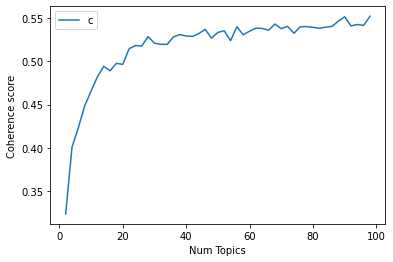

In [55]:
limit=100; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()


In [386]:
# limit=36; start=2; step=2;
# x = range(start, limit, step)

round(coherence_values[25],2)

# coherence_limit = int((limit/2)-1)
# plt.plot(x, coherence_values)
# plt.xlabel("Num Topics")
# plt.ylabel("Coherence score")
# plt.legend(("coherence_values"), loc='best')
# plt.savefig("CoherencePlot.jpeg",dpi=1080)
#plt.show()

0.54

In [339]:
# Print the coherence scores
i=0
for m, cv in zip(x, coherence_values):
    print("index =", i)
    print("Num Topics =", m, " has Coherence Value of", round(cv, 2))
    i+=1

index = 0
Num Topics = 2  has Coherence Value of 0.32
index = 1
Num Topics = 3  has Coherence Value of 0.4
index = 2
Num Topics = 4  has Coherence Value of 0.42
index = 3
Num Topics = 5  has Coherence Value of 0.45
index = 4
Num Topics = 6  has Coherence Value of 0.47
index = 5
Num Topics = 7  has Coherence Value of 0.48
index = 6
Num Topics = 8  has Coherence Value of 0.49
index = 7
Num Topics = 9  has Coherence Value of 0.49
index = 8
Num Topics = 10  has Coherence Value of 0.5
index = 9
Num Topics = 11  has Coherence Value of 0.5
index = 10
Num Topics = 12  has Coherence Value of 0.51
index = 11
Num Topics = 13  has Coherence Value of 0.52
index = 12
Num Topics = 14  has Coherence Value of 0.52
index = 13
Num Topics = 15  has Coherence Value of 0.53
index = 14
Num Topics = 16  has Coherence Value of 0.52
index = 15
Num Topics = 17  has Coherence Value of 0.52
index = 16
Num Topics = 18  has Coherence Value of 0.52
index = 17
Num Topics = 19  has Coherence Value of 0.53
index = 18
Nu

In [384]:
model = model_list[13]
model.print_topics(num_words=1)

[(9, '0.080*"meeting"'),
 (13, '0.117*"worker"'),
 (1, '0.139*"time"'),
 (16, '0.046*"back"'),
 (6, '0.034*"guy"'),
 (20, '0.134*"worker"'),
 (12, '0.195*"people"'),
 (7, '0.169*"worker"'),
 (21, '0.119*"meeting"'),
 (15, '0.054*"worker"'),
 (2, '0.082*"meeting"'),
 (11, '0.014*"car"'),
 (5, '0.117*"meeting"'),
 (8, '0.073*"awful"'),
 (4, '0.019*"country"'),
 (14, '0.075*"meeting"'),
 (10, '0.292*"awful"'),
 (19, '0.208*"meeting"'),
 (0, '0.064*"awful"'),
 (17, '0.025*"employee"')]

In [372]:
def ldaMalletConvertToldaGen(mallet_model):
    model_gensim = LdaModel(
        id2word=mallet_model.id2word, 
        num_topics=mallet_model.num_topics, 
        alpha=mallet_model.alpha, 
        eta=0, 
        iterations=1000, 
        gamma_threshold=0.001, 
        dtype=np.float32)
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

converted_model = ldaMalletConvertToldaGen(model)

In [364]:
converted_model.print_topics(num_words=1)

[(12, '0.158*"people"'),
 (13, '0.065*"meeting"'),
 (15, '0.016*"productivity"'),
 (8, '0.073*"labor"'),
 (11, '0.082*"worker"'),
 (18, '0.046*"worker"'),
 (9, '0.117*"meeting"'),
 (2, '0.229*"worker"'),
 (3, '0.124*"awful"'),
 (7, '0.037*"business"'),
 (0, '0.198*"meeting"'),
 (23, '0.124*"day"'),
 (17, '0.074*"awful"'),
 (10, '0.271*"awful"'),
 (19, '0.059*"worker"'),
 (22, '0.098*"meeting"'),
 (20, '0.022*"country"'),
 (16, '0.021*"face"'),
 (6, '0.036*"shit"'),
 (4, '0.059*"meeting"')]

In [373]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(converted_model, corpus, id2word)
vis

/Users/razon/opt/anaconda3/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
5     -0.115083 -0.103415       1        1  3.699251
17    -0.144095 -0.215843       2        1  3.639740
0      0.264329 -0.040229       3        1  3.622755
2     -0.032496 -0.014335       4        1  3.612986
21    -0.087310 -0.027663       5        1  3.605855
1     -0.150733 -0.187594       6        1  3.602471
22    -0.105628  0.161718       7        1  3.593285
7     -0.073936  0.163705       8        1  3.586505
11    -0.155513 -0.234857       9        1  3.585955
25    -0.025547 -0.028782      10        1  3.584839
13     0.026886 -0.048603      11        1  3.583489
15    -0.127544  0.172195      12        1  3.579349
9      0.256899 -0.032159      13        1  3.568984
18    -0.081919  0.034233      14        1  3.568480
10    -0.154972 -0.214878      15        1  3.568111
19     0.057728 -0.011172      16        1  3.559442
12     0.188358 -0.005820      17        1  3.554540
14     0.088604  0.061728      18        1  3.552717
20    -0.023617  0.074348      19        1  3.551216
8     -0.125846 -0.109373      20        1  3.550854
26     0.204588 -0.019165      21        1  3.546476
23     0.148140 -0.062678      22        1  3.545906
16     0.216473  0.014561      23        1  3.536124
4     -0.153646  0.275653      24        1  3.533601
27     0.040296  0.057063      25        1  3.522992
24    -0.093394  0.062932      26        1  3.522056
3     -0.108161  0.278964      27        1  3.518915
6      0.267137 -0.000537      28        1  3.503107, topic_info=         Term           Freq          Total Category  logprob  loglift
1511    awful  478651.000000  478651.000000  Default  30.0000  30.0000
458    worker  583547.000000  583547.000000  Default  29.0000  29.0000
380   meeting  759070.000000  759070.000000  Default  28.0000  28.0000
401    people  218261.000000  218261.000000  Default  27.0000  27.0000
27       time  175600.000000  175600.000000  Default  26.0000  26.0000
...       ...            ...            ...      ...      ...      ...
158   forward    6948.367095   17069.323524  Topic28  -4.8218   2.4527
2940   chance    5970.458437   12363.331957  Topic28  -4.9735   2.6236
248      find   11155.029176   71588.288050  Topic28  -4.3485   1.4925
1834      run    5684.334123   19584.549247  Topic28  -5.0226   2.1145
493     start    5363.875116   34138.231273  Topic28  -5.0807   1.5008

[2148 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
1285      11  1.000159         aaj
2579       1  0.961509      abacus
1408       8  0.000057  absolutely
1408      24  0.999864  absolutely
1408      28  0.000057  absolutely
...      ...       ...         ...
7803      13  1.000038     youtube
10231      7  0.802385    zakharia
640        3  0.702718        zoom
640       23  0.297285        zoom
1946      23  0.941669   zoomedout

[3693 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 18, 1, 3, 22, 2, 23, 8, 12, 26, 14, 16, 10, 19, 11, 20, 13, 15, 21, 9, 27, 24, 17, 5, 28, 25, 4, 7])

In [90]:
wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=42)

In [91]:
# set the figure size
plt.rcParams['figure.figsize'] = [20, 15]

In [292]:
#x=converted_model.show_topics()

for index, topic in converted_model.show_topics(formatted=False, num_words= 10):
    print('Topic: {} \nWords: {}'.format(index, [w[0] for w in topic]))

Topic: 1 
Words: ['worker', 'poll', 'vote', 'sign', 'put', 'mask', 'person', 'state', 'biden', 'election']
Topic: 3 
Words: ['awful', 'good', 'thing', 'lot', 'feel', 'great', 'hope', 'bad', 'pretty', 'sound']
Topic: 17 
Words: ['worker', 'care', 'health', 'home', 'essential', 'covid', 'healthcare', 'stay', 'pandemic', 'vaccine']
Topic: 7 
Words: ['awful', 'game', 'team', 'play', 'player', 'season', 'win', 'top', 'fan', 'coach']
Topic: 13 
Words: ['party', 'government', 'issue', 'meeting', 'state', 'leader', 'govt', 'held', 'minister', 'labour']
Topic: 22 
Words: ['people', 'make', 'thing', 'life', 'making', 'feel', 'person', 'made', 'real', 'understand']
Topic: 24 
Words: ['shit', 'fucking', 'god', 'gon', 'fuck', 'lol', 'give', 'literally', 'hate', 'guy']
Topic: 15 
Words: ['awful', 'fact', 'point', 'medium', 'lie', 'agree', 'wrong', 'anti', 'truth', 'racist']
Topic: 9 
Words: ['meeting', 'check', 'find', 'group', 'team', 'video', 'community', 'room', 'meet', 'space']
Topic: 6 
Words: 

In [282]:
#for i in converted_model.show_topics(formatted=False,num_topics=converted_model.num_topics,num_words=len(converted_model.id2word)):
print(converted_model.num_topics)

28


In [378]:
topics = [[(term, round(wt, 3)) for term, wt in converted_model.show_topic(n, topn=300)] for n in range(0, converted_model.num_topics)]

In [379]:
topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], 
                         columns = ['Terms per Topic'], 
                         index=['Topic'+t.__str__() for t in range(1, converted_model.num_topics+1)] )
topics_df.head()

,Terms per Topic
Topic1,"meeting, find, zoom, check, join, member, emai..."
Topic2,"worker, poll, vote, sign, put, mask, person, s..."
Topic3,"productivity, business, change, set, system, c..."
Topic4,"awful, good, thing, lot, feel, great, hope, ba..."
Topic5,"awful, job, people, lost, absolutely, bad, ter..."


In [388]:
i = 0
for topic in topicLabelList:#i in range(28):
    print("Topic: ", topic[i])
    i += 1

TypeError: 'int' object is not subscriptable

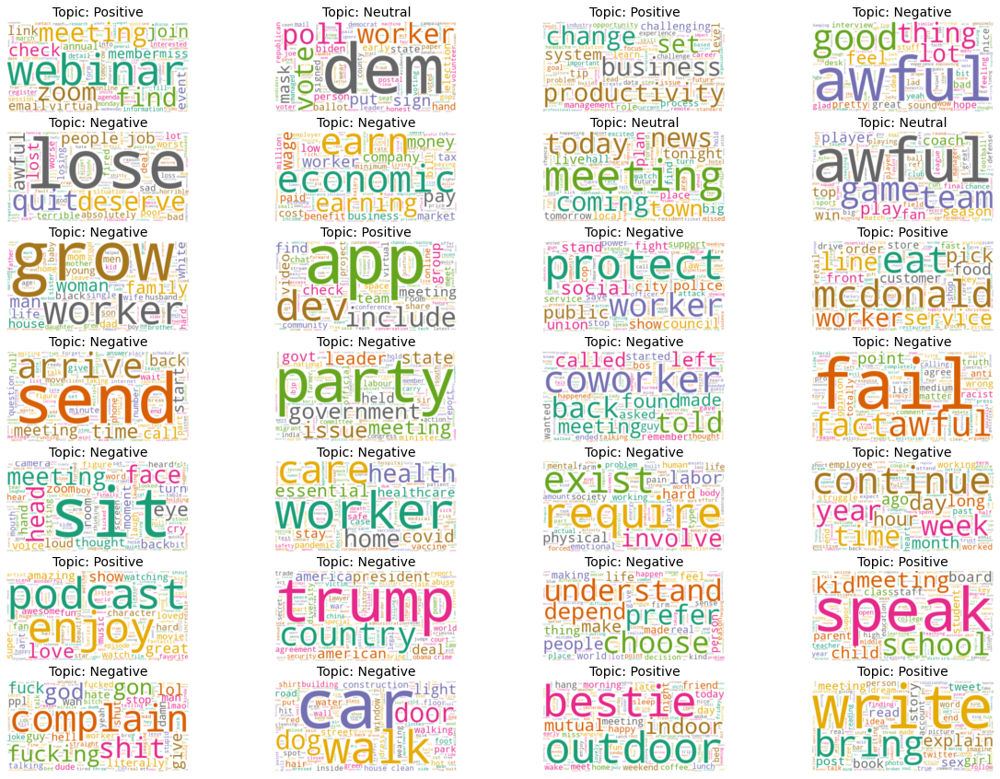

In [404]:
# Create subplots for each topic
for i in range(28):

    wc.generate(text=topics_df["Terms per Topic"][i])
    
    plt.subplot(7, 4, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title("Topic: "+topicLabelList[i], fontsize=14)

plt.savefig("topicWords.jpeg",dpi=1080,bbox_inches='tight')
plt.show()

In [107]:
def format_topics_sentences(ldamodel=converted_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

In [109]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=converted_model, corpus=corpus, texts=data)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2.0,0.0701,"productivity, business, change, set, system, c...",would give headache much productivity taste
1,1,2.0,0.0974,"productivity, business, change, set, system, c...",one recommendation would give new software dev...
2,2,2.0,0.1044,"productivity, business, change, set, system, c...",jasper week since pfizer still feeling fatigue...
3,3,26.0,0.1077,"meeting, day, friend, today, night, morning, h...",least energy booster productivity need wakeful...
4,4,26.0,0.0661,"meeting, day, friend, today, night, morning, h...",loud window bed shudder procession pass someti...
...,...,...,...,...,...
1471204,1471204,14.0,0.0891,"back, told, meeting, called, left, found, made...",april lols cried track found run mile made sup...
1471205,1471205,19.0,0.0752,"year, week, time, day, hour, long, month, ago,...",even though year lot awful shit happened alway...
1471206,1471206,7.0,0.1141,"awful, game, team, play, player, season, win, ...",totally agree elway done awful drafting talent...
1471207,1471207,7.0,0.0873,"awful, game, team, play, player, season, win, ...",literally tried give preseason win coaching aw...


In [280]:
df_dominant_topic['Keywords']

0          productivity, business, change, set, system, c...
1          productivity, business, change, set, system, c...
2          productivity, business, change, set, system, c...
3          meeting, day, friend, today, night, morning, h...
4          meeting, day, friend, today, night, morning, h...
                                 ...                        
1471204    back, told, meeting, called, left, found, made...
1471205    year, week, time, day, hour, long, month, ago,...
1471206    awful, game, team, play, player, season, win, ...
1471207    awful, game, team, play, player, season, win, ...
1471208    love, great, show, amazing, watching, watch, h...
Name: Keywords, Length: 1471209, dtype: object

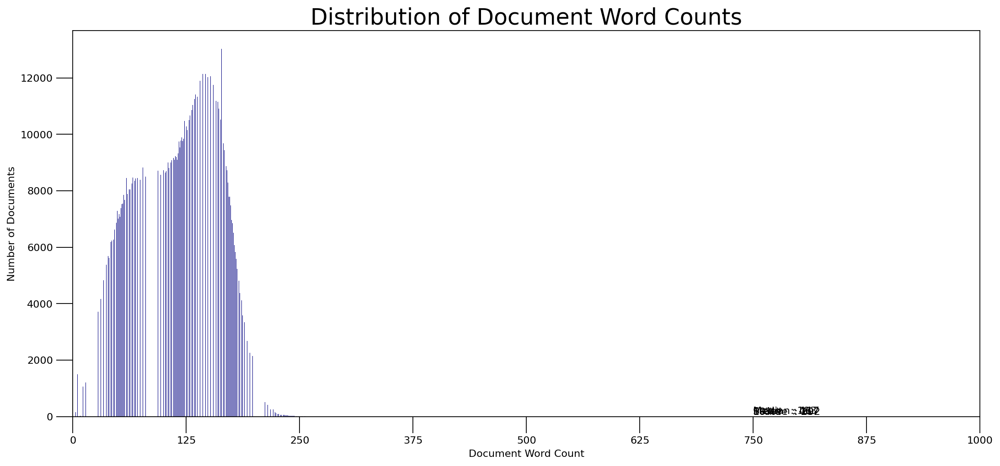

In [287]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 1000, color='navy')
plt.text(750, 100, "Mean   : " + round(np.mean(doc_lens)).__str__())
plt.text(750,  90, "Median : " + round(np.median(doc_lens)).__str__())
plt.text(750,  80, "Stdev   : " + round(np.std(doc_lens)).__str__())
plt.text(750,  70, "1%ile    : " + round(np.quantile(doc_lens, q=0.01)).__str__())
plt.text(750,  60, "99%ile  : " + round(np.quantile(doc_lens, q=0.99)).__str__())

plt.gca().set(xlim=(0, 1000), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,1000,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()

In [185]:
negtiveWordFromLexicon = opinion_lexicon.negative()

In [186]:
positiveWordFromLexicon = opinion_lexicon.positive()

In [212]:
if 'meeting' in negtiveWordFromLexicon:
    print('true')

In [125]:
tweet = 'Tweet'
createdAt = 'Created At'
label = 'labeling'
cleanedData = 'cleanedData'
weight = 'weight'
vaderSentCleaned = 'VaderSentCleaned'
vaderSent = 'VaderSent'
posTweet = []
negTweet = []
neutralTweet = []

In [380]:
topicLabelList = {}

for index, wordListByTopic in enumerate(topics_df["Terms per Topic"]):
    words = wordListByTopic.split(', ')
    negPoint = 0
    posPoint = 0
    neuPoint = 0
    
    #print(words[0])
    
    for word in words:
        #print(word)
        if  (word in posWrdList) or (word in positiveWordFromLexicon):
            posPoint += 1
        if  (word in negWrdList) or (word in negtiveWordFromLexicon):
            negPoint += 1
#         else:
#             neuPoint += 1
        if (word not in posWrdList) and (word not in negWrdList):
             neuPoint += 1
            
    print(posPoint, negPoint, neuPoint)
    if (posPoint > negPoint) and (posPoint > neuPoint):
        topicLabelList[index] = 'Positive'
    elif (negPoint > posPoint) and (negPoint > neuPoint):
        topicLabelList[index] = 'Negative'
    else:
        topicLabelList[index] = 'Neutral'

163 132 129
100 122 174
252 222 38
176 185 115
123 226 128
173 176 107
144 138 148
139 133 148
159 177 119
184 150 103
145 177 123
166 164 110
169 189 103
154 155 123
191 214 77
144 198 125
182 198 93
148 160 131
225 236 52
143 152 143
190 168 98
143 182 125
203 211 77
197 182 89
178 234 77
186 192 77
214 200 72
188 178 98


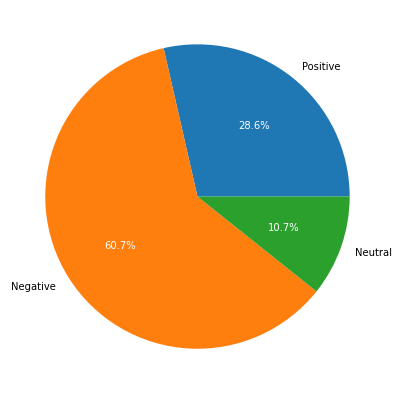

In [490]:
cars = ['Positive', 'Negative', 'Neutral']

posTop = 0
negTop = 0
neuTop = 0
i = 0

for i in range(28):
    if topicLabelList[i] == 'Positive':
        posTop += 1
    if topicLabelList[i] == 'Negative':
        negTop += 1
    if topicLabelList[i] == 'Neutral':
        neuTop += 1
    i += 1
 
data = [posTop, negTop, neuTop]
 
# Creating plot
fig = plt.figure(figsize =(10, 7))
_, _, autotexts = plt.pie(data, labels = cars, autopct='%1.1f%%')
for autotext in autotexts:
    autotext.set_color('white')
 
# show plot
plt.savefig("topicProportion.jpeg",dpi=1080, bbox_inches='tight')
plt.show()

In [65]:
model_gensim = gensim.models.ldamodel.LdaModel(corpus=corpus,
        id2word=model.id2word, 
        num_topics=model.num_topics,
        alpha=model.alpha, 
        eta=0,
        iterations=50,
        gamma_threshold=0.001,
        dtype=np.float64  # don't loose precision when converting from MALLET
    )

/Users/razon/opt/anaconda3/lib/python3.9/site-packages/gensim/models/ldamodel.py:1133: RuntimeWarning: invalid value encountered in multiply
  score += np.sum((self.eta - _lambda) * Elogbeta)
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/gensim/models/ldamodel.py:1134: RuntimeWarning: invalid value encountered in subtract
  score += np.sum(gammaln(_lambda) - gammaln(self.eta))


In [66]:
model_gensim.state.sstats[...] = model.wordtopics

In [67]:
model_gensim.sync_state()

In [69]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(model_gensim, corpus, id2word)
vis

/Users/razon/opt/anaconda3/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/s

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
61    -0.077144  0.090156       1        1  1.142469
65    -0.044764  0.007438       2        1  1.137755
88    -0.041822 -0.002042       3        1  1.105591
47    -0.093594 -0.166885       4        1  1.083513
41     0.163245  0.016431       5        1  1.075909
...         ...       ...     ...      ...       ...
53     0.019064 -0.021622      92        1  1.004382
89    -0.098406 -0.254090      93        1  1.003197
35    -0.118535 -0.229947      94        1  0.993230
64    -0.016379  0.012970      95        1  0.991677
26    -0.084505  0.144861      96        1  0.982895

[96 rows x 5 columns], topic_info=         Term           Freq          Total Category  logprob  loglift
380   meeting  779922.000000  779922.000000  Default  30.0000  30.0000
1511    awful  484368.000000  484368.000000  Default  29.0000  29.0000
458    worker  596936.000000  596936.000000  Default  28.0000  28.0000
401    people  227156.000000  227156.000000  Default  27.0000  27.0000
27       time  180414.000000  180414.000000  Default  26.0000  26.0000
...       ...            ...            ...      ...      ...      ...
97      today    4243.805927   92936.205310  Topic96  -4.0440   1.5360
2696     hold    1760.714810   14746.965227  Topic96  -4.9237   2.4971
1834      run    1832.580720   20080.370526  Topic96  -4.8837   2.2284
886   totally    1467.055830    8503.584284  Topic96  -5.1062   2.8652
3126    tweet    1473.251167   13755.867546  Topic96  -5.1020   2.3884

[8898 rows x 6 columns], token_table=        Topic      Freq        Term
term                               
16758      80  0.779417        aadu
248315      6  1.002617       aanam
5014       20  0.999500         aap
20379      35  0.822923     aarrhgg
26287       4  0.761141      aarron
...       ...       ...         ...
6923       38  0.998696  zuckerberg
20442      69  0.838457     zuerich
13037      26  0.818461        zuke
37944      73  0.991668        zulu
5178       73  1.000045        zuma

[21638 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[62, 66, 89, 48, 42, 58, 4, 75, 86, 19, 95, 67, 56, 93, 11, 41, 73, 15, 8, 68, 30, 88, 23, 31, 92, 43, 16, 74, 26, 3, 34, 53, 91, 81, 29, 79, 13, 44, 45, 6, 77, 96, 35, 10, 94, 1, 57, 7, 51, 5, 85, 21, 32, 9, 33, 63, 47, 64, 24, 87, 25, 50, 49, 72, 28, 20, 14, 83, 22, 80, 61, 52, 46, 18, 70, 59, 78, 17, 60, 38, 76, 2, 55, 39, 40, 37, 84, 82, 69, 71, 12, 54, 90, 36, 65, 27])

In [30]:
def malletmodel2ldamodel1(mallet_model, gamma_threshold=0.001, iterations=50):
    """Convert :class:`~gensim.models.wrappers.ldamallet.LdaMallet` to :class:`~gensim.models.ldamodel.LdaModel`.

    This works by copying the training model weights (alpha, beta...) from a trained mallet model into the gensim model.

    Parameters
    ----------
    mallet_model : :class:`~gensim.models.wrappers.ldamallet.LdaMallet`
        Trained Mallet model
    gamma_threshold : float, optional
        To be used for inference in the new LdaModel.
    iterations : int, optional
        Number of iterations to be used for inference in the new LdaModel.

    Returns
    -------
    :class:`~gensim.models.ldamodel.LdaModel`
        Gensim native LDA.

    """
    model_gensim = gensim.models.ldamodel.LdaModel(corpus=corpus,
        id2word=mallet_model.id2word, 
        num_topics=mallet_model.num_topics,
        alpha=mallet_model.alpha, 
        eta=0,
        iterations=iterations,
        gamma_threshold=gamma_threshold,
        dtype=np.float64  # don't loose precision when converting from MALLET
    )
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

In [29]:
class LdaMallet(utils.SaveLoad, basemodel.BaseTopicModel):
    """Python wrapper for LDA using `MALLET <http://mallet.cs.umass.edu/>`_.

    Communication between MALLET and Python takes place by passing around data files on disk
    and calling Java with subprocess.call().

    Warnings
    --------
    This is **only** python wrapper for `MALLET LDA <http://mallet.cs.umass.edu/>`_,
    you need to install original implementation first and pass the path to binary to ``mallet_path``.

    """
    def __init__(self, mallet_path, corpus=None, num_topics=100, alpha=50, id2word=None, workers=4, prefix=None,
                 optimize_interval=0, iterations=1000, topic_threshold=0.0, random_seed=0):
        """

        Parameters
        ----------
        mallet_path : str
            Path to the mallet binary, e.g. `/home/username/mallet-2.0.7/bin/mallet`.
        corpus : iterable of iterable of (int, int), optional
            Collection of texts in BoW format.
        num_topics : int, optional
            Number of topics.
        alpha : int, optional
            Alpha parameter of LDA.
        id2word : :class:`~gensim.corpora.dictionary.Dictionary`, optional
            Mapping between tokens ids and words from corpus, if not specified - will be inferred from `corpus`.
        workers : int, optional
            Number of threads that will be used for training.
        prefix : str, optional
            Prefix for produced temporary files.
        optimize_interval : int, optional
            Optimize hyperparameters every `optimize_interval` iterations
            (sometimes leads to Java exception 0 to switch off hyperparameter optimization).
        iterations : int, optional
            Number of training iterations.
        topic_threshold : float, optional
            Threshold of the probability above which we consider a topic.
        random_seed: int, optional
            Random seed to ensure consistent results, if 0 - use system clock.

        """
        self.mallet_path = mallet_path
        self.id2word = id2word
        if self.id2word is None:
            logger.warning("no word id mapping provided; initializing from corpus, assuming identity")
            self.id2word = utils.dict_from_corpus(corpus)
            self.num_terms = len(self.id2word)
        else:
            self.num_terms = 0 if not self.id2word else 1 + max(self.id2word.keys())
        if self.num_terms == 0:
            raise ValueError("cannot compute LDA over an empty collection (no terms)")
        self.num_topics = num_topics
        self.topic_threshold = topic_threshold
        self.alpha = alpha
        if prefix is None:
            rand_prefix = hex(random.randint(0, 0xffffff))[2:] + '_'
            prefix = os.path.join(tempfile.gettempdir(), rand_prefix)
        self.prefix = prefix
        self.workers = workers
        self.optimize_interval = optimize_interval
        self.iterations = iterations
        self.random_seed = random_seed
        if corpus is not None:
            self.train(corpus)

    def finferencer(self):
        """Get path to inferencer.mallet file.

        Returns
        -------
        str
            Path to inferencer.mallet file.

        """
        return self.prefix + 'inferencer.mallet'

    def ftopickeys(self):
        """Get path to topic keys text file.

        Returns
        -------
        str
            Path to topic keys text file.

        """
        return self.prefix + 'topickeys.txt'

    def fstate(self):
        """Get path to temporary file.

        Returns
        -------
        str
            Path to file.

        """
        return self.prefix + 'state.mallet.gz'

    def fdoctopics(self):
        """Get path to document topic text file.

        Returns
        -------
        str
            Path to document topic text file.

        """
        return self.prefix + 'doctopics.txt'

    def fcorpustxt(self):
        """Get path to corpus text file.

        Returns
        -------
        str
            Path to corpus text file.

        """
        return self.prefix + 'corpus.txt'

    def fcorpusmallet(self):
        """Get path to corpus.mallet file.

        Returns
        -------
        str
            Path to corpus.mallet file.

        """
        return self.prefix + 'corpus.mallet'

    def fwordweights(self):
        """Get path to word weight file.

        Returns
        -------
        str
            Path to word weight file.

        """
        return self.prefix + 'wordweights.txt'

    def corpus2mallet(self, corpus, file_like):
        """Convert `corpus` to Mallet format and write it to `file_like` descriptor.

        Format ::

            document id[SPACE]label (not used)[SPACE]whitespace delimited utf8-encoded tokens[NEWLINE]

        Parameters
        ----------
        corpus : iterable of iterable of (int, int)
            Collection of texts in BoW format.
        file_like : file-like object
            Opened file.

        """
        for docno, doc in enumerate(corpus):
            if self.id2word:
                tokens = chain.from_iterable([self.id2word[tokenid]] * int(cnt) for tokenid, cnt in doc)
            else:
                tokens = chain.from_iterable([tokenid.__str__()] * int(cnt) for tokenid, cnt in doc)
            file_like.write(utils.to_utf8("%s 0 %s\n" % (docno, ' '.join(tokens))))

    def convert_input(self, corpus, infer=False, serialize_corpus=True):
        """Convert corpus to Mallet format and save it to a temporary text file.

        Parameters
        ----------
        corpus : iterable of iterable of (int, int)
            Collection of texts in BoW format.
        infer : bool, optional
            ...
        serialize_corpus : bool, optional
            ...

        """
        if serialize_corpus:
            logger.info("serializing temporary corpus to %s", self.fcorpustxt())
            with open(self.fcorpustxt(), 'wb') as fout:
                self.corpus2mallet(corpus, fout)

        # convert the text file above into MALLET's internal format
        cmd = \
            self.mallet_path + \
            " import-file --preserve-case --keep-sequence " \
            "--remove-stopwords --token-regex \"\\S+\" --input %s --output %s"
        if infer:
            cmd += ' --use-pipe-from ' + self.fcorpusmallet()
            cmd = cmd % (self.fcorpustxt(), self.fcorpusmallet() + '.infer')
        else:
            cmd = cmd % (self.fcorpustxt(), self.fcorpusmallet())
        logger.info("converting temporary corpus to MALLET format with %s", cmd)
        check_output(args=cmd, shell=True)

    def train(self, corpus):
        """Train Mallet LDA.

        Parameters
        ----------
        corpus : iterable of iterable of (int, int)
            Corpus in BoW format

        """
        self.convert_input(corpus, infer=False)
        cmd = self.mallet_path + ' train-topics --input %s --num-topics %s  --alpha %s --optimize-interval %s '\
            '--num-threads %s --output-state %s --output-doc-topics %s --output-topic-keys %s '\
            '--num-iterations %s --inferencer-filename %s --doc-topics-threshold %s  --random-seed %s'

        cmd = cmd % (
            self.fcorpusmallet(), self.num_topics, self.alpha, self.optimize_interval,
            self.workers, self.fstate(), self.fdoctopics(), self.ftopickeys(), self.iterations,
            self.finferencer(), self.topic_threshold, self.random_seed.__str__()
        )
        # NOTE "--keep-sequence-bigrams" / "--use-ngrams true" poorer results + runs out of memory
        logger.info("training MALLET LDA with %s", cmd)
        check_output(args=cmd, shell=True)
        self.word_topics = self.load_word_topics()
        # NOTE - we are still keeping the wordtopics variable to not break backward compatibility.
        # word_topics has replaced wordtopics throughout the code;
        # wordtopics just stores the values of word_topics when train is called.
        self.wordtopics = self.word_topics

    def __getitem__(self, bow, iterations=100):
        """Get vector for document(s).

        Parameters
        ----------
        bow : {list of (int, int), iterable of list of (int, int)}
            Document (or corpus) in BoW format.
        iterations : int, optional
            Number of iterations that will be used for inferring.

        Returns
        -------
        list of (int, float)
            LDA vector for document as sequence of (topic_id, topic_probability) **OR**
        list of list of (int, float)
            LDA vectors for corpus in same format.

        """
        is_corpus, corpus = utils.is_corpus(bow)
        if not is_corpus:
            # query is a single document => make a corpus out of it
            bow = [bow]

        self.convert_input(bow, infer=True)
        cmd = \
            self.mallet_path + ' infer-topics --input %s --inferencer %s ' \
                               '--output-doc-topics %s --num-iterations %s --doc-topics-threshold %s --random-seed %s'
        cmd = cmd % (
            self.fcorpusmallet() + '.infer', self.finferencer(),
            self.fdoctopics() + '.infer', iterations, self.topic_threshold, self.random_seed.__str__()
        )
        logger.info("inferring topics with MALLET LDA '%s'", cmd)
        check_output(args=cmd, shell=True)
        result = list(self.read_doctopics(self.fdoctopics() + '.infer'))
        return result if is_corpus else result[0]

    def load_word_topics(self):
        """Load words X topics matrix from :meth:`gensim.models.wrappers.ldamallet.LdaMallet.fstate` file.

        Returns
        -------
        numpy.ndarray
            Matrix words X topics.

        """
        logger.info("loading assigned topics from %s", self.fstate())
        word_topics = np.zeros((self.num_topics, self.num_terms), dtype=np.float64)
        if hasattr(self.id2word, 'token2id'):
            word2id = self.id2word.token2id
        else:
            word2id = revdict(self.id2word)

        with open(self.fstate()) as fin:
            _ = next(fin)  # header
            self.alpha = np.fromiter(next(fin).split()[2:], dtype=float)
            assert len(self.alpha) == self.num_topics, "mismatch between MALLET vs. requested topics"
            _ = next(fin)  # noqa:F841 beta
            for lineno, line in enumerate(fin):
                line = utils.to_unicode(line)
                doc, source, pos, typeindex, token, topic = line.split(" ")
                if token not in word2id:
                    continue
                tokenid = word2id[token]
                word_topics[int(topic), tokenid] += 1.0
        return word_topics

    def load_document_topics(self):
        """Load document topics from :meth:`gensim.models.wrappers.ldamallet.LdaMallet.fdoctopics` file.
        Shortcut for :meth:`gensim.models.wrappers.ldamallet.LdaMallet.read_doctopics`.

        Returns
        -------
        iterator of list of (int, float)
            Sequence of LDA vectors for documents.

        """
        return self.read_doctopics(self.fdoctopics())

    def get_topics(self):
        """Get topics X words matrix.

        Returns
        -------
        numpy.ndarray
            Topics X words matrix, shape `num_topics` x `vocabulary_size`.

        """
        topics = self.word_topics
        return topics / topics.sum(axis=1)[:, None]

    def show_topics(self, num_topics=10, num_words=10, log=False, formatted=True):
        """Get the `num_words` most probable words for `num_topics` number of topics.

        Parameters
        ----------
        num_topics : int, optional
            Number of topics to return, set `-1` to get all topics.
        num_words : int, optional
            Number of words.
        log : bool, optional
            If True - write topic with logging too, used for debug proposes.
        formatted : bool, optional
            If `True` - return the topics as a list of strings, otherwise as lists of (weight, word) pairs.

        Returns
        -------
        list of str
            Topics as a list of strings (if formatted=True) **OR**
        list of (float, str)
            Topics as list of (weight, word) pairs (if formatted=False)

        """
        if num_topics < 0 or num_topics >= self.num_topics:
            num_topics = self.num_topics
            chosen_topics = range(num_topics)
        else:
            num_topics = min(num_topics, self.num_topics)
            # add a little random jitter, to randomize results around the same alpha
            sort_alpha = self.alpha + 0.0001 * np.random.rand(len(self.alpha))
            sorted_topics = list(matutils.argsort(sort_alpha))
            chosen_topics = sorted_topics[: num_topics // 2] + sorted_topics[-num_topics // 2:]
        shown = []
        for i in chosen_topics:
            if formatted:
                topic = self.print_topic(i, topn=num_words)
            else:
                topic = self.show_topic(i, topn=num_words)
            shown.append((i, topic))
            if log:
                logger.info("topic #%i (%.3f): %s", i, self.alpha[i], topic)
        return shown

    def show_topic(self, topicid, topn=10, num_words=None):
        """Get `num_words` most probable words for the given `topicid`.

        Parameters
        ----------
        topicid : int
            Id of topic.
        topn : int, optional
            Top number of topics that you'll receive.
        num_words : int, optional
            DEPRECATED PARAMETER, use `topn` instead.

        Returns
        -------
        list of (str, float)
            Sequence of probable words, as a list of `(word, word_probability)` for `topicid` topic.

        """
        if num_words is not None:  # deprecated num_words is used
            warnings.warn("The parameter `num_words` is deprecated, will be removed in 4.0.0, use `topn` instead.")
            topn = num_words

        if self.word_topics is None:
            logger.warning("Run train or load_word_topics before showing topics.")
        topic = self.word_topics[topicid]
        topic = topic / topic.sum()  # normalize to probability dist
        bestn = matutils.argsort(topic, topn, reverse=True)
        beststr = [(self.id2word[idx], topic[idx]) for idx in bestn]
        return beststr

    def get_version(self, direc_path):
        """"Get the version of Mallet.

        Parameters
        ----------
        direc_path : str
            Path to mallet archive.

        Returns
        -------
        str
            Version of mallet.

        """
        try:
            archive = zipfile.ZipFile(direc_path, 'r')
            if u'cc/mallet/regression/' not in archive.namelist():
                return '2.0.7'
            else:
                return '2.0.8RC3'
        except Exception:

            xml_path = direc_path.split("bin")[0]
            try:
                doc = et.parse(xml_path + "pom.xml").getroot()
                namespace = doc.tag[:doc.tag.index('}') + 1]
                return doc.find(namespace + 'version').text.split("-")[0]
            except Exception:
                return "Can't parse pom.xml version file"

    def read_doctopics(self, fname, eps=1e-6, renorm=True):
        """Get document topic vectors from MALLET's "doc-topics" format, as sparse gensim vectors.

        Parameters
        ----------
        fname : str
            Path to input file with document topics.
        eps : float, optional
            Threshold for probabilities.
        renorm : bool, optional
            If True - explicitly re-normalize distribution.

        Raises
        ------
        RuntimeError
            If any line in invalid format.

        Yields
        ------
        list of (int, float)
            LDA vectors for document.

        """
        mallet_version = self.get_version(self.mallet_path)
        with open(fname) as fin:
            for lineno, line in enumerate(fin):
                if lineno == 0 and line.startswith(b"#doc "):
                    continue  # skip the header line if it exists

                parts = line.split()[2:]  # skip "doc" and "source" columns

                # the MALLET doctopic format changed in 2.0.8 to exclude the id,
                # this handles the file differently dependent on the pattern
                if len(parts) == 2 * self.num_topics:
                    doc = [
                        (int(id_), float(weight)) for id_, weight in zip(*[iter(parts)] * 2)
                        if abs(float(weight)) > eps
                    ]
                elif len(parts) == self.num_topics and mallet_version != '2.0.7':
                    doc = [(id_, float(weight)) for id_, weight in enumerate(parts) if abs(float(weight)) > eps]
                else:
                    if mallet_version == "2.0.7":
                        """

                            1   1   0   1.0780612802674239  30.005575655428533364   2   0.005575655428533364
                            2   2   0   0.9184413079632608  40.009062076892971008   3   0.009062076892971008
                            In the above example there is a mix of the above if and elif statement.
                            There are neither `2*num_topics` nor `num_topics` elements.
                            It has 2 formats 40.009062076892971008 and 0   1.0780612802674239
                            which cannot be handled by above if elif.
                            Also, there are some topics are missing(meaning that the topic is not there)
                            which is another reason why the above if elif fails even when the `mallet`
                            produces the right results

                        """
                        count = 0
                        doc = []
                        if len(parts) > 0:
                            while count < len(parts):
                                """
                                if section is to deal with formats of type 2 0.034
                                so if count reaches index of 2 and since int(2) == float(2) so if block is executed
                                now  there is one extra element afer 2, so count + 1 access should not give an error

                                else section handles  formats of type 20.034
                                now count is there on index of 20.034 since float(20.034) != int(20.034) so else block
                                is executed

                                """
                                if float(parts[count]) == int(parts[count]):
                                    if float(parts[count + 1]) > eps:
                                        doc.append((int(parts[count]), float(parts[count + 1])))
                                    count += 2
                                else:
                                    if float(parts[count]) - int(parts[count]) > eps:
                                        doc.append((int(parts[count]) % 10, float(parts[count]) - int(parts[count])))
                                    count += 1
                    else:
                        raise RuntimeError("invalid doc topics format at line %i in %s" % (lineno + 1, fname))

                if renorm:
                    # explicitly normalize weights to sum up to 1.0, just to be sure...
                    total_weight = float(sum(weight for _, weight in doc))
                    if total_weight:
                        doc = [(id_, float(weight) / total_weight) for id_, weight in doc]
                yield doc

    @classmethod
    def load(cls, *args, **kwargs):
        """Load a previously saved LdaMallet class. Handles backwards compatibility from
        older LdaMallet versions which did not use random_seed parameter.
        """
        model = super(LdaMallet, cls).load(*args, **kwargs)
        if not hasattr(model, 'random_seed'):
            model.random_seed = 0

        return model

In [41]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['would', 'give', 'headache', 'much', 'productivity', 'taste']


In [42]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(doc.__str__()) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent.__str__())) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [44]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

In [45]:
# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

In [50]:
# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

In [52]:
# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])


KeyboardInterrupt: 

In [ ]:
print(data_lemmatized[:10])

In [118]:
tweet = 'Tweet'
createdAt = 'Created At'
label = 'labeling'
cleanedData = 'cleanedData'
weight = 'weight'
vaderSentCleaned = 'VaderSentCleaned'
vaderSent = 'VaderSent'

In [119]:
labeledDataPath = '/Volumes/Works/Development/Python/Shout/WorkSentiment/semiSupervised/LableledCleanedData22Aug20.xlsx'

In [256]:
topicLabelList = {}

for index, wordListByTopic in enumerate(topics_df["Terms per Topic"]):
    words = wordListByTopic.split(',')
    negPoint = 0
    posPoint = 0
    neuPoint = 0
    
    print(wordListByTopic)
    
    for word in words:
        #print(word)
        if  (word in posWrdList) or (word in positiveWordFromLexicon):
            posPoint += 1
        if  (word in negWrdList) or (word in negtiveWordFromLexicon):
            negPoint += 1
#         if (word not in posWrdList) and (word not in negWrdList):
#             neuPoint += 1
            
    print(negPoint, posPoint, neuPoint)
    if (posPoint > negPoint): #and (posPoint > neuPoint):
        topicLabelList[index] = 'Positive'
    if (negPoint > posPoint): #and (negPoint > neuPoint):
        topicLabelList[index] = 'Negative'
#     else:
#         topicLabelList[index] = 'Neutral'

meeting, find, zoom, check, join, member, email, link, event, virtual, miss, annual, information, interested, info, detail, register, march, session, tomorrow, agenda, monday, form, fill, online, thursday, discus, general, tuesday, wednesday, reach, research, april, visit, contact, council, free, interest, website, september, friday, date, invite, attending, speaker, committee, attend, tonight, july, reminder, schedule, upcoming, update, august, june, send, club, topic, forward, discussion, involved, held, joining, calendar, open, monthly, learn, january, october, february, virtually, december, spring, action, guest, org, application, jan, invited, registration, hosting, deadline, presentation, opportunity, chapter, survey, receive, scheduled, feb, weekly, question, program, relevant, commission, networking, google, animal, poster, webinar, workshop
1 1 0
worker, poll, vote, sign, put, mask, person, state, biden, election, hand, ballot, early, signed, postal, leader, county, republican

1 1 0
worker, line, service, pick, food, customer, order, front, store, key, drive, shop, fast, retail, picked, restaurant, put, card, driver, grocery, amazon, picking, christmas, shift, buy, set, delivery, bus, station, box, item, package, supply, messed, warehouse, train, factory, give, gift, putting, shopping, free, essential, open, walmart, center, truck, trash, plant, mcdonald, meal, pull, rude, extra, cook, holiday, bag, ups, eat, gas, helping, chain, clean, local, ordered, work, deliver, waiting, treat, pizza, garbage, counter, supermarket, parking, chicken, mess, table, delivered, opening, pack, drop, shortage, meat, bell, starbucks, location, worried, manage, closing, adding, delivering, buying, sanitation, uber, hook, opened, queue, massive, burger, ring
1 1 0
time, meeting, call, back, start, minute, question, wait, phone, full, move, number, give, part, taking, talk, figure, answer, end, send, running, waiting, min, list, message, run, leave, forget, internet, place, client

1 1 0
people, make, thing, life, making, feel, person, made, real, understand, world, happen, lot, decision, give, kind, place, sense, firm, reason, point, frustrating, choice, matter, folk, change, difference, blue, end, normal, problem, mistake, common, difficult, live, choose, putting, knowing, realize, easier, easy, living, helping, collar, mind, taking, respect, harder, simple, giving, personally, huge, rule, personal, comfortable, purpose, wanting, everyday, impossible, wrong, sad, important, afraid, clear, worth, part, treat, type, aware, bigger, stuff, angry, easily, scary, realise, small, decide, prefer, avoid, constantly, plenty, excuse, grateful, work, situation, assume, mill, alot, uncomfortable, sugar, surely, exist, extremely, genuinely, similar, complain, unnecessary, interaction, choosing, rarely
1 1 0
school, meeting, kid, child, board, parent, student, class, staff, teacher, support, high, key, year, college, middle, open, education, learning, program, summer, fall, t

In [253]:
wordListByTopic

'sex, story, read, book, girl, post, meeting, tweet, twitter, person, dream, word, end, idea, account, finding, imagine, true, real, reading, photo, talk, follow, picture, writing, free, bar, made, interesting, article, write, fake, comment, thread, kind, king, soul, pic, hope, bring, part, note, date, mind, folk, wrote, stuff, piece, world, wild, dating, written, page, relationship, random, broken, giving, posted, gay, deep, trans, smile, industry, taking, cover, writer, weird, mention, context, battle, copy, thinking, facebook, posting, profile, personal, follower, image, attention, valuable, author, maker, reply, content, magic, tweeting, cool, conversation, shoot, hard, advice, quote, bunch, btw, pride, instagram, sharing, basically, george, couch'

In [257]:
topics_df["Terms per Topic"][0]

'meeting, find, zoom, check, join, member, email, link, event, virtual, miss, annual, information, interested, info, detail, register, march, session, tomorrow, agenda, monday, form, fill, online, thursday, discus, general, tuesday, wednesday, reach, research, april, visit, contact, council, free, interest, website, september, friday, date, invite, attending, speaker, committee, attend, tonight, july, reminder, schedule, upcoming, update, august, june, send, club, topic, forward, discussion, involved, held, joining, calendar, open, monthly, learn, january, october, february, virtually, december, spring, action, guest, org, application, jan, invited, registration, hosting, deadline, presentation, opportunity, chapter, survey, receive, scheduled, feb, weekly, question, program, relevant, commission, networking, google, animal, poster, webinar, workshop'

In [260]:
topics_df["Terms per Topic"][0].split(', ')

['meeting',
 'find',
 'zoom',
 'check',
 'join',
 'member',
 'email',
 'link',
 'event',
 'virtual',
 'miss',
 'annual',
 'information',
 'interested',
 'info',
 'detail',
 'register',
 'march',
 'session',
 'tomorrow',
 'agenda',
 'monday',
 'form',
 'fill',
 'online',
 'thursday',
 'discus',
 'general',
 'tuesday',
 'wednesday',
 'reach',
 'research',
 'april',
 'visit',
 'contact',
 'council',
 'free',
 'interest',
 'website',
 'september',
 'friday',
 'date',
 'invite',
 'attending',
 'speaker',
 'committee',
 'attend',
 'tonight',
 'july',
 'reminder',
 'schedule',
 'upcoming',
 'update',
 'august',
 'june',
 'send',
 'club',
 'topic',
 'forward',
 'discussion',
 'involved',
 'held',
 'joining',
 'calendar',
 'open',
 'monthly',
 'learn',
 'january',
 'october',
 'february',
 'virtually',
 'december',
 'spring',
 'action',
 'guest',
 'org',
 'application',
 'jan',
 'invited',
 'registration',
 'hosting',
 'deadline',
 'presentation',
 'opportunity',
 'chapter',
 'survey',
 'receiv